# ДЗ №2 - обучение модели трехслойного перцептрона методом градиентного спуска

## (1)
В качестве теоретического задания в этом ДЗ предлагается провести вывод функции ошибки для задачи регрессии в предположении, что целевая переменная подчиняется распределению Лапласа. Также предлагается воспользоваться байесовским выводом и в том же предположении относительно распределения целевой переменной вывести форму функции потерь с условием лапласовского априорного распределения параметров модели.

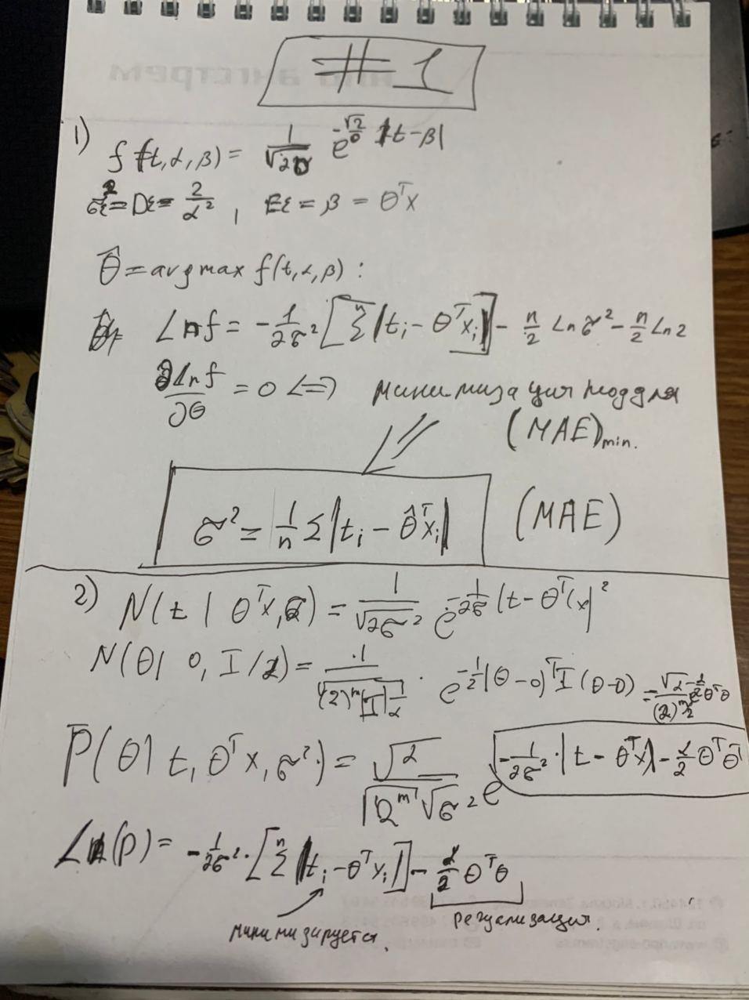

In [4]:
from IPython.display import Image
Image("1_part_hw_2.jpg")

## (2)
В этом ДЗ предлагается реализовать модель трехслойного перцептрона и обучение этой модели методом градиентного спуска.

На этот раз предлагается работать с реальными данными. Данные представляют из себя набор рукописных цифр. Это изображения размером 28х28. Каждому изображению поставлен в соответствие класс - арабская цифра. Задача модели - определить цифру, соответствующую произвольному изображению из тестового набора данных.

Так же, как и в ДЗ №1, предлагается реализовать функцию потерь и саму модель перцептрона в манере, схожей с построением модулей фреймворка pytorch.

В решении ожидается наличие следующих ключевых составляющих:<br />

- (текст) формулировка задачи
- (текст) формулировка признакового описания объектов
- (текст) формулировка функции ошибки
- (текст) формулировка меры качества модели
- (текст, код и диаграммы) исследование исходных данных: распределение признаков и другие действия, дающие понимание о характере исходных данных
- (текст, код, диаграммы) фильтрация признаков (при необходимости), порождение признаков (при необходимости)
- (код, результаты, коммментарии) обучение модели методом градиентного спуска
- (код, результаты, комментарии) оценка качества модели на валидационной выборке

#### Код решения:
(можно использовать предлагаемые шаблоны)
- формулировка модели трехслойного перцептрона (имеется в виду только один скрытый слой);
- формулировка функции ошибки;
- формулировка метрики (метрик);
- формулировка цикла оптимизации параметров.

#### Визуализация в решении:
- распределение признаков;
- распределение целевой переменной;
- отдельные экземпляры выборки в виде изображений;
- эволюция функции ошибки по ходу обучения;
- эволюция метрики(метрик) по ходу обучения

#### Выводы
- вывод о достаточности или избыточности данных для оценки параметров модели
- вывод о соотношении выразительности модели и ее обобщающей способности (наблюдаются ли явления переобучения или недообучения).

Примечание:<br />
Реализация перцептрона и других составляющих исследования может быть написана только с использованием библиотеки Numpy или scipy. Решения с использованием библиотек автоматического вычисления градиентов не засчитываются.

### Исходные данные

Исходные данные можно скачать [по этой ссылке](https://www.dropbox.com/s/y6ar7i7mb6fvoed/mnist.npz). Набор данных MNIST поставляется в различных вариантах. В варианте, доступном по приведенной ссылке, чтение исходных данных может быть выполнено следующим образом:

```
import numpy as np
mnist = np.load('mnist.npz')
x_train = mnist['x_train']
y_train = mnist['y_train']
x_test = mnist['x_test']
y_test = mnist['y_test']
```

### Многослойный перцептрон

Напомним, мы задаем мнолослойный перцептрон как сложную функцию, в которой используются линейные операции и поточечные нелинейные преобразования. Если входные данные (признаковое описание объекта) заданы вектором $x$, то функция перцептрона с одним скрытым слоем выглядит следующим образом:
$$
F(x) = \Psi\left(\phi\left( {x}\cdot\theta_1 + b_1 \right)\cdot\theta_2 + b_2\right),
$$
где $x$ имеется в виду без дополнительного единичного признака; $\phi$ - функция активации скрытого слоя; $\Psi$ - функция активации выходного слоя перцептрона.

Напомним также, что в задаче жесткой многоклассовой классификации на $K$ классов допустим вариант формулировки модели, такой что:
- количество признаков целевой переменной совпадает с количеством классов $K$;
- в качестве функции активации $\Psi$ может использоваться `softmax`:
$$
\Psi(h_i) = \frac{e^{h_i}}{\sum_{j=1}^{K}{e^{h_j}}}
$$
- в качестве функции потерь может использоваться перектрестная энтропия в многоклассовом варианте (приведено в записи для одного объекта):
$$
{\mathscr{L}}\left(\hat{y},y\right) = \sum_{j=1}^{K}{y_j*ln\left(\hat{y}_j\right)},
$$
где $\hat{y}=F(x)$

В своем решении вы никак не ограничены в выборе функций активации $\phi$ или $\Psi$. Однако есть некоторые устоявшиеся практики применения функций `ReLU, sigmoid, tanh`.

### Особенности реализации функции `softmax`
Несложно заметить, что как в числителе, так и в знаменателе функции `softmax` стоит экспонента некоторого числа. При этом следует понимать, что разрядность чисел с плавающей точкой `float32`, `float64` и даже `float128` не бесконечны. Свойства экспоненты таковы, что, например, для переполнения разрядности чисел `float64` (максимум  $\sim1.78*10^{308}$) достаточно показателя, превышающего 710, что совсем немного. Поэтому в случае практической реализации функции `softmax` имеет смысл предусмотреть случаи, когда аргументы экспоненты велики или, наоборот, слишком малы.

В этом ДЗ кроме прочих заданий вам нужно реализовать вычислительно стабильную версию `softmax`.

### Особенности вычисления градиента функции потерь

В этом домашнем задании, также как и в ДЗ№1 предлагается реализовывать функцию потерь и отдельные вычислительные блоки перцептрона наследующими `Differentiable` для общности восприятия этих модулей как дифференцируемых по своим аргументам. По желанию можно вычислить градиент функции потерь по параметрам модели вручную (и далее реализовать его в коде), однако предпочитаемым способом будет реализация градиента каждого из вычислительных блоков по аргументу в методе `backward()` и использование этого результата в обобщенном виде, без упрощения. Этот вариант вычисления градиента функции потерь по параметрам модели называется "backpropagation" ("метод обратного распространения ошибки" или "метод обратной волны" у разных авторов).

Нелишним будет напомнить, что в некоторых случаях для вычисления компоненты градиента необходимо хранить значения, полученные на этапе вычисления функции $F(x)$. В вашем решении это может быть устроено по-разному. Но для тех, кто хочет придерживаться предложенного шаблона, введен атрибут `state` класса `Differentiable`.

In [34]:
import numpy as np
import pandas as pd
from tqdm import tqdm
import scipy as sp
from scipy.special import softmax as sfm
from sklearn.metrics import accuracy_score
from IPython.display import Image


In [35]:
%matplotlib inline

In [36]:
import matplotlib.pyplot as plt

In [37]:
mnist = np.load('./mnist.npz')
x_train = mnist['x_train']
y_train = mnist['y_train']
# Обратите внимание на то, что целевая переменная в виде целых чисел от 0 до 9, в то время как в формулах,
# приведенных выше, подразумевается one-hot кодирование целевой переменной
x_test = mnist['x_test']
y_test = mnist['y_test']

# Формулировка задачи

Был реализован трехслойный перцептрон.
Первый слой - слой 28*28=784 признаков.

Скрытый слой - 512 нейронов.

Выходной слой - 10 нейронов по 10 на каждый класс.

На картинке ниже наглядная схема модели, но масштаб нейронов в слоях (в том числе в выходном слое) не соблюден.

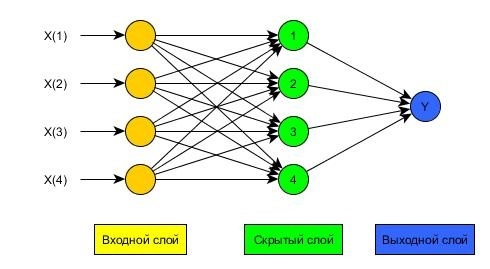

In [38]:
Image("3_layers_perceptron.jpg")

# Формулировка признакового описания объектов

Для каждого объекта (картинки) имеется матрица 28 х 28, которая вытягивается в линию размера 28*28 = 784. 
То есть каждый объект имеет 784 признака. 

In [39]:
L = x_test.shape[0]
x_test = x_test.reshape(L,-1)  #вытягиваем картинки в линии

L = x_train.shape[0]
x_train = x_train.reshape(L,-1)  #вытягиваем картинки в линии

# Формулировка функции ошибки

В качество ошибки взята кросс-энтропия. (Формула есть выше в шапке задания)

# Формулировка меры качества модели

 В качестве меры качества взята метрика accuracy (точность).
 
 Метрика показывает число верно определенных классов (10 класс по классу на каждую цифру)

# Исследование исходных данных: распределение признаков и другие действия, дающие понимание о характере исходных данных

Размер тренировочного датасета: (60000, 28, 28)
Размер тестового датасета: 10000


Максимальное значение 255
Среднее 33.318421449829934
Медиана 0.0
Минимальное значение 0


array([[<AxesSubplot:title={'center':'0'}>]], dtype=object)

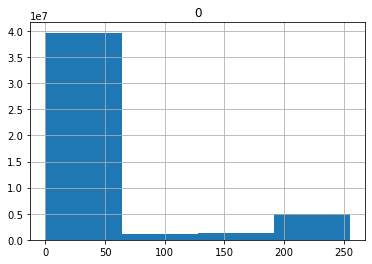

In [40]:
x_train = mnist['x_train']
print('Размер тренировочного датасета:',x_train.shape)
print("Размер тестового датасета:",x_test.shape[0])
print('\n')
print('Максимальное значение', np.max(x_train))
print('Среднее', np.mean(x_train))
print('Медиана', np.median(x_train))
print('Минимальное значение', np.min(x_train))

pd.DataFrame(x_train.reshape(60000*28*28,-1)).hist(bins=4)

Фильтрация признаков и порождение признаков не было, но в качестве дальнейшего улучшения, можно сгенерить доп.датасет на основе врещения, отражения некоторых цифр. Например из класса "9", можно легко получить новый обучающий датасет класса "6" и наооборот.

Все признаки нормируются на максимальное значение матрицы. В нашем случае max = 255.

# Обучение модели методом градиентного спуска
(код, результаты, коммментарии)  

In [41]:
class Differentiable:
    def __init__(self):
        self.state = None
        pass
    def forward(self, *kwargs):
        raise NotImplementedError()
    def backward(self, *kwargs):
        raise NotImplementedError()

In [42]:
class Linear(Differentiable):
    def __init__(self):
        super(Linear, self).__init__()
        self.theta = None
    
    def __call__(self, X):
        # этот метод предназначен для вычисления значения целевой переменной
        return self.forward(X)
    
    def backward(self, *kwargs):
        # Этот метод реализует вычисление компоненты градиента функции потерь
        
        partial_grad = 0.0
        ### YOUR CODE HERE
        # partial_grad = ...
        
        return partial_grad
    
    def forward(self, X):
        # этот метод предназначен для применения модели к данным
        assert X.ndim == 2, "X should be 2-dimensional: (N of objects, n of features)"
        
        if (self.theta is None):
            # Если вектор параметров еще не инициализирован, его следует инициализировать
            # Подсказка: длина вектора параметров может быть получена из размера матрицы X
            self.theta = np.zeros(X.shape[1])
            
            ### YOUR CODE HERE
            # self.theta = ...
        
        
        # Здесь следует собственно применить модель к входным данным
        # Подсказка: удобно расширить матрицу X дополнительным признаком,
        #            чтобы применять матричные операции, очень эффективно реализованные в numpy
        
        
        N = X.shape[0]
        X = X.reshape(N,-1)
        
        ### YOUR CODE HERE
        # y_pred = ...
        
        return X

In [43]:
class Activation(Differentiable):
    def __init__(self):
        super(Activation, self).__init__()
        self.theta = None
    
    def __call__(self, *kwargs):
        # этот метод предназначен для вычисления значения целевой переменной
        return self.forward(X)
    
    def backward(self, *args):
        # Этот метод реализует вычисление компоненты градиента функции потерь
 
        def sigmoid(x):
            return 1/(1+np.exp(-x)) 

        def sigmoid_der(x):
            return sigmoid(x) *(1-sigmoid(x))

        X = args[0]
        partial_grad = sigmoid_der(X)
        return partial_grad
    
    def forward(self, *args):
        # Здесь следует собственно применить модель к входным данным
        # Подсказка: удобно расширить матрицу X дополнительным признаком,
        #            чтобы применять матричные операции, очень эффективно реализованные в numpy
        
        ### YOUR CODE HERE
        # y_pred = ...
        X = args[0]
         
        def sigmoid(x):
            return 1/(1+np.exp(-x))        
        
        y_pred = sigmoid(X)
        
        return y_pred
    
    
 

In [44]:
class Softmax(Differentiable):
    def __init__(self):
        super(Softmax, self).__init__()
        self.theta = None
    
    def __call__(self, **kwargs):
        # этот метод предназначен для вычисления значения целевой переменной
        return self.forward(X)
    
    def backward(self, *kwargs):
        # Этот метод реализует вычисление компоненты градиента функции потерь
        partial_grad = 0.0
        ### YOUR CODE HERE 
        return partial_grad
    
    def forward(self, *args):
        
        y_pred = args[0]
        
        def stable_softmax(x):
            z = x - max(x)
            numerator = np.exp(z)
            denominator = np.sum(numerator)
            softmax = numerator/denominator
            return softmax       
       
        # Здесь следует собственно применить модель к входным данным
        # Подсказка: удобно расширить матрицу X дополнительным признаком,
        #            чтобы применять матричные операции, очень эффективно реализованные в numpy
    
        ### YOUR CODE HERE
        y_pred =  stable_softmax(y_pred)
 
        return y_pred

In [45]:
class Loss(Differentiable):
    def __init__(self):
        super(Loss, self).__init__()
    
    def forward(self, *args):
        # Этот метод реализует вычисление значения функции потерь
        # Подсказка: метод должен возвращать единственный скаляр - значение функции потерь

        
        ### YOUR CODE HERE
        # loss_value = ...
        y, y_pred = args
        y_pred = -np.log(y_pred)
        loss_value = np.sum(y_pred*y)  
        return loss_value
    
    
    def backward(self, *args):
        # Этот метод реализует вычисление градиента функции потерь по аргументу y_pred
        # Подсказка: метод должен возвращать вектор градиента функции потерь
        #           размерностью, совпадающей с размерностью аргумента y_pred
        
        #partial_grad = np.zeros_like(y_pred)
        ### YOUR CODE HERE
        # partial_grad = ...
        return partial_grad

In [46]:
class Perceptron(Differentiable):
    def __init__(self):
        super(Perceptron, self).__init__()
        self.modules = None
        self.W_0 = None
        self.b_0 = None
        self.W_1 = None
        self.b_1 = None
        self.W_2 = None
        self.b_2 = None
    
    def __call__(self, **kwargs):
        # этот метод предназначен для вычисления значения целевой переменной
        return self.forward(X)
    
    def backward(self, *args):
        # Этот метод реализует вычисление компоненты градиента функции потерь
 
        
        x, y = args
        ### YOUR CODE HERE
        # partial_grad = ...
        
        delta_2 = self.softmax_y_pred - y
        grad_2 = delta_2.dot(self.layer_2_in.T)
  
        delta_1 = self.W_2.dot(delta_2) * sigmoid.backward(self.layer_1)
        grad_1 = delta_1 * self.layer_1_in.T    
 

        lr = 0.01
        self.W_2 -=  lr*grad_2.T 
        self.b_2 -= lr*delta_2 

        self.W_1 -= lr*grad_1.T 
        self.b_1 -= lr*delta_1 
 
    
    def forward(self, *args):
        # Здесь следует собственно применить модель к входным данным
        # Подсказка: удобно расширить матрицу X дополнительным признаком,
        #            чтобы применять матричные операции, очень эффективно реализованные в numpy
        
 
        X = args[0]     
        
        if (self.W_1 is None):
            self.W_1 = np.random.randn(X.shape[0], 512) 
            self.b_1 = np.random.randn(512, 1) 
        
        if (self.W_2 is None):
            self.W_2 = np.random.randn(512, 10) 
            self.b_2 = np.random.randn(10, 1) 
            
        y_pred = 0.0
        ### YOUR CODE HERE
     
        self.layer_1_in = X.reshape(784,-1) 
        self.layer_1 = self.W_1.T@self.layer_1_in + self.b_1 
        self.sig_layer_1_out = sigmoid.forward(self.layer_1)
    
        self.layer_2_in = self.sig_layer_1_out
        self.layer_2 = self.W_2.T@self.layer_2_in + self.b_2 
        self.softmax_y_pred = softmax.forward(self.layer_2)
        
         

In [54]:
def check_accuracy(x_test,y_test):
    y_pred_max = []
    for i in range(10000):
        batch = x_test[i,]
        lr_model.forward(batch)  
        y_pred_max.append(lr_model.softmax_y_pred.argmax()) 
    return accuracy_score(y_test, y_pred_max, normalize=False)
def normalize_by_max(M):
    row_sums = M.max()
    return M / row_sums  

# Формулировка цикла оптимизации параметров и градиентый спуск.

Оптимизация происходила одним обходом по каждому признаку тренировочного датасета (60 000 циклов)

In [60]:
def train_loop(X, Y, model, epochs=9000):
    loss_history = []
    accuracy_history = []
    pbar = tqdm(total=epochs)

    
    L = X.shape[0]
    X = X.reshape(L,-1)  #вытягиваем картинки в линии
    X = normalize_by_max(X)
    sigmoid = Activation()
    for epoch in range(epochs):
        for i in range(60000):
            #i = np.random.randint(0, 60000)
            
            batch = X[i,].reshape(784,-1)
            y = Y[i]
            mask = [0]*10
            mask[y]=1
            y = np.array(mask).reshape(10,-1)

            # В этом цикле следует реализовать итеративную процедуру оптимизации параметров модели model,
            #        руководствуясь функцией потерь loss_fn
            
            ### YOUR CODE HERE
            model.forward(batch)  #Предсказание 
            
            loss_value = loss.forward(y, model.softmax_y_pred)
            
            if i%1000 == 0:
                accuracy_value = check_accuracy(x_test, y_test)
                accuracy_history.append(accuracy_value)
                #loss_history.append(loss_value)               
                pbar.set_postfix({'accuracy': accuracy_value}) 
            
            pbar.update(1)
            pbar.set_postfix({'loss': loss_value})
            
            loss_history.append(loss_value)         
             
            model.backward(batch, y) # шаг обучения

    pbar.close()
    return loss_history, accuracy_history

In [61]:
sigmoid = Activation()
softmax = Softmax()
loss = Loss()
lr_model = Perceptron()
loss_history, accuracy_history = train_loop(x_train, y_train, lr_model, epochs=1) 




  0%|                                                                                            | 0/2 [00:00<?, ?it/s]D:\Users\sasha\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: overflow encountered in exp



  0%|                                                                              | 0/2 [00:01<?, ?it/s, accuracy=820]


 50%|███████████████████████████████████                                   | 1/2 [00:01<00:01,  1.86s/it, accuracy=820]


 50%|████████████████████████████████████▌                                    | 1/2 [00:01<00:01,  1.86s/it, loss=7.69]D:\Users\sasha\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: RuntimeWarning: overflow encountered in exp
  



100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:01<00:00,  1.86s/it, loss=0.116]


3it [00:01,  1.86s/it, loss=53]                                                                                        


4it [00:01,  1.86s/it, loss=30.1]




305it [00:04, 121.39it/s, loss=3.34]   


306it [00:04, 121.39it/s, loss=3.67e-7]


307it [00:04, 121.39it/s, loss=7.48]   


308it [00:04, 121.39it/s, loss=0.000121]


309it [00:04, 121.39it/s, loss=34.1]    


310it [00:04, 121.39it/s, loss=1.2] 


311it [00:04, 121.39it/s, loss=0.000111]


312it [00:04, 121.39it/s, loss=5.51]    


313it [00:04, 121.39it/s, loss=9.22]


314it [00:04, 127.21it/s, loss=9.22]


314it [00:04, 127.21it/s, loss=8.61]


315it [00:04, 127.21it/s, loss=12.7]


316it [00:04, 127.21it/s, loss=3.59]


317it [00:04, 127.21it/s, loss=11.7]


318it [00:04, 127.21it/s, loss=11.2]


319it [00:04, 127.21it/s, loss=9.88]


320it [00:04, 127.21it/s, loss=3.57e-8]


321it [00:04, 127.21it/s, loss=0.5]    


322it [00:04, 127.21it/s, loss=9.19e-7]


323it [00:04, 127.21it/s, loss=2.57]   


324it [00:04, 127.21it/s, loss=0.000138]


325it [00:04, 127.21it/s, loss=13.6]    


326it [00:04, 127.21it/s, loss=17.5]


327it [00:04, 127.21it/s, loss=6.21e-5]


328it [00:04, 12

614it [00:06, 141.13it/s, loss=10.6]


614it [00:06, 141.13it/s, loss=0.0367]


615it [00:06, 141.13it/s, loss=19.8]  


616it [00:06, 141.13it/s, loss=9.79]


617it [00:06, 141.13it/s, loss=5.15]


618it [00:06, 141.13it/s, loss=0.000246]


619it [00:06, 141.13it/s, loss=0.275]   


620it [00:06, 141.13it/s, loss=0.000183]


621it [00:06, 141.13it/s, loss=13.2]    


622it [00:06, 141.13it/s, loss=0.838]


623it [00:06, 141.13it/s, loss=4.46] 


624it [00:06, 141.13it/s, loss=8.8] 


625it [00:06, 141.13it/s, loss=3.85e-5]


626it [00:06, 141.13it/s, loss=18.7]   


627it [00:06, 141.13it/s, loss=17.5]


628it [00:06, 141.13it/s, loss=6.65]


629it [00:06, 140.96it/s, loss=6.65]


629it [00:06, 140.96it/s, loss=15.6]


630it [00:06, 140.96it/s, loss=11.4]


631it [00:06, 140.96it/s, loss=0.223]


632it [00:06, 140.96it/s, loss=9.96] 


633it [00:06, 140.96it/s, loss=3.3] 


634it [00:06, 140.96it/s, loss=0.145]


635it [00:06, 140.96it/s, loss=3.28] 


636it [00:06, 140.96it/s, loss=1

920it [00:08, 142.17it/s, loss=3.45e-7]


921it [00:08, 142.17it/s, loss=0.00226]


922it [00:08, 142.17it/s, loss=4.98]   


923it [00:08, 142.17it/s, loss=0.00743]


924it [00:08, 142.17it/s, loss=3.78e-5]


925it [00:08, 142.17it/s, loss=0.00199]


926it [00:08, 142.17it/s, loss=2.87]   


927it [00:08, 142.17it/s, loss=0.0714]


928it [00:08, 140.89it/s, loss=0.0714]


928it [00:08, 140.89it/s, loss=0.00855]


929it [00:08, 140.89it/s, loss=2.38e-10]


930it [00:08, 140.89it/s, loss=3.06]    


931it [00:08, 140.89it/s, loss=1.42]


932it [00:08, 140.89it/s, loss=11.9]


933it [00:08, 140.89it/s, loss=0.0561]


934it [00:08, 140.89it/s, loss=7.05e-5]


935it [00:08, 140.89it/s, loss=1.22e-6]


936it [00:08, 140.89it/s, loss=0.0129] 


937it [00:08, 140.89it/s, loss=2.59e-5]


938it [00:08, 140.89it/s, loss=0.13]   


939it [00:08, 140.89it/s, loss=3.28]


940it [00:08, 140.89it/s, loss=20.4]


941it [00:08, 140.89it/s, loss=0.0621]


942it [00:08, 140.89it/s, loss=0.0416]


943it [

1220it [00:12, 138.14it/s, loss=8.01]   


1221it [00:12, 138.14it/s, loss=3.57]


1222it [00:12, 138.14it/s, loss=17.7]


1223it [00:12, 138.14it/s, loss=17.6]


1224it [00:12, 138.14it/s, loss=3.62]


1225it [00:12, 138.14it/s, loss=3.61]


1226it [00:12, 138.14it/s, loss=1.24]


1227it [00:12, 138.14it/s, loss=0.217]


1228it [00:12, 138.14it/s, loss=4.25] 


1229it [00:12, 138.14it/s, loss=0.411]


1230it [00:12, 138.14it/s, loss=0.00828]


1231it [00:12, 138.14it/s, loss=7.84e-6]


1232it [00:12, 138.14it/s, loss=0.000401]


1233it [00:12, 138.14it/s, loss=1.4]     


1234it [00:12, 138.14it/s, loss=1.4]


1235it [00:12, 137.71it/s, loss=1.4]


1235it [00:12, 137.71it/s, loss=4.76]


1236it [00:12, 137.71it/s, loss=0.00231]


1237it [00:12, 137.71it/s, loss=0.431]  


1238it [00:12, 137.71it/s, loss=1.07e-6]


1239it [00:12, 137.71it/s, loss=0.0338] 


1240it [00:12, 137.71it/s, loss=14.9]  


1241it [00:12, 137.71it/s, loss=0.000312]


1242it [00:12, 137.71it/s, loss=0.0418]  




1370it [00:13, 131.68it/s, loss=1.81e-6]


1371it [00:13, 131.68it/s, loss=10.4]   


1372it [00:13, 131.68it/s, loss=0.000331]


1373it [00:13, 131.68it/s, loss=5.13e-7] 


1374it [00:13, 131.68it/s, loss=4.8]    


1375it [00:13, 131.16it/s, loss=4.8]


1375it [00:13, 131.16it/s, loss=13.6]


1376it [00:13, 131.16it/s, loss=0.927]


1377it [00:13, 131.16it/s, loss=21.1] 


1378it [00:13, 131.16it/s, loss=4.24]


1379it [00:13, 131.16it/s, loss=5.26]


1380it [00:13, 131.16it/s, loss=0.000232]


1381it [00:13, 131.16it/s, loss=0.000104]


1382it [00:13, 131.16it/s, loss=2.54e-6] 


1383it [00:13, 131.16it/s, loss=0.21]   


1384it [00:13, 131.16it/s, loss=2.13e-5]


1385it [00:13, 131.16it/s, loss=11.7]   


1386it [00:13, 131.16it/s, loss=7.02e-9]


1387it [00:13, 131.16it/s, loss=7.6e-7] 


1388it [00:13, 131.16it/s, loss=0.0595]


1389it [00:13, 133.03it/s, loss=0.0595]


1389it [00:13, 133.03it/s, loss=0.000562]


1390it [00:13, 133.03it/s, loss=1.86]    


1391it [00:13, 133.03it

1666it [00:15, 131.81it/s, loss=2.91e-5] 


1667it [00:15, 131.81it/s, loss=1.55e-6]


1668it [00:15, 131.81it/s, loss=0.00545]


1669it [00:15, 133.12it/s, loss=0.00545]


1669it [00:15, 133.12it/s, loss=9.16e-9]


1670it [00:15, 133.12it/s, loss=0.000358]


1671it [00:15, 133.12it/s, loss=0.00572] 


1672it [00:15, 133.12it/s, loss=1.18e-5]


1673it [00:15, 133.12it/s, loss=8.5]    


1674it [00:15, 133.12it/s, loss=1.04e-10]


1675it [00:15, 133.12it/s, loss=7.97]    


1676it [00:15, 133.12it/s, loss=2.6] 


1677it [00:15, 133.12it/s, loss=18.2]


1678it [00:15, 133.12it/s, loss=2.78]


1679it [00:15, 133.12it/s, loss=0.000144]


1680it [00:15, 133.12it/s, loss=8.36e-6] 


1681it [00:15, 133.12it/s, loss=0.0939] 


1682it [00:15, 133.12it/s, loss=0.0902]


1683it [00:15, 133.67it/s, loss=0.0902]


1683it [00:15, 133.67it/s, loss=10.3]  


1684it [00:15, 133.67it/s, loss=0.16]


1685it [00:15, 133.67it/s, loss=0.817]


1686it [00:15, 133.67it/s, loss=0.268]


1687it [00:15, 133.67it

1961it [00:17, 134.02it/s, loss=1.53]  


1962it [00:17, 134.02it/s, loss=0.0139]


1963it [00:17, 134.02it/s, loss=0.0178]


1964it [00:17, 134.02it/s, loss=4.03]  


1965it [00:17, 134.02it/s, loss=0.186]


1966it [00:17, 134.02it/s, loss=1.07e-6]


1967it [00:17, 135.47it/s, loss=1.07e-6]


1967it [00:17, 135.47it/s, loss=2.1e-5] 


1968it [00:17, 135.47it/s, loss=0.0457]


1969it [00:17, 135.47it/s, loss=0.126] 


1970it [00:17, 135.47it/s, loss=4.1e-8]


1971it [00:17, 135.47it/s, loss=4.15e-7]


1972it [00:17, 135.47it/s, loss=0.0296] 


1973it [00:17, 135.47it/s, loss=2.01e-6]


1974it [00:17, 135.47it/s, loss=6.95]   


1975it [00:17, 135.47it/s, loss=15.7]


1976it [00:17, 135.47it/s, loss=0.0276]


1977it [00:17, 135.47it/s, loss=0.000759]


1978it [00:17, 135.47it/s, loss=0.0214]  


1979it [00:17, 135.47it/s, loss=1.22]  


1980it [00:17, 135.47it/s, loss=0.413]


1981it [00:17, 136.51it/s, loss=0.413]


1981it [00:17, 136.51it/s, loss=0.00133]


1982it [00:17, 136.51it/s, 

2258it [00:21, 137.19it/s, loss=4.64e-5]


2259it [00:21, 137.19it/s, loss=0.186]  


2260it [00:21, 137.19it/s, loss=0.169]


2261it [00:21, 137.19it/s, loss=0.000296]


2262it [00:21, 136.12it/s, loss=0.000296]


2262it [00:21, 136.12it/s, loss=0.0062]  


2263it [00:21, 136.12it/s, loss=1.92]  


2264it [00:21, 136.12it/s, loss=0.00108]


2265it [00:21, 136.12it/s, loss=0.00243]


2266it [00:21, 136.12it/s, loss=2.25e-12]


2267it [00:21, 136.12it/s, loss=5.53]    


2268it [00:21, 136.12it/s, loss=3.58]


2269it [00:21, 136.12it/s, loss=1.65]


2270it [00:21, 136.12it/s, loss=7.71e-5]


2271it [00:21, 136.12it/s, loss=0.00364]


2272it [00:21, 136.12it/s, loss=0.00135]


2273it [00:21, 136.12it/s, loss=0.00226]


2274it [00:21, 136.12it/s, loss=2.66e-5]


2275it [00:21, 136.12it/s, loss=9.03e-7]


2276it [00:21, 136.12it/s, loss=0.0694] 


2277it [00:21, 137.80it/s, loss=0.0694]


2277it [00:21, 137.80it/s, loss=9.48]  


2278it [00:21, 137.80it/s, loss=9.96]


2279it [00:21, 137.8

2554it [00:23, 141.33it/s, loss=5.09e-5]


2555it [00:23, 141.33it/s, loss=0.222]  


2556it [00:23, 141.33it/s, loss=11.1] 


2557it [00:23, 138.37it/s, loss=11.1]


2557it [00:23, 138.37it/s, loss=1.31e-7]


2558it [00:23, 138.37it/s, loss=3.03]   


2559it [00:23, 138.37it/s, loss=0.000571]


2560it [00:23, 138.37it/s, loss=5.7]     


2561it [00:23, 138.37it/s, loss=3.8]


2562it [00:23, 138.37it/s, loss=5.36e-8]


2563it [00:23, 138.37it/s, loss=0.0177] 


2564it [00:23, 138.37it/s, loss=0.115] 


2565it [00:23, 138.37it/s, loss=3.24e-9]


2566it [00:23, 138.37it/s, loss=1.4e-7] 


2567it [00:23, 138.37it/s, loss=0.138] 


2568it [00:23, 138.37it/s, loss=0.000103]


2569it [00:23, 138.37it/s, loss=0.000283]


2570it [00:23, 138.37it/s, loss=7.91e-9] 


2571it [00:23, 138.55it/s, loss=7.91e-9]


2571it [00:23, 138.55it/s, loss=8.93]   


2572it [00:23, 138.55it/s, loss=2.32]


2573it [00:23, 138.55it/s, loss=1.95e-7]


2574it [00:23, 138.55it/s, loss=4.8e-14]


2575it [00:23, 138.5

2850it [00:25, 145.14it/s, loss=1.75e-8]


2851it [00:25, 145.14it/s, loss=0.00247]


2852it [00:25, 145.14it/s, loss=6.19e-10]


2853it [00:25, 145.14it/s, loss=1.02]    


2854it [00:25, 145.40it/s, loss=1.02]


2854it [00:25, 145.40it/s, loss=1.06]


2855it [00:25, 145.40it/s, loss=5.53e-5]


2856it [00:25, 145.40it/s, loss=2.04]   


2857it [00:25, 145.40it/s, loss=1.04]


2858it [00:25, 145.40it/s, loss=0.000173]


2859it [00:25, 145.40it/s, loss=5.59e-5] 


2860it [00:25, 145.40it/s, loss=0.462]  


2861it [00:25, 145.40it/s, loss=16.6] 


2862it [00:25, 145.40it/s, loss=2.74]


2863it [00:25, 145.40it/s, loss=4.72]


2864it [00:25, 145.40it/s, loss=0.0462]


2865it [00:25, 145.40it/s, loss=1.56e-7]


2866it [00:25, 145.40it/s, loss=5.09e-9]


2867it [00:25, 145.40it/s, loss=1.24e-9]


2868it [00:25, 145.40it/s, loss=3.44e-9]


2869it [00:25, 144.73it/s, loss=3.44e-9]


2869it [00:25, 144.73it/s, loss=3.09e-12]


2870it [00:25, 144.73it/s, loss=0.0119]  


2871it [00:25, 144.73it

3146it [00:29, 112.49it/s, loss=0.00525]


3147it [00:29, 112.49it/s, loss=4.86]   


3148it [00:29, 112.49it/s, loss=0.0036]


3149it [00:29, 112.49it/s, loss=8.63]  


3150it [00:29, 112.49it/s, loss=0.000101]


3151it [00:29, 112.49it/s, loss=5.81]    


3152it [00:29, 112.49it/s, loss=7.75e-9]


3153it [00:29, 112.49it/s, loss=0.00868]


3154it [00:29, 112.49it/s, loss=0.101]  


3155it [00:29, 112.49it/s, loss=13.1] 


3156it [00:29, 119.95it/s, loss=13.1]


3156it [00:29, 119.95it/s, loss=5.52e-7]


3157it [00:29, 119.95it/s, loss=4.35]   


3158it [00:29, 119.95it/s, loss=0.000528]


3159it [00:29, 119.95it/s, loss=0.428]   


3160it [00:29, 119.95it/s, loss=0.0598]


3161it [00:29, 119.95it/s, loss=1.02e-12]


3162it [00:29, 119.95it/s, loss=9.47e-9] 


3163it [00:29, 119.95it/s, loss=0.00967]


3164it [00:29, 119.95it/s, loss=3.07]   


3165it [00:29, 119.95it/s, loss=2.4] 


3166it [00:29, 119.95it/s, loss=0.0308]


3167it [00:29, 119.95it/s, loss=0.00114]


3168it [00:29, 11

3442it [00:31, 148.42it/s, loss=1.94] 


3443it [00:31, 148.42it/s, loss=0.059]


3444it [00:31, 148.42it/s, loss=1.11e-9]


3445it [00:31, 148.42it/s, loss=3.26e-5]


3446it [00:31, 148.42it/s, loss=4.28]   


3447it [00:31, 148.42it/s, loss=0.873]


3448it [00:31, 148.42it/s, loss=3.74e-7]


3449it [00:31, 148.87it/s, loss=3.74e-7]


3449it [00:31, 148.87it/s, loss=1.11e-10]


3450it [00:31, 148.87it/s, loss=4.29e-5] 


3451it [00:31, 148.87it/s, loss=0.00128]


3452it [00:31, 148.87it/s, loss=7.54e-7]


3453it [00:31, 148.87it/s, loss=1.98]   


3454it [00:31, 148.87it/s, loss=0.00863]


3455it [00:31, 148.87it/s, loss=7.34]   


3456it [00:31, 148.87it/s, loss=6.61e-6]


3457it [00:31, 148.87it/s, loss=0.0421] 


3458it [00:31, 148.87it/s, loss=0.533] 


3459it [00:31, 148.87it/s, loss=0.00376]


3460it [00:31, 148.87it/s, loss=0.00566]


3461it [00:31, 148.87it/s, loss=6.64e-7]


3462it [00:31, 148.87it/s, loss=4.66]   


3463it [00:31, 148.87it/s, loss=0.00123]


3464it [00:31, 1

3737it [00:33, 148.27it/s, loss=4.75e-6]


3738it [00:33, 148.27it/s, loss=7.5]    


3739it [00:33, 148.27it/s, loss=3.5]


3740it [00:33, 148.27it/s, loss=2.69e-6]


3741it [00:33, 148.27it/s, loss=2.72]   


3742it [00:33, 148.27it/s, loss=4.42e-13]


3743it [00:33, 148.27it/s, loss=26.6]    


3744it [00:33, 148.27it/s, loss=6.57e-7]


3745it [00:33, 148.27it/s, loss=0.00429]


3746it [00:33, 148.27it/s, loss=0.095]  


3747it [00:33, 148.27it/s, loss=4.49] 


3748it [00:33, 148.27it/s, loss=9.72e-7]


3749it [00:33, 148.27it/s, loss=18.6]   


3750it [00:33, 148.27it/s, loss=1.61]


3751it [00:33, 148.27it/s, loss=1.01e-7]


3752it [00:33, 149.18it/s, loss=1.01e-7]


3752it [00:33, 149.18it/s, loss=0.0147] 


3753it [00:33, 149.18it/s, loss=0.00593]


3754it [00:33, 149.18it/s, loss=5e-5]   


3755it [00:33, 149.18it/s, loss=5.17]


3756it [00:33, 149.18it/s, loss=0.0554]


3757it [00:33, 149.18it/s, loss=0.844] 


3758it [00:33, 149.18it/s, loss=3.91] 


3759it [00:33, 149.18it/s

3886it [00:34, 146.11it/s, loss=0.00038]


3887it [00:34, 146.11it/s, loss=0.000203]


3888it [00:34, 146.11it/s, loss=1.04e-7] 


3889it [00:34, 147.24it/s, loss=1.04e-7]


3889it [00:34, 147.24it/s, loss=0.0337] 


3890it [00:34, 147.24it/s, loss=0.0145]


3891it [00:34, 147.24it/s, loss=1.98e-5]


3892it [00:34, 147.24it/s, loss=0.00749]


3893it [00:34, 147.24it/s, loss=4.42e-8]


3894it [00:34, 147.24it/s, loss=2.43e-5]


3895it [00:34, 147.24it/s, loss=1.29e-9]


3896it [00:34, 147.24it/s, loss=4.38e-5]


3897it [00:34, 147.24it/s, loss=1.31e-12]


3898it [00:34, 147.24it/s, loss=1.58]    


3899it [00:34, 147.24it/s, loss=0.000212]


3900it [00:34, 147.24it/s, loss=1.93e-10]


3901it [00:34, 147.24it/s, loss=1.04e-8] 


3902it [00:34, 147.24it/s, loss=2.81e-5]


3903it [00:34, 147.24it/s, loss=9.68e-8]


3904it [00:34, 147.74it/s, loss=9.68e-8]


3904it [00:34, 147.74it/s, loss=0.000349]


3905it [00:34, 147.74it/s, loss=8.47]    


3906it [00:34, 147.74it/s, loss=2.97e-5]


390

4182it [00:38, 135.66it/s, loss=8.65e-8]


4182it [00:38, 135.66it/s, loss=8.14e-6]


4183it [00:38, 135.66it/s, loss=1.28]   


4184it [00:38, 135.66it/s, loss=0.022]


4185it [00:38, 135.66it/s, loss=7.81] 


4186it [00:38, 135.66it/s, loss=15.4]


4187it [00:38, 135.66it/s, loss=3.25e-8]


4188it [00:38, 135.66it/s, loss=9.65e-13]


4189it [00:38, 135.66it/s, loss=8.57e-6] 


4190it [00:38, 135.66it/s, loss=0.00372]


4191it [00:38, 135.66it/s, loss=0.179]  


4192it [00:38, 135.66it/s, loss=0.00027]


4193it [00:38, 135.66it/s, loss=0.0955] 


4194it [00:38, 135.66it/s, loss=0.387] 


4195it [00:38, 135.66it/s, loss=1.87e-10]


4196it [00:38, 135.66it/s, loss=0.00334] 


4197it [00:38, 135.66it/s, loss=2.81e-10]


4198it [00:38, 139.65it/s, loss=2.81e-10]


4198it [00:38, 139.65it/s, loss=4.89e-6] 


4199it [00:38, 139.65it/s, loss=3.15e-6]


4200it [00:38, 139.65it/s, loss=4.1e-9] 


4201it [00:38, 139.65it/s, loss=0.00821]


4202it [00:38, 139.65it/s, loss=7.61]   


4203it [00:3

4476it [00:40, 137.22it/s, loss=1.79]


4477it [00:40, 137.22it/s, loss=1.76]


4478it [00:40, 137.22it/s, loss=0.000462]


4479it [00:40, 137.22it/s, loss=6.89e-6] 


4480it [00:40, 137.22it/s, loss=5.88e-8]


4481it [00:40, 137.22it/s, loss=0.00243]


4482it [00:40, 137.22it/s, loss=19.6]   


4483it [00:40, 137.22it/s, loss=1.63e-7]


4484it [00:40, 137.22it/s, loss=0.013]  


4485it [00:40, 137.22it/s, loss=4.13e-6]


4486it [00:40, 137.22it/s, loss=1.16]   


4487it [00:40, 137.22it/s, loss=4.33]


4488it [00:40, 137.22it/s, loss=0.000196]


4489it [00:40, 133.43it/s, loss=0.000196]


4489it [00:40, 133.43it/s, loss=4.02]    


4490it [00:40, 133.43it/s, loss=6.26e-8]


4491it [00:40, 133.43it/s, loss=0.233]  


4492it [00:40, 133.43it/s, loss=0.000134]


4493it [00:40, 133.43it/s, loss=7.25e-7] 


4494it [00:40, 133.43it/s, loss=5.06e-6]


4495it [00:40, 133.43it/s, loss=0.00198]


4496it [00:40, 133.43it/s, loss=16.6]   


4497it [00:40, 133.43it/s, loss=1.13e-5]


4498it [00:40

4770it [00:42, 148.04it/s, loss=0.00177]


4771it [00:42, 148.04it/s, loss=2.02e-7]


4772it [00:42, 148.04it/s, loss=1.99]   


4773it [00:42, 148.04it/s, loss=9.34e-13]


4774it [00:42, 148.04it/s, loss=3.61e-7] 


4775it [00:42, 148.04it/s, loss=0.00221]


4776it [00:42, 148.04it/s, loss=1.74e-7]


4777it [00:42, 148.04it/s, loss=0.00597]


4778it [00:42, 148.04it/s, loss=8.74e-13]


4779it [00:42, 148.04it/s, loss=0.245]   


4780it [00:42, 148.04it/s, loss=6.43e-9]


4781it [00:42, 148.04it/s, loss=3.59]   


4782it [00:42, 148.04it/s, loss=3.67e-6]


4783it [00:42, 148.04it/s, loss=0.0169] 


4784it [00:42, 144.04it/s, loss=0.0169]


4784it [00:42, 144.04it/s, loss=0.000446]


4785it [00:42, 144.04it/s, loss=21.3]    


4786it [00:42, 144.04it/s, loss=2.7e-10]


4787it [00:42, 144.04it/s, loss=1.95]   


4788it [00:42, 144.04it/s, loss=0.00946]


4789it [00:42, 144.04it/s, loss=4.21e-7]


4790it [00:42, 144.04it/s, loss=1.31e-7]


4791it [00:42, 144.04it/s, loss=2.22e-10]


4792i

5065it [00:45, 52.98it/s, loss=7.98e-10]


5066it [00:45, 52.98it/s, loss=0.00706] 


5067it [00:45, 65.50it/s, loss=0.00706]


5067it [00:45, 65.50it/s, loss=0.008]  


5068it [00:45, 65.50it/s, loss=6.34e-5]


5069it [00:45, 65.50it/s, loss=18.7]   


5070it [00:45, 65.50it/s, loss=2.29]


5071it [00:45, 65.50it/s, loss=2.4e-5]


5072it [00:45, 65.50it/s, loss=1.12e-8]


5073it [00:45, 65.50it/s, loss=0.00023]


5074it [00:45, 65.50it/s, loss=0.0118] 


5075it [00:45, 65.50it/s, loss=3.59e-7]


5076it [00:46, 65.50it/s, loss=1.93e-10]


5077it [00:46, 65.50it/s, loss=2.45e-8] 


5078it [00:46, 65.50it/s, loss=0.0422] 


5079it [00:46, 65.50it/s, loss=2.07]  


5080it [00:46, 65.50it/s, loss=0.000203]


5081it [00:46, 65.50it/s, loss=0.00216] 


5082it [00:46, 78.61it/s, loss=0.00216]


5082it [00:46, 78.61it/s, loss=0.000719]


5083it [00:46, 78.61it/s, loss=22.1]    


5084it [00:46, 78.61it/s, loss=3.12e-6]


5085it [00:46, 78.61it/s, loss=2.33e-6]


5086it [00:46, 78.61it/s, loss=

5360it [00:47, 134.51it/s, loss=2.68e-8] 


5361it [00:48, 134.51it/s, loss=3.97]   


5362it [00:48, 134.51it/s, loss=1.08e-8]


5363it [00:48, 134.51it/s, loss=1.2]    


5364it [00:48, 134.51it/s, loss=4.8e-10]


5365it [00:48, 134.51it/s, loss=3.71]   


5366it [00:48, 134.51it/s, loss=3.46e-6]


5367it [00:48, 134.51it/s, loss=0.00633]


5368it [00:48, 134.51it/s, loss=8.5e-5] 


5369it [00:48, 134.51it/s, loss=4.72]  


5370it [00:48, 132.36it/s, loss=4.72]


5370it [00:48, 132.36it/s, loss=2.18e-12]


5371it [00:48, 132.36it/s, loss=15.7]    


5372it [00:48, 132.36it/s, loss=3.01e-6]


5373it [00:48, 132.36it/s, loss=0.141]  


5374it [00:48, 132.36it/s, loss=0.000141]


5375it [00:48, 132.36it/s, loss=9.76e-12]


5376it [00:48, 132.36it/s, loss=0.012]   


5377it [00:48, 132.36it/s, loss=0.000847]


5378it [00:48, 132.36it/s, loss=3.65e-9] 


5379it [00:48, 132.36it/s, loss=1.72e-9]


5380it [00:48, 132.36it/s, loss=1.7e-8] 


5381it [00:48, 132.36it/s, loss=3.33e-15]


5382it

5654it [00:49, 145.36it/s, loss=1.13e-7] 


5655it [00:50, 145.36it/s, loss=1.02]   


5656it [00:50, 145.36it/s, loss=6.92e-5]


5657it [00:50, 145.36it/s, loss=1.67e-6]


5658it [00:50, 145.36it/s, loss=0.00144]


5659it [00:50, 145.36it/s, loss=1.77e-9]


5660it [00:50, 145.36it/s, loss=0.932]  


5661it [00:50, 145.36it/s, loss=0.254]


5662it [00:50, 145.36it/s, loss=10.7] 


5663it [00:50, 145.36it/s, loss=0.174]


5664it [00:50, 145.36it/s, loss=1.74e-11]


5665it [00:50, 145.54it/s, loss=1.74e-11]


5665it [00:50, 145.54it/s, loss=10.7]    


5666it [00:50, 145.54it/s, loss=3.26e-7]


5667it [00:50, 145.54it/s, loss=11.9]   


5668it [00:50, 145.54it/s, loss=1.39e-5]


5669it [00:50, 145.54it/s, loss=6.86e-8]


5670it [00:50, 145.54it/s, loss=9.98e-10]


5671it [00:50, 145.54it/s, loss=1.14e-6] 


5672it [00:50, 145.54it/s, loss=0.000248]


5673it [00:50, 145.54it/s, loss=0.0292]  


5674it [00:50, 145.54it/s, loss=0.00883]


5675it [00:50, 145.54it/s, loss=3.55e-6]


5676it [0

5949it [00:51, 142.22it/s, loss=3.25e-5]


5950it [00:52, 142.22it/s, loss=0.000172]


5951it [00:52, 142.22it/s, loss=0.000164]


5952it [00:52, 142.22it/s, loss=0.0001]  


5953it [00:52, 142.22it/s, loss=9.77e-7]


5954it [00:52, 142.22it/s, loss=0.0395] 


5955it [00:52, 142.22it/s, loss=0.000553]


5956it [00:52, 142.22it/s, loss=8.02e-7] 


5957it [00:52, 142.22it/s, loss=8.03]   


5958it [00:52, 142.22it/s, loss=6.45e-7]


5959it [00:52, 142.22it/s, loss=0.0135] 


5960it [00:52, 142.22it/s, loss=0.539] 


5961it [00:52, 142.22it/s, loss=2.45] 


5962it [00:52, 142.10it/s, loss=2.45]


5962it [00:52, 142.10it/s, loss=3.11e-15]


5963it [00:52, 142.10it/s, loss=1.25e-6] 


5964it [00:52, 142.10it/s, loss=4.4e-5] 


5965it [00:52, 142.10it/s, loss=0.186] 


5966it [00:52, 142.10it/s, loss=0.000139]


5967it [00:52, 142.10it/s, loss=4.66e-6] 


5968it [00:52, 142.10it/s, loss=0.00256]


5969it [00:52, 142.10it/s, loss=0.149]  


5970it [00:52, 142.10it/s, loss=1.28e-10]


5971it [

6244it [00:55, 146.88it/s, loss=1.8e-9]


6245it [00:55, 146.88it/s, loss=5.43e-9]


6246it [00:55, 146.88it/s, loss=2.4e-14]


6247it [00:55, 146.88it/s, loss=4.37]   


6248it [00:55, 146.88it/s, loss=1.68e-6]


6249it [00:55, 146.88it/s, loss=7.11e-13]


6250it [00:55, 146.88it/s, loss=0.0127]  


6251it [00:55, 146.88it/s, loss=0.0469]


6252it [00:55, 146.88it/s, loss=0.000159]


6253it [00:55, 146.88it/s, loss=0.000979]


6254it [00:55, 142.36it/s, loss=0.000979]


6254it [00:55, 142.36it/s, loss=1.44e-9] 


6255it [00:55, 142.36it/s, loss=11.9]   


6256it [00:55, 142.36it/s, loss=1.52e-6]


6257it [00:55, 142.36it/s, loss=0.00213]


6258it [00:55, 142.36it/s, loss=5.31e-7]


6259it [00:55, 142.36it/s, loss=0.124]  


6260it [00:55, 142.36it/s, loss=0.000642]


6261it [00:55, 142.36it/s, loss=3.3e-6]  


6262it [00:55, 142.36it/s, loss=1.65e-8]


6263it [00:55, 142.36it/s, loss=6.24e-6]


6264it [00:55, 142.36it/s, loss=0.00168]


6265it [00:55, 142.36it/s, loss=2.37]   


6266i

6538it [00:57, 142.81it/s, loss=3.54e-8] 


6539it [00:57, 142.81it/s, loss=5.64e-8]


6540it [00:57, 142.81it/s, loss=2.98e-10]


6541it [00:57, 142.81it/s, loss=5.62]    


6542it [00:57, 142.81it/s, loss=2.99e-11]


6543it [00:57, 142.81it/s, loss=0.0673]  


6544it [00:57, 142.81it/s, loss=3.83e-9]


6545it [00:57, 142.81it/s, loss=4.41]   


6546it [00:57, 141.33it/s, loss=4.41]


6546it [00:57, 141.33it/s, loss=8.79e-11]


6547it [00:57, 141.33it/s, loss=6.25]    


6548it [00:57, 141.33it/s, loss=1.34e-11]


6549it [00:57, 141.33it/s, loss=8.29e-6] 


6550it [00:57, 141.33it/s, loss=2.27e-11]


6551it [00:57, 141.33it/s, loss=1.28e-8] 


6552it [00:57, 141.33it/s, loss=3.37e-7]


6553it [00:57, 141.33it/s, loss=0.000902]


6554it [00:57, 141.33it/s, loss=2.1e-7]  


6555it [00:57, 141.33it/s, loss=1.56e-8]


6556it [00:57, 141.33it/s, loss=9.09e-13]


6557it [00:57, 141.33it/s, loss=0.00227] 


6558it [00:57, 141.33it/s, loss=1.21e-12]


6559it [00:57, 141.33it/s, loss=8.38e-11]

6832it [00:59, 140.84it/s, loss=0.00229]


6833it [00:59, 140.84it/s, loss=7.57]   


6834it [00:59, 142.36it/s, loss=7.57]


6834it [00:59, 142.36it/s, loss=0.0057]


6835it [00:59, 142.36it/s, loss=1.94e-6]


6836it [00:59, 142.36it/s, loss=0.848]  


6837it [00:59, 142.36it/s, loss=9.25] 


6838it [00:59, 142.36it/s, loss=0.0017]


6839it [00:59, 142.36it/s, loss=0.0367]


6840it [00:59, 142.36it/s, loss=12.1]  


6841it [00:59, 142.36it/s, loss=0.0102]


6842it [00:59, 142.36it/s, loss=0.0031]


6843it [00:59, 142.36it/s, loss=6.61]  


6844it [00:59, 142.36it/s, loss=6.52e-5]


6845it [00:59, 142.36it/s, loss=0.00607]


6846it [00:59, 142.36it/s, loss=5.37]   


6847it [00:59, 142.36it/s, loss=5.74e-7]


6848it [00:59, 142.36it/s, loss=2.47e-7]


6849it [00:59, 142.62it/s, loss=2.47e-7]


6849it [00:59, 142.62it/s, loss=0.018]  


6850it [00:59, 142.62it/s, loss=9.12e-5]


6851it [00:59, 142.62it/s, loss=21.4]   


6852it [00:59, 142.62it/s, loss=0.00159]


6853it [00:59, 142.62it

7128it [01:03, 102.91it/s, loss=3.7e-7]


7129it [01:03, 102.91it/s, loss=3.94e-7]


7130it [01:03, 102.91it/s, loss=2.07e-11]


7131it [01:03, 113.84it/s, loss=2.07e-11]


7131it [01:03, 113.84it/s, loss=0.00109] 


7132it [01:03, 113.84it/s, loss=1.79e-7]


7133it [01:03, 113.84it/s, loss=0.0102] 


7134it [01:03, 113.84it/s, loss=9.76e-9]


7135it [01:03, 113.84it/s, loss=4.77]   


7136it [01:03, 113.84it/s, loss=0.000246]


7137it [01:03, 113.84it/s, loss=9.38]    


7138it [01:03, 113.84it/s, loss=5.91e-7]


7139it [01:03, 113.84it/s, loss=1.52e-8]


7140it [01:03, 113.84it/s, loss=1.17e-6]


7141it [01:03, 113.84it/s, loss=0.0183] 


7142it [01:03, 113.84it/s, loss=0.000565]


7143it [01:03, 113.84it/s, loss=12.4]    


7144it [01:03, 113.84it/s, loss=9.48e-6]


7145it [01:03, 113.84it/s, loss=5.61]   


7146it [01:03, 121.31it/s, loss=5.61]


7146it [01:03, 121.31it/s, loss=0.00619]


7147it [01:03, 121.31it/s, loss=4.39]   


7148it [01:03, 121.31it/s, loss=0.04]


7149it [01:

7424it [01:05, 147.72it/s, loss=0.00135]


7425it [01:05, 147.72it/s, loss=6.09e-9]


7426it [01:05, 147.72it/s, loss=8.2e-9] 


7427it [01:05, 147.72it/s, loss=7.94]  


7428it [01:05, 147.72it/s, loss=2.52e-8]


7429it [01:05, 147.72it/s, loss=5.99e-7]


7430it [01:05, 147.72it/s, loss=4.9e-9] 


7431it [01:05, 146.80it/s, loss=4.9e-9]


7431it [01:05, 146.80it/s, loss=4.2]   


7432it [01:05, 146.80it/s, loss=1.35e-10]


7433it [01:05, 146.80it/s, loss=6.38]    


7434it [01:05, 146.80it/s, loss=2.53e-7]


7435it [01:05, 146.80it/s, loss=0.0432] 


7436it [01:05, 146.80it/s, loss=1.69e-5]


7437it [01:05, 146.80it/s, loss=0.139]  


7438it [01:05, 146.80it/s, loss=11.1] 


7439it [01:05, 146.80it/s, loss=19.2]


7440it [01:05, 146.80it/s, loss=0.499]


7441it [01:05, 146.80it/s, loss=5.4]  


7442it [01:05, 146.80it/s, loss=4.83e-5]


7443it [01:05, 146.80it/s, loss=9.95e-7]


7444it [01:05, 146.80it/s, loss=0.0157] 


7445it [01:05, 146.80it/s, loss=6.98e-6]


7446it [01:05, 143.21

7719it [01:07, 158.00it/s, loss=0.00833] 


7720it [01:07, 158.00it/s, loss=1.41e-7]


7721it [01:07, 158.00it/s, loss=0.113]  


7722it [01:07, 158.00it/s, loss=0.0141]


7723it [01:07, 158.00it/s, loss=0.0381]


7724it [01:07, 158.00it/s, loss=3.59e-10]


7725it [01:07, 158.00it/s, loss=2.29e-8] 


7726it [01:07, 158.00it/s, loss=0.0109] 


7727it [01:07, 158.00it/s, loss=8.72]  


7728it [01:07, 158.00it/s, loss=5.04e-5]


7729it [01:07, 158.00it/s, loss=4.42e-14]


7730it [01:07, 159.72it/s, loss=4.42e-14]


7730it [01:07, 159.72it/s, loss=1.7e-6]  


7731it [01:07, 159.72it/s, loss=4.4]   


7732it [01:07, 159.72it/s, loss=3.99e-6]


7733it [01:07, 159.72it/s, loss=0.00398]


7734it [01:07, 159.72it/s, loss=0.288]  


7735it [01:07, 159.72it/s, loss=5.76e-7]


7736it [01:07, 159.72it/s, loss=0.304]  


7737it [01:07, 159.72it/s, loss=1.62e-8]


7738it [01:07, 159.72it/s, loss=3.25e-10]


7739it [01:07, 159.72it/s, loss=0.000212]


7740it [01:07, 159.72it/s, loss=5.97e-8] 


7741it

8014it [01:11, 22.76it/s, loss=1.21]


8015it [01:11, 22.76it/s, loss=0.0119]


8016it [01:11, 22.76it/s, loss=2.68e-9]


8017it [01:11, 22.76it/s, loss=5.44e-13]


8018it [01:11, 22.76it/s, loss=0.0176]  


8019it [01:11, 22.76it/s, loss=6.17e-8]


8020it [01:11, 22.76it/s, loss=6.13e-7]


8021it [01:11, 22.76it/s, loss=6.65e-7]


8022it [01:11, 30.70it/s, loss=6.65e-7]


8022it [01:11, 30.70it/s, loss=0.0303] 


8023it [01:11, 30.70it/s, loss=0.027] 


8024it [01:11, 30.70it/s, loss=2.32e-9]


8025it [01:11, 30.70it/s, loss=7.9e-7] 


8026it [01:11, 30.70it/s, loss=0.000102]


8027it [01:11, 30.70it/s, loss=3.64e-7] 


8028it [01:11, 30.70it/s, loss=0.845]  


8029it [01:11, 30.70it/s, loss=0.073]


8030it [01:11, 30.70it/s, loss=7.76] 


8031it [01:11, 30.70it/s, loss=0.00585]


8032it [01:11, 30.70it/s, loss=1.41]   


8033it [01:11, 30.70it/s, loss=1.89e-11]


8034it [01:11, 30.70it/s, loss=1.68e-7] 


8035it [01:11, 30.70it/s, loss=3.94e-5]


8036it [01:11, 30.70it/s, loss=1.89e-

8312it [01:12, 152.75it/s, loss=4.64e-6]


8313it [01:12, 152.75it/s, loss=0.000212]


8314it [01:12, 152.75it/s, loss=4.14e-5] 


8315it [01:12, 152.75it/s, loss=11.8]   


8316it [01:12, 152.75it/s, loss=4.2e-5]


8317it [01:12, 152.75it/s, loss=0.00456]


8318it [01:12, 152.75it/s, loss=3.11e-10]


8319it [01:12, 152.75it/s, loss=7.95e-7] 


8320it [01:12, 152.75it/s, loss=2.17e-8]


8321it [01:12, 152.75it/s, loss=2.61]   


8322it [01:12, 152.75it/s, loss=3.23e-5]


8323it [01:12, 152.75it/s, loss=6.13e-5]


8324it [01:12, 152.75it/s, loss=2.26e-6]


8325it [01:12, 152.75it/s, loss=1.22]   


8326it [01:12, 152.75it/s, loss=2.11e-6]


8327it [01:12, 158.03it/s, loss=2.11e-6]


8327it [01:12, 158.03it/s, loss=1.29e-7]


8328it [01:12, 158.03it/s, loss=3.89]   


8329it [01:12, 158.03it/s, loss=0.00575]


8330it [01:12, 158.03it/s, loss=0.00206]


8331it [01:12, 158.03it/s, loss=0.000264]


8332it [01:12, 158.03it/s, loss=9.95e-8] 


8333it [01:13, 158.03it/s, loss=2.22e-9]


8334it

8607it [01:14, 150.69it/s, loss=9.15e-7]


8608it [01:14, 150.69it/s, loss=8.43e-6]


8609it [01:14, 150.69it/s, loss=3.66e-6]


8610it [01:14, 150.69it/s, loss=1.07e-13]


8611it [01:14, 154.00it/s, loss=1.07e-13]


8611it [01:14, 154.00it/s, loss=2.57e-9] 


8612it [01:14, 154.00it/s, loss=1.05e-12]


8613it [01:14, 154.00it/s, loss=5.1e-7]  


8614it [01:14, 154.00it/s, loss=5.98e-10]


8615it [01:14, 154.00it/s, loss=2.62]    


8616it [01:14, 154.00it/s, loss=3.87e-5]


8617it [01:14, 154.00it/s, loss=7.05e-11]


8618it [01:14, 154.00it/s, loss=0.668]   


8619it [01:14, 154.00it/s, loss=6.94e-6]


8620it [01:14, 154.00it/s, loss=1.61]   


8621it [01:14, 154.00it/s, loss=0.00119]


8622it [01:14, 154.00it/s, loss=6.44e-5]


8623it [01:14, 154.00it/s, loss=0.955]  


8624it [01:14, 154.00it/s, loss=1.59e-6]


8625it [01:14, 154.00it/s, loss=7.28]   


8626it [01:14, 154.00it/s, loss=0.000129]


8627it [01:14, 154.00it/s, loss=1.9]     


8628it [01:14, 158.15it/s, loss=1.9]


8628

8756it [01:15, 159.70it/s, loss=7.2e-6]  


8757it [01:15, 159.70it/s, loss=0.000829]


8758it [01:15, 159.70it/s, loss=0.00145] 


8759it [01:15, 159.70it/s, loss=0.053]  


8760it [01:15, 159.70it/s, loss=5.15] 


8761it [01:15, 151.32it/s, loss=5.15]


8761it [01:15, 151.32it/s, loss=6.9e-6]


8762it [01:15, 151.32it/s, loss=0.461] 


8763it [01:15, 151.32it/s, loss=0.0113]


8764it [01:15, 151.32it/s, loss=6.24e-5]


8765it [01:15, 151.32it/s, loss=5.35e-13]


8766it [01:15, 151.32it/s, loss=12.8]    


8767it [01:15, 151.32it/s, loss=6.07e-11]


8768it [01:15, 151.32it/s, loss=9.8e-9]  


8769it [01:15, 151.32it/s, loss=3.87e-6]


8770it [01:15, 151.32it/s, loss=0.00104]


8771it [01:15, 151.32it/s, loss=2.2]    


8772it [01:15, 151.32it/s, loss=35.1]


8773it [01:15, 151.32it/s, loss=5.98]


8774it [01:15, 151.32it/s, loss=0.313]


8775it [01:15, 151.32it/s, loss=4e-11]


8776it [01:15, 151.32it/s, loss=0.00693]


8777it [01:15, 153.05it/s, loss=0.00693]


8777it [01:15, 153.05i

9050it [01:19, 37.03it/s, loss=0.000431]


9051it [01:19, 37.03it/s, loss=3.42]    


9052it [01:19, 37.03it/s, loss=6.84]


9053it [01:19, 37.03it/s, loss=7.47]


9054it [01:19, 37.03it/s, loss=1.44e-14]


9055it [01:19, 37.03it/s, loss=2.26e-12]


9056it [01:19, 37.03it/s, loss=6.82e-8] 


9057it [01:19, 47.43it/s, loss=6.82e-8]


9057it [01:19, 47.43it/s, loss=1.17e-9]


9058it [01:19, 47.43it/s, loss=1.42e-10]


9059it [01:19, 47.43it/s, loss=0.000315]


9060it [01:19, 47.43it/s, loss=2.11e-7] 


9061it [01:19, 47.43it/s, loss=4.6e-10]


9062it [01:19, 47.43it/s, loss=0.000244]


9063it [01:19, 47.43it/s, loss=0.00262] 


9064it [01:19, 47.43it/s, loss=4.32e-8]


9065it [01:19, 47.43it/s, loss=2.01e-5]


9066it [01:19, 47.43it/s, loss=9.02e-12]


9067it [01:19, 47.43it/s, loss=1.18e-6] 


9068it [01:19, 47.43it/s, loss=1.51e-10]


9069it [01:19, 47.43it/s, loss=1.44e-9] 


9070it [01:19, 47.43it/s, loss=1.33e-5]


9071it [01:19, 56.00it/s, loss=1.33e-5]


9071it [01:19, 56.00it/s, 

9344it [01:22, 128.28it/s, loss=1.56e-10]


9345it [01:22, 128.28it/s, loss=17.4]    


9346it [01:22, 128.28it/s, loss=4.3e-9]


9347it [01:22, 128.28it/s, loss=9.93]  


9348it [01:22, 128.28it/s, loss=3.55e-6]


9349it [01:22, 128.28it/s, loss=10.5]   


9350it [01:22, 128.28it/s, loss=0.000148]


9351it [01:22, 128.28it/s, loss=1.62e-6] 


9352it [01:22, 128.28it/s, loss=3.46e-6]


9353it [01:22, 122.39it/s, loss=3.46e-6]


9353it [01:22, 122.39it/s, loss=2.08e-9]


9354it [01:22, 122.39it/s, loss=2.55e-12]


9355it [01:22, 122.39it/s, loss=9.88e-11]


9356it [01:22, 122.39it/s, loss=1.46e-8] 


9357it [01:22, 122.39it/s, loss=4e-5]   


9358it [01:22, 122.39it/s, loss=2e-7]


9359it [01:22, 122.39it/s, loss=0.00117]


9360it [01:22, 122.39it/s, loss=1.06e-5]


9361it [01:22, 122.39it/s, loss=8.24e-10]


9362it [01:22, 122.39it/s, loss=0.395]   


9363it [01:22, 122.39it/s, loss=3.71e-5]


9364it [01:22, 122.39it/s, loss=0.000497]


9365it [01:22, 122.39it/s, loss=0.000109]


9366i

9637it [01:24, 75.13it/s, loss=2.88e-7]


9638it [01:24, 75.13it/s, loss=1.48e-5]


9639it [01:24, 75.13it/s, loss=0.799]  


9640it [01:24, 75.13it/s, loss=0.0343]


9641it [01:24, 75.13it/s, loss=0.000194]


9642it [01:24, 75.13it/s, loss=0.000908]


9643it [01:24, 75.13it/s, loss=1.89e-6] 


9644it [01:24, 75.13it/s, loss=1.21e-8]


9645it [01:24, 83.44it/s, loss=1.21e-8]


9645it [01:24, 83.44it/s, loss=2.07e-5]


9646it [01:24, 83.44it/s, loss=4.9e-6] 


9647it [01:24, 83.44it/s, loss=2.12]  


9648it [01:24, 83.44it/s, loss=1.61e-10]


9649it [01:24, 83.44it/s, loss=7.69]    


9650it [01:24, 83.44it/s, loss=4.67e-6]


9651it [01:24, 83.44it/s, loss=0.000512]


9652it [01:24, 83.44it/s, loss=1.05e-5] 


9653it [01:24, 83.44it/s, loss=3.53]   


9654it [01:24, 83.44it/s, loss=1.02e-9]


9655it [01:24, 86.27it/s, loss=1.02e-9]


9655it [01:24, 86.27it/s, loss=0.00161]


9656it [01:24, 86.27it/s, loss=0.0121] 


9657it [01:24, 86.27it/s, loss=0.00788]


9658it [01:24, 86.27it/s, los

9931it [01:26, 157.98it/s, loss=1.95e-8]


9932it [01:26, 157.98it/s, loss=4.28e-8]


9933it [01:26, 157.98it/s, loss=0.022]  


9934it [01:26, 157.98it/s, loss=0.0989]


9935it [01:26, 149.81it/s, loss=0.0989]


9935it [01:26, 149.81it/s, loss=3.38e-6]


9936it [01:26, 149.81it/s, loss=4.87e-10]


9937it [01:26, 149.81it/s, loss=0.00238] 


9938it [01:26, 149.81it/s, loss=4.96e-7]


9939it [01:26, 149.81it/s, loss=0.0217] 


9940it [01:26, 149.81it/s, loss=0.000903]


9941it [01:26, 149.81it/s, loss=10.8]    


9942it [01:26, 149.81it/s, loss=0.000382]


9943it [01:26, 149.81it/s, loss=4.73e-10]


9944it [01:26, 149.81it/s, loss=3.84e-11]


9945it [01:26, 149.81it/s, loss=2.43e-6] 


9946it [01:26, 149.81it/s, loss=8.68e-11]


9947it [01:26, 149.81it/s, loss=7.48e-5] 


9948it [01:26, 149.81it/s, loss=0.00336]


9949it [01:26, 149.81it/s, loss=1.99]   


9950it [01:27, 149.81it/s, loss=1.56e-5]


9951it [01:27, 151.93it/s, loss=1.56e-5]


9951it [01:27, 151.93it/s, loss=7.68e-6]


995

10224it [01:30, 156.91it/s, loss=0.848]


10225it [01:30, 156.91it/s, loss=7.69e-10]


10226it [01:30, 156.91it/s, loss=2.64]    


10227it [01:30, 156.91it/s, loss=1.39e-5]


10228it [01:30, 156.91it/s, loss=0.0204] 


10229it [01:30, 156.91it/s, loss=0.000188]


10230it [01:30, 161.58it/s, loss=0.000188]


10230it [01:30, 161.58it/s, loss=2e-12]   


10231it [01:30, 161.58it/s, loss=1.8e-10]


10232it [01:30, 161.58it/s, loss=4.49e-5]


10233it [01:30, 161.58it/s, loss=0.769]  


10234it [01:30, 161.58it/s, loss=1.09e-8]


10235it [01:30, 161.58it/s, loss=1.03e-5]


10236it [01:30, 161.58it/s, loss=6.54e-7]


10237it [01:30, 161.58it/s, loss=4.04e-8]


10238it [01:30, 161.58it/s, loss=6.7e-5] 


10239it [01:30, 161.58it/s, loss=7.8e-10]


10240it [01:30, 161.58it/s, loss=9.38]   


10241it [01:30, 161.58it/s, loss=3.17]


10242it [01:30, 161.58it/s, loss=0.0018]


10243it [01:30, 161.58it/s, loss=0.082] 


10244it [01:30, 161.58it/s, loss=1.14e-7]


10245it [01:30, 161.58it/s, loss=6

10514it [01:32, 122.25it/s, loss=2.62]   


10515it [01:32, 122.25it/s, loss=3.07]


10516it [01:32, 122.25it/s, loss=5.62e-6]


10517it [01:32, 122.25it/s, loss=2e-5]   


10518it [01:32, 122.25it/s, loss=2.82e-6]


10519it [01:32, 127.55it/s, loss=2.82e-6]


10519it [01:32, 127.55it/s, loss=0.0385] 


10520it [01:32, 127.55it/s, loss=0.000103]


10521it [01:32, 127.55it/s, loss=0.00859] 


10522it [01:32, 127.55it/s, loss=0.00305]


10523it [01:32, 127.55it/s, loss=7.07e-5]


10524it [01:32, 127.55it/s, loss=6.66e-16]


10525it [01:32, 127.55it/s, loss=0.67]    


10526it [01:32, 127.55it/s, loss=8.11e-8]


10527it [01:32, 127.55it/s, loss=0.000174]


10528it [01:32, 127.55it/s, loss=1.47e-6] 


10529it [01:32, 127.55it/s, loss=1.93e-12]


10530it [01:32, 127.55it/s, loss=8.84e-10]


10531it [01:32, 127.55it/s, loss=0.00038] 


10532it [01:32, 127.55it/s, loss=7.17e-10]


10533it [01:32, 127.55it/s, loss=2.73e-7] 


10534it [01:32, 127.55it/s, loss=1.38e-8]


10535it [01:32, 134.20it

10803it [01:34, 160.54it/s, loss=3.12]   


10804it [01:34, 160.54it/s, loss=0.0119]


10805it [01:34, 159.74it/s, loss=0.0119]


10805it [01:34, 159.74it/s, loss=6.09]  


10806it [01:34, 159.74it/s, loss=1.88e-12]


10807it [01:34, 159.74it/s, loss=1.05e-9] 


10808it [01:34, 159.74it/s, loss=2.57e-9]


10809it [01:34, 159.74it/s, loss=2.25e-6]


10810it [01:34, 159.74it/s, loss=6e-8]   


10811it [01:34, 159.74it/s, loss=3.16e-6]


10812it [01:34, 159.74it/s, loss=7.44e-5]


10813it [01:34, 159.74it/s, loss=4.89e-8]


10814it [01:34, 159.74it/s, loss=2.56e-8]


10815it [01:34, 159.74it/s, loss=0.0155] 


10816it [01:34, 159.74it/s, loss=4.83e-5]


10817it [01:34, 159.74it/s, loss=5.89e-6]


10818it [01:34, 159.74it/s, loss=7.02e-10]


10819it [01:34, 159.74it/s, loss=3.8e-6]  


10820it [01:34, 159.74it/s, loss=1.56e-7]


10821it [01:34, 159.47it/s, loss=1.56e-7]


10821it [01:34, 159.47it/s, loss=7.19]   


10822it [01:34, 159.47it/s, loss=2.34e-10]


10823it [01:34, 159.47it/s, lo

10948it [01:35, 137.72it/s, loss=2.57e-8]


10949it [01:35, 142.30it/s, loss=2.57e-8]


10949it [01:35, 142.30it/s, loss=6.81e-7]


10950it [01:35, 142.30it/s, loss=8.67e-11]


10951it [01:35, 142.30it/s, loss=1.38e-12]


10952it [01:35, 142.30it/s, loss=0.000434]


10953it [01:35, 142.30it/s, loss=8.22e-9] 


10954it [01:35, 142.30it/s, loss=1.31e-6]


10955it [01:35, 142.30it/s, loss=3.05e-6]


10956it [01:35, 142.30it/s, loss=0.00476]


10957it [01:35, 142.30it/s, loss=0.0564] 


10958it [01:35, 142.30it/s, loss=1.65e-8]


10959it [01:35, 142.30it/s, loss=0.000497]


10960it [01:35, 142.30it/s, loss=2.27e-11]


10961it [01:35, 142.30it/s, loss=3.95e-10]


10962it [01:35, 142.30it/s, loss=0.00658] 


10963it [01:35, 142.30it/s, loss=3.15e-5]


10964it [01:35, 137.50it/s, loss=3.15e-5]


10964it [01:35, 137.50it/s, loss=2.64e-9]


10965it [01:35, 137.50it/s, loss=1.23e-6]


10966it [01:35, 137.50it/s, loss=7.63e-10]


10967it [01:35, 137.50it/s, loss=0.00992] 


10968it [01:35, 137.50

11238it [01:38, 145.79it/s, loss=6.88e-9]


11239it [01:38, 145.79it/s, loss=0.00242]


11240it [01:38, 150.79it/s, loss=0.00242]


11240it [01:38, 150.79it/s, loss=0.0104] 


11241it [01:38, 150.79it/s, loss=0.637] 


11242it [01:38, 150.79it/s, loss=0.00647]


11243it [01:38, 150.79it/s, loss=13]     


11244it [01:38, 150.79it/s, loss=1.32e-8]


11245it [01:38, 150.79it/s, loss=0.000173]


11246it [01:38, 150.79it/s, loss=0.211]   


11247it [01:38, 150.79it/s, loss=3.15e-5]


11248it [01:38, 150.79it/s, loss=0.000324]


11249it [01:38, 150.79it/s, loss=1.43e-7] 


11250it [01:38, 150.79it/s, loss=4.55e-10]


11251it [01:38, 150.79it/s, loss=5.6]     


11252it [01:38, 150.79it/s, loss=4.28e-9]


11253it [01:38, 150.79it/s, loss=8.18e-8]


11254it [01:38, 150.79it/s, loss=2.03e-8]


11255it [01:38, 150.79it/s, loss=3.02]   


11256it [01:38, 150.87it/s, loss=3.02]


11256it [01:38, 150.87it/s, loss=1.1] 


11257it [01:38, 150.87it/s, loss=0.00283]


11258it [01:38, 150.87it/s, loss=

11526it [01:40, 141.97it/s, loss=1.97e-9]


11527it [01:40, 141.97it/s, loss=9.66e-14]


11528it [01:40, 141.97it/s, loss=0.033]   


11529it [01:40, 141.97it/s, loss=1.44e-10]


11530it [01:40, 141.97it/s, loss=6.05e-7] 


11531it [01:40, 141.97it/s, loss=3.63e-5]


11532it [01:40, 141.97it/s, loss=6.55e-9]


11533it [01:40, 141.97it/s, loss=0.00759]


11534it [01:40, 141.97it/s, loss=1.9e-7] 


11535it [01:40, 143.16it/s, loss=1.9e-7]


11535it [01:40, 143.16it/s, loss=17.2]  


11536it [01:40, 143.16it/s, loss=2.61e-11]


11537it [01:40, 143.16it/s, loss=16.2]    


11538it [01:40, 143.16it/s, loss=0.000741]


11539it [01:40, 143.16it/s, loss=11.7]    


11540it [01:40, 143.16it/s, loss=3.33e-5]


11541it [01:40, 143.16it/s, loss=8.95e-11]


11542it [01:40, 143.16it/s, loss=1.96e-9] 


11543it [01:40, 143.16it/s, loss=0.0392] 


11544it [01:40, 143.16it/s, loss=1.86e-6]


11545it [01:41, 143.16it/s, loss=9.71e-11]


11546it [01:41, 143.16it/s, loss=0.453]   


11547it [01:41, 143.16

11815it [01:42, 149.20it/s, loss=0.000385]


11816it [01:42, 149.20it/s, loss=4.04e-5] 


11817it [01:42, 149.20it/s, loss=6.31e-7]


11818it [01:42, 149.20it/s, loss=1.44e-11]


11819it [01:42, 149.20it/s, loss=9.9]     


11820it [01:42, 149.20it/s, loss=5.97e-5]


11821it [01:42, 149.20it/s, loss=0.228]  


11822it [01:42, 149.20it/s, loss=1.11e-10]


11823it [01:42, 149.20it/s, loss=0.0221]  


11824it [01:42, 151.97it/s, loss=0.0221]


11824it [01:42, 151.97it/s, loss=5.04e-6]


11825it [01:42, 151.97it/s, loss=2.69e-10]


11826it [01:42, 151.97it/s, loss=14]      


11827it [01:42, 151.97it/s, loss=1.8e-8]


11828it [01:42, 151.97it/s, loss=2.19e-5]


11829it [01:42, 151.97it/s, loss=2.1e-6] 


11830it [01:43, 151.97it/s, loss=0.78]  


11831it [01:43, 151.97it/s, loss=12.8]


11832it [01:43, 151.97it/s, loss=4.35e-8]


11833it [01:43, 151.97it/s, loss=6.52e-8]


11834it [01:43, 151.97it/s, loss=6.24e-9]


11835it [01:43, 151.97it/s, loss=2.6e-10]


11836it [01:43, 151.97it/s, lo

12105it [01:46, 101.68it/s, loss=2.33e-9]


12106it [01:46, 101.68it/s, loss=1.09e-13]


12107it [01:46, 101.68it/s, loss=3.76e-5] 


12108it [01:46, 101.68it/s, loss=7.58e-12]


12109it [01:46, 101.68it/s, loss=6.56e-9] 


12110it [01:46, 101.68it/s, loss=7.71e-9]


12111it [01:46, 101.68it/s, loss=1.71e-8]


12112it [01:46, 101.68it/s, loss=1.22e-6]


12113it [01:46, 101.68it/s, loss=0.000813]


12114it [01:46, 101.68it/s, loss=5.64e-7] 


12115it [01:46, 101.68it/s, loss=6.13]   


12116it [01:46, 101.68it/s, loss=2.19e-9]


12117it [01:46, 101.68it/s, loss=7.54]   


12118it [01:46, 101.68it/s, loss=0.00113]


12119it [01:46, 105.24it/s, loss=0.00113]


12119it [01:46, 105.24it/s, loss=0.432]  


12120it [01:46, 105.24it/s, loss=7.33e-8]


12121it [01:46, 105.24it/s, loss=5.66e-9]


12122it [01:46, 105.24it/s, loss=1.96e-9]


12123it [01:46, 105.24it/s, loss=1.31e-5]


12124it [01:46, 105.24it/s, loss=4.44]   


12125it [01:46, 105.24it/s, loss=4.62e-8]


12126it [01:46, 105.24it/s

12394it [01:48, 142.30it/s, loss=3.11e-11]


12395it [01:48, 142.30it/s, loss=0.00176] 


12396it [01:48, 142.30it/s, loss=3.69e-6]


12397it [01:48, 142.30it/s, loss=6.81]   


12398it [01:48, 142.30it/s, loss=0.000225]


12399it [01:48, 142.30it/s, loss=9.17e-8] 


12400it [01:48, 142.30it/s, loss=0.204]  


12401it [01:48, 142.30it/s, loss=3.67e-10]


12402it [01:48, 142.30it/s, loss=1.38e-6] 


12403it [01:48, 143.40it/s, loss=1.38e-6]


12403it [01:48, 143.40it/s, loss=1.77e-12]


12404it [01:48, 143.40it/s, loss=1.82e-12]


12405it [01:48, 143.40it/s, loss=5.22]    


12406it [01:48, 143.40it/s, loss=2.19e-5]


12407it [01:48, 143.40it/s, loss=0.00208]


12408it [01:48, 143.40it/s, loss=2.33e-5]


12409it [01:48, 143.40it/s, loss=2.67e-7]


12410it [01:48, 143.40it/s, loss=5.72e-8]


12411it [01:48, 143.40it/s, loss=9.16e-7]


12412it [01:48, 143.40it/s, loss=1.3e-5] 


12413it [01:48, 143.40it/s, loss=0.0527]


12414it [01:48, 143.40it/s, loss=0.0882]


12415it [01:48, 143.40it/

12683it [01:50, 146.17it/s, loss=2.97]   


12684it [01:50, 146.17it/s, loss=0.000349]


12685it [01:50, 146.17it/s, loss=0.00013] 


12686it [01:50, 146.17it/s, loss=6.77]   


12687it [01:50, 146.17it/s, loss=17.7]


12688it [01:50, 145.70it/s, loss=17.7]


12688it [01:50, 145.70it/s, loss=4.21e-5]


12689it [01:50, 145.70it/s, loss=0.0795] 


12690it [01:50, 145.70it/s, loss=5.88e-5]


12691it [01:50, 145.70it/s, loss=1.04e-9]


12692it [01:50, 145.70it/s, loss=0.00255]


12693it [01:50, 145.70it/s, loss=19.7]   


12694it [01:50, 145.70it/s, loss=2.08e-5]


12695it [01:50, 145.70it/s, loss=3.49e-9]


12696it [01:50, 145.70it/s, loss=7.93e-9]


12697it [01:50, 145.70it/s, loss=5.53]   


12698it [01:50, 145.70it/s, loss=1.2e-7]


12699it [01:50, 145.70it/s, loss=0.0068]


12700it [01:50, 145.70it/s, loss=0.000602]


12701it [01:50, 145.70it/s, loss=0.408]   


12702it [01:50, 145.70it/s, loss=8.86e-8]


12703it [01:50, 145.06it/s, loss=8.86e-8]


12703it [01:50, 145.06it/s, loss=9.3

12972it [01:52, 143.30it/s, loss=0.27]


12973it [01:52, 143.69it/s, loss=0.27]


12973it [01:52, 143.69it/s, loss=0.00319]


12974it [01:52, 143.69it/s, loss=1.52e-8]


12975it [01:52, 143.69it/s, loss=0.000198]


12976it [01:52, 143.69it/s, loss=1.92e-7] 


12977it [01:52, 143.69it/s, loss=0.0206] 


12978it [01:52, 143.69it/s, loss=0.229] 


12979it [01:52, 143.69it/s, loss=0.00532]


12980it [01:52, 143.69it/s, loss=5.94e-7]


12981it [01:52, 143.69it/s, loss=0.406]  


12982it [01:52, 143.69it/s, loss=6.26e-6]


12983it [01:52, 143.69it/s, loss=1.68e-11]


12984it [01:52, 143.69it/s, loss=1.03e-5] 


12985it [01:52, 143.69it/s, loss=5.15]   


12986it [01:52, 143.69it/s, loss=0.00382]


12987it [01:52, 143.69it/s, loss=4.5]    


12988it [01:52, 144.80it/s, loss=4.5]


12988it [01:52, 144.80it/s, loss=0.0922]


12989it [01:52, 144.80it/s, loss=7.28e-10]


12990it [01:52, 144.80it/s, loss=8.25]    


12991it [01:52, 144.80it/s, loss=0.00293]


12992it [01:52, 144.80it/s, loss=3.95e

13261it [01:56, 137.11it/s, loss=3.11e-7]


13262it [01:56, 137.11it/s, loss=2.4e-11]


13263it [01:56, 137.11it/s, loss=5.03e-5]


13264it [01:56, 137.11it/s, loss=0.000302]


13265it [01:56, 137.11it/s, loss=5.89e-10]


13266it [01:56, 133.35it/s, loss=5.89e-10]


13266it [01:56, 133.35it/s, loss=7.29e-6] 


13267it [01:56, 133.35it/s, loss=1.91e-7]


13268it [01:56, 133.35it/s, loss=1.05e-6]


13269it [01:56, 133.35it/s, loss=4.05e-7]


13270it [01:56, 133.35it/s, loss=0.000499]


13271it [01:56, 133.35it/s, loss=3.82e-5] 


13272it [01:56, 133.35it/s, loss=0.00342]


13273it [01:56, 133.35it/s, loss=5.27e-7]


13274it [01:56, 133.35it/s, loss=1.39e-9]


13275it [01:56, 133.35it/s, loss=2.59e-6]


13276it [01:56, 133.35it/s, loss=5.39e-6]


13277it [01:56, 133.35it/s, loss=0.487]  


13278it [01:56, 133.35it/s, loss=0.000147]


13279it [01:56, 133.35it/s, loss=2.38e-5] 


13280it [01:56, 129.75it/s, loss=2.38e-5]


13280it [01:56, 129.75it/s, loss=3.5e-7] 


13281it [01:56, 129.75it

13549it [01:58, 144.72it/s, loss=9.18]    


13550it [01:58, 144.72it/s, loss=9.82e-7]


13551it [01:58, 144.28it/s, loss=9.82e-7]


13551it [01:58, 144.28it/s, loss=0.000356]


13552it [01:58, 144.28it/s, loss=0.00102] 


13553it [01:58, 144.28it/s, loss=9.54e-6]


13554it [01:58, 144.28it/s, loss=1.19e-9]


13555it [01:58, 144.28it/s, loss=9.53]   


13556it [01:58, 144.28it/s, loss=4.79e-10]


13557it [01:58, 144.28it/s, loss=1e-8]    


13558it [01:58, 144.28it/s, loss=3.54e-5]


13559it [01:58, 144.28it/s, loss=1.06e-11]


13560it [01:58, 144.28it/s, loss=5.41e-7] 


13561it [01:58, 144.28it/s, loss=0.00422]


13562it [01:58, 144.28it/s, loss=2.31e-12]


13563it [01:58, 144.28it/s, loss=0.166]   


13564it [01:58, 144.28it/s, loss=1.02e-7]


13565it [01:58, 144.28it/s, loss=5.23e-6]


13566it [01:58, 143.96it/s, loss=5.23e-6]


13566it [01:58, 143.96it/s, loss=0.0153] 


13567it [01:58, 143.96it/s, loss=1.11e-9]


13568it [01:58, 143.96it/s, loss=1.69e-5]


13569it [01:58, 143.96i

13838it [02:00, 151.45it/s, loss=0.00954] 


13839it [02:00, 151.45it/s, loss=1.45e-6]


13840it [02:00, 151.45it/s, loss=8.39e-7]


13841it [02:00, 152.28it/s, loss=8.39e-7]


13841it [02:00, 152.28it/s, loss=4.68e-11]


13842it [02:00, 152.28it/s, loss=5.32e-5] 


13843it [02:00, 152.28it/s, loss=0.0422] 


13844it [02:00, 152.28it/s, loss=6.38e-7]


13845it [02:00, 152.28it/s, loss=1.68e-9]


13846it [02:00, 152.28it/s, loss=0.00153]


13847it [02:00, 152.28it/s, loss=1.08e-6]


13848it [02:00, 152.28it/s, loss=5.41e-7]


13849it [02:00, 152.28it/s, loss=6.11e-6]


13850it [02:00, 152.28it/s, loss=9.27e-8]


13851it [02:00, 152.28it/s, loss=5.43]   


13852it [02:00, 152.28it/s, loss=4.45e-6]


13853it [02:00, 152.28it/s, loss=0.000197]


13854it [02:00, 152.28it/s, loss=8.33]    


13855it [02:00, 152.28it/s, loss=0.000382]


13856it [02:00, 152.28it/s, loss=4.07e-11]


13857it [02:00, 146.99it/s, loss=4.07e-11]


13857it [02:00, 146.99it/s, loss=4.6e-7]  


13858it [02:00, 146.99i

14127it [02:03, 111.66it/s, loss=1.1e-11]


14128it [02:03, 111.66it/s, loss=0.133]  


14129it [02:03, 111.66it/s, loss=1.78] 


14130it [02:03, 111.66it/s, loss=0.169]


14131it [02:03, 111.66it/s, loss=3.5e-6]


14132it [02:03, 111.66it/s, loss=0.00376]


14133it [02:03, 111.66it/s, loss=6.69e-7]


14134it [02:03, 111.66it/s, loss=0.021]  


14135it [02:03, 111.66it/s, loss=0.0326]


14136it [02:03, 111.66it/s, loss=4.48e-6]


14137it [02:03, 111.66it/s, loss=0.000796]


14138it [02:03, 111.66it/s, loss=1.2e-5]  


14139it [02:03, 111.66it/s, loss=4.49e-9]


14140it [02:03, 111.66it/s, loss=0.0265] 


14141it [02:03, 117.17it/s, loss=0.0265]


14141it [02:03, 117.17it/s, loss=0.154] 


14142it [02:03, 117.17it/s, loss=3.84] 


14143it [02:03, 117.17it/s, loss=0.0948]


14144it [02:04, 117.17it/s, loss=5.97e-5]


14145it [02:04, 117.17it/s, loss=11.4]   


14146it [02:04, 117.17it/s, loss=4e-7]


14147it [02:04, 117.17it/s, loss=2.36]


14148it [02:04, 117.17it/s, loss=2.09]


14149i

14417it [02:05, 141.52it/s, loss=6.8e-7] 


14418it [02:05, 141.52it/s, loss=0.0014]


14419it [02:06, 141.52it/s, loss=10.8]  


14420it [02:06, 143.25it/s, loss=10.8]


14420it [02:06, 143.25it/s, loss=7.16e-8]


14421it [02:06, 143.25it/s, loss=6.81e-13]


14422it [02:06, 143.25it/s, loss=9.44e-12]


14423it [02:06, 143.25it/s, loss=1.72e-8] 


14424it [02:06, 143.25it/s, loss=1.34e-5]


14425it [02:06, 143.25it/s, loss=2.97e-8]


14426it [02:06, 143.25it/s, loss=8.85e-11]


14427it [02:06, 143.25it/s, loss=0.0134]  


14428it [02:06, 143.25it/s, loss=1.81e-5]


14429it [02:06, 143.25it/s, loss=0.221]  


14430it [02:06, 143.25it/s, loss=0.00409]


14431it [02:06, 143.25it/s, loss=2.94e-10]


14432it [02:06, 143.25it/s, loss=1.15e-8] 


14433it [02:06, 143.25it/s, loss=1.17e-12]


14434it [02:06, 143.25it/s, loss=8.21e-6] 


14435it [02:06, 142.84it/s, loss=8.21e-6]


14435it [02:06, 142.84it/s, loss=7.48]   


14436it [02:06, 142.84it/s, loss=0.00482]


14437it [02:06, 142.84it/s, 

14705it [02:07, 143.37it/s, loss=1.57]   


14706it [02:08, 143.37it/s, loss=1.03e-7]


14707it [02:08, 143.37it/s, loss=9.99]   


14708it [02:08, 143.37it/s, loss=0.336]


14709it [02:08, 143.37it/s, loss=0.000408]


14710it [02:08, 143.37it/s, loss=9.91]    


14711it [02:08, 143.37it/s, loss=1.92e-7]


14712it [02:08, 143.37it/s, loss=2.11e-5]


14713it [02:08, 143.37it/s, loss=1.19e-8]


14714it [02:08, 143.37it/s, loss=4.19e-6]


14715it [02:08, 143.37it/s, loss=1.13]   


14716it [02:08, 143.37it/s, loss=5.29]


14717it [02:08, 143.37it/s, loss=6.23]


14718it [02:08, 143.37it/s, loss=1.13e-6]


14719it [02:08, 143.37it/s, loss=0.00498]


14720it [02:08, 143.74it/s, loss=0.00498]


14720it [02:08, 143.74it/s, loss=0.0015] 


14721it [02:08, 143.74it/s, loss=2.44]  


14722it [02:08, 143.74it/s, loss=0.297]


14723it [02:08, 143.74it/s, loss=0.0062]


14724it [02:08, 143.74it/s, loss=0.000497]


14725it [02:08, 143.74it/s, loss=1.21e-5] 


14726it [02:08, 143.74it/s, loss=6.99e-7

14994it [02:09, 144.11it/s, loss=7.88e-8]


14995it [02:10, 144.11it/s, loss=0.00162]


14996it [02:10, 144.11it/s, loss=6.47e-5]


14997it [02:10, 144.11it/s, loss=0.0901] 


14998it [02:10, 144.11it/s, loss=0.0587]


14999it [02:10, 144.11it/s, loss=6.55e-10]


15000it [02:10, 144.11it/s, loss=2.31]    


15000it [02:11, 144.11it/s, accuracy=8228]


15001it [02:11, 144.11it/s, loss=8.56e-8] 


15002it [02:11, 144.11it/s, loss=5.22e-10]


15003it [02:11, 144.11it/s, loss=2.72e-6] 


15004it [02:11, 144.11it/s, loss=2.6]    


15005it [02:11, 144.11it/s, loss=1.28e-7]


15006it [02:11, 25.94it/s, loss=1.28e-7] 


15006it [02:11, 25.94it/s, loss=0.00468]


15007it [02:11, 25.94it/s, loss=2.09e-7]


15008it [02:11, 25.94it/s, loss=0.000255]


15009it [02:11, 25.94it/s, loss=0.0484]  


15010it [02:11, 25.94it/s, loss=8.8e-9]


15011it [02:11, 25.94it/s, loss=2.14e-6]


15012it [02:11, 25.94it/s, loss=2.66e-11]


15013it [02:11, 25.94it/s, loss=2.23e-7] 


15014it [02:11, 25.94it/s, loss=

15284it [02:13, 142.20it/s, loss=6.07e-9]


15285it [02:13, 142.20it/s, loss=1.46]   


15286it [02:13, 142.20it/s, loss=0.000554]


15287it [02:13, 142.20it/s, loss=1.84]    


15288it [02:13, 142.20it/s, loss=1.59e-8]


15289it [02:13, 142.20it/s, loss=4.22e-5]


15290it [02:13, 142.20it/s, loss=1.34]   


15291it [02:13, 141.31it/s, loss=1.34]


15291it [02:13, 141.31it/s, loss=0.00653]


15292it [02:13, 141.31it/s, loss=2.31e-6]


15293it [02:13, 141.31it/s, loss=2.27e-11]


15294it [02:13, 141.31it/s, loss=1.34e-8] 


15295it [02:13, 141.31it/s, loss=0.0309] 


15296it [02:13, 141.31it/s, loss=0.00802]


15297it [02:13, 141.31it/s, loss=9.68e-14]


15298it [02:13, 141.31it/s, loss=2.32e-10]


15299it [02:13, 141.31it/s, loss=7e-10]   


15300it [02:13, 141.31it/s, loss=3.34e-10]


15301it [02:13, 141.31it/s, loss=0.00626] 


15302it [02:13, 141.31it/s, loss=7.93e-7]


15303it [02:13, 141.31it/s, loss=0.000206]


15304it [02:13, 141.31it/s, loss=9.87e-10]


15305it [02:13, 141.31it

15572it [02:15, 143.84it/s, loss=6.76e-9] 


15573it [02:15, 143.84it/s, loss=7.22e-6]


15574it [02:15, 143.84it/s, loss=1.34e-5]


15575it [02:15, 143.84it/s, loss=7.76]   


15576it [02:15, 143.84it/s, loss=4.5e-7]


15577it [02:15, 144.91it/s, loss=4.5e-7]


15577it [02:15, 144.91it/s, loss=8.69e-7]


15578it [02:15, 144.91it/s, loss=2.11e-14]


15579it [02:15, 144.91it/s, loss=8.97e-13]


15580it [02:15, 144.91it/s, loss=3.82e-5] 


15581it [02:15, 144.91it/s, loss=4.92e-8]


15582it [02:15, 144.91it/s, loss=3.76e-6]


15583it [02:15, 144.91it/s, loss=2.7]    


15584it [02:15, 144.91it/s, loss=4.77e-14]


15585it [02:15, 144.91it/s, loss=6.15]    


15586it [02:15, 144.91it/s, loss=8.17e-11]


15587it [02:15, 144.91it/s, loss=0.00374] 


15588it [02:15, 144.91it/s, loss=4.52e-11]


15589it [02:15, 144.91it/s, loss=14.7]    


15590it [02:15, 144.91it/s, loss=3.93e-7]


15591it [02:15, 144.91it/s, loss=1.04e-14]


15592it [02:15, 145.24it/s, loss=1.04e-14]


15592it [02:15, 145.24

15716it [02:16, 145.26it/s, loss=10.6]  


15717it [02:16, 145.26it/s, loss=7.04e-6]


15718it [02:16, 145.26it/s, loss=18.6]   


15719it [02:16, 145.26it/s, loss=0.00406]


15720it [02:16, 145.26it/s, loss=0.169]  


15721it [02:16, 145.26it/s, loss=0.036]


15722it [02:16, 145.26it/s, loss=2.45e-9]


15723it [02:16, 145.26it/s, loss=5.38e-11]


15724it [02:16, 145.26it/s, loss=0.546]   


15725it [02:16, 145.26it/s, loss=0.0249]


15726it [02:16, 145.26it/s, loss=0.00145]


15727it [02:16, 145.26it/s, loss=0.061]  


15728it [02:16, 145.26it/s, loss=9.62e-9]


15729it [02:16, 142.53it/s, loss=9.62e-9]


15729it [02:16, 142.53it/s, loss=6.28]   


15730it [02:16, 142.53it/s, loss=6.96e-9]


15731it [02:16, 142.53it/s, loss=17.5]   


15732it [02:16, 142.53it/s, loss=6.13e-5]


15733it [02:16, 142.53it/s, loss=1.55]   


15734it [02:16, 142.53it/s, loss=0.00754]


15735it [02:16, 142.53it/s, loss=3.68e-9]


15736it [02:16, 142.53it/s, loss=1.4e-9] 


15737it [02:16, 142.53it/s, loss=4

16004it [02:20, 142.96it/s, loss=9.25]


16005it [02:20, 142.96it/s, loss=7.46e-7]


16006it [02:20, 142.96it/s, loss=2.97e-6]


16007it [02:20, 142.96it/s, loss=2.58e-8]


16008it [02:20, 142.96it/s, loss=0.000262]


16009it [02:20, 142.96it/s, loss=2.98e-6] 


16010it [02:20, 142.96it/s, loss=0.0157] 


16011it [02:20, 142.96it/s, loss=0.102] 


16012it [02:20, 142.96it/s, loss=8.59] 


16013it [02:20, 142.96it/s, loss=3.35e-9]


16014it [02:20, 142.96it/s, loss=3.21e-8]


16015it [02:20, 25.97it/s, loss=3.21e-8] 


16015it [02:20, 25.97it/s, loss=1.8e-5] 


16016it [02:20, 25.97it/s, loss=4.8e-10]


16017it [02:20, 25.97it/s, loss=4.38e-9]


16018it [02:20, 25.97it/s, loss=0.53]   


16019it [02:20, 25.97it/s, loss=1.03e-5]


16020it [02:20, 25.97it/s, loss=0.000302]


16021it [02:20, 25.97it/s, loss=1.9e-8]  


16022it [02:20, 25.97it/s, loss=0.11]  


16023it [02:20, 25.97it/s, loss=4.78e-5]


16024it [02:20, 25.97it/s, loss=0.00152]


16025it [02:20, 25.97it/s, loss=3.61e-5]


16

16293it [02:22, 133.25it/s, loss=0.0395] 


16294it [02:22, 133.25it/s, loss=7.89e-9]


16295it [02:22, 133.25it/s, loss=3.96e-6]


16296it [02:22, 133.25it/s, loss=2.33e-6]


16297it [02:22, 133.25it/s, loss=4.33e-7]


16298it [02:22, 133.25it/s, loss=0.0307] 


16299it [02:22, 134.15it/s, loss=0.0307]


16299it [02:22, 134.15it/s, loss=1.32e-6]


16300it [02:22, 134.15it/s, loss=7.44e-8]


16301it [02:22, 134.15it/s, loss=8.77e-9]


16302it [02:22, 134.15it/s, loss=1.68]   


16303it [02:22, 134.15it/s, loss=0.0774]


16304it [02:22, 134.15it/s, loss=0.433] 


16305it [02:22, 134.15it/s, loss=5.5e-8]


16306it [02:22, 134.15it/s, loss=5.25e-11]


16307it [02:22, 134.15it/s, loss=1.1e-9]  


16308it [02:22, 134.15it/s, loss=4.19e-10]


16309it [02:22, 134.15it/s, loss=2e-5]    


16310it [02:22, 134.15it/s, loss=1.57e-10]


16311it [02:22, 134.15it/s, loss=1.39]    


16312it [02:22, 134.15it/s, loss=5.52e-8]


16313it [02:22, 134.15it/s, loss=0.0449] 


16314it [02:22, 137.13it/s, lo

16581it [02:24, 143.04it/s, loss=1.68e-6]


16582it [02:24, 143.04it/s, loss=2.37]   


16583it [02:24, 143.92it/s, loss=2.37]


16583it [02:24, 143.92it/s, loss=0.011]


16584it [02:24, 143.92it/s, loss=6.21e-7]


16585it [02:24, 143.92it/s, loss=2.22e-15]


16586it [02:24, 143.92it/s, loss=6.49e-9] 


16587it [02:24, 143.92it/s, loss=5.63e-8]


16588it [02:24, 143.92it/s, loss=0.022]  


16589it [02:24, 143.92it/s, loss=0.0442]


16590it [02:24, 143.92it/s, loss=2.69e-12]


16591it [02:24, 143.92it/s, loss=6.13e-6] 


16592it [02:24, 143.92it/s, loss=1.17e-6]


16593it [02:24, 143.92it/s, loss=4.14]   


16594it [02:24, 143.92it/s, loss=1.09e-5]


16595it [02:24, 143.92it/s, loss=1.15e-10]


16596it [02:24, 143.92it/s, loss=6.43e-8] 


16597it [02:24, 143.92it/s, loss=4.61e-11]


16598it [02:24, 139.71it/s, loss=4.61e-11]


16598it [02:24, 139.71it/s, loss=9.63e-6] 


16599it [02:24, 139.71it/s, loss=2.44e-6]


16600it [02:24, 139.71it/s, loss=1.99e-6]


16601it [02:24, 139.71it/s, l

16869it [02:26, 145.06it/s, loss=7.99e-11]


16870it [02:26, 145.06it/s, loss=7.62]    


16871it [02:26, 145.06it/s, loss=0.00018]


16872it [02:26, 145.06it/s, loss=0.00488]


16873it [02:26, 145.06it/s, loss=0.000252]


16874it [02:26, 145.06it/s, loss=6.14e-11]


16875it [02:26, 145.06it/s, loss=0.00731] 


16876it [02:26, 145.06it/s, loss=15.4]   


16877it [02:26, 145.06it/s, loss=2.08e-7]


16878it [02:26, 145.06it/s, loss=1.42e-5]


16879it [02:26, 145.06it/s, loss=7.38e-7]


16880it [02:26, 145.06it/s, loss=0.0163] 


16881it [02:26, 145.06it/s, loss=0.144] 


16882it [02:26, 145.06it/s, loss=4.44e-9]


16883it [02:26, 144.09it/s, loss=4.44e-9]


16883it [02:26, 144.09it/s, loss=0.00311]


16884it [02:26, 144.09it/s, loss=3e-7]   


16885it [02:26, 144.09it/s, loss=0.0876]


16886it [02:26, 144.09it/s, loss=6.3e-6]


16887it [02:26, 144.09it/s, loss=5.86e-5]


16888it [02:26, 144.09it/s, loss=2.95e-6]


16889it [02:26, 144.09it/s, loss=0.000207]


16890it [02:26, 144.09it/s, l

17159it [02:29, 127.86it/s, loss=0.00252]


17160it [02:29, 127.86it/s, loss=0.946]  


17161it [02:29, 127.86it/s, loss=3.43e-7]


17162it [02:29, 127.86it/s, loss=8.58e-9]


17163it [02:29, 127.86it/s, loss=0.000187]


17164it [02:29, 127.86it/s, loss=1.11e-9] 


17165it [02:29, 127.86it/s, loss=9.91e-7]


17166it [02:29, 127.86it/s, loss=3.99e-6]


17167it [02:30, 127.86it/s, loss=0.0138] 


17168it [02:30, 132.12it/s, loss=0.0138]


17168it [02:30, 132.12it/s, loss=3.47e-6]


17169it [02:30, 132.12it/s, loss=3.33e-7]


17170it [02:30, 132.12it/s, loss=1.63e-8]


17171it [02:30, 132.12it/s, loss=6.26e-5]


17172it [02:30, 132.12it/s, loss=4.73e-9]


17173it [02:30, 132.12it/s, loss=0.00011]


17174it [02:30, 132.12it/s, loss=0.000964]


17175it [02:30, 132.12it/s, loss=1.5]     


17176it [02:30, 132.12it/s, loss=8.15e-7]


17177it [02:30, 132.12it/s, loss=3.47e-5]


17178it [02:30, 132.12it/s, loss=2.28e-12]


17179it [02:30, 132.12it/s, loss=0.0762]  


17180it [02:30, 132.12it/s,

17303it [02:30, 141.57it/s, loss=0.221]


17304it [02:30, 141.57it/s, loss=4.38e-10]


17305it [02:30, 141.57it/s, loss=1.24e-12]


17306it [02:30, 141.57it/s, loss=3.37e-12]


17307it [02:31, 141.57it/s, loss=9.57e-10]


17308it [02:31, 141.57it/s, loss=4.19e-10]


17309it [02:31, 141.57it/s, loss=6.19e-6] 


17310it [02:31, 141.57it/s, loss=6.1e-7] 


17311it [02:31, 141.57it/s, loss=1.09e-6]


17312it [02:31, 141.57it/s, loss=1.23e-6]


17313it [02:31, 141.57it/s, loss=2.93e-10]


17314it [02:31, 141.57it/s, loss=0.000535]


17315it [02:31, 141.57it/s, loss=1.52e-13]


17316it [02:31, 141.57it/s, loss=4.46e-8] 


17317it [02:31, 141.27it/s, loss=4.46e-8]


17317it [02:31, 141.27it/s, loss=0.000291]


17318it [02:31, 141.27it/s, loss=1.67e-7] 


17319it [02:31, 141.27it/s, loss=2.14e-5]


17320it [02:31, 141.27it/s, loss=0.000109]


17321it [02:31, 141.27it/s, loss=0.00011] 


17322it [02:31, 141.27it/s, loss=1.67e-6]


17323it [02:31, 141.27it/s, loss=1.11e-6]


17324it [02:31, 141.

17591it [02:33, 142.82it/s, loss=9.92]   


17592it [02:33, 142.82it/s, loss=0.00362]


17593it [02:33, 142.82it/s, loss=0.00822]


17594it [02:33, 142.82it/s, loss=12.8]   


17595it [02:33, 142.82it/s, loss=13.2]


17596it [02:33, 142.82it/s, loss=0.000395]


17597it [02:33, 142.82it/s, loss=3.46e-9] 


17598it [02:33, 142.82it/s, loss=4.36e-5]


17599it [02:33, 142.95it/s, loss=4.36e-5]


17599it [02:33, 142.95it/s, loss=4.25e-5]


17600it [02:33, 142.95it/s, loss=0.000292]


17601it [02:33, 142.95it/s, loss=4.55e-6] 


17602it [02:33, 142.95it/s, loss=1.68e-6]


17603it [02:33, 142.95it/s, loss=0.022]  


17604it [02:33, 142.95it/s, loss=0.165]


17605it [02:33, 142.95it/s, loss=8.04e-6]


17606it [02:33, 142.95it/s, loss=2.01e-11]


17607it [02:33, 142.95it/s, loss=1.13e-8] 


17608it [02:33, 142.95it/s, loss=2.67e-6]


17609it [02:33, 142.95it/s, loss=0.000128]


17610it [02:33, 142.95it/s, loss=0.001]   


17611it [02:33, 142.95it/s, loss=8.07] 


17612it [02:33, 142.95it/s, los

17879it [02:35, 131.13it/s, loss=0.947]  


17880it [02:35, 131.13it/s, loss=1.32e-6]


17881it [02:35, 131.13it/s, loss=5.1e-5] 


17882it [02:35, 131.13it/s, loss=3.89e-10]


17883it [02:35, 131.13it/s, loss=2.88e-8] 


17884it [02:35, 131.13it/s, loss=5.49e-11]


17885it [02:35, 131.13it/s, loss=1.83e-7] 


17886it [02:35, 131.13it/s, loss=1.38e-9]


17887it [02:35, 131.13it/s, loss=0.497]  


17888it [02:35, 131.13it/s, loss=1.66e-7]


17889it [02:35, 131.89it/s, loss=1.66e-7]


17889it [02:35, 131.89it/s, loss=0.000508]


17890it [02:35, 131.89it/s, loss=1.92]    


17891it [02:35, 131.89it/s, loss=0.0219]


17892it [02:35, 131.89it/s, loss=1.55e-9]


17893it [02:35, 131.89it/s, loss=1.93]   


17894it [02:35, 131.89it/s, loss=3.48e-5]


17895it [02:35, 131.89it/s, loss=0.225]  


17896it [02:35, 131.89it/s, loss=4.35] 


17897it [02:35, 131.89it/s, loss=0.0559]


17898it [02:35, 131.89it/s, loss=3.65e-8]


17899it [02:35, 131.89it/s, loss=0.16]   


17900it [02:35, 131.89it/s, lo

18022it [02:37, 21.57it/s, loss=1.61e-6]


18023it [02:37, 21.57it/s, loss=8.15e-9]


18024it [02:37, 21.57it/s, loss=8.59e-9]


18025it [02:37, 21.57it/s, loss=0.000372]


18026it [02:37, 28.82it/s, loss=0.000372]


18026it [02:37, 28.82it/s, loss=2.25e-9] 


18027it [02:37, 28.82it/s, loss=0.00068]


18028it [02:37, 28.82it/s, loss=4.21e-5]


18029it [02:37, 28.82it/s, loss=5.02e-10]


18030it [02:37, 28.82it/s, loss=3.47]    


18031it [02:37, 28.82it/s, loss=2.98e-5]


18032it [02:37, 28.82it/s, loss=2.07e-7]


18033it [02:37, 28.82it/s, loss=2.82e-8]


18034it [02:38, 28.82it/s, loss=1.4e-8] 


18035it [02:38, 28.82it/s, loss=3.16e-8]


18036it [02:38, 28.82it/s, loss=3.77e-7]


18037it [02:38, 28.82it/s, loss=3.91e-6]


18038it [02:38, 28.82it/s, loss=1.11e-6]


18039it [02:38, 37.48it/s, loss=1.11e-6]


18039it [02:38, 37.48it/s, loss=0.000295]


18040it [02:38, 37.48it/s, loss=0.0543]  


18041it [02:38, 37.48it/s, loss=1.67e-10]


18042it [02:38, 37.48it/s, loss=0.0035]  


18

18309it [02:40, 132.11it/s, loss=2.74e-7]


18310it [02:40, 132.11it/s, loss=1.44e-10]


18311it [02:40, 132.11it/s, loss=5.37e-6] 


18312it [02:40, 132.11it/s, loss=8.95e-8]


18313it [02:40, 132.11it/s, loss=1.08e-8]


18314it [02:40, 132.11it/s, loss=0.0016] 


18315it [02:40, 132.11it/s, loss=8.23e-11]


18316it [02:40, 132.11it/s, loss=0.0181]  


18317it [02:40, 132.11it/s, loss=4.9e-10]


18318it [02:40, 132.11it/s, loss=7.33e-7]


18319it [02:40, 132.11it/s, loss=4.56e-11]


18320it [02:40, 132.22it/s, loss=4.56e-11]


18320it [02:40, 132.22it/s, loss=9.86e-10]


18321it [02:40, 132.22it/s, loss=1.48e-10]


18322it [02:40, 132.22it/s, loss=2.69e-12]


18323it [02:40, 132.22it/s, loss=1.45]    


18324it [02:40, 132.22it/s, loss=3.5e-6]


18325it [02:40, 132.22it/s, loss=0.933] 


18326it [02:40, 132.22it/s, loss=0.000218]


18327it [02:40, 132.22it/s, loss=3.9]     


18328it [02:40, 132.22it/s, loss=0.0029]


18329it [02:40, 132.22it/s, loss=7.99e-6]


18330it [02:40, 132.22i

18597it [02:42, 134.27it/s, loss=0.0038] 


18598it [02:42, 134.27it/s, loss=6.87e-11]


18599it [02:42, 134.27it/s, loss=32.1]    


18600it [02:42, 134.27it/s, loss=2.29e-13]


18601it [02:42, 134.27it/s, loss=2.74e-6] 


18602it [02:42, 134.27it/s, loss=0.486]  


18603it [02:42, 134.27it/s, loss=0.0387]


18604it [02:42, 135.65it/s, loss=0.0387]


18604it [02:42, 135.65it/s, loss=9.13e-6]


18605it [02:42, 135.65it/s, loss=3.04e-9]


18606it [02:42, 135.65it/s, loss=0.000546]


18607it [02:42, 135.65it/s, loss=0.000269]


18608it [02:42, 135.65it/s, loss=0.0126]  


18609it [02:42, 135.65it/s, loss=7.65]  


18610it [02:42, 135.65it/s, loss=5.42e-10]


18611it [02:42, 135.65it/s, loss=0.00018] 


18612it [02:42, 135.65it/s, loss=1.48e-8]


18613it [02:42, 135.65it/s, loss=3.64e-5]


18614it [02:42, 135.65it/s, loss=2.42e-7]


18615it [02:42, 135.65it/s, loss=4.45e-7]


18616it [02:42, 135.65it/s, loss=2.47e-7]


18617it [02:42, 135.65it/s, loss=2.29e-10]


18618it [02:42, 135.45it/

18883it [02:44, 136.19it/s, loss=9.99e-7] 


18884it [02:44, 136.19it/s, loss=1.28e-8]


18885it [02:44, 136.19it/s, loss=15.1]   


18886it [02:44, 136.19it/s, loss=1.73e-10]


18887it [02:44, 136.19it/s, loss=8.28e-13]


18888it [02:44, 136.19it/s, loss=1.07e-10]


18889it [02:44, 136.19it/s, loss=7.7e-6]  


18890it [02:44, 132.36it/s, loss=7.7e-6]


18890it [02:44, 132.36it/s, loss=2.36e-10]


18891it [02:44, 132.36it/s, loss=1.41]    


18892it [02:44, 132.36it/s, loss=0.00135]


18893it [02:44, 132.36it/s, loss=0.00316]


18894it [02:44, 132.36it/s, loss=2.58e-12]


18895it [02:44, 132.36it/s, loss=6.36e-6] 


18896it [02:44, 132.36it/s, loss=2.7e-8] 


18897it [02:44, 132.36it/s, loss=0.018] 


18898it [02:44, 132.36it/s, loss=1.6e-9]


18899it [02:44, 132.36it/s, loss=3.49e-8]


18900it [02:44, 132.36it/s, loss=2.96e-11]


18901it [02:44, 132.36it/s, loss=2.35]    


18902it [02:44, 132.36it/s, loss=4.28e-8]


18903it [02:44, 132.36it/s, loss=1.69e-5]


18904it [02:44, 134.28it

19172it [02:47, 125.42it/s, loss=0.0151]


19173it [02:47, 125.42it/s, loss=0.000174]


19174it [02:47, 125.42it/s, loss=2.69e-7] 


19175it [02:47, 125.42it/s, loss=3.18e-6]


19176it [02:48, 128.49it/s, loss=3.18e-6]


19176it [02:48, 128.49it/s, loss=2.51e-7]


19177it [02:48, 128.49it/s, loss=1.9e-7] 


19178it [02:48, 128.49it/s, loss=6.17e-7]


19179it [02:48, 128.49it/s, loss=0.000154]


19180it [02:48, 128.49it/s, loss=1.97e-6] 


19181it [02:48, 128.49it/s, loss=6.7e-9] 


19182it [02:48, 128.49it/s, loss=0.000983]


19183it [02:48, 128.49it/s, loss=1.49e-8] 


19184it [02:48, 128.49it/s, loss=1.99e-8]


19185it [02:48, 128.49it/s, loss=4.53]   


19186it [02:48, 128.49it/s, loss=0.0825]


19187it [02:48, 128.49it/s, loss=0.000397]


19188it [02:48, 128.49it/s, loss=0.000283]


19189it [02:48, 128.49it/s, loss=0.00399] 


19190it [02:48, 131.10it/s, loss=0.00399]


19190it [02:48, 131.10it/s, loss=7.89e-6]


19191it [02:48, 131.10it/s, loss=0.933]  


19192it [02:48, 131.10it/

19458it [02:50, 138.90it/s, loss=2.62e-6]


19459it [02:50, 138.90it/s, loss=5.89]   


19460it [02:50, 138.90it/s, loss=5.92e-12]


19461it [02:50, 138.90it/s, loss=5.05e-5] 


19462it [02:50, 140.96it/s, loss=5.05e-5]


19462it [02:50, 140.96it/s, loss=2.75e-7]


19463it [02:50, 140.96it/s, loss=3.56e-8]


19464it [02:50, 140.96it/s, loss=0.00077]


19465it [02:50, 140.96it/s, loss=0.0217] 


19466it [02:50, 140.96it/s, loss=9.32e-7]


19467it [02:50, 140.96it/s, loss=6.37e-9]


19468it [02:50, 140.96it/s, loss=0.0389] 


19469it [02:50, 140.96it/s, loss=0.0406]


19470it [02:50, 140.96it/s, loss=3.26e-8]


19471it [02:50, 140.96it/s, loss=4.66e-9]


19472it [02:50, 140.96it/s, loss=3.36e-7]


19473it [02:50, 140.96it/s, loss=0.00109]


19474it [02:50, 140.96it/s, loss=2.19e-7]


19475it [02:50, 140.96it/s, loss=4.99e-7]


19476it [02:50, 140.96it/s, loss=1.76e-5]


19477it [02:50, 141.64it/s, loss=1.76e-5]


19477it [02:50, 141.64it/s, loss=8.68e-8]


19478it [02:50, 141.64it/s, los

19745it [02:52, 134.06it/s, loss=3.82e-12]


19746it [02:52, 134.06it/s, loss=5.24e-5] 


19747it [02:52, 134.06it/s, loss=0.00609]


19748it [02:52, 134.06it/s, loss=1.45e-5]


19749it [02:52, 135.11it/s, loss=1.45e-5]


19749it [02:52, 135.11it/s, loss=0.0189] 


19750it [02:52, 135.11it/s, loss=0.000986]


19751it [02:52, 135.11it/s, loss=4.12e-8] 


19752it [02:52, 135.11it/s, loss=1.79e-10]


19753it [02:52, 135.11it/s, loss=0.823]   


19754it [02:52, 135.11it/s, loss=3.26e-5]


19755it [02:52, 135.11it/s, loss=0.00359]


19756it [02:52, 135.11it/s, loss=2.57e-12]


19757it [02:52, 135.11it/s, loss=10.7]    


19758it [02:52, 135.11it/s, loss=0.826]


19759it [02:52, 135.11it/s, loss=9.08e-9]


19760it [02:52, 135.11it/s, loss=3.17e-8]


19761it [02:52, 135.11it/s, loss=5.36e-8]


19762it [02:52, 135.11it/s, loss=8.14e-10]


19763it [02:52, 134.30it/s, loss=8.14e-10]


19763it [02:52, 134.30it/s, loss=0.00195] 


19764it [02:52, 134.30it/s, loss=9.74e-8]


19765it [02:52, 134.30i

20031it [02:55, 31.69it/s, loss=8.12e-6]


20032it [02:55, 31.69it/s, loss=2.1e-5] 


20033it [02:55, 41.21it/s, loss=2.1e-5]


20033it [02:55, 41.21it/s, loss=7.05]  


20034it [02:55, 41.21it/s, loss=0.0428]


20035it [02:55, 41.21it/s, loss=1.02e-6]


20036it [02:55, 41.21it/s, loss=0.0357] 


20037it [02:55, 41.21it/s, loss=9.85]  


20038it [02:55, 41.21it/s, loss=1.92]


20039it [02:55, 41.21it/s, loss=7.31e-9]


20040it [02:55, 41.21it/s, loss=0.15]   


20041it [02:55, 41.21it/s, loss=0.00028]


20042it [02:55, 41.21it/s, loss=1.78e-10]


20043it [02:55, 41.21it/s, loss=1.71e-10]


20044it [02:55, 41.21it/s, loss=4.23e-10]


20045it [02:55, 41.21it/s, loss=9.86e-14]


20046it [02:55, 51.72it/s, loss=9.86e-14]


20046it [02:55, 51.72it/s, loss=6.08e-6] 


20047it [02:55, 51.72it/s, loss=7.4e-10]


20048it [02:55, 51.72it/s, loss=6.8e-11]


20049it [02:55, 51.72it/s, loss=0.00167]


20050it [02:55, 51.72it/s, loss=6.07e-9]


20051it [02:55, 51.72it/s, loss=1.24e-5]


20052it [02:

20318it [02:57, 134.69it/s, loss=2.89e-9]


20319it [02:57, 134.69it/s, loss=7.03e-9]


20320it [02:57, 134.69it/s, loss=3.48e-7]


20321it [02:57, 134.69it/s, loss=3.83e-7]


20322it [02:57, 134.69it/s, loss=6.56e-7]


20323it [02:57, 134.69it/s, loss=9.75]   


20324it [02:57, 134.69it/s, loss=1.85e-7]


20325it [02:57, 134.69it/s, loss=3.54e-8]


20326it [02:58, 134.69it/s, loss=7.69]   


20327it [02:58, 134.69it/s, loss=5.9e-10]


20328it [02:58, 134.69it/s, loss=0.000138]


20329it [02:58, 134.69it/s, loss=4.15]    


20330it [02:58, 134.69it/s, loss=6.62e-6]


20331it [02:58, 135.95it/s, loss=6.62e-6]


20331it [02:58, 135.95it/s, loss=5.72e-6]


20332it [02:58, 135.95it/s, loss=9.39e-8]


20333it [02:58, 135.95it/s, loss=0.000146]


20334it [02:58, 135.95it/s, loss=3.3]     


20335it [02:58, 135.95it/s, loss=3.29e-9]


20336it [02:58, 135.95it/s, loss=7.51e-5]


20337it [02:58, 135.95it/s, loss=3.22e-5]


20338it [02:58, 135.95it/s, loss=1.8e-5] 


20339it [02:58, 135.95it/s, 

20605it [03:00, 136.17it/s, loss=3.1e-7] 


20606it [03:00, 136.17it/s, loss=4.44e-15]


20607it [03:00, 137.08it/s, loss=4.44e-15]


20607it [03:00, 137.08it/s, loss=17]      


20608it [03:00, 137.08it/s, loss=4.84e-7]


20609it [03:00, 137.08it/s, loss=2.64e-7]


20610it [03:00, 137.08it/s, loss=5.25e-7]


20611it [03:00, 137.08it/s, loss=5.1e-9] 


20612it [03:00, 137.08it/s, loss=5.49e-6]


20613it [03:00, 137.08it/s, loss=8.88e-15]


20614it [03:00, 137.08it/s, loss=0]       


20615it [03:00, 137.08it/s, loss=4.18]


20616it [03:00, 137.08it/s, loss=2.1e-11]


20617it [03:00, 137.08it/s, loss=2.02]   


20618it [03:00, 137.08it/s, loss=0.000943]


20619it [03:00, 137.08it/s, loss=0.00108] 


20620it [03:00, 137.08it/s, loss=2.18e-14]


20621it [03:00, 136.04it/s, loss=2.18e-14]


20621it [03:00, 136.04it/s, loss=1.09e-8] 


20622it [03:00, 136.04it/s, loss=0.000542]


20623it [03:00, 136.04it/s, loss=0.000189]


20624it [03:00, 136.04it/s, loss=0.0111]  


20625it [03:00, 136.04

20892it [03:02, 136.87it/s, loss=6.35e-9]


20893it [03:02, 136.87it/s, loss=0.0473] 


20894it [03:02, 139.11it/s, loss=0.0473]


20894it [03:02, 139.11it/s, loss=0.544] 


20895it [03:02, 139.11it/s, loss=10.4] 


20896it [03:02, 139.11it/s, loss=2.06e-9]


20897it [03:02, 139.11it/s, loss=1.68e-9]


20898it [03:02, 139.11it/s, loss=0.00111]


20899it [03:02, 139.11it/s, loss=4.09e-10]


20900it [03:02, 139.11it/s, loss=3.66e-8] 


20901it [03:02, 139.11it/s, loss=0.266]  


20902it [03:02, 139.11it/s, loss=3.17e-5]


20903it [03:02, 139.11it/s, loss=2.09e-8]


20904it [03:02, 139.11it/s, loss=14.5]   


20905it [03:02, 139.11it/s, loss=0.0186]


20906it [03:02, 139.11it/s, loss=5.46]  


20907it [03:02, 139.11it/s, loss=4.18e-7]


20908it [03:02, 139.11it/s, loss=0.00989]


20909it [03:02, 140.32it/s, loss=0.00989]


20909it [03:02, 140.32it/s, loss=4.03e-5]


20910it [03:02, 140.32it/s, loss=0.000377]


20911it [03:02, 140.32it/s, loss=0.00752] 


20912it [03:02, 140.32it/s, loss=2

21180it [03:05, 128.86it/s, loss=3.15e-10]


21181it [03:05, 128.86it/s, loss=7.97e-6] 


21182it [03:05, 128.86it/s, loss=3.42e-12]


21183it [03:05, 128.86it/s, loss=0.00571] 


21184it [03:05, 128.86it/s, loss=0.000892]


21185it [03:05, 128.86it/s, loss=0.93]    


21186it [03:05, 128.86it/s, loss=6.85e-9]


21187it [03:05, 128.86it/s, loss=0.000511]


21188it [03:05, 128.86it/s, loss=1.83e-9] 


21189it [03:05, 128.86it/s, loss=0.0437] 


21190it [03:05, 128.86it/s, loss=5.32]  


21191it [03:05, 133.56it/s, loss=5.32]


21191it [03:05, 133.56it/s, loss=0.00299]


21192it [03:05, 133.56it/s, loss=7.85e-6]


21193it [03:05, 133.56it/s, loss=4.19e-7]


21194it [03:05, 133.56it/s, loss=3.47e-8]


21195it [03:05, 133.56it/s, loss=3.3e-9] 


21196it [03:05, 133.56it/s, loss=1.94e-11]


21197it [03:05, 133.56it/s, loss=5.44e-5] 


21198it [03:05, 133.56it/s, loss=2.58e-8]


21199it [03:05, 133.56it/s, loss=18.6]   


21200it [03:05, 133.56it/s, loss=0.00301]


21201it [03:05, 133.56it/s

21468it [03:07, 137.07it/s, loss=2.05]   


21469it [03:07, 137.07it/s, loss=3.79e-8]


21470it [03:07, 137.07it/s, loss=4.64e-11]


21471it [03:07, 137.07it/s, loss=2.48e-5] 


21472it [03:07, 138.49it/s, loss=2.48e-5]


21472it [03:07, 138.49it/s, loss=0.00013]


21473it [03:07, 138.49it/s, loss=0.00381]


21474it [03:07, 138.49it/s, loss=6.04e-6]


21475it [03:07, 138.49it/s, loss=0.00552]


21476it [03:07, 138.49it/s, loss=1.23]   


21477it [03:07, 138.49it/s, loss=6.61e-10]


21478it [03:07, 138.49it/s, loss=7.75e-10]


21479it [03:07, 138.49it/s, loss=9.23e-11]


21480it [03:07, 138.49it/s, loss=9.58e-12]


21481it [03:07, 138.49it/s, loss=0.371]   


21482it [03:07, 138.49it/s, loss=7.28e-7]


21483it [03:07, 138.49it/s, loss=0.00123]


21484it [03:07, 138.49it/s, loss=5.48e-7]


21485it [03:07, 138.49it/s, loss=0.0106] 


21486it [03:07, 138.49it/s, loss=5.18e-9]


21487it [03:07, 139.49it/s, loss=5.18e-9]


21487it [03:07, 139.49it/s, loss=5.98e-6]


21488it [03:07, 139.49it/

21755it [03:09, 142.04it/s, loss=11.1]    


21756it [03:09, 142.04it/s, loss=3.41e-9]


21757it [03:09, 142.04it/s, loss=0.367]  


21758it [03:09, 142.04it/s, loss=0.0024]


21759it [03:09, 142.04it/s, loss=4.26e-6]


21760it [03:09, 142.04it/s, loss=0.000186]


21761it [03:09, 142.04it/s, loss=1.7e-9]  


21762it [03:09, 142.04it/s, loss=0.000308]


21763it [03:09, 142.04it/s, loss=2.43]    


21764it [03:09, 142.04it/s, loss=3.29e-11]


21765it [03:09, 142.04it/s, loss=0.000144]


21766it [03:09, 142.04it/s, loss=6.24e-8] 


21767it [03:09, 142.04it/s, loss=0.000169]


21768it [03:09, 142.04it/s, loss=2.1e-6]  


21769it [03:09, 142.81it/s, loss=2.1e-6]


21769it [03:09, 142.81it/s, loss=1.27e-6]


21770it [03:09, 142.81it/s, loss=4.06e-11]


21771it [03:10, 142.81it/s, loss=1.9e-5]  


21772it [03:10, 142.81it/s, loss=1.04e-7]


21773it [03:10, 142.81it/s, loss=2.65e-5]


21774it [03:10, 142.81it/s, loss=9.69e-7]


21775it [03:10, 142.81it/s, loss=7.02e-6]


21776it [03:10, 142.81

22042it [03:13, 44.42it/s, loss=2.35e-7]


22043it [03:13, 44.42it/s, loss=6.34e-5]


22044it [03:13, 44.42it/s, loss=4.29e-10]


22045it [03:13, 44.42it/s, loss=5.16e-6] 


22046it [03:13, 44.42it/s, loss=2.5e-8] 


22047it [03:13, 44.42it/s, loss=4.37e-6]


22048it [03:13, 44.42it/s, loss=0.000128]


22049it [03:13, 44.42it/s, loss=1.3e-7]  


22050it [03:13, 44.42it/s, loss=3.16e-8]


22051it [03:13, 44.42it/s, loss=3.2]    


22052it [03:13, 44.42it/s, loss=0.000367]


22053it [03:13, 44.42it/s, loss=1.01]    


22054it [03:13, 44.42it/s, loss=7.93]


22055it [03:13, 56.07it/s, loss=7.93]


22055it [03:13, 56.07it/s, loss=2.3e-10]


22056it [03:13, 56.07it/s, loss=6.79e-9]


22057it [03:13, 56.07it/s, loss=1.25e-6]


22058it [03:13, 56.07it/s, loss=0.101]  


22059it [03:13, 56.07it/s, loss=0.00388]


22060it [03:13, 56.07it/s, loss=0.63]   


22061it [03:13, 56.07it/s, loss=2.43e-8]


22062it [03:13, 56.07it/s, loss=8.96e-6]


22063it [03:13, 56.07it/s, loss=5.4]    


22064it [03

22331it [03:15, 144.32it/s, loss=8.28e-8]


22332it [03:15, 144.32it/s, loss=0.827]  


22333it [03:15, 144.32it/s, loss=0.000111]


22334it [03:15, 144.32it/s, loss=2.48e-10]


22335it [03:15, 144.32it/s, loss=3.89e-6] 


22336it [03:15, 144.32it/s, loss=0.0164] 


22337it [03:15, 144.32it/s, loss=1.03e-5]


22338it [03:15, 144.32it/s, loss=8.22e-15]


22339it [03:15, 145.25it/s, loss=8.22e-15]


22339it [03:15, 145.25it/s, loss=1.4e-6]  


22340it [03:15, 145.25it/s, loss=5.77e-7]


22341it [03:15, 145.25it/s, loss=0.000107]


22342it [03:15, 145.25it/s, loss=5.5e-9]  


22343it [03:15, 145.25it/s, loss=0.00185]


22344it [03:15, 145.25it/s, loss=8.72e-8]


22345it [03:15, 145.25it/s, loss=4.85e-12]


22346it [03:15, 145.25it/s, loss=3.85e-6] 


22347it [03:15, 145.25it/s, loss=4.38e-9]


22348it [03:15, 145.25it/s, loss=7.21e-6]


22349it [03:15, 145.25it/s, loss=1.57e-9]


22350it [03:15, 145.25it/s, loss=0.000691]


22351it [03:15, 145.25it/s, loss=1.15e-6] 


22352it [03:15, 145.

22619it [03:17, 144.48it/s, loss=4.22e-7] 


22620it [03:17, 144.48it/s, loss=7.43e-8]


22621it [03:17, 144.48it/s, loss=5.58e-7]


22622it [03:17, 144.48it/s, loss=1.23e-6]


22623it [03:17, 144.48it/s, loss=0.00913]


22624it [03:17, 144.48it/s, loss=2.79e-11]


22625it [03:17, 143.69it/s, loss=2.79e-11]


22625it [03:17, 143.69it/s, loss=0.000405]


22626it [03:17, 143.69it/s, loss=0.228]   


22627it [03:17, 143.69it/s, loss=0.0124]


22628it [03:17, 143.69it/s, loss=2.42e-7]


22629it [03:17, 143.69it/s, loss=2.69e-6]


22630it [03:17, 143.69it/s, loss=5.86e-10]


22631it [03:17, 143.69it/s, loss=1.83e-10]


22632it [03:17, 143.69it/s, loss=4.94e-6] 


22633it [03:17, 143.69it/s, loss=7.15e-7]


22634it [03:17, 143.69it/s, loss=1.79]   


22635it [03:17, 143.69it/s, loss=0.0004]


22636it [03:17, 143.69it/s, loss=0.00359]


22637it [03:17, 143.69it/s, loss=3.78e-10]


22638it [03:17, 143.69it/s, loss=2.38e-8] 


22639it [03:17, 143.69it/s, loss=0.00212]


22640it [03:17, 143.56it

22906it [03:19, 145.65it/s, loss=2.61e-8] 


22907it [03:19, 145.65it/s, loss=1.02e-10]


22908it [03:19, 145.65it/s, loss=2.23e-8] 


22909it [03:19, 145.65it/s, loss=1.85e-5]


22910it [03:19, 145.65it/s, loss=0.000131]


22911it [03:19, 145.65it/s, loss=0.0201]  


22912it [03:19, 145.65it/s, loss=1.62e-6]


22913it [03:19, 147.82it/s, loss=1.62e-6]


22913it [03:19, 147.82it/s, loss=1.76e-9]


22914it [03:19, 147.82it/s, loss=1.69e-7]


22915it [03:19, 147.82it/s, loss=7.14e-9]


22916it [03:19, 147.82it/s, loss=1.39]   


22917it [03:19, 147.82it/s, loss=4.44e-9]


22918it [03:19, 147.82it/s, loss=1.43e-12]


22919it [03:19, 147.82it/s, loss=2.33e-6] 


22920it [03:19, 147.82it/s, loss=6.74e-9]


22921it [03:19, 147.82it/s, loss=0.000691]


22922it [03:19, 147.82it/s, loss=5.76e-8] 


22923it [03:19, 147.82it/s, loss=3.07e-7]


22924it [03:19, 147.82it/s, loss=0.00932]


22925it [03:19, 147.82it/s, loss=0.00231]


22926it [03:19, 147.82it/s, loss=5.72e-10]


22927it [03:19, 147.82

23195it [03:23, 137.03it/s, loss=0.00124]


23196it [03:23, 137.03it/s, loss=8.77]   


23197it [03:23, 139.61it/s, loss=8.77]


23197it [03:23, 139.61it/s, loss=1.46e-8]


23198it [03:23, 139.61it/s, loss=3.1e-8] 


23199it [03:23, 139.61it/s, loss=6.66e-8]


23200it [03:23, 139.61it/s, loss=4.15e-14]


23201it [03:23, 139.61it/s, loss=0.406]   


23202it [03:23, 139.61it/s, loss=2.12e-11]


23203it [03:23, 139.61it/s, loss=0.0104]  


23204it [03:23, 139.61it/s, loss=4.38e-7]


23205it [03:23, 139.61it/s, loss=2.17e-10]


23206it [03:23, 139.61it/s, loss=1.61e-12]


23207it [03:23, 139.61it/s, loss=5.97]    


23208it [03:23, 139.61it/s, loss=5.21e-9]


23209it [03:23, 139.61it/s, loss=2.59e-5]


23210it [03:23, 139.61it/s, loss=0.451]  


23211it [03:23, 139.61it/s, loss=2.96e-13]


23212it [03:23, 140.29it/s, loss=2.96e-13]


23212it [03:23, 140.29it/s, loss=0.000181]


23213it [03:23, 140.29it/s, loss=12.8]    


23214it [03:23, 140.29it/s, loss=0.0619]


23215it [03:23, 140.29it/

23482it [03:25, 146.90it/s, loss=7.54e-11]


23483it [03:25, 146.90it/s, loss=0.615]   


23484it [03:25, 146.90it/s, loss=0.00154]


23485it [03:25, 146.90it/s, loss=3.97e-6]


23486it [03:25, 146.90it/s, loss=0.0144] 


23487it [03:25, 146.90it/s, loss=20.2]  


23488it [03:25, 146.90it/s, loss=8.15e-8]


23489it [03:25, 146.90it/s, loss=0.00245]


23490it [03:25, 146.90it/s, loss=3.06e-7]


23491it [03:25, 146.90it/s, loss=15]     


23492it [03:25, 146.90it/s, loss=2.61e-8]


23493it [03:25, 146.90it/s, loss=7.33e-15]


23494it [03:25, 146.90it/s, loss=1.07e-11]


23495it [03:25, 146.90it/s, loss=0.0117]  


23496it [03:25, 146.90it/s, loss=2.33e-14]


23497it [03:25, 146.63it/s, loss=2.33e-14]


23497it [03:25, 146.63it/s, loss=1.97e-6] 


23498it [03:25, 146.63it/s, loss=2.47e-7]


23499it [03:25, 146.63it/s, loss=1.79e-9]


23500it [03:25, 146.63it/s, loss=6.66e-16]


23501it [03:25, 146.63it/s, loss=1.68e-5] 


23502it [03:25, 146.63it/s, loss=2.77e-12]


23503it [03:25, 146.63

23770it [03:27, 145.60it/s, loss=0.000176]


23771it [03:27, 145.60it/s, loss=0.189]   


23772it [03:27, 145.60it/s, loss=0.00164]


23773it [03:27, 145.60it/s, loss=1.26]   


23774it [03:27, 145.60it/s, loss=0.000319]


23775it [03:27, 145.60it/s, loss=2.46e-5] 


23776it [03:27, 145.60it/s, loss=1.31e-10]


23777it [03:27, 145.60it/s, loss=2.48e-7] 


23778it [03:27, 145.60it/s, loss=1.29e-6]


23779it [03:27, 145.60it/s, loss=2.34e-8]


23780it [03:27, 145.60it/s, loss=1.43e-6]


23781it [03:27, 145.60it/s, loss=2.7e-5] 


23782it [03:27, 145.60it/s, loss=5.46e-7]


23783it [03:27, 145.60it/s, loss=4.18]   


23784it [03:27, 145.60it/s, loss=0.0066]


23785it [03:27, 145.31it/s, loss=0.0066]


23785it [03:27, 145.31it/s, loss=1.55e-12]


23786it [03:27, 145.31it/s, loss=4.47e-7] 


23787it [03:27, 145.31it/s, loss=8.18e-5]


23788it [03:27, 145.31it/s, loss=6.49e-8]


23789it [03:27, 145.31it/s, loss=0.00213]


23790it [03:27, 145.31it/s, loss=5.57e-8]


23791it [03:27, 145.31it/s

23915it [03:28, 148.82it/s, loss=0.00952]


23916it [03:28, 148.82it/s, loss=1.16e-10]


23917it [03:28, 148.82it/s, loss=1.74e-5] 


23918it [03:28, 148.82it/s, loss=7.5e-11]


23919it [03:28, 148.82it/s, loss=9.04e-10]


23920it [03:28, 148.82it/s, loss=0.000904]


23921it [03:28, 148.82it/s, loss=2.3e-5]  


23922it [03:28, 147.96it/s, loss=2.3e-5]


23922it [03:28, 147.96it/s, loss=2.02e-8]


23923it [03:28, 147.96it/s, loss=1.27e-8]


23924it [03:28, 147.96it/s, loss=1.3e-7] 


23925it [03:28, 147.96it/s, loss=0.474] 


23926it [03:28, 147.96it/s, loss=5.37e-8]


23927it [03:28, 147.96it/s, loss=1.6e-7] 


23928it [03:28, 147.96it/s, loss=7.15]  


23929it [03:28, 147.96it/s, loss=2.84e-5]


23930it [03:28, 147.96it/s, loss=0.000989]


23931it [03:28, 147.96it/s, loss=1.91]    


23932it [03:28, 147.96it/s, loss=5.09e-9]


23933it [03:28, 147.96it/s, loss=6.33e-7]


23934it [03:28, 147.96it/s, loss=0.00545]


23935it [03:28, 147.96it/s, loss=7.06e-10]


23936it [03:28, 147.96it/s,

24204it [03:31, 137.88it/s, loss=9.09e-9]


24205it [03:31, 137.88it/s, loss=8.65e-13]


24206it [03:31, 137.88it/s, loss=4.02e-5] 


24207it [03:31, 137.88it/s, loss=0.00566]


24208it [03:31, 137.88it/s, loss=0.00791]


24209it [03:31, 137.88it/s, loss=1.28e-11]


24210it [03:31, 140.23it/s, loss=1.28e-11]


24210it [03:31, 140.23it/s, loss=2.35e-13]


24211it [03:31, 140.23it/s, loss=10.4]    


24212it [03:31, 140.23it/s, loss=9.74e-6]


24213it [03:31, 140.23it/s, loss=0.00737]


24214it [03:31, 140.23it/s, loss=7.5e-10]


24215it [03:31, 140.23it/s, loss=1.79e-7]


24216it [03:31, 140.23it/s, loss=1.7e-9] 


24217it [03:31, 140.23it/s, loss=1.13e-7]


24218it [03:31, 140.23it/s, loss=0.0096] 


24219it [03:31, 140.23it/s, loss=6.39e-10]


24220it [03:31, 140.23it/s, loss=0.00055] 


24221it [03:31, 140.23it/s, loss=2.46e-5]


24222it [03:31, 140.23it/s, loss=4.73]   


24223it [03:31, 140.23it/s, loss=0.396]


24224it [03:31, 140.23it/s, loss=0.01] 


24225it [03:31, 142.32it/s, 

24491it [03:33, 144.58it/s, loss=6.37]    


24492it [03:33, 144.58it/s, loss=10.4]


24493it [03:33, 144.58it/s, loss=1.74]


24494it [03:33, 144.58it/s, loss=7.38e-5]


24495it [03:33, 144.58it/s, loss=5.33e-6]


24496it [03:33, 145.42it/s, loss=5.33e-6]


24496it [03:33, 145.42it/s, loss=1.33e-15]


24497it [03:33, 145.42it/s, loss=1.86e-10]


24498it [03:33, 145.42it/s, loss=5.34]    


24499it [03:33, 145.42it/s, loss=3.39e-9]


24500it [03:33, 145.42it/s, loss=1.02]   


24501it [03:33, 145.42it/s, loss=1.65e-6]


24502it [03:33, 145.42it/s, loss=8.55e-5]


24503it [03:33, 145.42it/s, loss=4.94e-12]


24504it [03:33, 145.42it/s, loss=0.00141] 


24505it [03:33, 145.42it/s, loss=3.1e-7] 


24506it [03:33, 145.42it/s, loss=4.43e-5]


24507it [03:33, 145.42it/s, loss=0.0076] 


24508it [03:33, 145.42it/s, loss=8.34e-6]


24509it [03:33, 145.42it/s, loss=0.0147] 


24510it [03:33, 145.42it/s, loss=2.19e-8]


24511it [03:33, 144.77it/s, loss=2.19e-8]


24511it [03:33, 144.77it/s, loss

24780it [03:35, 148.04it/s, loss=0.004]  


24781it [03:35, 148.04it/s, loss=0.00258]


24782it [03:35, 148.29it/s, loss=0.00258]


24782it [03:35, 148.29it/s, loss=0.00742]


24783it [03:35, 148.29it/s, loss=1.19e-12]


24784it [03:35, 148.29it/s, loss=1.45e-7] 


24785it [03:35, 148.29it/s, loss=1.51e-5]


24786it [03:35, 148.29it/s, loss=0.00194]


24787it [03:35, 148.29it/s, loss=1.83e-5]


24788it [03:35, 148.29it/s, loss=1.07e-14]


24789it [03:35, 148.29it/s, loss=4.61e-6] 


24790it [03:35, 148.29it/s, loss=1.89e-7]


24791it [03:35, 148.29it/s, loss=9.14]   


24792it [03:35, 148.29it/s, loss=0.000202]


24793it [03:35, 148.29it/s, loss=4.08e-6] 


24794it [03:35, 148.29it/s, loss=1.32e-7]


24795it [03:35, 148.29it/s, loss=4.14]   


24796it [03:35, 148.29it/s, loss=1.32e-6]


24797it [03:35, 148.29it/s, loss=0.00216]


24798it [03:35, 148.38it/s, loss=0.00216]


24798it [03:35, 148.38it/s, loss=1.54e-12]


24799it [03:35, 148.38it/s, loss=34.4]    


24800it [03:35, 148.38it

25067it [03:39, 56.16it/s, loss=0.000432]


25068it [03:39, 68.87it/s, loss=0.000432]


25068it [03:39, 68.87it/s, loss=1.83e-8] 


25069it [03:39, 68.87it/s, loss=0.218]  


25070it [03:39, 68.87it/s, loss=4.14e-9]


25071it [03:39, 68.87it/s, loss=0.000386]


25072it [03:39, 68.87it/s, loss=7.04e-14]


25073it [03:39, 68.87it/s, loss=1.42]    


25074it [03:39, 68.87it/s, loss=1.07e-6]


25075it [03:39, 68.87it/s, loss=9.5]    


25076it [03:39, 68.87it/s, loss=0.000601]


25077it [03:39, 68.87it/s, loss=0.0317]  


25078it [03:39, 68.87it/s, loss=3.97e-8]


25079it [03:39, 68.87it/s, loss=0.253]  


25080it [03:39, 68.87it/s, loss=0.000194]


25081it [03:39, 68.87it/s, loss=2.06e-5] 


25082it [03:39, 68.87it/s, loss=3.16e-10]


25083it [03:39, 68.87it/s, loss=0.000473]


25084it [03:39, 82.58it/s, loss=0.000473]


25084it [03:39, 82.58it/s, loss=0.0001]  


25085it [03:39, 82.58it/s, loss=0.0109]


25086it [03:39, 82.58it/s, loss=0.00127]


25087it [03:39, 82.58it/s, loss=0.634]  


25356it [03:41, 143.45it/s, loss=4.92e-9]


25357it [03:41, 143.45it/s, loss=5.98e-5]


25358it [03:41, 143.45it/s, loss=1.69e-5]


25359it [03:41, 143.45it/s, loss=5.65e-5]


25360it [03:41, 143.45it/s, loss=4.68e-7]


25361it [03:41, 143.45it/s, loss=3.89e-5]


25362it [03:41, 143.45it/s, loss=1.26e-11]


25363it [03:41, 143.45it/s, loss=0.00527] 


25364it [03:41, 143.45it/s, loss=2.62e-13]


25365it [03:41, 143.45it/s, loss=7.95e-9] 


25366it [03:41, 143.45it/s, loss=9.63e-9]


25367it [03:41, 143.45it/s, loss=0.0113] 


25368it [03:41, 143.45it/s, loss=5.24e-6]


25369it [03:41, 143.45it/s, loss=1.03e-5]


25370it [03:41, 143.45it/s, loss=3.31e-11]


25371it [03:41, 142.57it/s, loss=3.31e-11]


25371it [03:41, 142.57it/s, loss=4.8e-10] 


25372it [03:41, 142.57it/s, loss=0.00137]


25373it [03:41, 142.57it/s, loss=0.0215] 


25374it [03:41, 142.57it/s, loss=3.34e-11]


25375it [03:41, 142.57it/s, loss=4.17e-8] 


25376it [03:41, 142.57it/s, loss=2.32e-6]


25377it [03:41, 142.57i

25643it [03:43, 142.98it/s, loss=0.0181] 


25644it [03:43, 142.98it/s, loss=2.31e-8]


25645it [03:43, 142.98it/s, loss=0.4]    


25646it [03:43, 142.98it/s, loss=4.26]


25647it [03:43, 142.98it/s, loss=0.00134]


25648it [03:43, 142.98it/s, loss=3.05e-10]


25649it [03:43, 142.98it/s, loss=1.5]     


25650it [03:43, 142.98it/s, loss=3.92e-7]


25651it [03:43, 142.98it/s, loss=6.88e-15]


25652it [03:43, 142.98it/s, loss=1.73e-5] 


25653it [03:43, 142.98it/s, loss=4.33e-6]


25654it [03:43, 142.98it/s, loss=1.82e-8]


25655it [03:43, 142.98it/s, loss=3.34]   


25656it [03:43, 142.98it/s, loss=6.25e-8]


25657it [03:43, 142.98it/s, loss=3.85e-5]


25658it [03:43, 144.31it/s, loss=3.85e-5]


25658it [03:43, 144.31it/s, loss=7.78e-7]


25659it [03:43, 144.31it/s, loss=0.00297]


25660it [03:43, 144.31it/s, loss=3.58e-9]


25661it [03:43, 144.31it/s, loss=0.0717] 


25662it [03:43, 144.31it/s, loss=0.489] 


25663it [03:43, 144.31it/s, loss=0.0258]


25664it [03:43, 144.31it/s, loss=

25932it [03:45, 141.33it/s, loss=8.28e-8]


25933it [03:45, 141.33it/s, loss=3.59e-10]


25934it [03:45, 141.33it/s, loss=4.57e-6] 


25935it [03:45, 141.33it/s, loss=2.12e-11]


25936it [03:45, 141.33it/s, loss=0.00012] 


25937it [03:45, 141.33it/s, loss=0.178]  


25938it [03:45, 141.33it/s, loss=0.148]


25939it [03:45, 141.33it/s, loss=0.448]


25940it [03:45, 141.33it/s, loss=1.57e-9]


25941it [03:45, 141.33it/s, loss=4.31e-11]


25942it [03:45, 141.33it/s, loss=3.6e-6]  


25943it [03:45, 141.33it/s, loss=5.51e-9]


25944it [03:45, 141.33it/s, loss=6.72e-7]


25945it [03:45, 141.50it/s, loss=6.72e-7]


25945it [03:45, 141.50it/s, loss=1.13e-5]


25946it [03:45, 141.50it/s, loss=0.652]  


25947it [03:45, 141.50it/s, loss=5.55] 


25948it [03:45, 141.50it/s, loss=14.2]


25949it [03:45, 141.50it/s, loss=3.72]


25950it [03:45, 141.50it/s, loss=1.64]


25951it [03:45, 141.50it/s, loss=0.0472]


25952it [03:45, 141.50it/s, loss=0.0469]


25953it [03:45, 141.50it/s, loss=5.51e-14]


26221it [03:48, 136.97it/s, loss=0.054]   


26222it [03:48, 136.97it/s, loss=4.46e-6]


26223it [03:48, 136.97it/s, loss=3.34e-9]


26224it [03:48, 136.97it/s, loss=3.41]   


26225it [03:48, 136.97it/s, loss=1.39e-5]


26226it [03:48, 136.97it/s, loss=0.321]  


26227it [03:48, 136.97it/s, loss=2.28e-6]


26228it [03:48, 136.97it/s, loss=1.71e-7]


26229it [03:48, 139.96it/s, loss=1.71e-7]


26229it [03:48, 139.96it/s, loss=3.13e-7]


26230it [03:48, 139.96it/s, loss=7.35e-10]


26231it [03:48, 139.96it/s, loss=2.91e-7] 


26232it [03:48, 139.96it/s, loss=2.27e-5]


26233it [03:48, 139.96it/s, loss=1.3e-6] 


26234it [03:48, 139.96it/s, loss=0.000106]


26235it [03:48, 139.96it/s, loss=0.000268]


26236it [03:48, 139.96it/s, loss=5.9e-5]  


26237it [03:48, 139.96it/s, loss=3.46e-9]


26238it [03:48, 139.96it/s, loss=0.26]   


26239it [03:48, 139.96it/s, loss=1.76e-10]


26240it [03:48, 139.96it/s, loss=4.34e-9] 


26241it [03:48, 139.96it/s, loss=4.75]   


26242it [03:48, 139.96it

26509it [03:50, 146.15it/s, loss=6.74e-8]


26510it [03:50, 146.15it/s, loss=0.385]  


26511it [03:50, 146.15it/s, loss=0.00221]


26512it [03:50, 146.15it/s, loss=1.06]   


26513it [03:50, 146.15it/s, loss=0.0221]


26514it [03:50, 146.54it/s, loss=0.0221]


26514it [03:50, 146.54it/s, loss=7.87]  


26515it [03:50, 146.54it/s, loss=1.23e-6]


26516it [03:50, 146.54it/s, loss=1.46]   


26517it [03:50, 146.54it/s, loss=9.65e-5]


26518it [03:50, 146.54it/s, loss=0.148]  


26519it [03:50, 146.54it/s, loss=2.58e-8]


26520it [03:50, 146.54it/s, loss=1.42e-6]


26521it [03:50, 146.54it/s, loss=0.00173]


26522it [03:50, 146.54it/s, loss=4.01e-7]


26523it [03:50, 146.54it/s, loss=0.000278]


26524it [03:50, 146.54it/s, loss=7.42e-6] 


26525it [03:50, 146.54it/s, loss=2.07e-10]


26526it [03:50, 146.54it/s, loss=8.87e-8] 


26527it [03:50, 146.54it/s, loss=1.1e-9] 


26528it [03:50, 146.54it/s, loss=0.794] 


26529it [03:50, 141.03it/s, loss=0.794]


26529it [03:50, 141.03it/s, loss=2

26798it [03:52, 143.97it/s, loss=4.75e-5]


26799it [03:52, 143.97it/s, loss=3.26e-9]


26800it [03:52, 144.16it/s, loss=3.26e-9]


26800it [03:52, 144.16it/s, loss=2.12e-12]


26801it [03:52, 144.16it/s, loss=4.69e-11]


26802it [03:52, 144.16it/s, loss=0.0822]  


26803it [03:52, 144.16it/s, loss=3.81e-10]


26804it [03:52, 144.16it/s, loss=3.89]    


26805it [03:52, 144.16it/s, loss=3.77]


26806it [03:52, 144.16it/s, loss=0.356]


26807it [03:52, 144.16it/s, loss=4.9e-5]


26808it [03:52, 144.16it/s, loss=0.16]  


26809it [03:52, 144.16it/s, loss=2.85e-10]


26810it [03:52, 144.16it/s, loss=6.39e-10]


26811it [03:52, 144.16it/s, loss=0.0202]  


26812it [03:52, 144.16it/s, loss=9.41e-8]


26813it [03:52, 144.16it/s, loss=3.33e-10]


26814it [03:52, 144.16it/s, loss=0.00045] 


26815it [03:52, 145.13it/s, loss=0.00045]


26815it [03:52, 145.13it/s, loss=6.82]   


26816it [03:52, 145.13it/s, loss=2.77]


26817it [03:52, 145.13it/s, loss=6.03e-7]


26818it [03:52, 145.13it/s, loss

27086it [03:56, 69.55it/s, loss=1.32]   


27087it [03:56, 69.55it/s, loss=0.000266]


27088it [03:56, 82.85it/s, loss=0.000266]


27088it [03:56, 82.85it/s, loss=4.7e-5]  


27089it [03:56, 82.85it/s, loss=1.37e-5]


27090it [03:56, 82.85it/s, loss=1.67e-7]


27091it [03:56, 82.85it/s, loss=1.95]   


27092it [03:56, 82.85it/s, loss=3.93e-11]


27093it [03:56, 82.85it/s, loss=0.00851] 


27094it [03:56, 82.85it/s, loss=5.77e-6]


27095it [03:56, 82.85it/s, loss=0.000107]


27096it [03:56, 82.85it/s, loss=5.38e-9] 


27097it [03:56, 82.85it/s, loss=0.0608] 


27098it [03:56, 82.85it/s, loss=5.16e-10]


27099it [03:56, 82.85it/s, loss=4.27e-12]


27100it [03:56, 82.85it/s, loss=2.78]    


27101it [03:56, 82.85it/s, loss=0.011]


27102it [03:56, 82.85it/s, loss=2.84] 


27103it [03:56, 95.39it/s, loss=2.84]


27103it [03:56, 95.39it/s, loss=0.694]


27104it [03:56, 95.39it/s, loss=0.0559]


27105it [03:56, 95.39it/s, loss=4.95e-9]


27106it [03:56, 95.39it/s, loss=0.141]  


27107it [03

27231it [03:57, 142.45it/s, loss=0.00845]


27232it [03:57, 142.45it/s, loss=1.09e-6]


27233it [03:57, 142.45it/s, loss=5.89e-5]


27234it [03:57, 142.45it/s, loss=0.000142]


27235it [03:57, 142.45it/s, loss=5.09e-5] 


27236it [03:57, 142.45it/s, loss=1.93e-5]


27237it [03:57, 142.45it/s, loss=0.000887]


27238it [03:57, 142.45it/s, loss=5.25e-6] 


27239it [03:57, 144.33it/s, loss=5.25e-6]


27239it [03:57, 144.33it/s, loss=0.00673]


27240it [03:57, 144.33it/s, loss=4.78]   


27241it [03:57, 144.33it/s, loss=6.44e-10]


27242it [03:57, 144.33it/s, loss=0.0197]  


27243it [03:57, 144.33it/s, loss=3.27e-8]


27244it [03:57, 144.33it/s, loss=0.000108]


27245it [03:57, 144.33it/s, loss=9.25e-12]


27246it [03:57, 144.33it/s, loss=8.46e-10]


27247it [03:57, 144.33it/s, loss=0.000487]


27248it [03:57, 144.33it/s, loss=0.000102]


27249it [03:57, 144.33it/s, loss=16.5]    


27250it [03:57, 144.33it/s, loss=4.95e-8]


27251it [03:57, 144.33it/s, loss=2.94e-6]


27252it [03:57, 144.

27519it [03:59, 149.12it/s, loss=0.00253] 


27520it [03:59, 149.12it/s, loss=1.65e-5]


27521it [03:59, 149.12it/s, loss=0.000134]


27522it [03:59, 149.12it/s, loss=8.26e-9] 


27523it [03:59, 149.12it/s, loss=12.3]   


27524it [03:59, 149.12it/s, loss=1.31e-8]


27525it [03:59, 149.12it/s, loss=3.27e-6]


27526it [03:59, 149.12it/s, loss=2.51e-8]


27527it [03:59, 149.12it/s, loss=0.0256] 


27528it [03:59, 149.59it/s, loss=0.0256]


27528it [03:59, 149.59it/s, loss=0.091] 


27529it [03:59, 149.59it/s, loss=3.26e-9]


27530it [03:59, 149.59it/s, loss=1.61e-9]


27531it [03:59, 149.59it/s, loss=1.36e-5]


27532it [03:59, 149.59it/s, loss=2.04e-8]


27533it [03:59, 149.59it/s, loss=2.07e-13]


27534it [03:59, 149.59it/s, loss=4e-7]    


27535it [03:59, 149.59it/s, loss=1.46e-9]


27536it [03:59, 149.59it/s, loss=0.626]  


27537it [03:59, 149.59it/s, loss=3.79e-7]


27538it [03:59, 149.59it/s, loss=4.92]   


27539it [03:59, 149.59it/s, loss=0.0153]


27540it [03:59, 149.59it/s, lo

27809it [04:00, 176.60it/s, loss=3.47e-8] 


27810it [04:00, 176.60it/s, loss=3.46e-5]


27811it [04:00, 176.60it/s, loss=0.000106]


27812it [04:00, 176.60it/s, loss=2.46e-5] 


27813it [04:00, 176.60it/s, loss=9.38]   


27814it [04:00, 176.60it/s, loss=0.0105]


27815it [04:00, 176.60it/s, loss=0.0041]


27816it [04:00, 176.60it/s, loss=1.04e-9]


27817it [04:00, 177.52it/s, loss=1.04e-9]


27817it [04:00, 177.52it/s, loss=0.000315]


27818it [04:00, 177.52it/s, loss=3.45e-6] 


27819it [04:00, 177.52it/s, loss=0.00534]


27820it [04:00, 177.52it/s, loss=10.6]   


27821it [04:01, 177.52it/s, loss=0.000257]


27822it [04:01, 177.52it/s, loss=5.71e-7] 


27823it [04:01, 177.52it/s, loss=24.5]   


27824it [04:01, 177.52it/s, loss=4.39e-11]


27825it [04:01, 177.52it/s, loss=0.0259]  


27826it [04:01, 177.52it/s, loss=0.000789]


27827it [04:01, 177.52it/s, loss=1.72e-9] 


27828it [04:01, 177.52it/s, loss=1.92e-6]


27829it [04:01, 177.52it/s, loss=4.46e-7]


27830it [04:01, 177.52i

28100it [04:04, 96.11it/s, loss=9.77e-11]


28100it [04:04, 96.11it/s, loss=4.46e-9] 


28101it [04:04, 96.11it/s, loss=9.49e-9]


28102it [04:04, 96.11it/s, loss=1.03e-8]


28103it [04:04, 96.11it/s, loss=29.5]   


28104it [04:04, 96.11it/s, loss=3.3e-11]


28105it [04:04, 96.11it/s, loss=0.000179]


28106it [04:04, 96.11it/s, loss=2.73e-10]


28107it [04:04, 96.11it/s, loss=0.0952]  


28108it [04:04, 96.11it/s, loss=5.02e-14]


28109it [04:04, 96.11it/s, loss=4.22e-8] 


28110it [04:04, 96.11it/s, loss=5.39e-9]


28111it [04:04, 96.11it/s, loss=5.33e-5]


28112it [04:04, 96.11it/s, loss=1.36e-11]


28113it [04:04, 96.11it/s, loss=1.48e-5] 


28114it [04:04, 96.11it/s, loss=1.02e-8]


28115it [04:04, 106.85it/s, loss=1.02e-8]


28115it [04:04, 106.85it/s, loss=2.45e-5]


28116it [04:04, 106.85it/s, loss=2.43e-9]


28117it [04:04, 106.85it/s, loss=2.53e-7]


28118it [04:04, 106.85it/s, loss=2.11e-8]


28119it [04:04, 106.85it/s, loss=1.51e-8]


28120it [04:04, 106.85it/s, loss=1.67e-

28386it [04:06, 144.44it/s, loss=5.58e-9]


28387it [04:06, 144.44it/s, loss=2.47e-12]


28388it [04:06, 144.44it/s, loss=0.000958]


28389it [04:06, 144.44it/s, loss=2.81]    


28390it [04:06, 144.44it/s, loss=5.89e-6]


28391it [04:06, 144.44it/s, loss=1.64]   


28392it [04:06, 144.44it/s, loss=6.89e-5]


28393it [04:06, 144.44it/s, loss=25.7]   


28394it [04:06, 144.44it/s, loss=3.1e-9]


28395it [04:06, 144.44it/s, loss=1.64e-8]


28396it [04:06, 144.44it/s, loss=0.0502] 


28397it [04:06, 144.44it/s, loss=2.1]   


28398it [04:06, 144.44it/s, loss=3.77e-6]


28399it [04:06, 145.85it/s, loss=3.77e-6]


28399it [04:06, 145.85it/s, loss=0.00239]


28400it [04:06, 145.85it/s, loss=2.08e-7]


28401it [04:06, 145.85it/s, loss=5.63e-8]


28402it [04:06, 145.85it/s, loss=1.43e-10]


28403it [04:06, 145.85it/s, loss=9.33e-15]


28404it [04:06, 145.85it/s, loss=2.95e-14]


28405it [04:06, 145.85it/s, loss=3.66e-7] 


28406it [04:06, 145.85it/s, loss=3.86e-10]


28407it [04:06, 145.85it/s

28674it [04:08, 144.51it/s, loss=2.82e-8]


28675it [04:08, 144.51it/s, loss=0.00456]


28676it [04:08, 144.51it/s, loss=3.72e-7]


28677it [04:08, 144.51it/s, loss=8.57e-7]


28678it [04:08, 144.51it/s, loss=4.71e-10]


28679it [04:08, 144.51it/s, loss=9.35e-9] 


28680it [04:08, 144.51it/s, loss=1.46]   


28681it [04:08, 144.51it/s, loss=1.04e-5]


28682it [04:08, 144.51it/s, loss=4.15e-10]


28683it [04:08, 144.51it/s, loss=1.45e-5] 


28684it [04:08, 144.12it/s, loss=1.45e-5]


28684it [04:08, 144.12it/s, loss=4.01e-9]


28685it [04:08, 144.12it/s, loss=2.36e-8]


28686it [04:08, 144.12it/s, loss=4.32e-8]


28687it [04:08, 144.12it/s, loss=0.055]  


28688it [04:08, 144.12it/s, loss=0.00019]


28689it [04:08, 144.12it/s, loss=5.8]    


28690it [04:08, 144.12it/s, loss=8.09e-7]


28691it [04:08, 144.12it/s, loss=1.9e-8] 


28692it [04:08, 144.12it/s, loss=3.56e-5]


28693it [04:08, 144.12it/s, loss=2.16e-7]


28694it [04:08, 144.12it/s, loss=2.98]   


28695it [04:08, 144.12it/s, 

28962it [04:10, 138.13it/s, loss=1.1e-8] 


28963it [04:10, 138.13it/s, loss=0.0381]


28964it [04:10, 138.13it/s, loss=1.9e-5]


28965it [04:10, 138.13it/s, loss=4.95e-10]


28966it [04:10, 138.13it/s, loss=0.000233]


28967it [04:10, 138.13it/s, loss=0.000276]


28968it [04:10, 138.13it/s, loss=7.56e-9] 


28969it [04:10, 138.13it/s, loss=0.0851] 


28970it [04:10, 138.13it/s, loss=2.3e-5]


28971it [04:10, 138.13it/s, loss=4.27e-9]


28972it [04:10, 138.85it/s, loss=4.27e-9]


28972it [04:10, 138.85it/s, loss=3.25e-7]


28973it [04:10, 138.85it/s, loss=3.22e-9]


28974it [04:10, 138.85it/s, loss=1.66e-11]


28975it [04:10, 138.85it/s, loss=0.000174]


28976it [04:10, 138.85it/s, loss=2.16]    


28977it [04:10, 138.85it/s, loss=0.000663]


28978it [04:10, 138.85it/s, loss=3.9e-12] 


28979it [04:10, 138.85it/s, loss=3.09e-6]


28980it [04:10, 138.85it/s, loss=0.000204]


28981it [04:10, 138.85it/s, loss=9.28e-7] 


28982it [04:10, 138.85it/s, loss=1.73e-5]


28983it [04:10, 138.85it

29251it [04:14, 145.03it/s, loss=6.93e-11]


29252it [04:14, 145.03it/s, loss=1.83e-12]


29253it [04:14, 145.03it/s, loss=0.0118]  


29254it [04:14, 145.03it/s, loss=0.00431]


29255it [04:14, 145.03it/s, loss=5.94e-8]


29256it [04:14, 145.03it/s, loss=1.35e-8]


29257it [04:14, 145.03it/s, loss=10]     


29258it [04:14, 145.03it/s, loss=7.5e-10]


29259it [04:14, 146.18it/s, loss=7.5e-10]


29259it [04:14, 146.18it/s, loss=0.0015] 


29260it [04:14, 146.18it/s, loss=4.36]  


29261it [04:14, 146.18it/s, loss=7.84e-5]


29262it [04:14, 146.18it/s, loss=0.00753]


29263it [04:14, 146.18it/s, loss=3.36e-13]


29264it [04:14, 146.18it/s, loss=5.14e-12]


29265it [04:14, 146.18it/s, loss=11]      


29266it [04:14, 146.18it/s, loss=0.124]


29267it [04:14, 146.18it/s, loss=1.17e-11]


29268it [04:14, 146.18it/s, loss=1.41e-10]


29269it [04:14, 146.18it/s, loss=3.96e-7] 


29270it [04:14, 146.18it/s, loss=2.06e-10]


29271it [04:14, 146.18it/s, loss=1.04e-13]


29272it [04:14, 146.18it

29538it [04:16, 143.61it/s, loss=0.355]  


29539it [04:16, 143.61it/s, loss=2.38e-7]


29540it [04:16, 143.61it/s, loss=6.88e-5]


29541it [04:16, 143.61it/s, loss=0.000301]


29542it [04:16, 143.61it/s, loss=3.99e-11]


29543it [04:16, 143.61it/s, loss=1.16]    


29544it [04:16, 143.61it/s, loss=0.247]


29545it [04:16, 143.61it/s, loss=1.42e-10]


29546it [04:16, 145.84it/s, loss=1.42e-10]


29546it [04:16, 145.84it/s, loss=0.0002]  


29547it [04:16, 145.84it/s, loss=0.605] 


29548it [04:16, 145.84it/s, loss=1.7]  


29549it [04:16, 145.84it/s, loss=9.53e-12]


29550it [04:16, 145.84it/s, loss=3.73e-7] 


29551it [04:16, 145.84it/s, loss=1.07e-5]


29552it [04:16, 145.84it/s, loss=7.18e-8]


29553it [04:16, 145.84it/s, loss=0.0473] 


29554it [04:16, 145.84it/s, loss=0.000628]


29555it [04:16, 145.84it/s, loss=2.15e-5] 


29556it [04:16, 145.84it/s, loss=0.000323]


29557it [04:16, 145.84it/s, loss=2.06e-8] 


29558it [04:16, 145.84it/s, loss=4.2e-5] 


29559it [04:16, 145.84it/

29826it [04:18, 146.38it/s, loss=1.21e-6]


29827it [04:18, 146.38it/s, loss=3.05e-8]


29828it [04:18, 146.38it/s, loss=6.4]    


29829it [04:18, 146.38it/s, loss=0.0598]


29830it [04:18, 146.38it/s, loss=3.67e-5]


29831it [04:18, 146.38it/s, loss=1.47]   


29832it [04:18, 146.38it/s, loss=5.65]


29833it [04:18, 146.38it/s, loss=21.3]


29834it [04:18, 143.34it/s, loss=21.3]


29834it [04:18, 143.34it/s, loss=2.35e-9]


29835it [04:18, 143.34it/s, loss=10.9]   


29836it [04:18, 143.34it/s, loss=3.69e-8]


29837it [04:18, 143.34it/s, loss=8.71e-7]


29838it [04:18, 143.34it/s, loss=1.03e-7]


29839it [04:18, 143.34it/s, loss=6.97e-10]


29840it [04:18, 143.34it/s, loss=7.28]    


29841it [04:18, 143.34it/s, loss=6.74e-5]


29842it [04:18, 143.34it/s, loss=1.2e-7] 


29843it [04:18, 143.34it/s, loss=8.52e-8]


29844it [04:18, 143.34it/s, loss=0.003]  


29845it [04:18, 143.34it/s, loss=5.56e-11]


29846it [04:18, 143.34it/s, loss=2.5e-8]  


29847it [04:18, 143.34it/s, loss=1.05e

30116it [04:21, 104.49it/s, loss=1.51e-6]


30117it [04:21, 104.49it/s, loss=3.82]   


30118it [04:21, 104.49it/s, loss=1.19e-5]


30119it [04:21, 104.49it/s, loss=2.11e-9]


30120it [04:21, 104.49it/s, loss=9.33e-15]


30121it [04:21, 104.49it/s, loss=0.00194] 


30122it [04:21, 104.49it/s, loss=1.05e-6]


30123it [04:21, 104.49it/s, loss=0.189]  


30124it [04:21, 104.49it/s, loss=27.6] 


30125it [04:21, 113.20it/s, loss=27.6]


30125it [04:21, 113.20it/s, loss=9.92e-8]


30126it [04:21, 113.20it/s, loss=7.05e-5]


30127it [04:21, 113.20it/s, loss=4.54e-7]


30128it [04:21, 113.20it/s, loss=0.00854]


30129it [04:21, 113.20it/s, loss=1.38e-10]


30130it [04:21, 113.20it/s, loss=1.69e-9] 


30131it [04:21, 113.20it/s, loss=0.0205] 


30132it [04:21, 113.20it/s, loss=4.52e-5]


30133it [04:21, 113.20it/s, loss=1.22e-7]


30134it [04:21, 113.20it/s, loss=9.28e-7]


30135it [04:21, 113.20it/s, loss=2.22e-9]


30136it [04:21, 113.20it/s, loss=0.00332]


30137it [04:21, 113.20it/s, loss=

30404it [04:23, 141.88it/s, loss=9.73e-5]


30405it [04:23, 141.88it/s, loss=0.00473]


30406it [04:23, 141.88it/s, loss=0.00089]


30407it [04:23, 141.88it/s, loss=8.03e-9]


30408it [04:23, 141.88it/s, loss=0.0659] 


30409it [04:23, 141.88it/s, loss=3.1e-8]


30410it [04:23, 143.52it/s, loss=3.1e-8]


30410it [04:23, 143.52it/s, loss=9.08e-9]


30411it [04:23, 143.52it/s, loss=9.88e-6]


30412it [04:23, 143.52it/s, loss=5.46e-9]


30413it [04:23, 143.52it/s, loss=0.0991] 


30414it [04:23, 143.52it/s, loss=1.33e-9]


30415it [04:23, 143.52it/s, loss=0.00469]


30416it [04:23, 143.52it/s, loss=0.000467]


30417it [04:23, 143.52it/s, loss=0.0104]  


30418it [04:23, 143.52it/s, loss=0.000243]


30419it [04:23, 143.52it/s, loss=6.35]    


30420it [04:23, 143.52it/s, loss=0.00357]


30421it [04:23, 143.52it/s, loss=0.000495]


30422it [04:23, 143.52it/s, loss=1.74e-8] 


30423it [04:23, 143.52it/s, loss=1.02e-8]


30424it [04:23, 143.52it/s, loss=8.76e-10]


30425it [04:23, 143.85it/s,

30693it [04:25, 143.43it/s, loss=7.51]   


30694it [04:25, 143.43it/s, loss=9.24e-8]


30695it [04:25, 143.43it/s, loss=2.09e-8]


30696it [04:25, 143.43it/s, loss=0.0835] 


30697it [04:25, 145.72it/s, loss=0.0835]


30697it [04:25, 145.72it/s, loss=0.0503]


30698it [04:25, 145.72it/s, loss=2.66e-6]


30699it [04:25, 145.72it/s, loss=0.196]  


30700it [04:25, 145.72it/s, loss=0.222]


30701it [04:25, 145.72it/s, loss=1.07e-5]


30702it [04:25, 145.72it/s, loss=0.000573]


30703it [04:25, 145.72it/s, loss=3.63e-5] 


30704it [04:25, 145.72it/s, loss=3.32e-6]


30705it [04:25, 145.72it/s, loss=7.28e-9]


30706it [04:25, 145.72it/s, loss=4.58e-9]


30707it [04:25, 145.72it/s, loss=2.4]    


30708it [04:25, 145.72it/s, loss=5.54e-5]


30709it [04:25, 145.72it/s, loss=0.298]  


30710it [04:25, 145.72it/s, loss=8.86e-5]


30711it [04:25, 145.72it/s, loss=2.86]   


30712it [04:25, 144.96it/s, loss=2.86]


30712it [04:25, 144.96it/s, loss=0.00568]


30713it [04:25, 144.96it/s, loss=9.16

30982it [04:27, 144.21it/s, loss=0.00155]


30983it [04:27, 144.21it/s, loss=2.1e-9] 


30984it [04:27, 144.21it/s, loss=0.128] 


30985it [04:27, 144.75it/s, loss=0.128]


30985it [04:27, 144.75it/s, loss=2.9e-13]


30986it [04:27, 144.75it/s, loss=0.33]   


30987it [04:27, 144.75it/s, loss=2.02]


30988it [04:27, 144.75it/s, loss=5.05e-5]


30989it [04:27, 144.75it/s, loss=1.9e-13]


30990it [04:27, 144.75it/s, loss=4.85e-8]


30991it [04:27, 144.75it/s, loss=0.000149]


30992it [04:27, 144.75it/s, loss=8.89e-6] 


30993it [04:27, 144.75it/s, loss=0.000198]


30994it [04:27, 144.75it/s, loss=0.117]   


30995it [04:27, 144.75it/s, loss=6.19e-11]


30996it [04:27, 144.75it/s, loss=1.17e-10]


30997it [04:27, 144.75it/s, loss=0.00428] 


30998it [04:27, 144.75it/s, loss=4.01e-8]


30999it [04:27, 144.75it/s, loss=2.57e-11]


31000it [04:27, 144.29it/s, loss=2.57e-11]


31000it [04:27, 144.29it/s, loss=5.25e-5] 


31000it [04:29, 144.29it/s, accuracy=8257]


31001it [04:29, 144.29it/s,

31272it [04:31, 145.90it/s, loss=4.6e-6]


31272it [04:31, 145.90it/s, loss=0.00011]


31273it [04:31, 145.90it/s, loss=0.000964]


31274it [04:31, 145.90it/s, loss=0.0919]  


31275it [04:31, 145.90it/s, loss=0.0246]


31276it [04:31, 145.90it/s, loss=0.000127]


31277it [04:31, 145.90it/s, loss=1.4e-10] 


31278it [04:31, 145.90it/s, loss=3.92e-6]


31279it [04:31, 145.90it/s, loss=1.1e-8] 


31280it [04:31, 145.90it/s, loss=6.23e-9]


31281it [04:31, 145.90it/s, loss=4.2e-6] 


31282it [04:31, 145.90it/s, loss=0.014] 


31283it [04:31, 145.90it/s, loss=7.4e-9]


31284it [04:31, 145.90it/s, loss=0.603] 


31285it [04:31, 145.90it/s, loss=1.6]  


31286it [04:31, 145.90it/s, loss=3.43e-6]


31287it [04:31, 146.37it/s, loss=3.43e-6]


31287it [04:31, 146.37it/s, loss=1.94e-5]


31288it [04:31, 146.37it/s, loss=0.0248] 


31289it [04:31, 146.37it/s, loss=7.42e-9]


31290it [04:31, 146.37it/s, loss=3.61]   


31291it [04:31, 146.37it/s, loss=3.41]


31292it [04:31, 146.37it/s, loss=0.004

31561it [04:33, 148.24it/s, loss=3.56e-11]


31561it [04:33, 148.24it/s, loss=1.56e-6] 


31562it [04:33, 148.24it/s, loss=0.0768] 


31563it [04:33, 148.24it/s, loss=0.45]  


31564it [04:33, 148.24it/s, loss=0.0498]


31565it [04:33, 148.24it/s, loss=0.000369]


31566it [04:33, 148.24it/s, loss=6.53e-5] 


31567it [04:33, 148.24it/s, loss=0.278]  


31568it [04:33, 148.24it/s, loss=1.09e-11]


31569it [04:33, 148.24it/s, loss=4.96e-11]


31570it [04:33, 148.24it/s, loss=4.72e-7] 


31571it [04:33, 148.24it/s, loss=0.106]  


31572it [04:33, 148.24it/s, loss=9.04e-7]


31573it [04:33, 148.24it/s, loss=6.19e-7]


31574it [04:33, 148.24it/s, loss=4.45e-6]


31575it [04:33, 148.24it/s, loss=0.00046]


31576it [04:33, 148.00it/s, loss=0.00046]


31576it [04:33, 148.00it/s, loss=6.04e-8]


31577it [04:33, 148.00it/s, loss=6.29]   


31578it [04:33, 148.00it/s, loss=8.14]


31579it [04:33, 148.00it/s, loss=4.18e-7]


31580it [04:33, 148.00it/s, loss=0.000131]


31581it [04:33, 148.00it/s, l

31849it [04:35, 144.40it/s, loss=3.05e-6]


31850it [04:35, 144.40it/s, loss=0.308]  


31851it [04:35, 144.40it/s, loss=10.2] 


31852it [04:35, 144.40it/s, loss=6]   


31853it [04:35, 144.40it/s, loss=0.796]


31854it [04:35, 144.40it/s, loss=2.74e-10]


31855it [04:35, 144.40it/s, loss=4.05]    


31856it [04:35, 144.40it/s, loss=2.57e-8]


31857it [04:35, 144.40it/s, loss=5.34]   


31858it [04:35, 144.40it/s, loss=2.33e-7]


31859it [04:35, 144.40it/s, loss=6.91e-12]


31860it [04:35, 144.40it/s, loss=0.0431]  


31861it [04:35, 144.40it/s, loss=8.09e-8]


31862it [04:35, 144.40it/s, loss=0.000332]


31863it [04:35, 144.40it/s, loss=7.16e-10]


31864it [04:35, 145.30it/s, loss=7.16e-10]


31864it [04:35, 145.30it/s, loss=3.5]     


31865it [04:35, 145.30it/s, loss=2.5e-11]


31866it [04:35, 145.30it/s, loss=1.08e-7]


31867it [04:35, 145.30it/s, loss=0.0251] 


31868it [04:35, 145.30it/s, loss=1.23]  


31869it [04:35, 145.30it/s, loss=3.39e-7]


31870it [04:35, 145.30it/s, loss

31994it [04:36, 146.56it/s, loss=4.91e-7]


31995it [04:36, 146.56it/s, loss=1.3]    


31996it [04:36, 146.56it/s, loss=0.000552]


31997it [04:36, 146.56it/s, loss=0.00138] 


31998it [04:36, 146.56it/s, loss=6.48e-8]


31999it [04:36, 146.56it/s, loss=4.35e-13]


32000it [04:36, 146.56it/s, loss=0.00031] 


32000it [04:37, 146.56it/s, accuracy=8318]


32001it [04:37, 25.63it/s, accuracy=8318] 


32001it [04:37, 25.63it/s, loss=3.35e-9] 


32002it [04:37, 25.63it/s, loss=0.201]  


32003it [04:37, 25.63it/s, loss=0.000826]


32004it [04:37, 25.63it/s, loss=2.43e-9] 


32005it [04:37, 25.63it/s, loss=1.4e-14]


32006it [04:37, 25.63it/s, loss=0.000472]


32007it [04:37, 25.63it/s, loss=1.19e-7] 


32008it [04:37, 25.63it/s, loss=5.11e-15]


32009it [04:37, 25.63it/s, loss=0.151]   


32010it [04:37, 25.63it/s, loss=5.64e-14]


32011it [04:37, 25.63it/s, loss=0.538]   


32012it [04:37, 25.63it/s, loss=2.02e-7]


32013it [04:37, 25.63it/s, loss=20.2]   


32014it [04:37, 25.63it/s, los

32284it [04:39, 146.74it/s, loss=5.51e-11]


32285it [04:39, 146.74it/s, loss=1.18e-5] 


32286it [04:39, 146.74it/s, loss=0.00232]


32287it [04:39, 146.74it/s, loss=3.26e-5]


32288it [04:39, 147.38it/s, loss=3.26e-5]


32288it [04:39, 147.38it/s, loss=4.06e-8]


32289it [04:39, 147.38it/s, loss=25.4]   


32290it [04:39, 147.38it/s, loss=0.00137]


32291it [04:39, 147.38it/s, loss=7.34e-6]


32292it [04:39, 147.38it/s, loss=9.16e-8]


32293it [04:39, 147.38it/s, loss=6.39e-9]


32294it [04:39, 147.38it/s, loss=1.65e-7]


32295it [04:39, 147.38it/s, loss=1.74e-10]


32296it [04:39, 147.38it/s, loss=1.13]    


32297it [04:39, 147.38it/s, loss=4.81e-7]


32298it [04:39, 147.38it/s, loss=0.000372]


32299it [04:39, 147.38it/s, loss=3.13]    


32300it [04:39, 147.38it/s, loss=2.9e-7]


32301it [04:39, 147.38it/s, loss=2.28e-7]


32302it [04:39, 147.38it/s, loss=0.00195]


32303it [04:39, 147.82it/s, loss=0.00195]


32303it [04:39, 147.82it/s, loss=0.00237]


32304it [04:39, 147.82it/s,

32572it [04:41, 145.41it/s, loss=3.9e-5] 


32573it [04:41, 145.41it/s, loss=0.000642]


32574it [04:41, 145.41it/s, loss=5.71]    


32575it [04:41, 145.41it/s, loss=4.17e-8]


32576it [04:41, 145.41it/s, loss=3.34e-6]


32577it [04:41, 145.41it/s, loss=0.00803]


32578it [04:41, 145.41it/s, loss=3.7e-8] 


32579it [04:41, 145.41it/s, loss=0.000171]


32580it [04:41, 145.41it/s, loss=0.426]   


32581it [04:41, 145.41it/s, loss=9.83e-8]


32582it [04:41, 145.41it/s, loss=0.000255]


32583it [04:41, 145.41it/s, loss=1.12e-8] 


32584it [04:41, 145.41it/s, loss=1.68e-8]


32585it [04:41, 145.41it/s, loss=7.41e-11]


32586it [04:41, 145.41it/s, loss=2.66e-9] 


32587it [04:41, 145.17it/s, loss=2.66e-9]


32587it [04:41, 145.17it/s, loss=2.51e-6]


32588it [04:41, 145.17it/s, loss=4.05e-8]


32589it [04:41, 145.17it/s, loss=8.02e-13]


32590it [04:41, 145.17it/s, loss=1.34e-11]


32591it [04:41, 145.17it/s, loss=1.56e-9] 


32592it [04:41, 145.17it/s, loss=1.73e-5]


32593it [04:41, 145.1

32860it [04:43, 149.64it/s, loss=4.45e-12]


32861it [04:43, 149.64it/s, loss=2.32]    


32862it [04:43, 149.64it/s, loss=4.01e-10]


32863it [04:43, 149.64it/s, loss=8.95e-6] 


32864it [04:43, 149.64it/s, loss=4.91e-8]


32865it [04:43, 149.64it/s, loss=0.000562]


32866it [04:43, 149.64it/s, loss=0.0209]  


32867it [04:43, 149.64it/s, loss=0.394] 


32868it [04:43, 149.64it/s, loss=0.452]


32869it [04:43, 149.64it/s, loss=1.53e-7]


32870it [04:43, 149.64it/s, loss=9.42e-9]


32871it [04:43, 149.64it/s, loss=4.29e-9]


32872it [04:43, 149.64it/s, loss=2.06e-5]


32873it [04:43, 149.64it/s, loss=6.23e-8]


32874it [04:43, 149.64it/s, loss=2.17e-5]


32875it [04:43, 149.42it/s, loss=2.17e-5]


32875it [04:43, 149.42it/s, loss=3.07e-6]


32876it [04:43, 149.42it/s, loss=3.79e-8]


32877it [04:43, 149.42it/s, loss=0.728]  


32878it [04:43, 149.42it/s, loss=2.83e-8]


32879it [04:43, 149.42it/s, loss=1.24]   


32880it [04:43, 149.42it/s, loss=9.38e-8]


32881it [04:43, 149.42it/s, l

33149it [04:47, 113.11it/s, loss=1.89e-13]


33150it [04:47, 113.11it/s, loss=3.9e-7]  


33151it [04:47, 118.59it/s, loss=3.9e-7]


33151it [04:47, 118.59it/s, loss=10.3]  


33152it [04:47, 118.59it/s, loss=4.02e-8]


33153it [04:47, 118.59it/s, loss=3.63]   


33154it [04:47, 118.59it/s, loss=0.00282]


33155it [04:47, 118.59it/s, loss=1.89e-5]


33156it [04:47, 118.59it/s, loss=5.4e-7] 


33157it [04:47, 118.59it/s, loss=0.354] 


33158it [04:47, 118.59it/s, loss=2.42e-11]


33159it [04:47, 118.59it/s, loss=8.74e-13]


33160it [04:47, 118.59it/s, loss=5.38e-9] 


33161it [04:47, 118.59it/s, loss=3.71e-13]


33162it [04:47, 118.59it/s, loss=5.53e-5] 


33163it [04:47, 118.59it/s, loss=8.33]   


33164it [04:47, 118.59it/s, loss=2.46e-13]


33165it [04:47, 121.47it/s, loss=2.46e-13]


33165it [04:47, 121.47it/s, loss=5.16e-13]


33166it [04:47, 121.47it/s, loss=0.00359] 


33167it [04:47, 121.47it/s, loss=3.47e-7]


33168it [04:47, 121.47it/s, loss=1.9]    


33169it [04:47, 121.47it

33435it [04:49, 139.26it/s, loss=6.64e-5]


33436it [04:49, 139.26it/s, loss=4.8e-7] 


33437it [04:49, 138.36it/s, loss=4.8e-7]


33437it [04:49, 138.36it/s, loss=0.00138]


33438it [04:49, 138.36it/s, loss=2.06]   


33439it [04:49, 138.36it/s, loss=0.595]


33440it [04:49, 138.36it/s, loss=1.86e-6]


33441it [04:49, 138.36it/s, loss=2.58e-13]


33442it [04:49, 138.36it/s, loss=0.0042]  


33443it [04:49, 138.36it/s, loss=2.35e-13]


33444it [04:49, 138.36it/s, loss=3.77]    


33445it [04:49, 138.36it/s, loss=7.86e-8]


33446it [04:49, 138.36it/s, loss=3.61e-10]


33447it [04:49, 138.36it/s, loss=2.11e-8] 


33448it [04:49, 138.36it/s, loss=6.83]   


33449it [04:49, 138.36it/s, loss=4.2e-6]


33450it [04:49, 138.36it/s, loss=0.000953]


33451it [04:49, 138.55it/s, loss=0.000953]


33451it [04:49, 138.55it/s, loss=4.36e-6] 


33452it [04:49, 138.55it/s, loss=1.5]    


33453it [04:49, 138.55it/s, loss=4.21]


33454it [04:49, 138.55it/s, loss=0.00109]


33455it [04:49, 138.55it/s, lo

33721it [04:51, 132.51it/s, loss=1.52e-6]


33721it [04:51, 132.51it/s, loss=3.85]   


33722it [04:51, 132.51it/s, loss=6.34e-6]


33723it [04:51, 132.51it/s, loss=0.0425] 


33724it [04:51, 132.51it/s, loss=3.69e-5]


33725it [04:51, 132.51it/s, loss=2.2e-9] 


33726it [04:51, 132.51it/s, loss=2.94e-9]


33727it [04:51, 132.51it/s, loss=4.72e-6]


33728it [04:51, 132.51it/s, loss=1.17e-6]


33729it [04:51, 132.51it/s, loss=1.26e-7]


33730it [04:51, 132.51it/s, loss=0.00162]


33731it [04:51, 132.51it/s, loss=1.19e-9]


33732it [04:51, 132.51it/s, loss=5.36e-12]


33733it [04:51, 132.51it/s, loss=9.8e-6]  


33734it [04:51, 132.51it/s, loss=0.000282]


33735it [04:51, 132.86it/s, loss=0.000282]


33735it [04:51, 132.86it/s, loss=1.28e-8] 


33736it [04:51, 132.86it/s, loss=3.39e-9]


33737it [04:51, 132.86it/s, loss=6.01e-8]


33738it [04:51, 132.86it/s, loss=5.75e-12]


33739it [04:51, 132.86it/s, loss=0.376]   


33740it [04:51, 132.86it/s, loss=1.67e-12]


33741it [04:51, 132.86it

34006it [04:55, 24.04it/s, loss=1.18e-8]


34007it [04:55, 24.04it/s, loss=8.38e-5]


34008it [04:55, 24.04it/s, loss=2.34e-5]


34009it [04:55, 24.04it/s, loss=3.63e-9]


34010it [04:55, 24.04it/s, loss=0.00324]


34011it [04:55, 24.04it/s, loss=14.8]   


34012it [04:55, 24.04it/s, loss=0.0411]


34013it [04:55, 24.04it/s, loss=0.00208]


34014it [04:55, 24.04it/s, loss=3e-10]  


34015it [04:55, 31.80it/s, loss=3e-10]


34015it [04:55, 31.80it/s, loss=9.04e-8]


34016it [04:55, 31.80it/s, loss=1.19e-8]


34017it [04:55, 31.80it/s, loss=6.87]   


34018it [04:55, 31.80it/s, loss=1.36e-9]


34019it [04:55, 31.80it/s, loss=3.08e-10]


34020it [04:55, 31.80it/s, loss=6.99e-10]


34021it [04:55, 31.80it/s, loss=1.57e-5] 


34022it [04:55, 31.80it/s, loss=0.0837] 


34023it [04:55, 31.80it/s, loss=0.00161]


34024it [04:55, 31.80it/s, loss=1.35e-8]


34025it [04:55, 31.80it/s, loss=1.48e-5]


34026it [04:55, 31.80it/s, loss=2.71e-7]


34027it [04:55, 31.80it/s, loss=1.43e-5]


34028it [04

34294it [04:57, 134.98it/s, loss=8.61e-13]


34295it [04:57, 134.98it/s, loss=2.85e-5] 


34296it [04:57, 134.98it/s, loss=1.26e-7]


34297it [04:57, 134.98it/s, loss=3.25e-7]


34298it [04:57, 134.98it/s, loss=3.07e-7]


34299it [04:57, 134.98it/s, loss=9.23e-13]


34300it [04:57, 134.98it/s, loss=1.21e-6] 


34301it [04:57, 134.98it/s, loss=0.442]  


34302it [04:57, 134.98it/s, loss=1.56e-5]


34303it [04:57, 134.98it/s, loss=0.000844]


34304it [04:57, 134.98it/s, loss=7.13]    


34305it [04:57, 134.98it/s, loss=0.00267]


34306it [04:57, 134.98it/s, loss=0.000146]


34307it [04:57, 134.98it/s, loss=0.846]   


34308it [04:57, 134.98it/s, loss=0.846]


34308it [04:57, 134.98it/s, loss=1.16e-7]


34309it [04:57, 134.98it/s, loss=0.00999]


34310it [04:57, 134.98it/s, loss=9.07e-5]


34311it [04:57, 134.98it/s, loss=7.75e-10]


34312it [04:57, 134.98it/s, loss=0.000103]


34313it [04:57, 134.98it/s, loss=0.00034] 


34314it [04:57, 134.98it/s, loss=3.1e-8] 


34315it [04:57, 134.98i

34580it [04:59, 140.07it/s, loss=5.63e-5] 


34581it [04:59, 140.07it/s, loss=4.51e-12]


34582it [04:59, 140.07it/s, loss=2.41e-6] 


34583it [04:59, 140.07it/s, loss=0.000812]


34584it [04:59, 140.07it/s, loss=18.9]    


34585it [04:59, 140.07it/s, loss=4.2e-5]


34586it [04:59, 140.07it/s, loss=1.35e-9]


34587it [04:59, 140.07it/s, loss=2.06e-9]


34588it [04:59, 140.07it/s, loss=0.0155] 


34589it [04:59, 140.07it/s, loss=6.61e-11]


34590it [04:59, 140.07it/s, loss=1.58e-9] 


34591it [04:59, 140.07it/s, loss=1.69e-9]


34592it [04:59, 140.07it/s, loss=3.89]   


34593it [04:59, 139.05it/s, loss=3.89]


34593it [04:59, 139.05it/s, loss=0.0171]


34594it [04:59, 139.05it/s, loss=8.72e-9]


34595it [04:59, 139.05it/s, loss=0.0417] 


34596it [04:59, 139.05it/s, loss=3.04e-7]


34597it [04:59, 139.05it/s, loss=9.93e-8]


34598it [04:59, 139.05it/s, loss=0.00364]


34599it [04:59, 139.05it/s, loss=0.000293]


34600it [04:59, 139.05it/s, loss=4.95e-8] 


34601it [04:59, 139.05it/s, 

34868it [05:01, 136.95it/s, loss=1.38e-7]


34869it [05:01, 136.95it/s, loss=0.000402]


34870it [05:01, 136.95it/s, loss=2.92e-10]


34871it [05:01, 136.95it/s, loss=2.42]    


34872it [05:01, 136.95it/s, loss=8.24e-5]


34873it [05:01, 136.95it/s, loss=3.19]   


34874it [05:01, 136.95it/s, loss=1.22e-7]


34875it [05:01, 136.95it/s, loss=8.84e-9]


34876it [05:01, 136.95it/s, loss=0.000226]


34877it [05:01, 136.95it/s, loss=0.00124] 


34878it [05:01, 136.95it/s, loss=5.88e-11]


34879it [05:01, 136.95it/s, loss=0.00709] 


34880it [05:01, 136.95it/s, loss=2.86e-8]


34881it [05:01, 136.95it/s, loss=4.59e-11]


34882it [05:01, 138.38it/s, loss=4.59e-11]


34882it [05:01, 138.38it/s, loss=3.03e-6] 


34883it [05:01, 138.38it/s, loss=7.18e-7]


34884it [05:01, 138.38it/s, loss=6.63e-7]


34885it [05:01, 138.38it/s, loss=4.72e-7]


34886it [05:01, 138.38it/s, loss=0.227]  


34887it [05:01, 138.38it/s, loss=1.84] 


34888it [05:01, 138.38it/s, loss=1.71e-7]


34889it [05:01, 138.38it

35011it [05:04, 24.15it/s, loss=0.619]  


35012it [05:04, 24.15it/s, loss=3.07e-10]


35013it [05:04, 24.15it/s, loss=5.41e-7] 


35014it [05:04, 24.15it/s, loss=0.000164]


35015it [05:04, 24.15it/s, loss=4.33e-8] 


35016it [05:04, 24.15it/s, loss=1.81e-10]


35017it [05:04, 24.15it/s, loss=0.114]   


35018it [05:04, 24.15it/s, loss=1.67] 


35019it [05:04, 24.15it/s, loss=2.43]


35020it [05:04, 24.15it/s, loss=5.28e-7]


35021it [05:04, 24.15it/s, loss=1.44e-9]


35022it [05:04, 24.15it/s, loss=7.56e-8]


35023it [05:04, 32.21it/s, loss=7.56e-8]


35023it [05:04, 32.21it/s, loss=0.000757]


35024it [05:04, 32.21it/s, loss=8.31e-8] 


35025it [05:04, 32.21it/s, loss=0.96]   


35026it [05:04, 32.21it/s, loss=4.48e-6]


35027it [05:04, 32.21it/s, loss=4.8e-6] 


35028it [05:04, 32.21it/s, loss=1.3e-5]


35029it [05:04, 32.21it/s, loss=3.64e-11]


35030it [05:04, 32.21it/s, loss=4.76e-7] 


35031it [05:04, 32.21it/s, loss=1.05e-5]


35032it [05:04, 32.21it/s, loss=0.000178]


35033i

35301it [05:06, 136.64it/s, loss=8.98e-5]


35302it [05:06, 136.64it/s, loss=0.000344]


35303it [05:06, 136.64it/s, loss=0.000116]


35304it [05:06, 136.64it/s, loss=1.15e-5] 


35305it [05:06, 136.64it/s, loss=5.76]   


35306it [05:06, 136.64it/s, loss=7.68e-7]


35307it [05:06, 137.33it/s, loss=7.68e-7]


35307it [05:06, 137.33it/s, loss=6.85e-12]


35308it [05:06, 137.33it/s, loss=1.4e-8]  


35309it [05:06, 137.33it/s, loss=2.18e-8]


35310it [05:06, 137.33it/s, loss=6.87e-7]


35311it [05:06, 137.33it/s, loss=8.62]   


35312it [05:06, 137.33it/s, loss=4.98e-7]


35313it [05:06, 137.33it/s, loss=1.5e-12]


35314it [05:06, 137.33it/s, loss=2.07e-9]


35315it [05:06, 137.33it/s, loss=3.3e-9] 


35316it [05:06, 137.33it/s, loss=0.0013]


35317it [05:06, 137.33it/s, loss=2.58]  


35318it [05:06, 137.33it/s, loss=3.77e-5]


35319it [05:06, 137.33it/s, loss=0.0128] 


35320it [05:06, 137.33it/s, loss=3e-10] 


35321it [05:06, 137.33it/s, loss=5.87e-9]


35322it [05:06, 137.53it/s, lo

35445it [05:07, 136.91it/s, loss=0.00324]


35446it [05:07, 136.91it/s, loss=0.0542] 


35447it [05:07, 136.91it/s, loss=3.28e-5]


35448it [05:07, 136.91it/s, loss=1.14e-7]


35449it [05:07, 137.52it/s, loss=1.14e-7]


35449it [05:07, 137.52it/s, loss=0.000435]


35450it [05:07, 137.52it/s, loss=0.000333]


35451it [05:07, 137.52it/s, loss=1.57]    


35452it [05:07, 137.52it/s, loss=3.33e-7]


35453it [05:07, 137.52it/s, loss=2.15e-6]


35454it [05:07, 137.52it/s, loss=9.52e-6]


35455it [05:07, 137.52it/s, loss=1.43e-7]


35456it [05:07, 137.52it/s, loss=1.49e-7]


35457it [05:07, 137.52it/s, loss=7.14e-10]


35458it [05:07, 137.52it/s, loss=7.13e-8] 


35459it [05:07, 137.52it/s, loss=0.0636] 


35460it [05:07, 137.52it/s, loss=2.75e-7]


35461it [05:07, 137.52it/s, loss=9.83e-10]


35462it [05:07, 137.52it/s, loss=8.61e-9] 


35463it [05:07, 137.15it/s, loss=8.61e-9]


35463it [05:07, 137.15it/s, loss=0.00134]


35464it [05:07, 137.15it/s, loss=2.23e-8]


35465it [05:07, 137.15it/

35731it [05:09, 138.32it/s, loss=2.94e-5]


35732it [05:09, 138.32it/s, loss=0.00102]


35733it [05:09, 138.32it/s, loss=5.92e-6]


35734it [05:09, 138.32it/s, loss=0.00239]


35735it [05:09, 138.32it/s, loss=0.00909]


35736it [05:09, 138.32it/s, loss=3.35e-7]


35737it [05:09, 138.32it/s, loss=0.0104] 


35738it [05:09, 138.60it/s, loss=0.0104]


35738it [05:09, 138.60it/s, loss=1.46e-9]


35739it [05:09, 138.60it/s, loss=6.78e-9]


35740it [05:09, 138.60it/s, loss=0.321]  


35741it [05:09, 138.60it/s, loss=0.000546]


35742it [05:09, 138.60it/s, loss=1.24e-8] 


35743it [05:09, 138.60it/s, loss=2.38e-14]


35744it [05:09, 138.60it/s, loss=3.46e-6] 


35745it [05:09, 138.60it/s, loss=3.14e-5]


35746it [05:09, 138.60it/s, loss=4.58e-12]


35747it [05:09, 138.60it/s, loss=7.89e-11]


35748it [05:09, 138.60it/s, loss=0.0109]  


35749it [05:09, 138.60it/s, loss=3.59e-6]


35750it [05:09, 138.60it/s, loss=3.44e-8]


35751it [05:09, 138.60it/s, loss=1.8e-6] 


35752it [05:09, 137.90it/s

36017it [05:13, 23.96it/s, loss=4.38e-10]


36018it [05:13, 23.96it/s, loss=0.0796]  


36019it [05:13, 31.74it/s, loss=0.0796]


36019it [05:13, 31.74it/s, loss=3.38e-11]


36020it [05:13, 31.74it/s, loss=1.81e-5] 


36021it [05:13, 31.74it/s, loss=1.09e-7]


36022it [05:13, 31.74it/s, loss=2.64e-7]


36023it [05:13, 31.74it/s, loss=7.37e-6]


36024it [05:13, 31.74it/s, loss=0.000517]


36025it [05:13, 31.74it/s, loss=2.24e-6] 


36026it [05:13, 31.74it/s, loss=0.000374]


36027it [05:13, 31.74it/s, loss=0.00351] 


36028it [05:13, 31.74it/s, loss=1.5e-6] 


36029it [05:13, 31.74it/s, loss=0.0109]


36030it [05:13, 31.74it/s, loss=0.0205]


36031it [05:13, 31.74it/s, loss=2.48e-6]


36032it [05:13, 31.74it/s, loss=4.68e-10]


36033it [05:13, 41.19it/s, loss=4.68e-10]


36033it [05:13, 41.19it/s, loss=9.85]    


36034it [05:13, 41.19it/s, loss=5.25e-6]


36035it [05:13, 41.19it/s, loss=0.000102]


36036it [05:13, 41.19it/s, loss=0.00537] 


36037it [05:13, 41.19it/s, loss=0.00144]


3

36162it [05:14, 122.42it/s, loss=9.07e-7]


36163it [05:14, 122.42it/s, loss=2.33e-7]


36164it [05:14, 122.42it/s, loss=3.75e-8]


36165it [05:14, 122.42it/s, loss=9.31e-9]


36166it [05:14, 122.42it/s, loss=0.0102] 


36167it [05:14, 122.42it/s, loss=0.00114]


36168it [05:14, 122.42it/s, loss=2.76e-5]


36169it [05:14, 122.42it/s, loss=5.98e-5]


36170it [05:14, 122.42it/s, loss=2.3e-6] 


36171it [05:14, 122.42it/s, loss=0.00271]


36172it [05:14, 126.62it/s, loss=0.00271]


36172it [05:14, 126.62it/s, loss=2.07e-8]


36173it [05:14, 126.62it/s, loss=0.00175]


36174it [05:14, 126.62it/s, loss=0.108]  


36175it [05:14, 126.62it/s, loss=4.64] 


36176it [05:14, 126.62it/s, loss=0.00966]


36177it [05:14, 126.62it/s, loss=4.54e-10]


36178it [05:14, 126.62it/s, loss=1.91e-9] 


36179it [05:14, 126.62it/s, loss=5.9e-13]


36180it [05:14, 126.62it/s, loss=9.32e-7]


36181it [05:14, 126.62it/s, loss=2.51e-9]


36182it [05:14, 126.62it/s, loss=0.000933]


36183it [05:14, 126.62it/s, los

36449it [05:16, 131.32it/s, loss=2.07e-5]


36450it [05:16, 131.32it/s, loss=9.36e-5]


36451it [05:16, 131.32it/s, loss=11.6]   


36452it [05:16, 131.32it/s, loss=0.000253]


36453it [05:16, 132.38it/s, loss=0.000253]


36453it [05:16, 132.38it/s, loss=0.00268] 


36454it [05:16, 132.38it/s, loss=8.6e-10]


36455it [05:16, 132.38it/s, loss=1.09e-5]


36456it [05:16, 132.38it/s, loss=0.00729]


36457it [05:16, 132.38it/s, loss=0.00139]


36458it [05:16, 132.38it/s, loss=1.5e-8] 


36459it [05:16, 132.38it/s, loss=2.08e-8]


36460it [05:16, 132.38it/s, loss=3.59e-5]


36461it [05:16, 132.38it/s, loss=3.11e-5]


36462it [05:16, 132.38it/s, loss=4.28e-9]


36463it [05:16, 132.38it/s, loss=1.23e-5]


36464it [05:16, 132.38it/s, loss=6.69e-11]


36465it [05:16, 132.38it/s, loss=4.63e-5] 


36466it [05:16, 132.38it/s, loss=1.04e-9]


36467it [05:16, 133.54it/s, loss=1.04e-9]


36467it [05:16, 133.54it/s, loss=3.09e-7]


36468it [05:16, 133.54it/s, loss=2.33e-7]


36469it [05:16, 133.54it/s,

36736it [05:18, 136.00it/s, loss=0.00867]


36737it [05:18, 136.00it/s, loss=2.2]    


36738it [05:18, 136.00it/s, loss=8.38e-5]


36739it [05:18, 136.00it/s, loss=7.73e-12]


36740it [05:18, 136.00it/s, loss=8.29e-10]


36741it [05:18, 136.00it/s, loss=1.26e-8] 


36742it [05:18, 136.00it/s, loss=4.04e-10]


36743it [05:18, 136.00it/s, loss=5.3e-9]  


36744it [05:18, 136.00it/s, loss=9.62e-11]


36745it [05:18, 136.00it/s, loss=12.4]    


36746it [05:18, 136.00it/s, loss=9.99e-9]


36747it [05:18, 136.00it/s, loss=3.92]   


36748it [05:18, 136.00it/s, loss=0.00524]


36749it [05:18, 136.48it/s, loss=0.00524]


36749it [05:18, 136.48it/s, loss=1.78e-14]


36750it [05:18, 136.48it/s, loss=2.39e-8] 


36751it [05:18, 136.48it/s, loss=3.83e-6]


36752it [05:18, 136.48it/s, loss=3.46e-9]


36753it [05:18, 136.48it/s, loss=0.000323]


36754it [05:18, 136.48it/s, loss=1.16e-8] 


36755it [05:18, 136.48it/s, loss=1.23e-5]


36756it [05:18, 136.48it/s, loss=0.000172]


36757it [05:18, 136.

37022it [05:22, 31.80it/s, loss=2.11e-10]


37023it [05:22, 31.80it/s, loss=0.000698]


37024it [05:22, 31.80it/s, loss=0.00939] 


37025it [05:22, 31.80it/s, loss=1.86e-7]


37026it [05:22, 31.80it/s, loss=0.000257]


37027it [05:22, 31.80it/s, loss=7.52]    


37028it [05:22, 41.29it/s, loss=7.52]


37028it [05:22, 41.29it/s, loss=2.6e-7]


37029it [05:22, 41.29it/s, loss=0.000111]


37030it [05:22, 41.29it/s, loss=2.48e-6] 


37031it [05:22, 41.29it/s, loss=0.154]  


37032it [05:22, 41.29it/s, loss=3.77e-5]


37033it [05:22, 41.29it/s, loss=3.75e-5]


37034it [05:22, 41.29it/s, loss=1.2e-7] 


37035it [05:22, 41.29it/s, loss=0.000462]


37036it [05:22, 41.29it/s, loss=5.24e-9] 


37037it [05:22, 41.29it/s, loss=2.29e-8]


37038it [05:22, 41.29it/s, loss=1.13e-8]


37039it [05:22, 41.29it/s, loss=6.8]    


37040it [05:22, 41.29it/s, loss=1.9]


37041it [05:22, 41.29it/s, loss=6.38e-9]


37042it [05:22, 52.27it/s, loss=6.38e-9]


37042it [05:22, 52.27it/s, loss=3.27e-8]


37043it [0

37310it [05:24, 131.70it/s, loss=0.000939]


37311it [05:24, 131.70it/s, loss=1.94e-7] 


37312it [05:24, 131.70it/s, loss=1.76e-6]


37313it [05:24, 131.70it/s, loss=0.00101]


37314it [05:24, 131.70it/s, loss=7.54e-6]


37315it [05:24, 131.70it/s, loss=3.38e-8]


37316it [05:24, 131.70it/s, loss=6.84e-5]


37317it [05:24, 131.70it/s, loss=0.0349] 


37318it [05:24, 131.70it/s, loss=3.26e-10]


37319it [05:24, 131.70it/s, loss=0.796]   


37320it [05:24, 131.70it/s, loss=0.000238]


37321it [05:24, 131.70it/s, loss=0.316]   


37322it [05:24, 133.04it/s, loss=0.316]


37322it [05:24, 133.04it/s, loss=0.000429]


37323it [05:24, 133.04it/s, loss=1.16e-7] 


37324it [05:24, 133.04it/s, loss=8.12e-9]


37325it [05:24, 133.04it/s, loss=1.63e-5]


37326it [05:24, 133.04it/s, loss=0.000446]


37327it [05:24, 133.04it/s, loss=5.38]    


37328it [05:24, 133.04it/s, loss=2.57e-8]


37329it [05:24, 133.04it/s, loss=5.52e-8]


37330it [05:24, 133.04it/s, loss=7.7e-7] 


37331it [05:24, 133.04it

37598it [05:26, 134.76it/s, loss=1.05e-6]


37599it [05:26, 134.76it/s, loss=0.000614]


37600it [05:26, 134.76it/s, loss=7.31e-6] 


37601it [05:26, 134.76it/s, loss=0.000695]


37602it [05:26, 135.61it/s, loss=0.000695]


37602it [05:26, 135.61it/s, loss=7.16e-11]


37603it [05:26, 135.61it/s, loss=1.07]    


37604it [05:26, 135.61it/s, loss=5.42e-8]


37605it [05:26, 135.61it/s, loss=7.71e-5]


37606it [05:26, 135.61it/s, loss=5.25]   


37607it [05:26, 135.61it/s, loss=0.674]


37608it [05:26, 135.61it/s, loss=0.00122]


37609it [05:26, 135.61it/s, loss=0.18]   


37610it [05:26, 135.61it/s, loss=2.98e-8]


37611it [05:26, 135.61it/s, loss=0.116]  


37612it [05:26, 135.61it/s, loss=8.34e-6]


37613it [05:26, 135.61it/s, loss=2.22e-8]


37614it [05:26, 135.61it/s, loss=0.000227]


37615it [05:26, 135.61it/s, loss=1.94e-5] 


37616it [05:26, 135.81it/s, loss=1.94e-5]


37616it [05:26, 135.81it/s, loss=1.35e-6]


37617it [05:26, 135.81it/s, loss=0.000119]


37618it [05:26, 135.81it/

37885it [05:28, 141.52it/s, loss=1.88e-6]


37886it [05:28, 141.52it/s, loss=0.000865]


37887it [05:28, 141.52it/s, loss=7.34e-8] 


37888it [05:28, 141.52it/s, loss=1.83e-5]


37889it [05:28, 141.52it/s, loss=3.69e-7]


37890it [05:28, 141.52it/s, loss=5.25e-5]


37891it [05:28, 141.52it/s, loss=4.87e-6]


37892it [05:28, 141.52it/s, loss=7.39e-9]


37893it [05:28, 141.52it/s, loss=3.81e-9]


37894it [05:28, 141.52it/s, loss=8.1e-8] 


37895it [05:28, 141.52it/s, loss=8.05e-7]


37896it [05:28, 141.52it/s, loss=6.05e-5]


37897it [05:28, 141.52it/s, loss=3.48e-5]


37898it [05:28, 143.25it/s, loss=3.48e-5]


37898it [05:28, 143.25it/s, loss=0.00122]


37899it [05:28, 143.25it/s, loss=2.99e-6]


37900it [05:28, 143.25it/s, loss=1.22e-8]


37901it [05:28, 143.25it/s, loss=3.43]   


37902it [05:28, 143.25it/s, loss=6.78e-11]


37903it [05:28, 143.25it/s, loss=1.1e-8]  


37904it [05:28, 143.25it/s, loss=8.73e-7]


37905it [05:28, 143.25it/s, loss=4.87e-12]


37906it [05:28, 143.25it/s,

38173it [05:32, 126.66it/s, loss=5.17e-6]


38174it [05:32, 126.66it/s, loss=0.143]  


38175it [05:32, 126.66it/s, loss=2.39e-6]


38176it [05:32, 126.66it/s, loss=2.69e-6]


38177it [05:32, 126.66it/s, loss=3.38e-6]


38178it [05:32, 126.66it/s, loss=1.17e-11]


38179it [05:32, 126.66it/s, loss=2.27]    


38180it [05:32, 126.66it/s, loss=1.44e-12]


38181it [05:32, 126.66it/s, loss=5.73e-9] 


38182it [05:32, 126.66it/s, loss=2.39e-6]


38183it [05:32, 126.66it/s, loss=8.34]   


38184it [05:32, 126.66it/s, loss=5.83e-7]


38185it [05:32, 129.04it/s, loss=5.83e-7]


38185it [05:32, 129.04it/s, loss=0.317]  


38186it [05:32, 129.04it/s, loss=0.00011]


38187it [05:32, 129.04it/s, loss=0.00083]


38188it [05:32, 129.04it/s, loss=1.85e-5]


38189it [05:32, 129.04it/s, loss=1.5e-10]


38190it [05:32, 129.04it/s, loss=1.96e-9]


38191it [05:32, 129.04it/s, loss=3.49e-7]


38192it [05:32, 129.04it/s, loss=1.48e-11]


38193it [05:32, 129.04it/s, loss=1.52e-9] 


38194it [05:32, 129.04it/s

38461it [05:34, 140.11it/s, loss=4.75e-6] 


38462it [05:34, 140.11it/s, loss=0.003]  


38463it [05:34, 140.11it/s, loss=0.0395]


38464it [05:34, 140.11it/s, loss=3.45e-6]


38465it [05:34, 140.11it/s, loss=5.46e-6]


38466it [05:34, 140.11it/s, loss=1.1e-6] 


38467it [05:34, 140.11it/s, loss=2.53e-6]


38468it [05:34, 140.11it/s, loss=1.72]   


38469it [05:34, 140.11it/s, loss=1e-6]


38470it [05:34, 140.11it/s, loss=2.72e-7]


38471it [05:34, 141.03it/s, loss=2.72e-7]


38471it [05:34, 141.03it/s, loss=2.54e-7]


38472it [05:34, 141.03it/s, loss=3.94e-9]


38473it [05:34, 141.03it/s, loss=1.64e-7]


38474it [05:34, 141.03it/s, loss=7.58e-11]


38475it [05:34, 141.03it/s, loss=3.53e-7] 


38476it [05:34, 141.03it/s, loss=0.0412] 


38477it [05:34, 141.03it/s, loss=4.09e-6]


38478it [05:34, 141.03it/s, loss=4.39e-7]


38479it [05:34, 141.03it/s, loss=3.97e-5]


38480it [05:34, 141.03it/s, loss=4.94e-7]


38481it [05:34, 141.03it/s, loss=0.00028]


38482it [05:34, 141.03it/s, loss=

38748it [05:36, 133.67it/s, loss=0.332]  


38749it [05:36, 133.67it/s, loss=7.86e-7]


38750it [05:36, 133.67it/s, loss=7.83e-8]


38751it [05:36, 133.67it/s, loss=4.85e-10]


38752it [05:36, 133.67it/s, loss=2.17e-10]


38753it [05:36, 133.67it/s, loss=0.000572]


38754it [05:36, 133.67it/s, loss=0.000508]


38755it [05:36, 133.29it/s, loss=0.000508]


38755it [05:36, 133.29it/s, loss=1.86e-9] 


38756it [05:36, 133.29it/s, loss=3.98e-5]


38757it [05:36, 133.29it/s, loss=1.77e-9]


38758it [05:36, 133.29it/s, loss=1.32e-6]


38759it [05:36, 133.29it/s, loss=3.28e-12]


38760it [05:36, 133.29it/s, loss=1.83e-8] 


38761it [05:36, 133.29it/s, loss=4.35]   


38762it [05:36, 133.29it/s, loss=2.45e-10]


38763it [05:36, 133.29it/s, loss=4.17e-7] 


38764it [05:36, 133.29it/s, loss=8.16e-13]


38765it [05:36, 133.29it/s, loss=6.29e-7] 


38766it [05:36, 133.29it/s, loss=4.73e-5]


38767it [05:36, 133.29it/s, loss=8.77e-5]


38768it [05:36, 133.29it/s, loss=1.39e-6]


38769it [05:36, 134.

39034it [05:40, 32.60it/s, loss=1.35e-7]


39035it [05:40, 32.60it/s, loss=5.2e-6] 


39036it [05:40, 32.60it/s, loss=1.58e-7]


39037it [05:40, 32.60it/s, loss=5.19e-6]


39038it [05:40, 32.60it/s, loss=5.81e-12]


39039it [05:40, 32.60it/s, loss=4.33e-5] 


39040it [05:40, 42.24it/s, loss=4.33e-5]


39040it [05:40, 42.24it/s, loss=3.23e-9]


39041it [05:40, 42.24it/s, loss=4.3e-5] 


39042it [05:40, 42.24it/s, loss=5.71e-10]


39043it [05:40, 42.24it/s, loss=0.000447]


39044it [05:40, 42.24it/s, loss=8.21e-9] 


39045it [05:40, 42.24it/s, loss=2.99e-7]


39046it [05:40, 42.24it/s, loss=0.000747]


39047it [05:40, 42.24it/s, loss=1.16e-8] 


39048it [05:40, 42.24it/s, loss=3.87]   


39049it [05:40, 42.24it/s, loss=3.12e-8]


39050it [05:40, 42.24it/s, loss=2.34e-8]


39051it [05:40, 42.24it/s, loss=5.84e-10]


39052it [05:40, 42.24it/s, loss=5.88e-7] 


39053it [05:40, 42.24it/s, loss=8.93e-10]


39054it [05:40, 53.33it/s, loss=8.93e-10]


39054it [05:40, 53.33it/s, loss=0.000432]



39322it [05:42, 135.66it/s, loss=5.21]


39322it [05:42, 135.66it/s, loss=0.0515]


39323it [05:42, 135.66it/s, loss=2.72]  


39324it [05:42, 135.66it/s, loss=4.23e-9]


39325it [05:42, 135.66it/s, loss=4.61e-8]


39326it [05:42, 135.66it/s, loss=3.04e-7]


39327it [05:42, 135.66it/s, loss=2.51e-8]


39328it [05:42, 135.66it/s, loss=15.3]   


39329it [05:42, 135.66it/s, loss=8.3e-10]


39330it [05:42, 135.66it/s, loss=7.42]   


39331it [05:42, 135.66it/s, loss=0.000657]


39332it [05:42, 135.66it/s, loss=0.00284] 


39333it [05:42, 135.66it/s, loss=5.33e-6]


39334it [05:42, 135.66it/s, loss=0.0224] 


39335it [05:42, 135.66it/s, loss=2.34e-8]


39336it [05:42, 130.18it/s, loss=2.34e-8]


39336it [05:42, 130.18it/s, loss=0.0156] 


39337it [05:42, 130.18it/s, loss=1.08]  


39338it [05:42, 130.18it/s, loss=7.41e-8]


39339it [05:42, 130.18it/s, loss=1.1e-5] 


39340it [05:42, 130.18it/s, loss=3.46e-5]


39341it [05:42, 130.18it/s, loss=4.46e-6]


39342it [05:42, 130.18it/s, loss=2e-

39610it [05:44, 141.04it/s, loss=1.89e-9]


39611it [05:44, 141.04it/s, loss=3.76e-7]


39612it [05:44, 141.04it/s, loss=3.59e-6]


39613it [05:44, 141.04it/s, loss=2.26e-10]


39614it [05:44, 141.04it/s, loss=9.82e-9] 


39615it [05:44, 141.04it/s, loss=1.96e-6]


39616it [05:44, 141.04it/s, loss=3.11e-15]


39617it [05:44, 141.04it/s, loss=0.328]   


39618it [05:44, 140.50it/s, loss=0.328]


39618it [05:44, 140.50it/s, loss=3.51e-5]


39619it [05:44, 140.50it/s, loss=0.0118] 


39620it [05:44, 140.50it/s, loss=6.01e-12]


39621it [05:44, 140.50it/s, loss=2.25e-6] 


39622it [05:44, 140.50it/s, loss=6.11e-6]


39623it [05:44, 140.50it/s, loss=7.49e-9]


39624it [05:44, 140.50it/s, loss=5.46e-12]


39625it [05:44, 140.50it/s, loss=2.2e-13] 


39626it [05:44, 140.50it/s, loss=0.0116] 


39627it [05:44, 140.50it/s, loss=3.62e-5]


39628it [05:44, 140.50it/s, loss=0.000111]


39629it [05:44, 140.50it/s, loss=1.48e-12]


39630it [05:44, 140.50it/s, loss=3.17e-6] 


39631it [05:44, 140.50i

39897it [05:46, 137.55it/s, loss=0.00109]


39898it [05:46, 137.55it/s, loss=2.89e-6]


39899it [05:46, 137.55it/s, loss=5.11e-14]


39900it [05:46, 138.45it/s, loss=5.11e-14]


39900it [05:46, 138.45it/s, loss=7.2e-5]  


39901it [05:46, 138.45it/s, loss=3.08e-5]


39902it [05:46, 138.45it/s, loss=0.0113] 


39903it [05:46, 138.45it/s, loss=0.0925]


39904it [05:46, 138.45it/s, loss=0.79]  


39905it [05:46, 138.45it/s, loss=1.73e-6]


39906it [05:46, 138.45it/s, loss=1.22e-8]


39907it [05:46, 138.45it/s, loss=5.54e-12]


39908it [05:46, 138.45it/s, loss=6.81e-9] 


39909it [05:46, 138.45it/s, loss=0.00014]


39910it [05:46, 138.45it/s, loss=0.095]  


39911it [05:46, 138.45it/s, loss=5.4e-6]


39912it [05:46, 138.45it/s, loss=0.00933]


39913it [05:46, 138.45it/s, loss=8e-9]   


39914it [05:46, 138.45it/s, loss=2.51]


39915it [05:46, 139.44it/s, loss=2.51]


39915it [05:46, 139.44it/s, loss=1.82e-6]


39916it [05:46, 139.44it/s, loss=3.5e-6] 


39917it [05:46, 139.44it/s, loss=1.6

40041it [05:49, 43.32it/s, loss=0.717]  


40042it [05:49, 43.32it/s, loss=0.0325]


40043it [05:49, 43.32it/s, loss=6.57e-7]


40044it [05:49, 43.32it/s, loss=3.45e-5]


40045it [05:49, 54.66it/s, loss=3.45e-5]


40045it [05:49, 54.66it/s, loss=3.29e-7]


40046it [05:49, 54.66it/s, loss=1.97e-9]


40047it [05:49, 54.66it/s, loss=0.321]  


40048it [05:49, 54.66it/s, loss=0.000923]


40049it [05:49, 54.66it/s, loss=3.72e-9] 


40050it [05:49, 54.66it/s, loss=2.27e-6]


40051it [05:49, 54.66it/s, loss=4.77]   


40052it [05:49, 54.66it/s, loss=0.000156]


40053it [05:49, 54.66it/s, loss=1.28e-8] 


40054it [05:49, 54.66it/s, loss=1.95e-8]


40055it [05:49, 54.66it/s, loss=4.1]    


40056it [05:49, 54.66it/s, loss=2.35]


40057it [05:49, 54.66it/s, loss=1.2e-10]


40058it [05:49, 65.40it/s, loss=1.2e-10]


40058it [05:49, 65.40it/s, loss=0.000271]


40059it [05:49, 65.40it/s, loss=0.000433]


40060it [05:49, 65.40it/s, loss=4.25e-5] 


40061it [05:49, 65.40it/s, loss=2.98e-11]


40062it

40330it [05:51, 144.49it/s, loss=2.64e-8]


40331it [05:51, 144.49it/s, loss=0.00309]


40332it [05:51, 144.49it/s, loss=7.64e-9]


40333it [05:51, 144.49it/s, loss=0.00193]


40334it [05:51, 144.49it/s, loss=2.07e-6]


40335it [05:51, 144.49it/s, loss=7.55e-6]


40336it [05:51, 141.67it/s, loss=7.55e-6]


40336it [05:51, 141.67it/s, loss=2.09e-7]


40337it [05:51, 141.67it/s, loss=3.7e-10]


40338it [05:51, 141.67it/s, loss=0.00665]


40339it [05:51, 141.67it/s, loss=3.75e-6]


40340it [05:51, 141.67it/s, loss=8.97e-5]


40341it [05:51, 141.67it/s, loss=2.59e-9]


40342it [05:51, 141.67it/s, loss=4.24e-7]


40343it [05:51, 141.67it/s, loss=0.00594]


40344it [05:51, 141.67it/s, loss=4.23e-8]


40345it [05:51, 141.67it/s, loss=2.51e-8]


40346it [05:51, 141.67it/s, loss=0.000367]


40347it [05:51, 141.67it/s, loss=3.37e-7] 


40348it [05:51, 141.67it/s, loss=2.24e-7]


40349it [05:51, 141.67it/s, loss=3.9e-7] 


40350it [05:51, 141.67it/s, loss=0.000109]


40351it [05:51, 140.15it/s, l

40474it [05:52, 140.59it/s, loss=7.13e-8]


40475it [05:52, 140.59it/s, loss=2.09e-5]


40476it [05:52, 140.59it/s, loss=9.06e-7]


40477it [05:52, 140.59it/s, loss=0.000102]


40478it [05:52, 140.59it/s, loss=2.69e-10]


40479it [05:52, 140.59it/s, loss=3.44e-11]


40480it [05:52, 140.59it/s, loss=1.4e-11] 


40481it [05:52, 140.59it/s, loss=2.38]   


40482it [05:52, 140.59it/s, loss=0.0027]


40483it [05:52, 140.59it/s, loss=3.73e-5]


40484it [05:52, 140.59it/s, loss=2.05e-5]


40485it [05:52, 140.59it/s, loss=0.00111]


40486it [05:52, 140.59it/s, loss=3.68e-5]


40487it [05:52, 141.37it/s, loss=3.68e-5]


40487it [05:52, 141.37it/s, loss=3.31e-10]


40488it [05:52, 141.37it/s, loss=5.21]    


40489it [05:52, 141.37it/s, loss=2.6e-6]


40490it [05:52, 141.37it/s, loss=2.17e-7]


40491it [05:52, 141.37it/s, loss=7.11e-11]


40492it [05:52, 141.37it/s, loss=1.09e-8] 


40493it [05:52, 141.37it/s, loss=11.6]   


40494it [05:52, 141.37it/s, loss=0.00799]


40495it [05:52, 141.37it/s

40763it [05:54, 148.25it/s, loss=1.9e-5] 


40764it [05:54, 148.25it/s, loss=2.3]   


40765it [05:54, 148.25it/s, loss=0.000139]


40766it [05:54, 148.25it/s, loss=4.61e-8] 


40767it [05:54, 148.25it/s, loss=0.287]  


40768it [05:54, 148.25it/s, loss=9.89e-6]


40769it [05:54, 148.25it/s, loss=5.01e-13]


40770it [05:54, 148.25it/s, loss=1.33e-6] 


40771it [05:54, 148.25it/s, loss=5.93e-9]


40772it [05:54, 148.25it/s, loss=3.11e-8]


40773it [05:54, 148.25it/s, loss=2.09]   


40774it [05:54, 148.45it/s, loss=2.09]


40774it [05:54, 148.45it/s, loss=1.62]


40775it [05:54, 148.45it/s, loss=6.73e-9]


40776it [05:54, 148.45it/s, loss=0.126]  


40777it [05:54, 148.45it/s, loss=0.0217]


40778it [05:54, 148.45it/s, loss=1.05e-8]


40779it [05:54, 148.45it/s, loss=1.03e-6]


40780it [05:54, 148.45it/s, loss=7.1e-8] 


40781it [05:54, 148.45it/s, loss=1.19e-7]


40782it [05:54, 148.45it/s, loss=0.000157]


40783it [05:54, 148.45it/s, loss=0.0624]  


40784it [05:54, 148.45it/s, loss=2

41051it [05:57, 57.46it/s, loss=0.0852] 


41052it [05:57, 57.46it/s, loss=6.03e-9]


41053it [05:57, 57.46it/s, loss=1.91e-8]


41054it [05:57, 57.46it/s, loss=6.38e-8]


41055it [05:57, 57.46it/s, loss=3.94]   


41056it [05:57, 57.46it/s, loss=1.88e-8]


41057it [05:57, 57.46it/s, loss=1.04e-5]


41058it [05:57, 57.46it/s, loss=0.000116]


41059it [05:57, 57.46it/s, loss=0.000158]


41060it [05:57, 57.46it/s, loss=0.0155]  


41061it [05:57, 57.46it/s, loss=17.1]  


41062it [05:57, 57.46it/s, loss=7.6e-8]


41063it [05:57, 57.46it/s, loss=1.91]  


41064it [05:57, 57.46it/s, loss=1.23e-10]


41065it [05:57, 57.46it/s, loss=0.000222]


41066it [05:57, 57.46it/s, loss=2.68e-5] 


41067it [05:57, 70.41it/s, loss=2.68e-5]


41067it [05:57, 70.41it/s, loss=0.0378] 


41068it [05:57, 70.41it/s, loss=3.75e-11]


41069it [05:57, 70.41it/s, loss=6.26e-7] 


41070it [05:57, 70.41it/s, loss=3.98e-7]


41071it [05:57, 70.41it/s, loss=0.000397]


41072it [05:57, 70.41it/s, loss=1.09e-8] 


4107

41340it [05:59, 137.43it/s, loss=12.5]    


41341it [05:59, 137.43it/s, loss=0.0277]


41342it [05:59, 137.49it/s, loss=0.0277]


41342it [05:59, 137.49it/s, loss=7.91e-5]


41343it [05:59, 137.49it/s, loss=5.54]   


41344it [05:59, 137.49it/s, loss=4.13e-6]


41345it [05:59, 137.49it/s, loss=1.51e-10]


41346it [05:59, 137.49it/s, loss=0.00248] 


41347it [05:59, 137.49it/s, loss=4.68e-11]


41348it [05:59, 137.49it/s, loss=2.58]    


41349it [05:59, 137.49it/s, loss=2.14]


41350it [05:59, 137.49it/s, loss=21.3]


41351it [05:59, 137.49it/s, loss=1.97e-10]


41352it [05:59, 137.49it/s, loss=2.98e-7] 


41353it [05:59, 137.49it/s, loss=0.178]  


41354it [05:59, 137.49it/s, loss=2.71e-9]


41355it [05:59, 137.49it/s, loss=5.5]    


41356it [05:59, 134.57it/s, loss=5.5]


41356it [05:59, 134.57it/s, loss=0.00441]


41357it [06:00, 134.57it/s, loss=7.54e-9]


41358it [06:00, 134.57it/s, loss=0.00106]


41359it [06:00, 134.57it/s, loss=0.262]  


41360it [06:00, 134.57it/s, loss=0.00

41628it [06:01, 146.64it/s, loss=9.74e-9]


41629it [06:01, 146.64it/s, loss=2.11e-5]


41630it [06:01, 146.64it/s, loss=1.61e-7]


41631it [06:01, 146.64it/s, loss=3.26e-12]


41632it [06:01, 146.64it/s, loss=1.66e-7] 


41633it [06:01, 146.64it/s, loss=0.00039]


41634it [06:01, 146.64it/s, loss=1.68e-10]


41635it [06:01, 146.64it/s, loss=5.9e-9]  


41636it [06:01, 141.89it/s, loss=5.9e-9]


41636it [06:01, 141.89it/s, loss=5.95e-11]


41637it [06:01, 141.89it/s, loss=0.00217] 


41638it [06:01, 141.89it/s, loss=0.00011]


41639it [06:01, 141.89it/s, loss=1.41e-8]


41640it [06:01, 141.89it/s, loss=1.59]   


41641it [06:01, 141.89it/s, loss=6.89e-11]


41642it [06:01, 141.89it/s, loss=0.0511]  


41643it [06:01, 141.89it/s, loss=2.3e-5]


41644it [06:01, 141.89it/s, loss=1.93e-6]


41645it [06:01, 141.89it/s, loss=3.53e-6]


41646it [06:01, 141.89it/s, loss=7.29e-5]


41647it [06:02, 141.89it/s, loss=9.52e-9]


41648it [06:02, 141.89it/s, loss=3.34e-6]


41649it [06:02, 141.89it/s

41916it [06:03, 142.72it/s, loss=2.41e-6]


41917it [06:03, 142.72it/s, loss=5.2e-8] 


41918it [06:03, 142.72it/s, loss=1.61e-5]


41919it [06:03, 142.72it/s, loss=0.000783]


41920it [06:03, 142.72it/s, loss=2.94e-11]


41921it [06:03, 142.72it/s, loss=8.68e-13]


41922it [06:03, 142.72it/s, loss=2.37e-6] 


41923it [06:03, 144.81it/s, loss=2.37e-6]


41923it [06:03, 144.81it/s, loss=1.59e-9]


41924it [06:03, 144.81it/s, loss=5.83e-7]


41925it [06:03, 144.81it/s, loss=22.1]   


41926it [06:03, 144.81it/s, loss=1.67e-7]


41927it [06:03, 144.81it/s, loss=1.42e-5]


41928it [06:03, 144.81it/s, loss=1.01e-5]


41929it [06:03, 144.81it/s, loss=2.71e-9]


41930it [06:03, 144.81it/s, loss=3.59]   


41931it [06:03, 144.81it/s, loss=3.58e-6]


41932it [06:03, 144.81it/s, loss=3.19e-8]


41933it [06:04, 144.81it/s, loss=3.99e-6]


41934it [06:04, 144.81it/s, loss=0.0125] 


41935it [06:04, 144.81it/s, loss=5.1e-5]


41936it [06:04, 144.81it/s, loss=0.335] 


41937it [06:04, 144.81it/s, lo

42205it [06:07, 132.05it/s, loss=4.93e-10]


42206it [06:07, 132.05it/s, loss=9e-9]    


42207it [06:07, 132.05it/s, loss=0.645]


42208it [06:07, 136.73it/s, loss=0.645]


42208it [06:07, 136.73it/s, loss=8.5e-9]


42209it [06:07, 136.73it/s, loss=0.000132]


42210it [06:07, 136.73it/s, loss=8.18]    


42211it [06:07, 136.73it/s, loss=4.67e-13]


42212it [06:07, 136.73it/s, loss=0.00524] 


42213it [06:07, 136.73it/s, loss=3.54e-8]


42214it [06:07, 136.73it/s, loss=1.29e-5]


42215it [06:07, 136.73it/s, loss=0.0537] 


42216it [06:07, 136.73it/s, loss=2.29e-9]


42217it [06:07, 136.73it/s, loss=0.00106]


42218it [06:07, 136.73it/s, loss=4.91e-9]


42219it [06:07, 136.73it/s, loss=4.3e-5] 


42220it [06:07, 136.73it/s, loss=0.121] 


42221it [06:07, 136.73it/s, loss=0.0779]


42222it [06:07, 136.73it/s, loss=1.39e-7]


42223it [06:07, 138.24it/s, loss=1.39e-7]


42223it [06:07, 138.24it/s, loss=0.0551] 


42224it [06:07, 138.24it/s, loss=3.46e-6]


42225it [06:07, 138.24it/s, loss=

42494it [06:09, 150.46it/s, loss=1.99e-7]


42495it [06:09, 150.46it/s, loss=5.13e-9]


42496it [06:09, 150.46it/s, loss=7.23e-6]


42497it [06:09, 150.46it/s, loss=3.58]   


42498it [06:09, 150.46it/s, loss=7.52e-8]


42499it [06:09, 150.46it/s, loss=1.36e-5]


42500it [06:09, 150.46it/s, loss=4.29e-7]


42501it [06:09, 150.46it/s, loss=6.3e-8] 


42502it [06:09, 150.46it/s, loss=2.26e-8]


42503it [06:09, 150.46it/s, loss=4.3e-6] 


42504it [06:09, 150.46it/s, loss=7.73]  


42505it [06:09, 150.46it/s, loss=21.1]


42506it [06:09, 150.46it/s, loss=4.47e-7]


42507it [06:09, 147.81it/s, loss=4.47e-7]


42507it [06:09, 147.81it/s, loss=1.17e-7]


42508it [06:09, 147.81it/s, loss=0.00288]


42509it [06:09, 147.81it/s, loss=7.4]    


42510it [06:09, 147.81it/s, loss=0.0314]


42511it [06:09, 147.81it/s, loss=0.000101]


42512it [06:09, 147.81it/s, loss=0.00343] 


42513it [06:09, 147.81it/s, loss=0.000954]


42514it [06:09, 147.81it/s, loss=0.000129]


42515it [06:09, 147.81it/s, loss=

42784it [06:11, 150.14it/s, loss=2.44e-10]


42785it [06:11, 150.50it/s, loss=2.44e-10]


42785it [06:11, 150.50it/s, loss=0.00864] 


42786it [06:11, 150.50it/s, loss=1.4e-5] 


42787it [06:11, 150.50it/s, loss=5e-6]  


42788it [06:11, 150.50it/s, loss=0.305]


42789it [06:11, 150.50it/s, loss=1.65e-5]


42790it [06:11, 150.50it/s, loss=0.000178]


42791it [06:11, 150.50it/s, loss=0.0296]  


42792it [06:11, 150.50it/s, loss=1.23e-8]


42793it [06:11, 150.50it/s, loss=1.84e-14]


42794it [06:11, 150.50it/s, loss=2.71e-5] 


42795it [06:11, 150.50it/s, loss=6.92e-12]


42796it [06:11, 150.50it/s, loss=8.57e-12]


42797it [06:11, 150.50it/s, loss=0.00264] 


42798it [06:11, 150.50it/s, loss=6.31e-12]


42799it [06:11, 150.50it/s, loss=3.58e-5] 


42800it [06:11, 150.50it/s, loss=1.45]   


42801it [06:11, 148.66it/s, loss=1.45]


42801it [06:11, 148.66it/s, loss=0.000465]


42802it [06:11, 148.66it/s, loss=6.73e-6] 


42803it [06:11, 148.66it/s, loss=4.31]   


42804it [06:11, 148.66it

43072it [06:14, 72.27it/s, loss=2.86e-5]


43073it [06:14, 72.27it/s, loss=0.000688]


43074it [06:14, 72.27it/s, loss=4.68e-7] 


43075it [06:14, 72.27it/s, loss=3.31e-7]


43076it [06:14, 72.27it/s, loss=9.17e-10]


43077it [06:14, 72.27it/s, loss=4.6e-10] 


43078it [06:14, 72.27it/s, loss=3.18e-8]


43079it [06:14, 72.27it/s, loss=0.000483]


43080it [06:14, 72.27it/s, loss=0.0015]  


43081it [06:14, 72.27it/s, loss=3.5]   


43082it [06:14, 72.27it/s, loss=0.00714]


43083it [06:14, 72.27it/s, loss=9.32e-10]


43084it [06:14, 85.85it/s, loss=9.32e-10]


43084it [06:14, 85.85it/s, loss=0.00184] 


43085it [06:14, 85.85it/s, loss=7.16e-8]


43086it [06:14, 85.85it/s, loss=1.53e-6]


43087it [06:14, 85.85it/s, loss=3.58e-7]


43088it [06:14, 85.85it/s, loss=5.72e-12]


43089it [06:14, 85.85it/s, loss=7.69e-10]


43090it [06:14, 85.85it/s, loss=0.00122] 


43091it [06:15, 85.85it/s, loss=3.95e-10]


43092it [06:15, 85.85it/s, loss=3.68e-5] 


43093it [06:15, 85.85it/s, loss=3.68e-8]


43361it [06:16, 143.73it/s, loss=1.34e-5]


43362it [06:16, 143.73it/s, loss=8.3e-14]


43363it [06:16, 145.53it/s, loss=8.3e-14]


43363it [06:16, 145.53it/s, loss=0.0014] 


43364it [06:16, 145.53it/s, loss=2.96e-7]


43365it [06:16, 145.53it/s, loss=0.116]  


43366it [06:16, 145.53it/s, loss=0.00013]


43367it [06:16, 145.53it/s, loss=0.000135]


43368it [06:16, 145.53it/s, loss=4.33e-11]


43369it [06:16, 145.53it/s, loss=0.0022]  


43370it [06:16, 145.53it/s, loss=9.33e-6]


43371it [06:16, 145.53it/s, loss=0.00292]


43372it [06:16, 145.53it/s, loss=1.46e-7]


43373it [06:16, 145.53it/s, loss=2.08]   


43374it [06:16, 145.53it/s, loss=9.14e-6]


43375it [06:16, 145.53it/s, loss=8.48e-9]


43376it [06:16, 145.53it/s, loss=6.5e-10]


43377it [06:16, 145.53it/s, loss=1.2e-13]


43378it [06:16, 146.11it/s, loss=1.2e-13]


43378it [06:16, 146.11it/s, loss=1.25e-6]


43379it [06:16, 146.11it/s, loss=0.0218] 


43380it [06:16, 146.11it/s, loss=1.79e-10]


43381it [06:16, 146.11it/s, 

43649it [06:18, 152.31it/s, loss=3.03]   


43650it [06:18, 152.31it/s, loss=0.303]


43651it [06:18, 152.31it/s, loss=2.87e-5]


43652it [06:18, 152.31it/s, loss=4.41e-9]


43653it [06:18, 152.31it/s, loss=7.76e-8]


43654it [06:18, 152.31it/s, loss=7.33e-6]


43655it [06:18, 152.31it/s, loss=1.3e-5] 


43656it [06:18, 152.31it/s, loss=0.000114]


43657it [06:18, 152.31it/s, loss=1.56]    


43658it [06:18, 152.31it/s, loss=1.37e-10]


43659it [06:18, 152.31it/s, loss=13.7]    


43660it [06:18, 152.31it/s, loss=2.75e-8]


43661it [06:18, 152.31it/s, loss=2.14]   


43662it [06:18, 152.02it/s, loss=2.14]


43662it [06:18, 152.02it/s, loss=0.00785]


43663it [06:18, 152.02it/s, loss=0.00484]


43664it [06:18, 152.02it/s, loss=0.00138]


43665it [06:18, 152.02it/s, loss=3.41e-6]


43666it [06:18, 152.02it/s, loss=0.000119]


43667it [06:18, 152.02it/s, loss=4.94e-5] 


43668it [06:18, 152.02it/s, loss=4.66e-5]


43669it [06:18, 152.02it/s, loss=3.75e-5]


43670it [06:18, 152.02it/s, los

43938it [06:20, 152.26it/s, loss=1.71e-9] 


43939it [06:20, 152.26it/s, loss=4.83e-6]


43940it [06:20, 152.26it/s, loss=0.0054] 


43941it [06:20, 152.26it/s, loss=2.59e-5]


43942it [06:20, 152.26it/s, loss=0.000558]


43943it [06:20, 152.26it/s, loss=0.793]   


43944it [06:20, 152.26it/s, loss=2.94] 


43945it [06:20, 152.26it/s, loss=3.32e-5]


43946it [06:20, 152.26it/s, loss=0.194]  


43947it [06:20, 152.26it/s, loss=0.00405]


43948it [06:20, 149.02it/s, loss=0.00405]


43948it [06:20, 149.02it/s, loss=5.08e-6]


43949it [06:20, 149.02it/s, loss=8.3e-5] 


43950it [06:20, 149.02it/s, loss=0.0129]


43951it [06:20, 149.02it/s, loss=12.8]  


43952it [06:20, 149.02it/s, loss=0.000433]


43953it [06:20, 149.02it/s, loss=0.000481]


43954it [06:20, 149.02it/s, loss=0.000328]


43955it [06:20, 149.02it/s, loss=1.15e-7] 


43956it [06:20, 149.02it/s, loss=0.0739] 


43957it [06:20, 149.02it/s, loss=0.000412]


43958it [06:20, 149.02it/s, loss=7.1e-9]  


43959it [06:20, 149.02it/s,

44228it [06:24, 144.27it/s, loss=3.49e-7]


44229it [06:24, 145.93it/s, loss=3.49e-7]


44229it [06:24, 145.93it/s, loss=0.0132] 


44230it [06:24, 145.93it/s, loss=5.9e-10]


44231it [06:24, 145.93it/s, loss=2.63e-7]


44232it [06:24, 145.93it/s, loss=2.1e-8] 


44233it [06:24, 145.93it/s, loss=0.000356]


44234it [06:24, 145.93it/s, loss=4.68e-8] 


44235it [06:24, 145.93it/s, loss=6.09]   


44236it [06:24, 145.93it/s, loss=1.6e-9]


44237it [06:24, 145.93it/s, loss=0.00602]


44238it [06:24, 145.93it/s, loss=0.0282] 


44239it [06:24, 145.93it/s, loss=3.12e-5]


44240it [06:24, 145.93it/s, loss=5.2e-11]


44241it [06:24, 145.93it/s, loss=1.44]   


44242it [06:24, 145.93it/s, loss=9.29e-7]


44243it [06:24, 145.93it/s, loss=1.5e-9] 


44244it [06:24, 145.93it/s, loss=0.682] 


44245it [06:24, 148.74it/s, loss=0.682]


44245it [06:24, 148.74it/s, loss=1.91e-8]


44246it [06:24, 148.74it/s, loss=0.0135] 


44247it [06:24, 148.74it/s, loss=2.89e-15]


44248it [06:24, 148.74it/s, loss=

44517it [06:26, 150.86it/s, loss=5.49e-10]


44518it [06:26, 150.86it/s, loss=8.31e-8] 


44519it [06:26, 150.86it/s, loss=0.0281] 


44520it [06:26, 150.86it/s, loss=1.5]   


44521it [06:26, 150.86it/s, loss=1.69e-7]


44522it [06:26, 150.86it/s, loss=8.3e-11]


44523it [06:26, 150.86it/s, loss=5.84e-6]


44524it [06:26, 150.86it/s, loss=2.57e-12]


44525it [06:26, 150.86it/s, loss=1.47e-8] 


44526it [06:26, 150.86it/s, loss=1.27e-7]


44527it [06:26, 150.86it/s, loss=1.36e-10]


44528it [06:26, 151.01it/s, loss=1.36e-10]


44528it [06:26, 151.01it/s, loss=4.1e-8]  


44529it [06:26, 151.01it/s, loss=4.42e-6]


44530it [06:26, 151.01it/s, loss=6.25e-11]


44531it [06:26, 151.01it/s, loss=2.52e-5] 


44532it [06:26, 151.01it/s, loss=6.47e-7]


44533it [06:26, 151.01it/s, loss=4.07e-8]


44534it [06:26, 151.01it/s, loss=3.43e-6]


44535it [06:26, 151.01it/s, loss=0.00588]


44536it [06:26, 151.01it/s, loss=5.71e-8]


44537it [06:26, 151.01it/s, loss=4.79e-6]


44538it [06:26, 151.01it

44806it [06:28, 150.71it/s, loss=4.39e-13]


44807it [06:28, 150.92it/s, loss=4.39e-13]


44807it [06:28, 150.92it/s, loss=0.856]   


44808it [06:28, 150.92it/s, loss=2.08e-7]


44809it [06:28, 150.92it/s, loss=0.000201]


44810it [06:28, 150.92it/s, loss=0.0742]  


44811it [06:28, 150.92it/s, loss=0.000728]


44812it [06:28, 150.92it/s, loss=0.162]   


44813it [06:28, 150.92it/s, loss=1.36e-5]


44814it [06:28, 150.92it/s, loss=3.64e-11]


44815it [06:28, 150.92it/s, loss=9.32e-6] 


44816it [06:28, 150.92it/s, loss=0.000175]


44817it [06:28, 150.92it/s, loss=5.63e-9] 


44818it [06:28, 150.92it/s, loss=0.537]  


44819it [06:28, 150.92it/s, loss=5.3e-9]


44820it [06:28, 150.92it/s, loss=1.7]   


44821it [06:28, 150.92it/s, loss=1.72e-9]


44822it [06:28, 150.92it/s, loss=8.74e-5]


44823it [06:28, 149.36it/s, loss=8.74e-5]


44823it [06:28, 149.36it/s, loss=0.00906]


44824it [06:28, 149.36it/s, loss=3.55e-7]


44825it [06:28, 149.36it/s, loss=8.41e-5]


44826it [06:28, 149.36i

45095it [06:31, 85.29it/s, loss=0.961]  


45096it [06:31, 85.29it/s, loss=3.52e-12]


45097it [06:31, 85.29it/s, loss=0.000119]


45098it [06:31, 85.29it/s, loss=6.28]    


45099it [06:31, 85.29it/s, loss=5.96e-9]


45100it [06:31, 85.29it/s, loss=28.3]   


45101it [06:31, 85.29it/s, loss=0.0139]


45102it [06:31, 85.29it/s, loss=2.38]  


45103it [06:31, 85.29it/s, loss=0.0106]


45104it [06:31, 85.29it/s, loss=3.85e-5]


45105it [06:31, 85.29it/s, loss=6.43e-7]


45106it [06:31, 85.29it/s, loss=4.57e-8]


45107it [06:31, 85.29it/s, loss=2.72e-8]


45108it [06:31, 96.69it/s, loss=2.72e-8]


45108it [06:31, 96.69it/s, loss=0.116]  


45109it [06:31, 96.69it/s, loss=0.0113]


45110it [06:31, 96.69it/s, loss=3.83e-7]


45111it [06:31, 96.69it/s, loss=4.3e-9] 


45112it [06:31, 96.69it/s, loss=1.48e-9]


45113it [06:31, 96.69it/s, loss=1.29e-5]


45114it [06:31, 96.69it/s, loss=6.91e-5]


45115it [06:31, 96.69it/s, loss=6]      


45116it [06:31, 96.69it/s, loss=3.55e-15]


45117it [06

45384it [06:33, 142.88it/s, loss=3.95e-6]


45385it [06:33, 142.88it/s, loss=8.83e-8]


45386it [06:33, 142.88it/s, loss=6.9e-6] 


45387it [06:33, 144.22it/s, loss=6.9e-6]


45387it [06:33, 144.22it/s, loss=0.000577]


45388it [06:33, 144.22it/s, loss=0.141]   


45389it [06:33, 144.22it/s, loss=4.89e-9]


45390it [06:33, 144.22it/s, loss=0.0447] 


45391it [06:33, 144.22it/s, loss=0.000208]


45392it [06:33, 144.22it/s, loss=8.4e-9]  


45393it [06:33, 144.22it/s, loss=1.42]  


45394it [06:33, 144.22it/s, loss=0.000118]


45395it [06:33, 144.22it/s, loss=0.00342] 


45396it [06:33, 144.22it/s, loss=0.000128]


45397it [06:33, 144.22it/s, loss=4.28]    


45398it [06:33, 144.22it/s, loss=6.25e-5]


45399it [06:33, 144.22it/s, loss=1.76e-12]


45400it [06:33, 144.22it/s, loss=2.15]    


45401it [06:33, 144.22it/s, loss=2.51e-9]


45402it [06:33, 145.16it/s, loss=2.51e-9]


45402it [06:33, 145.16it/s, loss=2.72e-7]


45403it [06:33, 145.16it/s, loss=8.87e-5]


45404it [06:33, 145.16it

45672it [06:35, 143.46it/s, loss=1.49e-7]


45673it [06:35, 143.46it/s, loss=2.4e-10]


45674it [06:35, 143.46it/s, loss=0.0231] 


45675it [06:35, 143.46it/s, loss=5.4e-5]


45676it [06:35, 143.81it/s, loss=5.4e-5]


45676it [06:35, 143.81it/s, loss=0.000184]


45677it [06:35, 143.81it/s, loss=2e-11]   


45678it [06:35, 143.81it/s, loss=1.49e-12]


45679it [06:35, 143.81it/s, loss=8e-8]    


45680it [06:35, 143.81it/s, loss=0.682]


45681it [06:35, 143.81it/s, loss=1.44e-9]


45682it [06:35, 143.81it/s, loss=0.0665] 


45683it [06:35, 143.81it/s, loss=8.8e-7]


45684it [06:35, 143.81it/s, loss=7.01e-11]


45685it [06:35, 143.81it/s, loss=3.88e-5] 


45686it [06:35, 143.81it/s, loss=1.03e-7]


45687it [06:35, 143.81it/s, loss=4.93e-8]


45688it [06:35, 143.81it/s, loss=1.37e-5]


45689it [06:35, 143.81it/s, loss=0.00853]


45690it [06:35, 143.81it/s, loss=5.17e-5]


45691it [06:35, 143.81it/s, loss=1.73e-6]


45692it [06:35, 147.18it/s, loss=1.73e-6]


45692it [06:35, 147.18it/s, los

45816it [06:36, 142.04it/s, loss=0.58] 


45817it [06:36, 142.04it/s, loss=0.000769]


45818it [06:36, 142.04it/s, loss=4.7e-5]  


45819it [06:36, 142.04it/s, loss=1.82e-9]


45820it [06:36, 142.04it/s, loss=5.29e-10]


45821it [06:36, 142.04it/s, loss=4.34e-12]


45822it [06:36, 142.04it/s, loss=4.35e-6] 


45823it [06:36, 142.04it/s, loss=9.09e-9]


45824it [06:36, 142.04it/s, loss=1.64e-5]


45825it [06:36, 142.04it/s, loss=0.312]  


45826it [06:36, 142.04it/s, loss=3.83e-6]


45827it [06:36, 142.81it/s, loss=3.83e-6]


45827it [06:36, 142.81it/s, loss=0.00504]


45828it [06:36, 142.81it/s, loss=4.71e-6]


45829it [06:36, 142.81it/s, loss=0.000484]


45830it [06:36, 142.81it/s, loss=6.98e-10]


45831it [06:36, 142.81it/s, loss=1.01e-8] 


45832it [06:36, 142.81it/s, loss=0.0158] 


45833it [06:36, 142.81it/s, loss=1.6e-5]


45834it [06:36, 142.81it/s, loss=0.00261]


45835it [06:36, 142.81it/s, loss=1.16e-6]


45836it [06:36, 142.81it/s, loss=6.29e-9]


45837it [06:36, 142.81it/s,

46106it [06:40, 91.90it/s, loss=3.65e-9]


46107it [06:40, 91.90it/s, loss=3.13e-9]


46108it [06:40, 91.90it/s, loss=1.27e-8]


46109it [06:40, 91.90it/s, loss=0.132]  


46110it [06:40, 91.90it/s, loss=0.00159]


46111it [06:40, 91.90it/s, loss=0.167]  


46112it [06:40, 91.90it/s, loss=4.4e-5]


46113it [06:40, 91.90it/s, loss=1.25e-11]


46114it [06:40, 91.90it/s, loss=1.25e-6] 


46115it [06:40, 91.90it/s, loss=2.35e-7]


46116it [06:40, 91.90it/s, loss=0.00169]


46117it [06:40, 91.90it/s, loss=4.2e-10]


46118it [06:40, 102.97it/s, loss=4.2e-10]


46118it [06:40, 102.97it/s, loss=9.32e-7]


46119it [06:40, 102.97it/s, loss=0.00531]


46120it [06:40, 102.97it/s, loss=0.00155]


46121it [06:40, 102.97it/s, loss=6.06e-13]


46122it [06:40, 102.97it/s, loss=1.32e-6] 


46123it [06:40, 102.97it/s, loss=5.6]    


46124it [06:40, 102.97it/s, loss=0.00681]


46125it [06:40, 102.97it/s, loss=5.36e-5]


46126it [06:40, 102.97it/s, loss=0.00354]


46127it [06:40, 102.97it/s, loss=9.62]   

46395it [06:42, 137.44it/s, loss=5.33e-8]


46396it [06:42, 139.50it/s, loss=5.33e-8]


46396it [06:42, 139.50it/s, loss=8.65e-9]


46397it [06:42, 139.50it/s, loss=2.33e-8]


46398it [06:42, 139.50it/s, loss=3.01e-6]


46399it [06:42, 139.50it/s, loss=0.352]  


46400it [06:42, 139.50it/s, loss=3.65e-7]


46401it [06:42, 139.50it/s, loss=0.000275]


46402it [06:42, 139.50it/s, loss=0.00107] 


46403it [06:42, 139.50it/s, loss=0.00895]


46404it [06:42, 139.50it/s, loss=7.82e-8]


46405it [06:42, 139.50it/s, loss=5.34]   


46406it [06:42, 139.50it/s, loss=0.00226]


46407it [06:42, 139.50it/s, loss=0.204]  


46408it [06:42, 139.50it/s, loss=4.91e-8]


46409it [06:42, 139.50it/s, loss=3.32e-9]


46410it [06:42, 139.50it/s, loss=1.03e-7]


46411it [06:42, 140.62it/s, loss=1.03e-7]


46411it [06:42, 140.62it/s, loss=2.83e-9]


46412it [06:42, 140.62it/s, loss=0.00174]


46413it [06:42, 140.62it/s, loss=7.25]   


46414it [06:42, 140.62it/s, loss=1.03]


46415it [06:42, 140.62it/s, loss=

46683it [06:44, 142.58it/s, loss=8.34e-6]


46684it [06:44, 142.58it/s, loss=0.000392]


46685it [06:44, 142.58it/s, loss=2.03e-6] 


46686it [06:44, 142.58it/s, loss=7.58e-5]


46687it [06:44, 142.58it/s, loss=8.28e-14]


46688it [06:44, 142.58it/s, loss=6.19e-12]


46689it [06:44, 142.58it/s, loss=9.11e-11]


46690it [06:44, 142.58it/s, loss=9.49e-5] 


46691it [06:44, 142.58it/s, loss=0.294]  


46692it [06:44, 142.58it/s, loss=7.71e-6]


46693it [06:44, 142.58it/s, loss=1.35e-14]


46694it [06:44, 144.01it/s, loss=1.35e-14]


46694it [06:44, 144.01it/s, loss=4.87e-8] 


46695it [06:44, 144.01it/s, loss=1.39e-9]


46696it [06:44, 144.01it/s, loss=4.92e-9]


46697it [06:44, 144.01it/s, loss=0.0005] 


46698it [06:44, 144.01it/s, loss=1.51e-9]


46699it [06:44, 144.01it/s, loss=0.501]  


46700it [06:44, 144.01it/s, loss=0.0211]


46701it [06:44, 144.01it/s, loss=1.1e-6]


46702it [06:44, 144.01it/s, loss=3.34]  


46703it [06:44, 144.01it/s, loss=2.14e-6]


46704it [06:44, 144.01it/s

46970it [06:46, 147.07it/s, loss=2.03e-7]


46971it [06:46, 147.07it/s, loss=8.9e-6] 


46972it [06:46, 147.07it/s, loss=4.11e-11]


46973it [06:46, 147.07it/s, loss=6.34e-7] 


46974it [06:46, 147.07it/s, loss=3.11e-8]


46975it [06:46, 147.07it/s, loss=0.000259]


46976it [06:46, 147.07it/s, loss=5.2e-13] 


46977it [06:46, 147.07it/s, loss=15.2]   


46978it [06:46, 147.07it/s, loss=4.56e-12]


46979it [06:46, 147.07it/s, loss=2.47e-7] 


46980it [06:46, 147.07it/s, loss=4.04e-10]


46981it [06:46, 147.07it/s, loss=8.82e-14]


46982it [06:46, 147.62it/s, loss=8.82e-14]


46982it [06:46, 147.62it/s, loss=2.23e-7] 


46983it [06:46, 147.62it/s, loss=0.193]  


46984it [06:46, 147.62it/s, loss=2.95e-11]


46985it [06:46, 147.62it/s, loss=5.96e-10]


46986it [06:46, 147.62it/s, loss=2.4e-5]  


46987it [06:46, 147.62it/s, loss=1.22e-5]


46988it [06:46, 147.62it/s, loss=4.39e-6]


46989it [06:46, 147.62it/s, loss=0.000933]


46990it [06:46, 147.62it/s, loss=0.0792]  


46991it [06:46, 1

47259it [06:49, 140.89it/s, loss=5.9e-9]


47260it [06:49, 140.89it/s, loss=7.09e-7]


47261it [06:49, 140.89it/s, loss=11.8]   


47262it [06:49, 140.89it/s, loss=0.015]


47263it [06:49, 140.89it/s, loss=7.57e-9]


47264it [06:49, 140.89it/s, loss=3.35]   


47265it [06:49, 140.89it/s, loss=18]  


47266it [06:49, 140.89it/s, loss=0.0119]


47267it [06:49, 140.89it/s, loss=1.61e-9]


47268it [06:49, 140.89it/s, loss=1.36e-12]


47269it [06:49, 141.99it/s, loss=1.36e-12]


47269it [06:49, 141.99it/s, loss=3.2e-7]  


47270it [06:49, 141.99it/s, loss=1.07e-6]


47271it [06:49, 141.99it/s, loss=3.68e-11]


47272it [06:49, 141.99it/s, loss=1.4e-9]  


47273it [06:49, 141.99it/s, loss=0.00184]


47274it [06:49, 141.99it/s, loss=5.05e-5]


47275it [06:50, 141.99it/s, loss=2.48]   


47276it [06:50, 141.99it/s, loss=0.116]


47277it [06:50, 141.99it/s, loss=0.0418]


47278it [06:50, 141.99it/s, loss=7.6e-10]


47279it [06:50, 141.99it/s, loss=7.46]   


47280it [06:50, 141.99it/s, loss=0.00

47548it [06:51, 151.16it/s, loss=1.9e-5]


47549it [06:51, 151.16it/s, loss=0.00577]


47550it [06:51, 151.16it/s, loss=5.38e-5]


47551it [06:51, 151.16it/s, loss=1.48e-7]


47552it [06:51, 151.16it/s, loss=1.71e-9]


47553it [06:51, 151.16it/s, loss=1.49e-8]


47554it [06:51, 151.16it/s, loss=6.85e-6]


47555it [06:51, 151.16it/s, loss=9.98e-9]


47556it [06:51, 151.16it/s, loss=4.54e-6]


47557it [06:51, 151.16it/s, loss=3.02e-6]


47558it [06:51, 151.16it/s, loss=0.000152]


47559it [06:51, 151.16it/s, loss=3.7]     


47560it [06:51, 151.65it/s, loss=3.7]


47560it [06:51, 151.65it/s, loss=6.77e-11]


47561it [06:51, 151.65it/s, loss=17.4]    


47562it [06:51, 151.65it/s, loss=0.565]


47563it [06:51, 151.65it/s, loss=3.06e-8]


47564it [06:51, 151.65it/s, loss=0.457]  


47565it [06:51, 151.65it/s, loss=5.56e-5]


47566it [06:51, 151.65it/s, loss=0.835]  


47567it [06:51, 151.65it/s, loss=1.02e-8]


47568it [06:52, 151.65it/s, loss=1.35]   


47569it [06:52, 151.65it/s, loss=1.

47837it [06:53, 146.70it/s, loss=0.000159]


47838it [06:53, 146.70it/s, loss=1.83e-7] 


47839it [06:53, 146.70it/s, loss=6.33e-7]


47840it [06:53, 146.70it/s, loss=2.09e-10]


47841it [06:53, 146.70it/s, loss=7.95e-10]


47842it [06:53, 146.70it/s, loss=2.4e-8]  


47843it [06:53, 146.92it/s, loss=2.4e-8]


47843it [06:53, 146.92it/s, loss=2.46e-8]


47844it [06:53, 146.92it/s, loss=2.37e-9]


47845it [06:53, 146.92it/s, loss=1.62]   


47846it [06:53, 146.92it/s, loss=0.000146]


47847it [06:53, 146.92it/s, loss=1.44e-9] 


47848it [06:53, 146.92it/s, loss=7.53e-6]


47849it [06:53, 146.92it/s, loss=1.66e-5]


47850it [06:53, 146.92it/s, loss=2.71e-6]


47851it [06:53, 146.92it/s, loss=8.51e-11]


47852it [06:53, 146.92it/s, loss=3.59e-7] 


47853it [06:53, 146.92it/s, loss=1.39e-6]


47854it [06:53, 146.92it/s, loss=1.5e-6] 


47855it [06:53, 146.92it/s, loss=0.000147]


47856it [06:53, 146.92it/s, loss=2.97e-11]


47857it [06:53, 146.92it/s, loss=3.7e-9]  


47858it [06:53, 146.6

48126it [06:57, 111.29it/s, loss=2.88e-10]


48127it [06:57, 111.29it/s, loss=1.23e-6] 


48128it [06:57, 111.29it/s, loss=7.32e-5]


48129it [06:57, 111.29it/s, loss=9.34e-10]


48130it [06:57, 111.29it/s, loss=1e-7]    


48131it [06:57, 111.29it/s, loss=0.469]


48132it [06:57, 111.29it/s, loss=9.41e-8]


48133it [06:57, 111.29it/s, loss=0.000686]


48134it [06:57, 111.29it/s, loss=0.00927] 


48135it [06:57, 111.29it/s, loss=1.73e-10]


48136it [06:57, 111.29it/s, loss=9.9e-10] 


48137it [06:57, 111.29it/s, loss=2.1e-7] 


48138it [06:57, 111.29it/s, loss=8.09e-8]


48139it [06:57, 111.29it/s, loss=1.34e-8]


48140it [06:57, 121.16it/s, loss=1.34e-8]


48140it [06:57, 121.16it/s, loss=7.92e-5]


48141it [06:57, 121.16it/s, loss=0.0244] 


48142it [06:57, 121.16it/s, loss=1.24e-8]


48143it [06:57, 121.16it/s, loss=1.33e-12]


48144it [06:57, 121.16it/s, loss=8.63e-10]


48145it [06:57, 121.16it/s, loss=1.06e-6] 


48146it [06:57, 121.16it/s, loss=8.76e-5]


48147it [06:57, 121.16i

48414it [06:59, 143.50it/s, loss=1.88e-6]


48415it [06:59, 143.50it/s, loss=0.274]  


48416it [06:59, 143.50it/s, loss=0.0233]


48417it [06:59, 143.50it/s, loss=2.91e-8]


48418it [06:59, 143.50it/s, loss=4.97e-12]


48419it [06:59, 143.50it/s, loss=0.0395]  


48420it [06:59, 143.50it/s, loss=1.11e-11]


48421it [06:59, 144.97it/s, loss=1.11e-11]


48421it [06:59, 144.97it/s, loss=1.63e-7] 


48422it [06:59, 144.97it/s, loss=1.37e-10]


48423it [06:59, 144.97it/s, loss=3.9e-5]  


48424it [06:59, 144.97it/s, loss=7.47e-11]


48425it [06:59, 144.97it/s, loss=5.35e-8] 


48426it [06:59, 144.97it/s, loss=1.35e-5]


48427it [06:59, 144.97it/s, loss=0.0113] 


48428it [06:59, 144.97it/s, loss=1.51e-5]


48429it [06:59, 144.97it/s, loss=2.59e-10]


48430it [06:59, 144.97it/s, loss=6.63e-7] 


48431it [06:59, 144.97it/s, loss=0.00419]


48432it [06:59, 144.97it/s, loss=0.00613]


48433it [06:59, 144.97it/s, loss=6.99e-6]


48434it [06:59, 144.97it/s, loss=1.39e-5]


48435it [06:59, 144.97

48703it [07:01, 147.61it/s, loss=3.49e-6]


48704it [07:01, 147.61it/s, loss=5e-6]   


48705it [07:01, 147.61it/s, loss=0.144]


48706it [07:01, 147.61it/s, loss=1.77e-8]


48707it [07:01, 147.61it/s, loss=0.0213] 


48708it [07:01, 147.61it/s, loss=3.95e-8]


48709it [07:01, 147.61it/s, loss=0.000915]


48710it [07:01, 147.61it/s, loss=4.1e-7]  


48711it [07:01, 147.13it/s, loss=4.1e-7]


48711it [07:01, 147.13it/s, loss=3.5e-6]


48712it [07:01, 147.13it/s, loss=2.15e-9]


48713it [07:01, 147.13it/s, loss=0.136]  


48714it [07:01, 147.13it/s, loss=0.00133]


48715it [07:01, 147.13it/s, loss=0.000163]


48716it [07:01, 147.13it/s, loss=3.07e-9] 


48717it [07:01, 147.13it/s, loss=0.0307] 


48718it [07:01, 147.13it/s, loss=3.39e-9]


48719it [07:01, 147.13it/s, loss=0.26]   


48720it [07:01, 147.13it/s, loss=0.000481]


48721it [07:01, 147.13it/s, loss=2.76e-7] 


48722it [07:01, 147.13it/s, loss=1.06e-6]


48723it [07:01, 147.13it/s, loss=1.94e-5]


48724it [07:01, 147.13it/s, lo

48991it [07:03, 151.12it/s, loss=7.03]   


48992it [07:03, 151.12it/s, loss=0.0103]


48993it [07:03, 151.12it/s, loss=1.35e-10]


48994it [07:03, 151.12it/s, loss=2.05e-6] 


48995it [07:03, 151.12it/s, loss=5.77]   


48996it [07:03, 151.12it/s, loss=1.61e-5]


48997it [07:03, 151.12it/s, loss=5.33e-6]


48998it [07:03, 151.12it/s, loss=2.93]   


48999it [07:03, 151.12it/s, loss=0.000153]


49000it [07:03, 151.12it/s, loss=0.132]   


49000it [07:04, 151.12it/s, accuracy=8684]


49001it [07:04, 151.12it/s, loss=0.000974]


49002it [07:04, 151.12it/s, loss=0.00773] 


49003it [07:04, 151.12it/s, loss=8.58]   


49004it [07:04, 151.12it/s, loss=0.000503]


49005it [07:04, 151.12it/s, loss=0.00202] 


49006it [07:04, 27.82it/s, loss=0.00202] 


49006it [07:04, 27.82it/s, loss=2.28]   


49007it [07:04, 27.82it/s, loss=2.45e-5]


49008it [07:04, 27.82it/s, loss=0.399]  


49009it [07:04, 27.82it/s, loss=5.08e-11]


49010it [07:04, 27.82it/s, loss=17.4]    


49011it [07:04, 27.82it/s, 

49280it [07:06, 141.84it/s, loss=8.5e-7] 


49281it [07:06, 141.84it/s, loss=0.0164]


49282it [07:06, 141.84it/s, loss=8.43e-10]


49283it [07:06, 141.84it/s, loss=0.0403]  


49284it [07:06, 141.84it/s, loss=8.34e-8]


49285it [07:06, 141.84it/s, loss=1.61e-7]


49286it [07:06, 141.84it/s, loss=8.69e-5]


49287it [07:06, 141.84it/s, loss=2.18e-10]


49288it [07:06, 141.84it/s, loss=2.32e-10]


49289it [07:06, 141.84it/s, loss=5.37e-7] 


49290it [07:06, 141.84it/s, loss=3.81e-8]


49291it [07:06, 143.07it/s, loss=3.81e-8]


49291it [07:06, 143.07it/s, loss=0.373]  


49292it [07:06, 143.07it/s, loss=8.15e-7]


49293it [07:06, 143.07it/s, loss=7.08e-10]


49294it [07:06, 143.07it/s, loss=1.32e-10]


49295it [07:06, 143.07it/s, loss=0.000443]


49296it [07:06, 143.07it/s, loss=4.52e-8] 


49297it [07:06, 143.07it/s, loss=3.16e-9]


49298it [07:06, 143.07it/s, loss=0.0777] 


49299it [07:06, 143.07it/s, loss=2.05e-9]


49300it [07:06, 143.07it/s, loss=1.01e-6]


49301it [07:06, 143.07it

49568it [07:08, 139.34it/s, loss=0.000663]


49569it [07:08, 139.34it/s, loss=9.94e-5] 


49570it [07:08, 139.34it/s, loss=0.00921]


49571it [07:08, 139.34it/s, loss=0.000239]


49572it [07:08, 139.34it/s, loss=0.000126]


49573it [07:08, 139.34it/s, loss=7.8e-9]  


49574it [07:08, 139.34it/s, loss=13.7]  


49575it [07:08, 139.34it/s, loss=2.08e-5]


49576it [07:08, 139.34it/s, loss=0.00478]


49577it [07:08, 139.34it/s, loss=1.65]   


49578it [07:08, 139.34it/s, loss=4.92e-6]


49579it [07:08, 139.34it/s, loss=0.00401]


49580it [07:08, 139.34it/s, loss=0.949]  


49581it [07:08, 139.34it/s, loss=6.69e-8]


49582it [07:08, 139.34it/s, loss=0.0028] 


49583it [07:08, 142.74it/s, loss=0.0028]


49583it [07:08, 142.74it/s, loss=0.905] 


49584it [07:08, 142.74it/s, loss=0.0521]


49585it [07:08, 142.74it/s, loss=3e-5]  


49586it [07:08, 142.74it/s, loss=1]   


49587it [07:08, 142.74it/s, loss=1.89e-6]


49588it [07:08, 142.74it/s, loss=3.22e-7]


49589it [07:08, 142.74it/s, loss=1.

49858it [07:10, 151.22it/s, loss=6.59e-10]


49859it [07:10, 151.22it/s, loss=0.0528]  


49860it [07:10, 151.22it/s, loss=8.95]  


49861it [07:10, 151.22it/s, loss=7.17e-11]


49862it [07:10, 151.69it/s, loss=7.17e-11]


49862it [07:10, 151.69it/s, loss=0.000128]


49863it [07:10, 151.69it/s, loss=2.87e-13]


49864it [07:10, 151.69it/s, loss=0.00109] 


49865it [07:10, 151.69it/s, loss=6.81e-6]


49866it [07:10, 151.69it/s, loss=1.01e-10]


49867it [07:10, 151.69it/s, loss=2.4e-6]  


49868it [07:10, 151.69it/s, loss=0.292] 


49869it [07:10, 151.69it/s, loss=0.00345]


49870it [07:10, 151.69it/s, loss=0.907]  


49871it [07:10, 151.69it/s, loss=0.00439]


49872it [07:10, 151.69it/s, loss=0.00249]


49873it [07:10, 151.69it/s, loss=0.000192]


49874it [07:10, 151.69it/s, loss=8.51e-7] 


49875it [07:10, 151.69it/s, loss=0.000359]


49876it [07:10, 151.69it/s, loss=8.27e-9] 


49877it [07:10, 151.69it/s, loss=1.78e-7]


49878it [07:10, 149.47it/s, loss=1.78e-7]


49878it [07:10, 149.4

50146it [07:14, 113.87it/s, loss=4.51e-11]


50147it [07:14, 113.87it/s, loss=3.72e-7] 


50148it [07:14, 122.22it/s, loss=3.72e-7]


50148it [07:14, 122.22it/s, loss=1.76e-12]


50149it [07:14, 122.22it/s, loss=1.33e-11]


50150it [07:14, 122.22it/s, loss=18.7]    


50151it [07:14, 122.22it/s, loss=2.7e-11]


50152it [07:14, 122.22it/s, loss=2.18e-10]


50153it [07:14, 122.22it/s, loss=1.17]    


50154it [07:14, 122.22it/s, loss=0.000138]


50155it [07:14, 122.22it/s, loss=0.953]   


50156it [07:14, 122.22it/s, loss=9.41] 


50157it [07:14, 122.22it/s, loss=2.83e-7]


50158it [07:14, 122.22it/s, loss=2.57e-13]


50159it [07:14, 122.22it/s, loss=2.61e-6] 


50160it [07:14, 122.22it/s, loss=0.000836]


50161it [07:14, 122.22it/s, loss=1.92e-8] 


50162it [07:14, 122.22it/s, loss=1.99e-6]


50163it [07:14, 128.83it/s, loss=1.99e-6]


50163it [07:14, 128.83it/s, loss=4.38]   


50164it [07:14, 128.83it/s, loss=1.93e-7]


50165it [07:14, 128.83it/s, loss=0.000271]


50166it [07:14, 128.

50434it [07:16, 146.49it/s, loss=0.00597]


50435it [07:16, 146.49it/s, loss=1.06e-6]


50436it [07:16, 146.49it/s, loss=0.000879]


50437it [07:16, 146.49it/s, loss=0.0097]  


50438it [07:16, 146.49it/s, loss=3.63e-7]


50439it [07:16, 146.49it/s, loss=7.35e-12]


50440it [07:16, 146.49it/s, loss=0.000759]


50441it [07:16, 147.51it/s, loss=0.000759]


50441it [07:16, 147.51it/s, loss=3.95e-13]


50442it [07:16, 147.51it/s, loss=0.00039] 


50443it [07:16, 147.51it/s, loss=0.00527]


50444it [07:16, 147.51it/s, loss=5.65e-6]


50445it [07:16, 147.51it/s, loss=1.31e-8]


50446it [07:16, 147.51it/s, loss=7.26]   


50447it [07:16, 147.51it/s, loss=0.126]


50448it [07:16, 147.51it/s, loss=0.0014]


50449it [07:16, 147.51it/s, loss=0.035] 


50450it [07:16, 147.51it/s, loss=7.47e-5]


50451it [07:16, 147.51it/s, loss=9.72e-5]


50452it [07:16, 147.51it/s, loss=2.47e-11]


50453it [07:16, 147.51it/s, loss=0.0416]  


50454it [07:16, 147.51it/s, loss=1.15e-5]


50455it [07:16, 147.51it/s,

50721it [07:18, 150.60it/s, loss=1.35e-7]


50722it [07:18, 150.60it/s, loss=1.98e-10]


50723it [07:18, 150.60it/s, loss=4.57e-11]


50724it [07:18, 150.60it/s, loss=6.2e-5]  


50725it [07:18, 150.60it/s, loss=4.25e-5]


50726it [07:18, 150.60it/s, loss=3.22e-7]


50727it [07:18, 150.60it/s, loss=8.87e-5]


50728it [07:18, 150.60it/s, loss=1.84e-9]


50729it [07:18, 150.60it/s, loss=10.3]   


50730it [07:18, 150.60it/s, loss=4.84]


50731it [07:18, 150.60it/s, loss=7.06e-5]


50732it [07:18, 151.67it/s, loss=7.06e-5]


50732it [07:18, 151.67it/s, loss=5.05e-5]


50733it [07:18, 151.67it/s, loss=3.04e-10]


50734it [07:18, 151.67it/s, loss=4.1e-7]  


50735it [07:18, 151.67it/s, loss=0.183] 


50736it [07:18, 151.67it/s, loss=2.68e-6]


50737it [07:18, 151.67it/s, loss=0.00252]


50738it [07:18, 151.67it/s, loss=0.00651]


50739it [07:18, 151.67it/s, loss=1.05e-6]


50740it [07:18, 151.67it/s, loss=1.27e-7]


50741it [07:18, 151.67it/s, loss=0.13]   


50742it [07:18, 151.67it/s, los

51008it [07:21, 148.73it/s, loss=0.000163]


51009it [07:21, 148.73it/s, loss=0.000972]


51010it [07:21, 148.73it/s, loss=0.000229]


51011it [07:21, 148.73it/s, loss=1.82e-12]


51012it [07:21, 148.73it/s, loss=2.53e-6] 


51013it [07:21, 148.73it/s, loss=1.63e-5]


51014it [07:21, 148.73it/s, loss=0.0246] 


51015it [07:21, 25.29it/s, loss=0.0246] 


51015it [07:21, 25.29it/s, loss=8.61e-9]


51016it [07:21, 25.29it/s, loss=5.02e-6]


51017it [07:21, 25.29it/s, loss=9.26]   


51018it [07:21, 25.29it/s, loss=0.204]


51019it [07:21, 25.29it/s, loss=0.000554]


51020it [07:21, 25.29it/s, loss=1.4e-5]  


51021it [07:21, 25.29it/s, loss=0.00141]


51022it [07:21, 25.29it/s, loss=2.15e-6]


51023it [07:21, 25.29it/s, loss=0.00173]


51024it [07:21, 25.29it/s, loss=0.0481] 


51025it [07:21, 25.29it/s, loss=6.09e-11]


51026it [07:21, 25.29it/s, loss=0.00247] 


51027it [07:21, 25.29it/s, loss=1.17e-8]


51028it [07:21, 25.29it/s, loss=0.00412]


51029it [07:21, 25.29it/s, loss=2.06e-6]

51297it [07:23, 141.20it/s, loss=8.69e-7]


51298it [07:23, 141.20it/s, loss=2.81e-11]


51299it [07:23, 141.20it/s, loss=2.74e-6] 


51300it [07:23, 141.20it/s, loss=1.09e-12]


51301it [07:23, 141.20it/s, loss=7.71]    


51302it [07:23, 141.20it/s, loss=3.62e-11]


51303it [07:23, 141.20it/s, loss=0.0209]  


51304it [07:23, 141.20it/s, loss=2.09e-9]


51305it [07:23, 141.20it/s, loss=5.65e-7]


51306it [07:23, 141.20it/s, loss=3.91e-6]


51307it [07:23, 141.20it/s, loss=6.15e-7]


51308it [07:23, 141.20it/s, loss=7.48e-8]


51309it [07:23, 141.20it/s, loss=2.32e-10]


51310it [07:23, 141.20it/s, loss=0.000154]


51311it [07:23, 141.02it/s, loss=0.000154]


51311it [07:23, 141.02it/s, loss=2.72e-8] 


51312it [07:23, 141.02it/s, loss=2.38e-6]


51313it [07:23, 141.02it/s, loss=0.00199]


51314it [07:23, 141.02it/s, loss=0.00291]


51315it [07:23, 141.02it/s, loss=0.289]  


51316it [07:23, 141.02it/s, loss=6.42] 


51317it [07:23, 141.02it/s, loss=2.81e-8]


51318it [07:23, 141.02it

51584it [07:25, 138.95it/s, loss=7.31e-9]


51585it [07:25, 138.95it/s, loss=2.55e-8]


51586it [07:25, 138.95it/s, loss=4.26e-12]


51587it [07:25, 138.95it/s, loss=1.25e-10]


51588it [07:25, 138.95it/s, loss=1.62e-10]


51589it [07:25, 138.95it/s, loss=1.21e-9] 


51590it [07:25, 138.95it/s, loss=6.68e-6]


51591it [07:25, 138.95it/s, loss=0.000795]


51592it [07:25, 138.95it/s, loss=2e-7]    


51593it [07:25, 138.95it/s, loss=0.102]


51594it [07:25, 139.82it/s, loss=0.102]


51594it [07:25, 139.82it/s, loss=2.45e-9]


51595it [07:25, 139.82it/s, loss=2.01e-11]


51596it [07:25, 139.82it/s, loss=6.65e-6] 


51597it [07:25, 139.82it/s, loss=8.56e-6]


51598it [07:25, 139.82it/s, loss=0.000153]


51599it [07:25, 139.82it/s, loss=7.83e-5] 


51600it [07:25, 139.82it/s, loss=1.68e-5]


51601it [07:25, 139.82it/s, loss=9.31]   


51602it [07:25, 139.82it/s, loss=2.57e-9]


51603it [07:25, 139.82it/s, loss=1.84]   


51604it [07:25, 139.82it/s, loss=1.34e-10]


51605it [07:25, 139.82it/

51871it [07:27, 141.69it/s, loss=3.29e-5]


51872it [07:27, 141.69it/s, loss=0.0574] 


51873it [07:27, 141.69it/s, loss=1.72]  


51874it [07:27, 141.69it/s, loss=1.65e-9]


51875it [07:27, 141.69it/s, loss=2.83e-8]


51876it [07:27, 141.69it/s, loss=8.12e-9]


51877it [07:27, 143.78it/s, loss=8.12e-9]


51877it [07:27, 143.78it/s, loss=0.00319]


51878it [07:27, 143.78it/s, loss=5.51e-8]


51879it [07:27, 143.78it/s, loss=2.11e-8]


51880it [07:27, 143.78it/s, loss=0.0044] 


51881it [07:27, 143.78it/s, loss=4.58e-11]


51882it [07:27, 143.78it/s, loss=3.56e-7] 


51883it [07:27, 143.78it/s, loss=0.0685] 


51884it [07:27, 143.78it/s, loss=2.99e-10]


51885it [07:27, 143.78it/s, loss=3.03e-8] 


51886it [07:27, 143.78it/s, loss=8.25e-8]


51887it [07:27, 143.78it/s, loss=0.00693]


51888it [07:27, 143.78it/s, loss=4.81e-7]


51889it [07:27, 143.78it/s, loss=4.31e-10]


51890it [07:28, 143.78it/s, loss=9.74e-6] 


51891it [07:28, 143.78it/s, loss=1.81e-7]


51892it [07:28, 142.40it/s,

52161it [07:31, 126.68it/s, loss=2.13]  


52162it [07:31, 126.68it/s, loss=1.23e-8]


52163it [07:31, 126.68it/s, loss=4.34e-5]


52164it [07:31, 126.68it/s, loss=3.95]   


52165it [07:31, 126.68it/s, loss=3.43e-8]


52166it [07:31, 126.68it/s, loss=0.000681]


52167it [07:31, 126.68it/s, loss=6.03]    


52168it [07:31, 126.68it/s, loss=0.0161]


52169it [07:31, 126.68it/s, loss=0.202] 


52170it [07:31, 126.68it/s, loss=4.45e-5]


52171it [07:31, 133.20it/s, loss=4.45e-5]


52171it [07:31, 133.20it/s, loss=1.16e-5]


52172it [07:31, 133.20it/s, loss=2.11e-6]


52173it [07:31, 133.20it/s, loss=0.00102]


52174it [07:31, 133.20it/s, loss=1.95e-5]


52175it [07:31, 133.20it/s, loss=1.28e-8]


52176it [07:31, 133.20it/s, loss=1.3e-6] 


52177it [07:31, 133.20it/s, loss=1.88e-10]


52178it [07:31, 133.20it/s, loss=1.54e-6] 


52179it [07:31, 133.20it/s, loss=8.92e-8]


52180it [07:31, 133.20it/s, loss=4.12e-6]


52181it [07:31, 133.20it/s, loss=0.0312] 


52182it [07:31, 133.20it/s, los

52450it [07:33, 149.03it/s, loss=2.85e-12]


52451it [07:33, 149.03it/s, loss=0.858]   


52452it [07:33, 149.03it/s, loss=0.0018]


52453it [07:33, 150.58it/s, loss=0.0018]


52453it [07:33, 150.58it/s, loss=0.0189]


52454it [07:33, 150.58it/s, loss=1.86e-9]


52455it [07:33, 150.58it/s, loss=3.21e-8]


52456it [07:33, 150.58it/s, loss=1.89e-7]


52457it [07:33, 150.58it/s, loss=6.76e-5]


52458it [07:33, 150.58it/s, loss=3.38e-5]


52459it [07:33, 150.58it/s, loss=2.01e-9]


52460it [07:33, 150.58it/s, loss=1.38e-7]


52461it [07:33, 150.58it/s, loss=0.737]  


52462it [07:33, 150.58it/s, loss=0.0111]


52463it [07:33, 150.58it/s, loss=0.11]  


52464it [07:33, 150.58it/s, loss=1.89e-6]


52465it [07:33, 150.58it/s, loss=5.45]   


52466it [07:33, 150.58it/s, loss=0.000466]


52467it [07:33, 150.58it/s, loss=0.00428] 


52468it [07:33, 150.58it/s, loss=0.0605] 


52469it [07:33, 149.96it/s, loss=0.0605]


52469it [07:33, 149.96it/s, loss=3.93e-8]


52470it [07:33, 149.96it/s, loss=6

52738it [07:35, 149.96it/s, loss=9.74e-10]


52739it [07:35, 149.96it/s, loss=17.6]    


52740it [07:35, 149.96it/s, loss=4.59e-7]


52741it [07:35, 149.96it/s, loss=5.46]   


52742it [07:35, 149.96it/s, loss=3.13e-8]


52743it [07:35, 149.96it/s, loss=4.94e-8]


52744it [07:35, 149.96it/s, loss=4.01]   


52745it [07:35, 149.96it/s, loss=8.1] 


52746it [07:35, 149.96it/s, loss=2.53e-6]


52747it [07:35, 149.96it/s, loss=0.000513]


52748it [07:35, 149.96it/s, loss=0.00078] 


52749it [07:35, 149.12it/s, loss=0.00078]


52749it [07:35, 149.12it/s, loss=1.36e-7]


52750it [07:35, 149.12it/s, loss=1.9e-8] 


52751it [07:35, 149.12it/s, loss=4.69e-13]


52752it [07:35, 149.12it/s, loss=0.0414]  


52753it [07:35, 149.12it/s, loss=1.75e-8]


52754it [07:35, 149.12it/s, loss=0.485]  


52755it [07:35, 149.12it/s, loss=3.23e-7]


52756it [07:35, 149.12it/s, loss=1.53e-9]


52757it [07:35, 149.12it/s, loss=1.52e-7]


52758it [07:35, 149.12it/s, loss=0.0743] 


52759it [07:35, 149.12it/s, l

53027it [07:38, 27.54it/s, loss=5.53e-6]


53028it [07:38, 27.54it/s, loss=8.93e-14]


53029it [07:38, 27.54it/s, loss=0.000699]


53030it [07:38, 27.54it/s, loss=5.4]     


53031it [07:38, 36.43it/s, loss=5.4]


53031it [07:38, 36.43it/s, loss=9.06e-9]


53032it [07:38, 36.43it/s, loss=0.000437]


53033it [07:38, 36.43it/s, loss=0.0164]  


53034it [07:38, 36.43it/s, loss=5.74e-10]


53035it [07:38, 36.43it/s, loss=3.01e-11]


53036it [07:38, 36.43it/s, loss=4.48e-6] 


53037it [07:38, 36.43it/s, loss=0.0277] 


53038it [07:38, 36.43it/s, loss=0.918] 


53039it [07:38, 36.43it/s, loss=0.021]


53040it [07:38, 36.43it/s, loss=3.82e-7]


53041it [07:38, 36.43it/s, loss=1.11e-8]


53042it [07:38, 36.43it/s, loss=8.19e-7]


53043it [07:38, 36.43it/s, loss=0.0061] 


53044it [07:38, 36.43it/s, loss=0.0404]


53045it [07:38, 36.43it/s, loss=2.45]  


53046it [07:38, 47.01it/s, loss=2.45]


53046it [07:38, 47.01it/s, loss=3.46e-6]


53047it [07:38, 47.01it/s, loss=0.00674]


53048it [07:38,

53173it [07:39, 130.97it/s, loss=2.69]    


53174it [07:39, 130.97it/s, loss=1.7e-9]


53175it [07:39, 130.97it/s, loss=8.78e-10]


53176it [07:39, 130.97it/s, loss=6.39e-8] 


53177it [07:39, 130.97it/s, loss=5.84e-8]


53178it [07:39, 130.97it/s, loss=9e-5]   


53179it [07:39, 130.97it/s, loss=5.69e-12]


53180it [07:39, 130.97it/s, loss=0.0962]  


53181it [07:39, 130.97it/s, loss=1.43e-7]


53182it [07:39, 130.97it/s, loss=0.113]  


53183it [07:39, 130.97it/s, loss=1.33e-5]


53184it [07:39, 135.88it/s, loss=1.33e-5]


53184it [07:39, 135.88it/s, loss=0.000822]


53185it [07:39, 135.88it/s, loss=6.23e-5] 


53186it [07:39, 135.88it/s, loss=1.43e-8]


53187it [07:39, 135.88it/s, loss=1.61e-10]


53188it [07:39, 135.88it/s, loss=2.88e-5] 


53189it [07:39, 135.88it/s, loss=7.64e-14]


53190it [07:39, 135.88it/s, loss=1.98e-6] 


53191it [07:39, 135.88it/s, loss=0.083]  


53192it [07:39, 135.88it/s, loss=9.88e-7]


53193it [07:39, 135.88it/s, loss=1.36e-5]


53194it [07:39, 135.88

53461it [07:41, 147.70it/s, loss=1.68e-13]


53462it [07:41, 147.70it/s, loss=2.91e-6] 


53463it [07:41, 147.70it/s, loss=0.205]  


53464it [07:41, 147.70it/s, loss=2.5e-8]


53465it [07:41, 147.70it/s, loss=1.37e-5]


53466it [07:41, 147.70it/s, loss=4.47e-7]


53467it [07:41, 147.70it/s, loss=0.0162] 


53468it [07:41, 147.96it/s, loss=0.0162]


53468it [07:41, 147.96it/s, loss=1.05e-6]


53469it [07:41, 147.96it/s, loss=3.8e-10]


53470it [07:41, 147.96it/s, loss=4.95e-11]


53471it [07:41, 147.96it/s, loss=8.71]    


53472it [07:41, 147.96it/s, loss=0.000348]


53473it [07:41, 147.96it/s, loss=0.00108] 


53474it [07:41, 147.96it/s, loss=0.000848]


53475it [07:41, 147.96it/s, loss=9.54e-11]


53476it [07:41, 147.96it/s, loss=7.29e-5] 


53477it [07:41, 147.96it/s, loss=10.3]   


53478it [07:41, 147.96it/s, loss=5.75e-8]


53479it [07:41, 147.96it/s, loss=4.4e-5] 


53480it [07:41, 147.96it/s, loss=0.000114]


53481it [07:41, 147.96it/s, loss=7.71e-5] 


53482it [07:41, 147.96i

53749it [07:43, 146.97it/s, loss=2.81e-7]


53750it [07:43, 146.97it/s, loss=6.91e-10]


53751it [07:43, 146.97it/s, loss=8.27e-8] 


53752it [07:43, 146.97it/s, loss=5.45e-7]


53753it [07:43, 146.97it/s, loss=0.000145]


53754it [07:43, 146.97it/s, loss=1.15e-7] 


53755it [07:43, 146.97it/s, loss=4.32]   


53756it [07:43, 146.97it/s, loss=1.3e-11]


53757it [07:43, 146.97it/s, loss=6.86e-8]


53758it [07:43, 146.97it/s, loss=1.28e-10]


53759it [07:43, 146.97it/s, loss=3.56]    


53760it [07:43, 146.97it/s, loss=0.0102]


53761it [07:43, 146.97it/s, loss=0.21]  


53762it [07:43, 147.11it/s, loss=0.21]


53762it [07:43, 147.11it/s, loss=0.0139]


53763it [07:43, 147.11it/s, loss=4.9e-8]


53764it [07:43, 147.11it/s, loss=0.00454]


53765it [07:43, 147.11it/s, loss=5.1e-5] 


53766it [07:43, 147.11it/s, loss=1.67e-7]


53767it [07:43, 147.11it/s, loss=0.00531]


53768it [07:43, 147.11it/s, loss=0.314]  


53769it [07:43, 147.11it/s, loss=3.27e-5]


53770it [07:43, 147.11it/s, loss=

54037it [07:47, 36.24it/s, loss=7.4] 


54038it [07:47, 36.24it/s, loss=0.216]


54039it [07:47, 36.24it/s, loss=0.000107]


54040it [07:47, 36.24it/s, loss=2.84e-9] 


54041it [07:47, 36.24it/s, loss=1.5e-7] 


54042it [07:47, 36.24it/s, loss=0.00205]


54043it [07:47, 36.24it/s, loss=0.0206] 


54044it [07:47, 36.24it/s, loss=0.00328]


54045it [07:47, 36.24it/s, loss=0.0158] 


54046it [07:47, 36.24it/s, loss=0.000632]


54047it [07:47, 46.99it/s, loss=0.000632]


54047it [07:47, 46.99it/s, loss=0.000349]


54048it [07:47, 46.99it/s, loss=6.77e-8] 


54049it [07:47, 46.99it/s, loss=2.12e-8]


54050it [07:47, 46.99it/s, loss=0.0187] 


54051it [07:47, 46.99it/s, loss=5.3e-5]


54052it [07:47, 46.99it/s, loss=0.0624]


54053it [07:47, 46.99it/s, loss=0.00661]


54054it [07:47, 46.99it/s, loss=5.98e-7]


54055it [07:47, 46.99it/s, loss=0.00469]


54056it [07:47, 46.99it/s, loss=1.43e-6]


54057it [07:47, 46.99it/s, loss=0.855]  


54058it [07:47, 46.99it/s, loss=0.00134]


54059it [07:

54184it [07:48, 130.38it/s, loss=9.96e-9] 


54185it [07:48, 130.38it/s, loss=0.000361]


54186it [07:48, 130.38it/s, loss=1.27e-8] 


54187it [07:48, 130.38it/s, loss=1.51e-7]


54188it [07:48, 130.38it/s, loss=5.99]   


54189it [07:48, 135.43it/s, loss=5.99]


54189it [07:48, 135.43it/s, loss=2.41e-5]


54190it [07:48, 135.43it/s, loss=7.22e-6]


54191it [07:48, 135.43it/s, loss=3.67]   


54192it [07:48, 135.43it/s, loss=2]   


54193it [07:48, 135.43it/s, loss=3.22e-8]


54194it [07:48, 135.43it/s, loss=1.76e-7]


54195it [07:48, 135.43it/s, loss=0.00308]


54196it [07:48, 135.43it/s, loss=10.1]   


54197it [07:48, 135.43it/s, loss=5.36e-6]


54198it [07:48, 135.43it/s, loss=3.86e-6]


54199it [07:48, 135.43it/s, loss=1.25e-8]


54200it [07:48, 135.43it/s, loss=2.06e-9]


54201it [07:48, 135.43it/s, loss=0.000335]


54202it [07:48, 135.43it/s, loss=1.55e-8] 


54203it [07:48, 135.43it/s, loss=0.0114] 


54204it [07:48, 138.83it/s, loss=0.0114]


54204it [07:48, 138.83it/s, loss=0

54472it [07:50, 143.43it/s, loss=7.12e-5]


54473it [07:50, 143.43it/s, loss=4.71e-11]


54474it [07:50, 143.43it/s, loss=4.19e-7] 


54475it [07:50, 143.43it/s, loss=8.73e-12]


54476it [07:50, 143.43it/s, loss=1.04e-9] 


54477it [07:50, 143.43it/s, loss=9.85e-7]


54478it [07:50, 143.43it/s, loss=2.01e-7]


54479it [07:50, 143.43it/s, loss=5.13e-13]


54480it [07:50, 143.43it/s, loss=2.93e-8] 


54481it [07:50, 144.61it/s, loss=2.93e-8]


54481it [07:50, 144.61it/s, loss=8.75e-5]


54482it [07:50, 144.61it/s, loss=2.74e-10]


54483it [07:50, 144.61it/s, loss=1.04e-7] 


54484it [07:50, 144.61it/s, loss=0.00179]


54485it [07:50, 144.61it/s, loss=1.21e-8]


54486it [07:50, 144.61it/s, loss=5.79e-6]


54487it [07:50, 144.61it/s, loss=8.02e-5]


54488it [07:50, 144.61it/s, loss=5.41e-8]


54489it [07:50, 144.61it/s, loss=0.00203]


54490it [07:50, 144.61it/s, loss=3.52e-7]


54491it [07:50, 144.61it/s, loss=0.023]  


54492it [07:50, 144.61it/s, loss=0.137]


54493it [07:50, 144.61it/s

54761it [07:52, 152.64it/s, loss=0.00911]


54762it [07:52, 152.64it/s, loss=7.64e-8]


54763it [07:52, 152.64it/s, loss=0.0125] 


54764it [07:52, 152.64it/s, loss=0.000325]


54765it [07:52, 152.64it/s, loss=2.25e-8] 


54766it [07:52, 152.64it/s, loss=1.54e-5]


54767it [07:52, 152.64it/s, loss=0.000344]


54768it [07:52, 152.64it/s, loss=3.98e-6] 


54769it [07:52, 151.82it/s, loss=3.98e-6]


54769it [07:52, 151.82it/s, loss=6.51e-10]


54770it [07:52, 151.82it/s, loss=0.026]   


54771it [07:52, 151.82it/s, loss=5.16e-9]


54772it [07:52, 151.82it/s, loss=0.00171]


54773it [07:52, 151.82it/s, loss=5.01e-7]


54774it [07:52, 151.82it/s, loss=4.75e-8]


54775it [07:52, 151.82it/s, loss=7.54e-6]


54776it [07:52, 151.82it/s, loss=1.47e-6]


54777it [07:52, 151.82it/s, loss=1.33e-5]


54778it [07:52, 151.82it/s, loss=0.000174]


54779it [07:52, 151.82it/s, loss=8.38]    


54780it [07:52, 151.82it/s, loss=0.00339]


54781it [07:52, 151.82it/s, loss=3.85e-7]


54782it [07:52, 151.82it

55050it [07:55, 56.54it/s, loss=0]


55050it [07:55, 56.54it/s, loss=1.83e-7]


55051it [07:55, 56.54it/s, loss=1.99e-12]


55052it [07:55, 56.54it/s, loss=3.83e-10]


55053it [07:55, 56.54it/s, loss=3.27]    


55054it [07:55, 56.54it/s, loss=1.34e-6]


55055it [07:55, 56.54it/s, loss=0.000689]


55056it [07:55, 56.54it/s, loss=0.0451]  


55057it [07:55, 56.54it/s, loss=7.33e-15]


55058it [07:55, 56.54it/s, loss=2.13e-8] 


55059it [07:55, 56.54it/s, loss=0.000186]


55060it [07:55, 56.54it/s, loss=1.18e-14]


55061it [07:55, 56.54it/s, loss=16.8]    


55062it [07:55, 56.54it/s, loss=0.0552]


55063it [07:55, 56.54it/s, loss=4.04e-9]


55064it [07:55, 56.54it/s, loss=5.85]   


55065it [07:55, 56.54it/s, loss=7.76]


55066it [07:55, 69.63it/s, loss=7.76]


55066it [07:55, 69.63it/s, loss=2.88e-11]


55067it [07:55, 69.63it/s, loss=1.88]    


55068it [07:55, 69.63it/s, loss=5.21e-9]


55069it [07:55, 69.63it/s, loss=1.92e-7]


55070it [07:55, 69.63it/s, loss=8.12e-8]


55071it [07:

55195it [07:56, 140.48it/s, loss=1.6]     


55196it [07:56, 140.48it/s, loss=1.64e-12]


55197it [07:56, 140.48it/s, loss=0.0326]  


55198it [07:56, 140.48it/s, loss=5.66e-8]


55199it [07:56, 140.48it/s, loss=2.84e-10]


55200it [07:56, 140.48it/s, loss=0.00876] 


55201it [07:56, 140.48it/s, loss=8.34e-8]


55202it [07:56, 140.48it/s, loss=0.00199]


55203it [07:56, 140.48it/s, loss=1.34]   


55204it [07:56, 140.48it/s, loss=0.643]


55205it [07:56, 140.48it/s, loss=6.26] 


55206it [07:56, 143.19it/s, loss=6.26]


55206it [07:56, 143.19it/s, loss=2.97e-11]


55207it [07:56, 143.19it/s, loss=26]      


55208it [07:56, 143.19it/s, loss=0.000332]


55209it [07:56, 143.19it/s, loss=0.101]   


55210it [07:56, 143.19it/s, loss=2.16e-5]


55211it [07:56, 143.19it/s, loss=4.68e-12]


55212it [07:56, 143.19it/s, loss=2.44e-6] 


55213it [07:56, 143.19it/s, loss=2.1e-7] 


55214it [07:56, 143.19it/s, loss=4.37e-8]


55215it [07:56, 143.19it/s, loss=0.0624] 


55216it [07:56, 143.19it/s, 

55485it [07:58, 148.86it/s, loss=5.49e-11]


55486it [07:58, 148.86it/s, loss=2.6e-5]  


55487it [07:58, 148.86it/s, loss=0.000837]


55488it [07:58, 148.86it/s, loss=0.000243]


55489it [07:58, 148.86it/s, loss=0.0235]  


55490it [07:58, 148.86it/s, loss=2.82e-7]


55491it [07:58, 150.44it/s, loss=2.82e-7]


55491it [07:58, 150.44it/s, loss=0.802]  


55492it [07:58, 150.44it/s, loss=5.22e-6]


55493it [07:58, 150.44it/s, loss=4.37e-14]


55494it [07:58, 150.44it/s, loss=2.77e-11]


55495it [07:58, 150.44it/s, loss=4.09e-10]


55496it [07:58, 150.44it/s, loss=3.55e-8] 


55497it [07:58, 150.44it/s, loss=7.02]   


55498it [07:58, 150.44it/s, loss=1.17e-10]


55499it [07:58, 150.44it/s, loss=0.00126] 


55500it [07:58, 150.44it/s, loss=1.4e-6] 


55501it [07:58, 150.44it/s, loss=5.47e-10]


55502it [07:58, 150.44it/s, loss=2.13e-11]


55503it [07:58, 150.44it/s, loss=1.48e-7] 


55504it [07:58, 150.44it/s, loss=0.267]  


55505it [07:58, 150.44it/s, loss=3.57e-6]


55506it [07:58, 15

55773it [08:00, 161.40it/s, loss=7.24]   


55774it [08:00, 161.40it/s, loss=0.00703]


55775it [08:00, 161.40it/s, loss=0.000412]


55776it [08:00, 161.40it/s, loss=4.12e-9] 


55777it [08:00, 161.40it/s, loss=1.49e-5]


55778it [08:00, 161.40it/s, loss=6.05e-9]


55779it [08:00, 161.40it/s, loss=6.36e-7]


55780it [08:00, 161.40it/s, loss=1.55e-6]


55781it [08:00, 161.40it/s, loss=2.85e-5]


55782it [08:00, 161.40it/s, loss=5.44e-8]


55783it [08:00, 165.69it/s, loss=5.44e-8]


55783it [08:00, 165.69it/s, loss=0.0826] 


55784it [08:00, 165.69it/s, loss=7.33e-6]


55785it [08:00, 165.69it/s, loss=0.0016] 


55786it [08:00, 165.69it/s, loss=5.18e-11]


55787it [08:00, 165.69it/s, loss=2.46e-5] 


55788it [08:00, 165.69it/s, loss=6.98e-5]


55789it [08:00, 165.69it/s, loss=0.648]  


55790it [08:00, 165.69it/s, loss=1.69e-5]


55791it [08:00, 165.69it/s, loss=1.74e-5]


55792it [08:00, 165.69it/s, loss=1e-8]   


55793it [08:00, 165.69it/s, loss=12.6]


55794it [08:00, 165.69it/s, los

56064it [08:03, 61.41it/s, loss=0.0152] 


56065it [08:03, 61.41it/s, loss=2.75e-8]


56066it [08:03, 61.41it/s, loss=6.23e-8]


56067it [08:03, 61.41it/s, loss=10.3]   


56068it [08:03, 61.41it/s, loss=2.49e-5]


56069it [08:03, 61.41it/s, loss=1.72e-9]


56070it [08:03, 61.41it/s, loss=4.44e-15]


56071it [08:03, 74.74it/s, loss=4.44e-15]


56071it [08:03, 74.74it/s, loss=0.000781]


56072it [08:03, 74.74it/s, loss=0.000781]


56073it [08:03, 74.74it/s, loss=0.000618]


56074it [08:03, 74.74it/s, loss=4.79e-5] 


56075it [08:03, 74.74it/s, loss=3.65e-13]


56076it [08:03, 74.74it/s, loss=6.87]    


56077it [08:03, 74.74it/s, loss=1.79e-7]


56078it [08:03, 74.74it/s, loss=8.4e-9] 


56079it [08:03, 74.74it/s, loss=0.000553]


56080it [08:03, 74.74it/s, loss=2.32e-9] 


56081it [08:03, 74.74it/s, loss=4.1e-9] 


56082it [08:03, 74.74it/s, loss=5.82]  


56083it [08:03, 74.74it/s, loss=5.08]


56084it [08:03, 74.74it/s, loss=3.23e-11]


56085it [08:03, 74.74it/s, loss=0.00286] 


560

56353it [08:05, 149.32it/s, loss=1.1]    


56354it [08:05, 149.32it/s, loss=0.000133]


56355it [08:05, 149.32it/s, loss=2.77e-12]


56356it [08:05, 149.32it/s, loss=9.3e-8]  


56357it [08:05, 149.32it/s, loss=2.2e-10]


56358it [08:05, 149.32it/s, loss=7.44e-6]


56359it [08:05, 149.32it/s, loss=2.49]   


56360it [08:05, 149.32it/s, loss=2.85e-9]


56361it [08:05, 149.32it/s, loss=2.12e-6]


56362it [08:05, 149.32it/s, loss=0.171]  


56363it [08:05, 149.32it/s, loss=0.00239]


56364it [08:05, 148.31it/s, loss=0.00239]


56364it [08:05, 148.31it/s, loss=0.000256]


56365it [08:05, 148.31it/s, loss=0.00354] 


56366it [08:05, 148.31it/s, loss=6.57e-8]


56367it [08:05, 148.31it/s, loss=3.29e-6]


56368it [08:05, 148.31it/s, loss=3.96e-7]


56369it [08:05, 148.31it/s, loss=2.33e-8]


56370it [08:05, 148.31it/s, loss=1.15e-6]


56371it [08:05, 148.31it/s, loss=0.000161]


56372it [08:05, 148.31it/s, loss=9.85e-8] 


56373it [08:05, 148.31it/s, loss=1.61]   


56374it [08:05, 148.31it/

56641it [08:07, 152.02it/s, loss=6.01e-8]


56642it [08:07, 152.02it/s, loss=6.89e-6]


56643it [08:07, 152.02it/s, loss=3.71]   


56644it [08:07, 152.02it/s, loss=1.35]


56645it [08:07, 151.33it/s, loss=1.35]


56645it [08:07, 151.33it/s, loss=0.382]


56646it [08:07, 151.33it/s, loss=0.132]


56647it [08:07, 151.33it/s, loss=12]   


56648it [08:07, 151.33it/s, loss=1.06e-7]


56649it [08:07, 151.33it/s, loss=6.03e-5]


56650it [08:07, 151.33it/s, loss=0.000547]


56651it [08:07, 151.33it/s, loss=3.54e-11]


56652it [08:07, 151.33it/s, loss=6.2e-7]  


56653it [08:07, 151.33it/s, loss=0.653] 


56654it [08:07, 151.33it/s, loss=1.3e-11]


56655it [08:07, 151.33it/s, loss=1.75]   


56656it [08:07, 151.33it/s, loss=13.5]


56657it [08:07, 151.33it/s, loss=6.81e-10]


56658it [08:07, 151.33it/s, loss=5.4e-6]  


56659it [08:07, 151.33it/s, loss=4.2e-5]


56660it [08:07, 151.33it/s, loss=8.96e-9]


56661it [08:07, 151.34it/s, loss=8.96e-9]


56661it [08:07, 151.34it/s, loss=0.00628]




56929it [08:09, 152.49it/s, loss=1.12e-7]


56930it [08:09, 152.49it/s, loss=6.63e-11]


56931it [08:09, 152.49it/s, loss=1.59e-6] 


56932it [08:09, 152.49it/s, loss=1.82e-9]


56933it [08:09, 152.49it/s, loss=0.000469]


56934it [08:09, 152.49it/s, loss=6.27e-8] 


56935it [08:09, 152.49it/s, loss=3.27e-7]


56936it [08:09, 152.49it/s, loss=9.7e-6] 


56937it [08:09, 152.49it/s, loss=4.85e-8]


56938it [08:09, 152.49it/s, loss=2.31e-9]


56939it [08:09, 152.49it/s, loss=1.55e-5]


56940it [08:09, 152.49it/s, loss=5.35]   


56941it [08:09, 152.49it/s, loss=1.46e-6]


56942it [08:09, 152.49it/s, loss=3.1e-9] 


56943it [08:09, 152.49it/s, loss=0.001] 


56944it [08:09, 152.49it/s, loss=1.68e-10]


56945it [08:09, 151.28it/s, loss=1.68e-10]


56945it [08:09, 151.28it/s, loss=4.23e-6] 


56946it [08:09, 151.28it/s, loss=1.6e-5] 


56947it [08:09, 151.28it/s, loss=6.62e-5]


56948it [08:09, 151.28it/s, loss=2.17e-9]


56949it [08:09, 151.28it/s, loss=8.84e-10]


56950it [08:09, 151.28it/

57218it [08:13, 143.14it/s, loss=9.2e-5]


57219it [08:13, 143.14it/s, loss=1.84e-6]


57220it [08:13, 143.14it/s, loss=5.1e-5] 


57221it [08:13, 143.14it/s, loss=0.000185]


57222it [08:13, 143.14it/s, loss=1.5e-12] 


57223it [08:13, 144.39it/s, loss=1.5e-12]


57223it [08:13, 144.39it/s, loss=2.32e-9]


57224it [08:13, 144.39it/s, loss=4.86e-7]


57225it [08:13, 144.39it/s, loss=0.00275]


57226it [08:13, 144.39it/s, loss=0.0026] 


57227it [08:13, 144.39it/s, loss=0.0237]


57228it [08:13, 144.39it/s, loss=1.81e-9]


57229it [08:13, 144.39it/s, loss=7.6e-6] 


57230it [08:13, 144.39it/s, loss=4.24e-9]


57231it [08:13, 144.39it/s, loss=3.4e-12]


57232it [08:13, 144.39it/s, loss=0.29]   


57233it [08:13, 144.39it/s, loss=0.00204]


57234it [08:13, 144.39it/s, loss=4.33e-6]


57235it [08:13, 144.39it/s, loss=0.00694]


57236it [08:13, 144.39it/s, loss=0.0241] 


57237it [08:13, 144.39it/s, loss=1.53e-5]


57238it [08:13, 144.89it/s, loss=1.53e-5]


57238it [08:13, 144.89it/s, loss

57506it [08:15, 144.34it/s, loss=0.0017] 


57507it [08:15, 144.34it/s, loss=9.51e-7]


57508it [08:15, 144.34it/s, loss=0.0798] 


57509it [08:15, 144.34it/s, loss=3.88e-9]


57510it [08:15, 144.34it/s, loss=7.22e-6]


57511it [08:15, 144.34it/s, loss=9]      


57512it [08:15, 144.34it/s, loss=4.65e-12]


57513it [08:15, 144.34it/s, loss=2.49e-5] 


57514it [08:15, 144.34it/s, loss=6.44e-8]


57515it [08:15, 144.34it/s, loss=8.17e-7]


57516it [08:15, 144.34it/s, loss=2.74e-5]


57517it [08:15, 144.01it/s, loss=2.74e-5]


57517it [08:15, 144.01it/s, loss=1.88e-7]


57518it [08:15, 144.01it/s, loss=8.79e-5]


57519it [08:15, 144.01it/s, loss=0.000472]


57520it [08:15, 144.01it/s, loss=1.71e-8] 


57521it [08:15, 144.01it/s, loss=1.47e-12]


57522it [08:15, 144.01it/s, loss=5.33e-7] 


57523it [08:15, 144.01it/s, loss=7.13e-8]


57524it [08:15, 144.01it/s, loss=2.48]   


57525it [08:15, 144.01it/s, loss=0.0292]


57526it [08:15, 144.01it/s, loss=3.86e-12]


57527it [08:15, 144.01it/s

57795it [08:17, 151.33it/s, loss=0.000156]


57795it [08:17, 151.33it/s, loss=1.14]    


57796it [08:17, 151.33it/s, loss=2.41e-8]


57797it [08:17, 151.33it/s, loss=1.77e-6]


57798it [08:17, 151.33it/s, loss=4.77e-6]


57799it [08:17, 151.33it/s, loss=3.09e-14]


57800it [08:17, 151.33it/s, loss=2.05e-8] 


57801it [08:17, 151.33it/s, loss=0.000429]


57802it [08:17, 151.33it/s, loss=0.0189]  


57803it [08:17, 151.33it/s, loss=6.15e-5]


57804it [08:17, 151.33it/s, loss=0.000118]


57805it [08:17, 151.33it/s, loss=4.6e-7]  


57806it [08:17, 151.33it/s, loss=0.00082]


57807it [08:17, 151.33it/s, loss=0.000275]


57808it [08:17, 151.33it/s, loss=5.84e-6] 


57809it [08:17, 151.33it/s, loss=1.42]   


57810it [08:17, 151.33it/s, loss=1.36e-6]


57811it [08:17, 147.98it/s, loss=1.36e-6]


57811it [08:17, 147.98it/s, loss=4.48e-8]


57812it [08:17, 147.98it/s, loss=8.44e-10]


57813it [08:17, 147.98it/s, loss=0.00161] 


57814it [08:17, 147.98it/s, loss=5.52e-6]


57815it [08:17, 147.

58083it [08:20, 71.21it/s, loss=6e-10]  


58084it [08:20, 71.21it/s, loss=8.36e-5]


58085it [08:20, 71.21it/s, loss=5.22e-6]


58086it [08:20, 83.86it/s, loss=5.22e-6]


58086it [08:20, 83.86it/s, loss=1.02]   


58087it [08:20, 83.86it/s, loss=0.637]


58088it [08:20, 83.86it/s, loss=4.04e-14]


58089it [08:20, 83.86it/s, loss=3.52e-7] 


58090it [08:20, 83.86it/s, loss=1.08e-6]


58091it [08:20, 83.86it/s, loss=1.21e-5]


58092it [08:20, 83.86it/s, loss=1.35e-6]


58093it [08:20, 83.86it/s, loss=0.0563] 


58094it [08:20, 83.86it/s, loss=1.92e-10]


58095it [08:20, 83.86it/s, loss=0.344]   


58096it [08:20, 83.86it/s, loss=5.8e-11]


58097it [08:20, 83.86it/s, loss=6.58e-8]


58098it [08:20, 83.86it/s, loss=2.59e-6]


58099it [08:20, 83.86it/s, loss=2.95]   


58100it [08:20, 83.86it/s, loss=2.46e-5]


58101it [08:20, 95.41it/s, loss=2.46e-5]


58101it [08:20, 95.41it/s, loss=2.44e-5]


58102it [08:20, 95.41it/s, loss=14.3]   


58103it [08:20, 95.41it/s, loss=0.000719]


58104it 

58371it [08:22, 150.39it/s, loss=5.75e-10]


58372it [08:22, 150.39it/s, loss=8.04e-9] 


58373it [08:22, 150.39it/s, loss=0.0224] 


58374it [08:22, 150.39it/s, loss=3.35e-10]


58375it [08:22, 150.39it/s, loss=3.74e-8] 


58376it [08:22, 150.39it/s, loss=1.38e-10]


58377it [08:22, 150.39it/s, loss=1.29e-5] 


58378it [08:22, 150.39it/s, loss=3.32e-12]


58379it [08:22, 150.39it/s, loss=6.5e-9]  


58380it [08:22, 150.39it/s, loss=0.322] 


58381it [08:22, 150.39it/s, loss=8.12e-7]


58382it [08:22, 150.39it/s, loss=8.17e-5]


58383it [08:22, 150.66it/s, loss=8.17e-5]


58383it [08:22, 150.66it/s, loss=1.87e-10]


58384it [08:22, 150.66it/s, loss=1.79e-10]


58385it [08:22, 150.66it/s, loss=1.19]    


58386it [08:22, 150.66it/s, loss=4.66e-5]


58387it [08:22, 150.66it/s, loss=3.11e-8]


58388it [08:22, 150.66it/s, loss=0.803]  


58389it [08:22, 150.66it/s, loss=0.0423]


58390it [08:22, 150.66it/s, loss=3.19e-10]


58391it [08:22, 150.66it/s, loss=5.23]    


58392it [08:22, 150.6

58659it [08:24, 149.97it/s, loss=2.13e-14]


58660it [08:24, 149.97it/s, loss=0.000591]


58661it [08:24, 149.97it/s, loss=14.5]    


58662it [08:24, 149.97it/s, loss=7.41e-6]


58663it [08:24, 149.97it/s, loss=1.11e-7]


58664it [08:24, 149.97it/s, loss=2.86e-6]


58665it [08:24, 149.97it/s, loss=7.26e-11]


58666it [08:24, 148.76it/s, loss=7.26e-11]


58666it [08:24, 148.76it/s, loss=8.16e-8] 


58667it [08:24, 148.76it/s, loss=1.92e-6]


58668it [08:24, 148.76it/s, loss=7.65e-5]


58669it [08:24, 148.76it/s, loss=8.13e-7]


58670it [08:24, 148.76it/s, loss=9.44e-7]


58671it [08:24, 148.76it/s, loss=5.2e-5] 


58672it [08:24, 148.76it/s, loss=3.79e-5]


58673it [08:24, 148.76it/s, loss=1.5e-6] 


58674it [08:24, 148.76it/s, loss=1.73e-9]


58675it [08:24, 148.76it/s, loss=5.1e-7] 


58676it [08:24, 148.76it/s, loss=8.42e-7]


58677it [08:24, 148.76it/s, loss=6.37e-5]


58678it [08:24, 148.76it/s, loss=5.53e-6]


58679it [08:24, 148.76it/s, loss=4.49e-5]


58680it [08:24, 148.76it/s

58946it [08:26, 151.23it/s, loss=9.28e-11]


58947it [08:26, 151.23it/s, loss=4.21e-10]


58948it [08:26, 151.23it/s, loss=3.24e-9] 


58949it [08:26, 151.23it/s, loss=4.94e-8]


58950it [08:26, 151.23it/s, loss=5.34e-11]


58951it [08:26, 151.23it/s, loss=0.0775]  


58952it [08:26, 151.23it/s, loss=3.06e-7]


58953it [08:26, 151.23it/s, loss=0.00075]


58954it [08:26, 151.23it/s, loss=6.83e-11]


58955it [08:26, 151.23it/s, loss=2.22e-8] 


58956it [08:26, 151.23it/s, loss=6.1e-7] 


58957it [08:26, 151.23it/s, loss=1.04e-6]


58958it [08:26, 151.23it/s, loss=2.52e-6]


58959it [08:26, 151.23it/s, loss=2.56e-10]


58960it [08:26, 149.57it/s, loss=2.56e-10]


58960it [08:26, 149.57it/s, loss=0.000248]


58961it [08:26, 149.57it/s, loss=7.24e-7] 


58962it [08:26, 149.57it/s, loss=4.68]   


58963it [08:26, 149.57it/s, loss=2.12e-6]


58964it [08:26, 149.57it/s, loss=1.51e-8]


58965it [08:26, 149.57it/s, loss=1.49e-7]


58966it [08:26, 149.57it/s, loss=1.35e-6]


58967it [08:26, 149.5

59236it [08:29, 146.94it/s, loss=2.9e-7] 


59237it [08:29, 146.94it/s, loss=4.06e-6]


59238it [08:29, 146.94it/s, loss=1.32e-8]


59239it [08:29, 146.94it/s, loss=8.64e-6]


59240it [08:29, 146.94it/s, loss=1.85e-6]


59241it [08:29, 146.94it/s, loss=2.95e-9]


59242it [08:29, 146.94it/s, loss=1.17e-11]


59243it [08:29, 146.94it/s, loss=0.00234] 


59244it [08:29, 146.94it/s, loss=2.54e-8]


59245it [08:29, 146.94it/s, loss=1.03e-13]


59246it [08:29, 146.94it/s, loss=2.14e-9] 


59247it [08:29, 147.01it/s, loss=2.14e-9]


59247it [08:29, 147.01it/s, loss=1.29e-11]


59248it [08:29, 147.01it/s, loss=1.71e-9] 


59249it [08:30, 147.01it/s, loss=8.94e-8]


59250it [08:30, 147.01it/s, loss=1.25e-11]


59251it [08:30, 147.01it/s, loss=4.3e-12] 


59252it [08:30, 147.01it/s, loss=0.00014]


59253it [08:30, 147.01it/s, loss=1.54]   


59254it [08:30, 147.01it/s, loss=0.000339]


59255it [08:30, 147.01it/s, loss=5.16e-10]


59256it [08:30, 147.01it/s, loss=0.00598] 


59257it [08:30, 147.0

59525it [08:31, 152.95it/s, loss=3.2e-7]  


59526it [08:31, 152.95it/s, loss=1.16e-6]


59527it [08:31, 152.95it/s, loss=0.0014] 


59528it [08:31, 152.95it/s, loss=4.84e-7]


59529it [08:31, 152.95it/s, loss=0.00898]


59530it [08:31, 152.95it/s, loss=4.96e-10]


59531it [08:31, 152.95it/s, loss=5.33e-11]


59532it [08:31, 152.95it/s, loss=2.73e-8] 


59533it [08:31, 152.03it/s, loss=2.73e-8]


59533it [08:31, 152.03it/s, loss=0.225]  


59534it [08:31, 152.03it/s, loss=4.42e-9]


59535it [08:31, 152.03it/s, loss=1.56e-12]


59536it [08:31, 152.03it/s, loss=0.0371]  


59537it [08:31, 152.03it/s, loss=2.73e-6]


59538it [08:31, 152.03it/s, loss=7.83e-10]


59539it [08:31, 152.03it/s, loss=1.16e-8] 


59540it [08:31, 152.03it/s, loss=1.2e-7] 


59541it [08:31, 152.03it/s, loss=1.84e-6]


59542it [08:31, 152.03it/s, loss=2.44e-15]


59543it [08:31, 152.03it/s, loss=7.37e-5] 


59544it [08:31, 152.03it/s, loss=1.67e-7]


59545it [08:31, 152.03it/s, loss=0.00609]


59546it [08:31, 152.03

59814it [08:33, 150.93it/s, loss=1.22e-5]


59815it [08:33, 150.93it/s, loss=0.0299] 


59816it [08:33, 150.93it/s, loss=4.89e-5]


59817it [08:33, 150.93it/s, loss=1.05e-12]


59818it [08:33, 150.93it/s, loss=3.67e-6] 


59819it [08:33, 150.93it/s, loss=6.15e-9]


59820it [08:33, 150.93it/s, loss=2e-10]  


59821it [08:33, 151.08it/s, loss=2e-10]


59821it [08:33, 151.08it/s, loss=3.54e-10]


59822it [08:33, 151.08it/s, loss=6.97e-11]


59823it [08:33, 151.08it/s, loss=5.22e-8] 


59824it [08:33, 151.08it/s, loss=6.06e-7]


59825it [08:33, 151.08it/s, loss=2.54e-6]


59826it [08:33, 151.08it/s, loss=1.19]   


59827it [08:33, 151.08it/s, loss=1.59e-8]


59828it [08:33, 151.08it/s, loss=2.9e-9] 


59829it [08:33, 151.08it/s, loss=0.0631]


59830it [08:33, 151.08it/s, loss=0.000344]


59831it [08:33, 151.08it/s, loss=0.884]   


59832it [08:33, 151.08it/s, loss=0.000297]


59833it [08:33, 151.08it/s, loss=1.22e-5] 


59834it [08:33, 151.08it/s, loss=2.55e-6]


59835it [08:33, 151.08it/s

60102it [08:37, 94.57it/s, loss=0.0288]


60103it [08:37, 94.57it/s, loss=1.24e-7]


60104it [08:37, 94.57it/s, loss=1.41e-10]


60105it [08:37, 94.57it/s, loss=8.08e-11]


60106it [08:37, 94.57it/s, loss=5.55e-11]


60107it [08:37, 94.57it/s, loss=0.000634]


60108it [08:37, 94.57it/s, loss=7.69e-10]


60109it [08:37, 94.57it/s, loss=5.71e-6] 


60110it [08:37, 94.57it/s, loss=2.04]   


60111it [08:37, 94.57it/s, loss=8.9e-7]


60112it [08:37, 94.57it/s, loss=2.25e-6]


60113it [08:37, 94.57it/s, loss=4.72e-11]


60114it [08:37, 94.57it/s, loss=2.24e-8] 


60115it [08:37, 106.56it/s, loss=2.24e-8]


60115it [08:37, 106.56it/s, loss=3.33e-14]


60116it [08:37, 106.56it/s, loss=1.49e-6] 


60117it [08:37, 106.56it/s, loss=1.32e-9]


60118it [08:37, 106.56it/s, loss=3.53e-6]


60119it [08:37, 106.56it/s, loss=8.16e-5]


60120it [08:37, 106.56it/s, loss=1.92e-12]


60121it [08:37, 106.56it/s, loss=0.000529]


60122it [08:37, 106.56it/s, loss=1.78e-12]


60123it [08:37, 106.56it/s, loss=0

60391it [08:39, 149.57it/s, loss=0.0278] 


60392it [08:39, 149.57it/s, loss=1.08]  


60393it [08:39, 149.57it/s, loss=7.37e-7]


60394it [08:39, 149.57it/s, loss=1.44e-10]


60395it [08:39, 148.93it/s, loss=1.44e-10]


60395it [08:39, 148.93it/s, loss=0.00091] 


60396it [08:39, 148.93it/s, loss=1.08e-7]


60397it [08:39, 148.93it/s, loss=4.02e-5]


60398it [08:39, 148.93it/s, loss=1.91e-10]


60399it [08:39, 148.93it/s, loss=2.61e-9] 


60400it [08:39, 148.93it/s, loss=7.61e-8]


60401it [08:39, 148.93it/s, loss=5.43e-12]


60402it [08:39, 148.93it/s, loss=0.0101]  


60403it [08:39, 148.93it/s, loss=6.98e-9]


60404it [08:39, 148.93it/s, loss=1.05e-7]


60405it [08:39, 148.93it/s, loss=0.0021] 


60406it [08:39, 148.93it/s, loss=1.89e-5]


60407it [08:39, 148.93it/s, loss=1.99e-7]


60408it [08:39, 148.93it/s, loss=5.46e-11]


60409it [08:39, 148.93it/s, loss=2.75e-11]


60410it [08:39, 148.93it/s, loss=2.57e-6] 


60411it [08:39, 150.05it/s, loss=2.57e-6]


60411it [08:39, 150.05i

60679it [08:41, 148.85it/s, loss=1.57e-7]


60680it [08:41, 148.85it/s, loss=0.000175]


60681it [08:41, 148.85it/s, loss=1.41e-6] 


60682it [08:41, 148.85it/s, loss=6.22e-8]


60683it [08:41, 148.85it/s, loss=0.327]  


60684it [08:41, 148.85it/s, loss=1.47e-12]


60685it [08:41, 148.85it/s, loss=6.43e-7] 


60686it [08:41, 148.85it/s, loss=2.43e-9]


60687it [08:41, 148.85it/s, loss=8.05e-7]


60688it [08:41, 148.85it/s, loss=1.3e-10]


60689it [08:41, 148.85it/s, loss=7.79]   


60690it [08:41, 148.85it/s, loss=0.25]


60691it [08:41, 148.85it/s, loss=0.0579]


60692it [08:41, 148.87it/s, loss=0.0579]


60692it [08:41, 148.87it/s, loss=3.32e-6]


60693it [08:41, 148.87it/s, loss=1.58e-6]


60694it [08:41, 148.87it/s, loss=0.0672] 


60695it [08:41, 148.87it/s, loss=0.274] 


60696it [08:41, 148.87it/s, loss=9.99e-15]


60697it [08:41, 148.87it/s, loss=9.3e-5]  


60698it [08:41, 148.87it/s, loss=0.0434]


60699it [08:41, 148.87it/s, loss=1.27e-9]


60700it [08:41, 148.87it/s, loss=

60968it [08:43, 148.97it/s, loss=0.000246]


60969it [08:43, 148.97it/s, loss=0.00274] 


60970it [08:43, 148.97it/s, loss=1.15e-6]


60971it [08:43, 148.97it/s, loss=0.0619] 


60972it [08:43, 148.97it/s, loss=0.0402]


60973it [08:43, 148.97it/s, loss=0.00498]


60974it [08:43, 148.97it/s, loss=7.91e-8]


60975it [08:43, 148.97it/s, loss=1.44]   


60976it [08:43, 148.97it/s, loss=4.21e-7]


60977it [08:43, 148.97it/s, loss=2.15e-7]


60978it [08:43, 148.97it/s, loss=0.68]   


60979it [08:43, 148.51it/s, loss=0.68]


60979it [08:43, 148.51it/s, loss=2.3e-5]


60980it [08:43, 148.51it/s, loss=0.491] 


60981it [08:43, 148.51it/s, loss=1.7e-6]


60982it [08:43, 148.51it/s, loss=0.00138]


60983it [08:43, 148.51it/s, loss=6.97e-7]


60984it [08:43, 148.51it/s, loss=6.07e-8]


60985it [08:43, 148.51it/s, loss=1.78e-6]


60986it [08:43, 148.51it/s, loss=1.04e-8]


60987it [08:43, 148.51it/s, loss=5.13e-9]


60988it [08:43, 148.51it/s, loss=0.000215]


60989it [08:43, 148.51it/s, loss=0.0

61259it [08:46, 145.60it/s, loss=3.58e-5]


61260it [08:46, 145.60it/s, loss=2]      


61261it [08:46, 143.23it/s, loss=2]


61261it [08:46, 143.23it/s, loss=6.25]


61262it [08:46, 143.23it/s, loss=0.00236]


61263it [08:46, 143.23it/s, loss=0.000978]


61264it [08:46, 143.23it/s, loss=0.0649]  


61265it [08:46, 143.23it/s, loss=1.21e-10]


61266it [08:46, 143.23it/s, loss=1.13e-5] 


61267it [08:46, 143.23it/s, loss=1.61e-5]


61268it [08:46, 143.23it/s, loss=1.2e-6] 


61269it [08:46, 143.23it/s, loss=4.26e-9]


61270it [08:46, 143.23it/s, loss=6.93e-5]


61271it [08:46, 143.23it/s, loss=0.0278] 


61272it [08:46, 143.23it/s, loss=0.0254]


61273it [08:46, 143.23it/s, loss=0.00011]


61274it [08:46, 143.23it/s, loss=5.77e-6]


61275it [08:46, 143.23it/s, loss=0.0667] 


61276it [08:46, 144.89it/s, loss=0.0667]


61276it [08:46, 144.89it/s, loss=0.000107]


61277it [08:46, 144.89it/s, loss=2.58]    


61278it [08:46, 144.89it/s, loss=7.34e-5]


61279it [08:46, 144.89it/s, loss=0.00

61546it [08:48, 149.17it/s, loss=0.00023] 


61547it [08:48, 149.17it/s, loss=3.29e-6]


61548it [08:48, 149.17it/s, loss=4.01e-5]


61549it [08:48, 149.17it/s, loss=3.51e-11]


61550it [08:48, 149.17it/s, loss=4.54e-6] 


61551it [08:48, 149.17it/s, loss=0.00127]


61552it [08:48, 149.17it/s, loss=1.3e-5] 


61553it [08:48, 149.17it/s, loss=7.66e-7]


61554it [08:48, 149.17it/s, loss=0.000334]


61555it [08:48, 149.17it/s, loss=8.91]    


61556it [08:48, 149.17it/s, loss=6e-6]


61557it [08:48, 149.17it/s, loss=6.87e-6]


61558it [08:48, 149.17it/s, loss=3.43e-7]


61559it [08:48, 149.17it/s, loss=0.000412]


61560it [08:48, 149.09it/s, loss=0.000412]


61560it [08:48, 149.09it/s, loss=0.00079] 


61561it [08:48, 149.09it/s, loss=4.45e-6]


61562it [08:48, 149.09it/s, loss=0.00466]


61563it [08:48, 149.09it/s, loss=0.00209]


61564it [08:48, 149.09it/s, loss=1.74e-8]


61565it [08:48, 149.09it/s, loss=1.67e-14]


61566it [08:48, 149.09it/s, loss=4.28e-9] 


61567it [08:48, 149.09it/

61834it [08:50, 151.40it/s, loss=5.99e-10]


61835it [08:50, 151.40it/s, loss=0.0682]  


61836it [08:50, 151.40it/s, loss=9.8e-8]


61837it [08:50, 151.40it/s, loss=0.000213]


61838it [08:50, 151.40it/s, loss=5.38e-12]


61839it [08:50, 151.40it/s, loss=9.47e-8] 


61840it [08:50, 151.40it/s, loss=0.00513]


61841it [08:50, 151.40it/s, loss=5.67]   


61842it [08:50, 150.53it/s, loss=5.67]


61842it [08:50, 150.53it/s, loss=2.61e-8]


61843it [08:50, 150.53it/s, loss=1.94e-13]


61844it [08:50, 150.53it/s, loss=2.2e-9]  


61845it [08:50, 150.53it/s, loss=0.00504]


61846it [08:50, 150.53it/s, loss=6.37e-9]


61847it [08:50, 150.53it/s, loss=3.06e-5]


61848it [08:50, 150.53it/s, loss=1.37e-8]


61849it [08:50, 150.53it/s, loss=2.68e-13]


61850it [08:50, 150.53it/s, loss=4.05e-6] 


61851it [08:50, 150.53it/s, loss=2.52]   


61852it [08:50, 150.53it/s, loss=0.0106]


61853it [08:50, 150.53it/s, loss=3.25e-7]


61854it [08:50, 150.53it/s, loss=3.81e-7]


61855it [08:50, 150.53it/s, 

62122it [08:53, 105.31it/s, loss=5.87e-7] 


62123it [08:53, 105.31it/s, loss=2.81e-5]


62124it [08:53, 105.31it/s, loss=2.42e-5]


62125it [08:53, 105.31it/s, loss=0.000103]


62126it [08:54, 105.31it/s, loss=0.00128] 


62127it [08:54, 105.31it/s, loss=8.2e-8] 


62128it [08:54, 105.31it/s, loss=6.91e-7]


62129it [08:54, 105.31it/s, loss=9.76e-5]


62130it [08:54, 105.31it/s, loss=6.73e-10]


62131it [08:54, 105.31it/s, loss=8.92e-10]


62132it [08:54, 105.31it/s, loss=6.03e-7] 


62133it [08:54, 105.31it/s, loss=0.000267]


62134it [08:54, 105.31it/s, loss=1.83e-13]


62135it [08:54, 105.31it/s, loss=0.0203]  


62136it [08:54, 105.31it/s, loss=0.0396]


62137it [08:54, 114.40it/s, loss=0.0396]


62137it [08:54, 114.40it/s, loss=1.24e-6]


62138it [08:54, 114.40it/s, loss=4.33e-7]


62139it [08:54, 114.40it/s, loss=2e-7]   


62140it [08:54, 114.40it/s, loss=0.00452]


62141it [08:54, 114.40it/s, loss=0.000256]


62142it [08:54, 114.40it/s, loss=0.000133]


62143it [08:54, 114.40i

62410it [08:55, 144.30it/s, loss=6.74e-6]


62411it [08:55, 144.30it/s, loss=5.41]   


62412it [08:55, 144.30it/s, loss=2.71e-11]


62413it [08:55, 144.30it/s, loss=2.68e-7] 


62414it [08:55, 141.54it/s, loss=2.68e-7]


62414it [08:55, 141.54it/s, loss=2.01e-6]


62415it [08:55, 141.54it/s, loss=1.34e-7]


62416it [08:55, 141.54it/s, loss=1.59e-9]


62417it [08:56, 141.54it/s, loss=0.0205] 


62418it [08:56, 141.54it/s, loss=0.000472]


62419it [08:56, 141.54it/s, loss=1.64e-7] 


62420it [08:56, 141.54it/s, loss=4.09e-10]


62421it [08:56, 141.54it/s, loss=1.49e-6] 


62422it [08:56, 141.54it/s, loss=4.71e-5]


62423it [08:56, 141.54it/s, loss=5.06e-7]


62424it [08:56, 141.54it/s, loss=0.0424] 


62425it [08:56, 141.54it/s, loss=1.89e-6]


62426it [08:56, 141.54it/s, loss=0.157]  


62427it [08:56, 141.54it/s, loss=6.57] 


62428it [08:56, 141.54it/s, loss=0.407]


62429it [08:56, 141.25it/s, loss=0.407]


62429it [08:56, 141.25it/s, loss=0.0147]


62430it [08:56, 141.25it/s, loss=

62697it [08:57, 145.98it/s, loss=0.000256]


62698it [08:57, 145.98it/s, loss=3.36e-7] 


62699it [08:57, 145.98it/s, loss=0.00276]


62700it [08:57, 145.98it/s, loss=6.64e-8]


62701it [08:57, 145.98it/s, loss=5.77e-11]


62702it [08:57, 145.98it/s, loss=4.67e-12]


62703it [08:57, 145.98it/s, loss=0.0107]  


62704it [08:57, 145.57it/s, loss=0.0107]


62704it [08:57, 145.57it/s, loss=0.000199]


62705it [08:57, 145.57it/s, loss=0.000496]


62706it [08:57, 145.57it/s, loss=1.77e-5] 


62707it [08:58, 145.57it/s, loss=1.06e-5]


62708it [08:58, 145.57it/s, loss=9.02e-5]


62709it [08:58, 145.57it/s, loss=6.7e-8] 


62710it [08:58, 145.57it/s, loss=2.14e-9]


62711it [08:58, 145.57it/s, loss=6.49e-6]


62712it [08:58, 145.57it/s, loss=1.27e-9]


62713it [08:58, 145.57it/s, loss=0.000568]


62714it [08:58, 145.57it/s, loss=0.000115]


62715it [08:58, 145.57it/s, loss=12.1]    


62716it [08:58, 145.57it/s, loss=2.97]


62717it [08:58, 145.57it/s, loss=8.48e-11]


62718it [08:58, 145.57it

62984it [08:59, 148.64it/s, loss=4.22e-5]


62985it [08:59, 148.64it/s, loss=4.85e-11]


62986it [08:59, 148.64it/s, loss=3.53e-10]


62987it [08:59, 148.64it/s, loss=0.00427] 


62988it [08:59, 148.64it/s, loss=0.000218]


62989it [08:59, 148.64it/s, loss=4.73e-6] 


62990it [08:59, 148.64it/s, loss=0.0132] 


62991it [08:59, 148.64it/s, loss=0.000726]


62992it [08:59, 148.64it/s, loss=0.27]    


62993it [08:59, 148.64it/s, loss=6.51e-10]


62994it [08:59, 148.64it/s, loss=3.76e-7] 


62995it [08:59, 148.64it/s, loss=5.24e-5]


62996it [08:59, 148.64it/s, loss=0.0261] 


62997it [08:59, 148.64it/s, loss=2.3e-12]


62998it [08:59, 148.64it/s, loss=7.12e-7]


62999it [08:59, 149.03it/s, loss=7.12e-7]


62999it [08:59, 149.03it/s, loss=1.38e-7]


63000it [08:59, 149.03it/s, loss=7.16e-5]


63000it [09:01, 149.03it/s, accuracy=8800]


63001it [09:01, 149.03it/s, loss=0.000193]


63002it [09:01, 149.03it/s, loss=1.93e-10]


63003it [09:01, 149.03it/s, loss=0.00169] 


63004it [09:01, 149

63273it [09:03, 148.51it/s, loss=4.19e-7]


63274it [09:03, 148.51it/s, loss=2.94]   


63275it [09:03, 148.51it/s, loss=2.28e-5]


63276it [09:03, 148.51it/s, loss=0.16]   


63277it [09:03, 148.51it/s, loss=6.23e-5]


63278it [09:03, 148.51it/s, loss=0.0714] 


63279it [09:03, 148.51it/s, loss=2.5e-5]


63280it [09:03, 148.93it/s, loss=2.5e-5]


63280it [09:03, 148.93it/s, loss=8.71e-8]


63281it [09:03, 148.93it/s, loss=5.82e-9]


63282it [09:03, 148.93it/s, loss=3.4e-8] 


63283it [09:03, 148.93it/s, loss=3.31e-8]


63284it [09:03, 148.93it/s, loss=7.5e-9] 


63285it [09:03, 148.93it/s, loss=0.0323]


63286it [09:03, 148.93it/s, loss=2.49e-9]


63287it [09:03, 148.93it/s, loss=1.29e-13]


63288it [09:03, 148.93it/s, loss=8.08e-10]


63289it [09:03, 148.93it/s, loss=6.6e-8]  


63290it [09:03, 148.93it/s, loss=0.0105]


63291it [09:03, 148.93it/s, loss=0.0257]


63292it [09:03, 148.93it/s, loss=5.58e-10]


63293it [09:03, 148.93it/s, loss=0.000152]


63294it [09:03, 148.93it/s, loss

63561it [09:05, 150.17it/s, loss=2.67e-7] 


63562it [09:05, 150.17it/s, loss=8.25e-8]


63563it [09:05, 150.17it/s, loss=1.17e-9]


63564it [09:05, 150.95it/s, loss=1.17e-9]


63564it [09:05, 150.95it/s, loss=0.00182]


63565it [09:05, 150.95it/s, loss=0.00149]


63566it [09:05, 150.95it/s, loss=3.46e-13]


63567it [09:05, 150.95it/s, loss=8.45e-6] 


63568it [09:05, 150.95it/s, loss=0.000544]


63569it [09:05, 150.95it/s, loss=1.03e-6] 


63570it [09:05, 150.95it/s, loss=0.000174]


63571it [09:05, 150.95it/s, loss=4.16]    


63572it [09:05, 150.95it/s, loss=1.18e-5]


63573it [09:05, 150.95it/s, loss=9.77e-7]


63574it [09:05, 150.95it/s, loss=1.08e-6]


63575it [09:05, 150.95it/s, loss=1.63e-13]


63576it [09:05, 150.95it/s, loss=8e-10]   


63577it [09:05, 150.95it/s, loss=2.79e-6]


63578it [09:05, 150.95it/s, loss=0.000187]


63579it [09:05, 150.95it/s, loss=1.66e-11]


63580it [09:05, 151.49it/s, loss=1.66e-11]


63580it [09:05, 151.49it/s, loss=6.12e-8] 


63581it [09:05, 151

63848it [09:07, 147.65it/s, loss=1.53e-8]


63849it [09:07, 147.65it/s, loss=0.000193]


63850it [09:07, 147.65it/s, loss=1.69e-8] 


63851it [09:07, 147.65it/s, loss=1.76e-6]


63852it [09:07, 147.65it/s, loss=5.84e-5]


63853it [09:07, 147.65it/s, loss=5.51e-6]


63854it [09:07, 147.65it/s, loss=4.88e-5]


63855it [09:07, 148.73it/s, loss=4.88e-5]


63855it [09:07, 148.73it/s, loss=0.00786]


63856it [09:07, 148.73it/s, loss=0.00295]


63857it [09:07, 148.73it/s, loss=0.0458] 


63858it [09:07, 148.73it/s, loss=6.88e-5]


63859it [09:07, 148.73it/s, loss=0.000124]


63860it [09:07, 148.73it/s, loss=1.89e-5] 


63861it [09:07, 148.73it/s, loss=1.03e-8]


63862it [09:07, 148.73it/s, loss=2.76e-9]


63863it [09:07, 148.73it/s, loss=1.7e-7] 


63864it [09:07, 148.73it/s, loss=7.52e-10]


63865it [09:07, 148.73it/s, loss=0.000117]


63866it [09:07, 148.73it/s, loss=4.39e-6] 


63867it [09:07, 148.73it/s, loss=0.000525]


63868it [09:07, 148.73it/s, loss=7.63e-5] 


63869it [09:07, 148.73i

64137it [09:10, 118.03it/s, loss=0.432]  


64138it [09:10, 118.03it/s, loss=9.84e-5]


64139it [09:10, 118.03it/s, loss=5.52e-5]


64140it [09:10, 118.03it/s, loss=0.375]  


64141it [09:10, 118.03it/s, loss=4.31e-5]


64142it [09:10, 118.03it/s, loss=7.59e-8]


64143it [09:10, 118.03it/s, loss=0.131]  


64144it [09:10, 118.03it/s, loss=0.000363]


64145it [09:10, 118.03it/s, loss=0.000119]


64146it [09:10, 118.03it/s, loss=2.21e-9] 


64147it [09:10, 118.03it/s, loss=0.00386]


64148it [09:10, 118.03it/s, loss=1.84e-7]


64149it [09:10, 118.03it/s, loss=0.896]  


64150it [09:10, 118.03it/s, loss=3.07e-6]


64151it [09:10, 125.23it/s, loss=3.07e-6]


64151it [09:10, 125.23it/s, loss=0.0081] 


64152it [09:10, 125.23it/s, loss=7.17e-8]


64153it [09:10, 125.23it/s, loss=0.0289] 


64154it [09:10, 125.23it/s, loss=6.97]  


64155it [09:10, 125.23it/s, loss=3.95e-7]


64156it [09:10, 125.23it/s, loss=0.000184]


64157it [09:10, 125.23it/s, loss=12.9]    


64158it [09:10, 125.23it/s, 

64426it [09:12, 149.76it/s, loss=0.00193]


64427it [09:12, 149.76it/s, loss=0.0143] 


64428it [09:12, 149.76it/s, loss=2.97e-9]


64429it [09:12, 149.76it/s, loss=0.00238]


64430it [09:12, 149.76it/s, loss=2.92e-5]


64431it [09:12, 149.76it/s, loss=8.27e-9]


64432it [09:12, 149.50it/s, loss=8.27e-9]


64432it [09:12, 149.50it/s, loss=0.000242]


64433it [09:12, 149.50it/s, loss=2.86e-7] 


64434it [09:12, 149.50it/s, loss=5.74e-7]


64435it [09:12, 149.50it/s, loss=3.11e-5]


64436it [09:12, 149.50it/s, loss=2.79e-8]


64437it [09:12, 149.50it/s, loss=2.23e-7]


64438it [09:12, 149.50it/s, loss=1.69e-5]


64439it [09:12, 149.50it/s, loss=7.19]   


64440it [09:12, 149.50it/s, loss=1.3e-11]


64441it [09:12, 149.50it/s, loss=0.000414]


64442it [09:12, 149.50it/s, loss=0.000441]


64443it [09:12, 149.50it/s, loss=8.84e-11]


64444it [09:12, 149.50it/s, loss=8.17e-8] 


64445it [09:12, 149.50it/s, loss=1.24e-5]


64446it [09:12, 149.50it/s, loss=2.09e-7]


64447it [09:12, 149.50it/s

64713it [09:14, 145.12it/s, loss=0.00404]


64714it [09:14, 145.12it/s, loss=4.67e-8]


64715it [09:14, 145.12it/s, loss=0.000953]


64716it [09:14, 145.12it/s, loss=4.18e-5] 


64717it [09:14, 145.12it/s, loss=0.000643]


64718it [09:14, 145.12it/s, loss=2.12e-8] 


64719it [09:14, 145.12it/s, loss=3.66e-9]


64720it [09:14, 145.12it/s, loss=1.61e-10]


64721it [09:14, 145.12it/s, loss=0.00129] 


64722it [09:14, 145.12it/s, loss=1.33e-6]


64723it [09:14, 145.12it/s, loss=1.95e-6]


64724it [09:14, 145.12it/s, loss=3.87]   


64725it [09:14, 145.12it/s, loss=2.83e-8]


64726it [09:14, 145.12it/s, loss=1.42e-5]


64727it [09:14, 145.12it/s, loss=4.53e-9]


64728it [09:14, 146.93it/s, loss=4.53e-9]


64728it [09:14, 146.93it/s, loss=0.000568]


64729it [09:14, 146.93it/s, loss=0.000498]


64730it [09:14, 146.93it/s, loss=0.000676]


64731it [09:14, 146.93it/s, loss=2.61e-7] 


64732it [09:14, 146.93it/s, loss=1.76e-6]


64733it [09:14, 146.93it/s, loss=0.669]  


64734it [09:14, 146.93

65000it [09:18, 151.59it/s, accuracy=8831]


65001it [09:18, 151.59it/s, loss=0.0204]  


65002it [09:18, 151.59it/s, loss=5.03e-6]


65003it [09:18, 151.59it/s, loss=11.2]   


65004it [09:18, 151.59it/s, loss=0.0391]


65005it [09:18, 151.59it/s, loss=5.86e-8]


65006it [09:18, 151.59it/s, loss=5.51e-9]


65007it [09:18, 151.59it/s, loss=1.83e-7]


65008it [09:18, 151.59it/s, loss=1.2e-9] 


65009it [09:18, 27.64it/s, loss=1.2e-9] 


65009it [09:18, 27.64it/s, loss=0.000445]


65010it [09:18, 27.64it/s, loss=8.65e-8] 


65011it [09:18, 27.64it/s, loss=3.52e-5]


65012it [09:18, 27.64it/s, loss=0.00117]


65013it [09:18, 27.64it/s, loss=1.43e-9]


65014it [09:18, 27.64it/s, loss=9.85]   


65015it [09:18, 27.64it/s, loss=4.79e-9]


65016it [09:18, 27.64it/s, loss=0.000431]


65017it [09:18, 27.64it/s, loss=3.53e-10]


65018it [09:18, 27.64it/s, loss=0.0491]  


65019it [09:18, 27.64it/s, loss=0.000459]


65020it [09:18, 27.64it/s, loss=1.72e-6] 


65021it [09:18, 27.64it/s, loss=5.96e

65291it [09:20, 149.29it/s, loss=1.37e-7]


65292it [09:20, 149.06it/s, loss=1.37e-7]


65292it [09:20, 149.06it/s, loss=0.014]  


65293it [09:20, 149.06it/s, loss=0.0142]


65294it [09:20, 149.06it/s, loss=1.87e-5]


65295it [09:20, 149.06it/s, loss=0.000126]


65296it [09:20, 149.06it/s, loss=3.2]     


65297it [09:20, 149.06it/s, loss=0.421]


65298it [09:20, 149.06it/s, loss=4.28e-5]


65299it [09:20, 149.06it/s, loss=2.86]   


65300it [09:20, 149.06it/s, loss=3.41e-7]


65301it [09:20, 149.06it/s, loss=7.33e-6]


65302it [09:20, 149.06it/s, loss=3.27e-9]


65303it [09:20, 149.06it/s, loss=2.39e-7]


65304it [09:20, 149.06it/s, loss=0.0886] 


65305it [09:20, 149.06it/s, loss=4.4e-7]


65306it [09:20, 149.06it/s, loss=5.61e-9]


65307it [09:20, 149.06it/s, loss=0.0255] 


65308it [09:20, 149.74it/s, loss=0.0255]


65308it [09:20, 149.74it/s, loss=0.645] 


65309it [09:20, 149.74it/s, loss=2.53] 


65310it [09:20, 149.74it/s, loss=0.465]


65311it [09:20, 149.74it/s, loss=0.00451

65435it [09:21, 146.59it/s, loss=0.00709] 


65436it [09:21, 146.59it/s, loss=6.13e-10]


65437it [09:21, 146.59it/s, loss=2.52e-6] 


65438it [09:21, 146.59it/s, loss=3.6e-9] 


65439it [09:21, 146.59it/s, loss=0.000116]


65440it [09:21, 146.59it/s, loss=0.000448]


65441it [09:21, 146.59it/s, loss=0.764]   


65442it [09:21, 146.59it/s, loss=6.71e-6]


65443it [09:21, 146.59it/s, loss=5.36e-7]


65444it [09:21, 146.59it/s, loss=8.01e-6]


65445it [09:21, 146.59it/s, loss=2.65e-8]


65446it [09:21, 146.59it/s, loss=2.29e-6]


65447it [09:21, 146.59it/s, loss=6.37e-10]


65448it [09:21, 146.85it/s, loss=6.37e-10]


65448it [09:21, 146.85it/s, loss=3.16e-10]


65449it [09:21, 146.85it/s, loss=0.000403]


65450it [09:21, 146.85it/s, loss=4.77e-7] 


65451it [09:21, 146.85it/s, loss=0.118]  


65452it [09:21, 146.85it/s, loss=7.09e-7]


65453it [09:21, 146.85it/s, loss=1.97e-5]


65454it [09:21, 146.85it/s, loss=8.28e-8]


65455it [09:21, 146.85it/s, loss=8.12e-7]


65456it [09:21, 146.8

65724it [09:23, 145.57it/s, loss=12.1]   


65725it [09:23, 145.57it/s, loss=2.97e-5]


65726it [09:23, 145.57it/s, loss=3.09e-9]


65727it [09:23, 145.57it/s, loss=0.00613]


65728it [09:23, 145.57it/s, loss=2.86e-5]


65729it [09:23, 145.57it/s, loss=0.0381] 


65730it [09:23, 145.57it/s, loss=0.00015]


65731it [09:23, 145.57it/s, loss=0.00195]


65732it [09:23, 148.05it/s, loss=0.00195]


65732it [09:23, 148.05it/s, loss=2.59e-12]


65733it [09:23, 148.05it/s, loss=1.94e-8] 


65734it [09:23, 148.05it/s, loss=7.22e-7]


65735it [09:23, 148.05it/s, loss=0.00561]


65736it [09:23, 148.05it/s, loss=2.68e-6]


65737it [09:23, 148.05it/s, loss=4.19]   


65738it [09:23, 148.05it/s, loss=4.92e-6]


65739it [09:23, 148.05it/s, loss=8.14]   


65740it [09:23, 148.05it/s, loss=5.87e-7]


65741it [09:23, 148.05it/s, loss=14.3]   


65742it [09:23, 148.05it/s, loss=2.12e-6]


65743it [09:23, 148.05it/s, loss=0.0286] 


65744it [09:23, 148.05it/s, loss=6.58e-6]


65745it [09:23, 148.05it/s, lo

66011it [09:26, 26.20it/s, loss=3.33e-13] 


66011it [09:26, 26.20it/s, loss=0.000349]


66012it [09:26, 26.20it/s, loss=1.87e-8] 


66013it [09:26, 26.20it/s, loss=4.75e-8]


66014it [09:26, 26.20it/s, loss=2.68e-11]


66015it [09:26, 26.20it/s, loss=1.17e-6] 


66016it [09:26, 26.20it/s, loss=5.6e-7] 


66017it [09:26, 26.20it/s, loss=0.00139]


66018it [09:26, 26.20it/s, loss=0.00835]


66019it [09:26, 26.20it/s, loss=4.78e-6]


66020it [09:26, 26.20it/s, loss=0.668]  


66021it [09:26, 26.20it/s, loss=1.5e-8]


66022it [09:26, 26.20it/s, loss=3.12e-7]


66023it [09:26, 26.20it/s, loss=1.65]   


66024it [09:26, 26.20it/s, loss=5.21e-12]


66025it [09:26, 26.20it/s, loss=8.34e-10]


66026it [09:26, 34.73it/s, loss=8.34e-10]


66026it [09:26, 34.73it/s, loss=1.84e-8] 


66027it [09:26, 34.73it/s, loss=4.32e-9]


66028it [09:26, 34.73it/s, loss=0.000444]


66029it [09:26, 34.73it/s, loss=8.75e-10]


66030it [09:26, 34.73it/s, loss=7.88e-7] 


66031it [09:26, 34.73it/s, loss=6.27e-10]


66300it [09:28, 140.39it/s, loss=1.9e-9]


66301it [09:28, 142.84it/s, loss=1.9e-9]


66301it [09:28, 142.84it/s, loss=6.24e-5]


66302it [09:28, 142.84it/s, loss=0.433]  


66303it [09:28, 142.84it/s, loss=5.53e-9]


66304it [09:28, 142.84it/s, loss=7.46e-13]


66305it [09:28, 142.84it/s, loss=6.79e-6] 


66306it [09:28, 142.84it/s, loss=0.0104] 


66307it [09:28, 142.84it/s, loss=9.8e-9]


66308it [09:28, 142.84it/s, loss=0.194] 


66309it [09:28, 142.84it/s, loss=0.0762]


66310it [09:28, 142.84it/s, loss=3.97e-5]


66311it [09:28, 142.84it/s, loss=0.00018]


66312it [09:28, 142.84it/s, loss=0.000555]


66313it [09:28, 142.84it/s, loss=0.000189]


66314it [09:28, 142.84it/s, loss=3.16e-5] 


66315it [09:28, 142.84it/s, loss=0.0593] 


66316it [09:28, 144.19it/s, loss=0.0593]


66316it [09:28, 144.19it/s, loss=0.0265]


66317it [09:28, 144.19it/s, loss=0.129] 


66318it [09:28, 144.19it/s, loss=2.87e-10]


66319it [09:28, 144.19it/s, loss=2.66e-9] 


66320it [09:28, 144.19it/s, loss=

66444it [09:29, 137.83it/s, loss=7.38e-5]


66445it [09:29, 137.83it/s, loss=1.8e-11]


66446it [09:29, 137.83it/s, loss=1.89e-8]


66447it [09:29, 137.83it/s, loss=2.71e-5]


66448it [09:29, 137.83it/s, loss=1.36e-9]


66449it [09:29, 138.15it/s, loss=1.36e-9]


66449it [09:29, 138.15it/s, loss=20.4]   


66450it [09:29, 138.15it/s, loss=5.87e-7]


66451it [09:29, 138.15it/s, loss=0.198]  


66452it [09:29, 138.15it/s, loss=1.16e-13]


66453it [09:29, 138.15it/s, loss=0.737]   


66454it [09:29, 138.15it/s, loss=1.29e-7]


66455it [09:29, 138.15it/s, loss=1.63e-6]


66456it [09:29, 138.15it/s, loss=1.21e-8]


66457it [09:29, 138.15it/s, loss=0.00539]


66458it [09:29, 138.15it/s, loss=9.08e-8]


66459it [09:29, 138.15it/s, loss=0.000115]


66460it [09:29, 138.15it/s, loss=0.00737] 


66461it [09:29, 138.15it/s, loss=8.05e-6]


66462it [09:29, 138.15it/s, loss=0.732]  


66463it [09:29, 138.15it/s, loss=0.018]


66464it [09:29, 139.27it/s, loss=0.018]


66464it [09:29, 139.27it/s, loss

66731it [09:31, 146.74it/s, loss=0.0212] 


66732it [09:31, 146.74it/s, loss=0.000933]


66733it [09:31, 146.74it/s, loss=0.000116]


66734it [09:31, 146.74it/s, loss=2.1e-6]  


66735it [09:31, 146.74it/s, loss=8.73e-8]


66736it [09:31, 146.74it/s, loss=0.685]  


66737it [09:31, 148.50it/s, loss=0.685]


66737it [09:31, 148.50it/s, loss=0.00796]


66738it [09:31, 148.50it/s, loss=1.15e-6]


66739it [09:31, 148.50it/s, loss=2.76e-8]


66740it [09:31, 148.50it/s, loss=0.00229]


66741it [09:31, 148.50it/s, loss=6e-6]   


66742it [09:31, 148.50it/s, loss=0.000353]


66743it [09:31, 148.50it/s, loss=1.42e-6] 


66744it [09:31, 148.50it/s, loss=0.000207]


66745it [09:31, 148.50it/s, loss=0.00014] 


66746it [09:31, 148.50it/s, loss=1.03e-5]


66747it [09:31, 148.50it/s, loss=0.404]  


66748it [09:31, 148.50it/s, loss=4.43e-5]


66749it [09:31, 148.50it/s, loss=7.18e-7]


66750it [09:31, 148.50it/s, loss=5.95e-9]


66751it [09:31, 148.50it/s, loss=4.08e-5]


66752it [09:31, 148.62it/s,

67019it [09:35, 26.07it/s, loss=7.74e-8] 


67020it [09:35, 26.07it/s, loss=7.42e-5]


67021it [09:35, 26.07it/s, loss=2.91e-7]


67022it [09:35, 26.07it/s, loss=1.67e-11]


67023it [09:35, 26.07it/s, loss=3.69e-6] 


67024it [09:35, 26.07it/s, loss=0.00807]


67025it [09:35, 26.07it/s, loss=1.58e-5]


67026it [09:35, 26.07it/s, loss=5.56e-8]


67027it [09:35, 26.07it/s, loss=9.22e-7]


67028it [09:35, 34.66it/s, loss=9.22e-7]


67028it [09:35, 34.66it/s, loss=1.52e-6]


67029it [09:35, 34.66it/s, loss=1.51e-6]


67030it [09:35, 34.66it/s, loss=0.0439] 


67031it [09:35, 34.66it/s, loss=1.74]  


67032it [09:35, 34.66it/s, loss=4.42e-9]


67033it [09:35, 34.66it/s, loss=0.114]  


67034it [09:35, 34.66it/s, loss=1.15e-5]


67035it [09:35, 34.66it/s, loss=0.00541]


67036it [09:35, 34.66it/s, loss=3.63e-7]


67037it [09:35, 34.66it/s, loss=7.51]   


67038it [09:35, 34.66it/s, loss=5.69e-8]


67039it [09:35, 34.66it/s, loss=2.22e-16]


67040it [09:35, 34.66it/s, loss=3.73e-7] 


67041it

67309it [09:36, 143.13it/s, loss=8.53]


67310it [09:36, 143.13it/s, loss=8.03e-5]


67311it [09:36, 143.13it/s, loss=4.55e-5]


67312it [09:36, 143.13it/s, loss=1.04e-9]


67313it [09:36, 143.13it/s, loss=2.81e-6]


67314it [09:36, 143.13it/s, loss=0.231]  


67315it [09:36, 143.13it/s, loss=2.95e-5]


67316it [09:37, 143.13it/s, loss=6.66e-7]


67317it [09:37, 143.13it/s, loss=6.79e-5]


67318it [09:37, 143.13it/s, loss=9.77e-9]


67319it [09:37, 143.13it/s, loss=0.00351]


67320it [09:37, 143.57it/s, loss=0.00351]


67320it [09:37, 143.57it/s, loss=6.61e-7]


67321it [09:37, 143.57it/s, loss=1.44e-6]


67322it [09:37, 143.57it/s, loss=2.13e-7]


67323it [09:37, 143.57it/s, loss=0.00068]


67324it [09:37, 143.57it/s, loss=2.65]   


67325it [09:37, 143.57it/s, loss=5.59e-10]


67326it [09:37, 143.57it/s, loss=1.77e-9] 


67327it [09:37, 143.57it/s, loss=2.51e-5]


67328it [09:37, 143.57it/s, loss=4.55e-9]


67329it [09:37, 143.57it/s, loss=5.99e-6]


67330it [09:37, 143.57it/s, loss=

67597it [09:38, 144.92it/s, loss=2.59]    


67598it [09:38, 144.92it/s, loss=0.000318]


67599it [09:38, 144.92it/s, loss=2.25e-8] 


67600it [09:38, 144.92it/s, loss=14.4]   


67601it [09:38, 144.92it/s, loss=8e-7]


67602it [09:38, 144.92it/s, loss=6.8e-8]


67603it [09:38, 144.92it/s, loss=1.72]  


67604it [09:38, 144.92it/s, loss=2.87e-12]


67605it [09:39, 144.92it/s, loss=3.03]    


67606it [09:39, 144.92it/s, loss=6.37e-13]


67607it [09:39, 144.83it/s, loss=6.37e-13]


67607it [09:39, 144.83it/s, loss=2.14]    


67608it [09:39, 144.83it/s, loss=1.02e-9]


67609it [09:39, 144.83it/s, loss=4.25e-7]


67610it [09:39, 144.83it/s, loss=1.77e-5]


67611it [09:39, 144.83it/s, loss=1.06e-9]


67612it [09:39, 144.83it/s, loss=7.54e-10]


67613it [09:39, 144.83it/s, loss=0.0276]  


67614it [09:39, 144.83it/s, loss=0.000212]


67615it [09:39, 144.83it/s, loss=3.23e-6] 


67616it [09:39, 144.83it/s, loss=0.00385]


67617it [09:39, 144.83it/s, loss=8.47e-5]


67618it [09:39, 144.83it/

67885it [09:40, 137.57it/s, loss=0.146] 


67886it [09:40, 137.57it/s, loss=4.59e-7]


67887it [09:40, 137.57it/s, loss=15.1]   


67888it [09:40, 137.57it/s, loss=9.2e-5]


67889it [09:40, 137.57it/s, loss=3e-5]  


67890it [09:40, 137.57it/s, loss=5.16e-6]


67891it [09:41, 137.57it/s, loss=0.00707]


67892it [09:41, 137.57it/s, loss=1.31]   


67893it [09:41, 137.57it/s, loss=9.93e-12]


67894it [09:41, 136.78it/s, loss=9.93e-12]


67894it [09:41, 136.78it/s, loss=6.23e-6] 


67895it [09:41, 136.78it/s, loss=1.72e-7]


67896it [09:41, 136.78it/s, loss=4.64e-10]


67897it [09:41, 136.78it/s, loss=4.23e-10]


67898it [09:41, 136.78it/s, loss=2.11e-6] 


67899it [09:41, 136.78it/s, loss=2.12]   


67900it [09:41, 136.78it/s, loss=6.38e-9]


67901it [09:41, 136.78it/s, loss=0.0194] 


67902it [09:41, 136.78it/s, loss=2.34e-6]


67903it [09:41, 136.78it/s, loss=2.22e-5]


67904it [09:41, 136.78it/s, loss=9.98e-6]


67905it [09:41, 136.78it/s, loss=0.000842]


67906it [09:41, 136.78it/s, 

68174it [09:44, 134.93it/s, loss=0.00372] 


68175it [09:44, 134.93it/s, loss=5.77e-7]


68176it [09:44, 134.93it/s, loss=4.35e-5]


68177it [09:44, 134.93it/s, loss=5.76e-9]


68178it [09:44, 134.93it/s, loss=1.62e-7]


68179it [09:44, 134.93it/s, loss=5.14e-5]


68180it [09:44, 134.93it/s, loss=3.96e-5]


68181it [09:44, 134.93it/s, loss=1.14e-8]


68182it [09:44, 134.93it/s, loss=4.38e-6]


68183it [09:44, 138.45it/s, loss=4.38e-6]


68183it [09:44, 138.45it/s, loss=1.65e-7]


68184it [09:44, 138.45it/s, loss=1.35e-9]


68185it [09:44, 138.45it/s, loss=4.17e-14]


68186it [09:44, 138.45it/s, loss=1.22e-8] 


68187it [09:44, 138.45it/s, loss=4.18e-11]


68188it [09:44, 138.45it/s, loss=0.0057]  


68189it [09:44, 138.45it/s, loss=2.56e-9]


68190it [09:44, 138.45it/s, loss=5.36e-9]


68191it [09:44, 138.45it/s, loss=4.83]   


68192it [09:44, 138.45it/s, loss=1.31e-8]


68193it [09:44, 138.45it/s, loss=1.75e-9]


68194it [09:44, 138.45it/s, loss=1.25e-5]


68195it [09:44, 138.45it/s,

68463it [09:46, 151.72it/s, loss=3.37e-7]


68464it [09:46, 151.72it/s, loss=0.0664] 


68465it [09:46, 151.72it/s, loss=2.58e-5]


68466it [09:46, 151.72it/s, loss=0.00545]


68467it [09:46, 150.75it/s, loss=0.00545]


68467it [09:46, 150.75it/s, loss=0.000251]


68468it [09:46, 150.75it/s, loss=6.91e-7] 


68469it [09:46, 150.75it/s, loss=0.0354] 


68470it [09:46, 150.75it/s, loss=5.08]  


68471it [09:46, 150.75it/s, loss=0.408]


68472it [09:46, 150.75it/s, loss=0.000734]


68473it [09:46, 150.75it/s, loss=3.04e-10]


68474it [09:46, 150.75it/s, loss=0.000961]


68475it [09:46, 150.75it/s, loss=0.0354]  


68476it [09:46, 150.75it/s, loss=5.62e-7]


68477it [09:46, 150.75it/s, loss=1.08e-11]


68478it [09:46, 150.75it/s, loss=2.29e-7] 


68479it [09:46, 150.75it/s, loss=0.000443]


68480it [09:46, 150.75it/s, loss=1.52e-7] 


68481it [09:46, 150.75it/s, loss=5.54]   


68482it [09:46, 150.75it/s, loss=8.5e-6]


68483it [09:46, 151.36it/s, loss=8.5e-6]


68483it [09:46, 151.36it/s,

68751it [09:48, 150.32it/s, loss=1.74e-6]


68752it [09:48, 150.32it/s, loss=2.64e-10]


68753it [09:48, 150.32it/s, loss=0.000321]


68754it [09:48, 150.32it/s, loss=4.07e-7] 


68755it [09:48, 150.32it/s, loss=1.7e-10]


68756it [09:48, 150.32it/s, loss=3.49]   


68757it [09:48, 150.32it/s, loss=6.75e-5]


68758it [09:48, 150.32it/s, loss=0.000815]


68759it [09:48, 150.32it/s, loss=0.178]   


68760it [09:48, 150.32it/s, loss=0.0121]


68761it [09:48, 150.32it/s, loss=8.32e-8]


68762it [09:48, 150.32it/s, loss=12]     


68763it [09:48, 150.32it/s, loss=1.26]


68764it [09:48, 150.32it/s, loss=1.3e-6]


68765it [09:48, 148.54it/s, loss=1.3e-6]


68765it [09:48, 148.54it/s, loss=8.28e-7]


68766it [09:48, 148.54it/s, loss=8.57]   


68767it [09:48, 148.54it/s, loss=3.89e-10]


68768it [09:48, 148.54it/s, loss=1.52e-6] 


68769it [09:48, 148.54it/s, loss=2.5e-5] 


68770it [09:48, 148.54it/s, loss=1.47e-5]


68771it [09:48, 148.54it/s, loss=5.81e-5]


68772it [09:48, 148.54it/s, los

69040it [09:51, 46.87it/s, loss=1.21e-11]


69041it [09:51, 46.87it/s, loss=0.0494]  


69042it [09:51, 46.87it/s, loss=0.0271]


69043it [09:51, 46.87it/s, loss=0.000109]


69044it [09:51, 46.87it/s, loss=1.23e-9] 


69045it [09:51, 46.87it/s, loss=0.00987]


69046it [09:51, 59.18it/s, loss=0.00987]


69046it [09:51, 59.18it/s, loss=3.92e-8]


69047it [09:51, 59.18it/s, loss=2.39e-5]


69048it [09:51, 59.18it/s, loss=1.27e-11]


69049it [09:51, 59.18it/s, loss=1.07e-7] 


69050it [09:51, 59.18it/s, loss=5.73e-5]


69051it [09:51, 59.18it/s, loss=0.0024] 


69052it [09:51, 59.18it/s, loss=0.000343]


69053it [09:51, 59.18it/s, loss=0.00694] 


69054it [09:51, 59.18it/s, loss=1.1e-13]


69055it [09:51, 59.18it/s, loss=3.62e-10]


69056it [09:51, 59.18it/s, loss=3.72e-8] 


69057it [09:51, 59.18it/s, loss=1.03e-10]


69058it [09:52, 59.18it/s, loss=4.17e-8] 


69059it [09:52, 59.18it/s, loss=6e-7]   


69060it [09:52, 59.18it/s, loss=2.73e-7]


69061it [09:52, 72.13it/s, loss=2.73e-7]




69329it [09:53, 146.06it/s, loss=4.18e-5]


69330it [09:53, 146.06it/s, loss=2.32e-6]


69331it [09:53, 146.06it/s, loss=3.51]   


69332it [09:53, 146.06it/s, loss=5.02e-6]


69333it [09:53, 146.06it/s, loss=0.0184] 


69334it [09:53, 146.06it/s, loss=1.81e-12]


69335it [09:53, 146.06it/s, loss=8.52e-5] 


69336it [09:53, 146.06it/s, loss=8.07e-7]


69337it [09:53, 146.06it/s, loss=1.81e-5]


69338it [09:53, 146.06it/s, loss=4.64e-6]


69339it [09:53, 146.06it/s, loss=0.0773] 


69340it [09:53, 146.06it/s, loss=5.78e-7]


69341it [09:53, 148.01it/s, loss=5.78e-7]


69341it [09:53, 148.01it/s, loss=2.23]   


69342it [09:53, 148.01it/s, loss=0.000173]


69343it [09:53, 148.01it/s, loss=9.41e-7] 


69344it [09:53, 148.01it/s, loss=1.42e-10]


69345it [09:53, 148.01it/s, loss=8.83]    


69346it [09:53, 148.01it/s, loss=1.08e-6]


69347it [09:53, 148.01it/s, loss=0.00348]


69348it [09:53, 148.01it/s, loss=1.98e-8]


69349it [09:53, 148.01it/s, loss=0.282]  


69350it [09:53, 148.01it/s

69616it [09:55, 143.43it/s, loss=3.49e-10]


69617it [09:55, 143.43it/s, loss=3.99e-6] 


69618it [09:55, 143.43it/s, loss=0.000485]


69619it [09:55, 143.43it/s, loss=1.42e-9] 


69620it [09:55, 143.43it/s, loss=0.000403]


69621it [09:55, 143.43it/s, loss=0.000155]


69622it [09:55, 143.43it/s, loss=3.89e-6] 


69623it [09:55, 143.43it/s, loss=4.65e-6]


69624it [09:55, 143.43it/s, loss=0.00179]


69625it [09:55, 143.43it/s, loss=0.00217]


69626it [09:55, 143.43it/s, loss=1.47e-6]


69627it [09:55, 143.43it/s, loss=3.84e-10]


69628it [09:55, 143.79it/s, loss=3.84e-10]


69628it [09:55, 143.79it/s, loss=2.26e-5] 


69629it [09:55, 143.79it/s, loss=3.27e-9]


69630it [09:55, 143.79it/s, loss=3.84]   


69631it [09:55, 143.79it/s, loss=9.49e-6]


69632it [09:55, 143.79it/s, loss=5.05e-7]


69633it [09:55, 143.79it/s, loss=5.7e-5] 


69634it [09:55, 143.79it/s, loss=0.00389]


69635it [09:55, 143.79it/s, loss=0.0585] 


69636it [09:55, 143.79it/s, loss=0.177] 


69637it [09:55, 143.79i

69903it [09:57, 144.85it/s, loss=1.33e-8]


69904it [09:57, 144.85it/s, loss=2.27e-8]


69905it [09:57, 144.85it/s, loss=0.00977]


69906it [09:57, 144.85it/s, loss=5.25e-6]


69907it [09:57, 144.85it/s, loss=7.72e-9]


69908it [09:57, 144.85it/s, loss=3.81e-5]


69909it [09:57, 144.85it/s, loss=8.36e-9]


69910it [09:57, 144.85it/s, loss=5.74e-5]


69911it [09:57, 144.85it/s, loss=4.83e-9]


69912it [09:57, 144.85it/s, loss=5.67e-8]


69913it [09:57, 144.85it/s, loss=0.000535]


69914it [09:57, 144.85it/s, loss=8.13e-8] 


69915it [09:57, 144.85it/s, loss=8.66e-9]


69916it [09:57, 144.85it/s, loss=1.88e-9]


69917it [09:57, 144.85it/s, loss=2.02e-8]


69918it [09:57, 144.85it/s, loss=0.000541]


69919it [09:57, 147.14it/s, loss=0.000541]


69919it [09:57, 147.14it/s, loss=2.17e-8] 


69920it [09:57, 147.14it/s, loss=2.52e-12]


69921it [09:57, 147.14it/s, loss=2.47e-6] 


69922it [09:57, 147.14it/s, loss=0.728]  


69923it [09:57, 147.14it/s, loss=4.57e-13]


69924it [09:57, 147.14it

70193it [10:01, 135.86it/s, loss=4.24e-5] 


70194it [10:01, 135.86it/s, loss=0.00394]


70195it [10:01, 135.86it/s, loss=0.000518]


70196it [10:01, 135.86it/s, loss=1.65e-6] 


70197it [10:01, 135.86it/s, loss=0.000292]


70198it [10:01, 135.86it/s, loss=0.000905]


70199it [10:01, 135.86it/s, loss=3.8e-5]  


70200it [10:01, 135.86it/s, loss=0.000103]


70201it [10:01, 135.86it/s, loss=0.000723]


70202it [10:01, 135.86it/s, loss=8.76e-9] 


70203it [10:01, 135.86it/s, loss=6.06]   


70204it [10:01, 135.86it/s, loss=6.39e-5]


70205it [10:01, 138.76it/s, loss=6.39e-5]


70205it [10:01, 138.76it/s, loss=1.01e-12]


70206it [10:01, 138.76it/s, loss=9.38]    


70207it [10:01, 138.76it/s, loss=2.26e-9]


70208it [10:01, 138.76it/s, loss=8.38e-5]


70209it [10:01, 138.76it/s, loss=1.86e-6]


70210it [10:01, 138.76it/s, loss=1.47]   


70211it [10:01, 138.76it/s, loss=2.93e-6]


70212it [10:01, 138.76it/s, loss=6.77]   


70213it [10:01, 138.76it/s, loss=1.38e-9]


70214it [10:01, 138.7

70480it [10:03, 148.11it/s, loss=1.08e-8]


70481it [10:03, 148.11it/s, loss=4.82e-8]


70482it [10:03, 148.11it/s, loss=0.000506]


70483it [10:03, 148.11it/s, loss=0.013]   


70484it [10:03, 148.11it/s, loss=8.11e-8]


70485it [10:03, 148.11it/s, loss=6.51e-6]


70486it [10:03, 148.11it/s, loss=2.2e-10]


70487it [10:03, 148.11it/s, loss=0.00384]


70488it [10:03, 148.11it/s, loss=4.26e-14]


70489it [10:03, 148.11it/s, loss=2.46e-7] 


70490it [10:03, 148.11it/s, loss=3.14e-5]


70491it [10:03, 148.11it/s, loss=0.000246]


70492it [10:03, 147.91it/s, loss=0.000246]


70492it [10:03, 147.91it/s, loss=0.000199]


70493it [10:03, 147.91it/s, loss=1.54e-5] 


70494it [10:03, 147.91it/s, loss=5.74e-8]


70495it [10:03, 147.91it/s, loss=0.000954]


70496it [10:03, 147.91it/s, loss=7.06e-6] 


70497it [10:03, 147.91it/s, loss=4.64e-10]


70498it [10:03, 147.91it/s, loss=2.6e-7]  


70499it [10:03, 147.91it/s, loss=1.8e-10]


70500it [10:03, 147.91it/s, loss=0.00544]


70501it [10:03, 147.

70768it [10:05, 150.31it/s, loss=0.0334] 


70769it [10:05, 150.31it/s, loss=1.24e-5]


70770it [10:05, 150.31it/s, loss=8.27e-9]


70771it [10:05, 150.31it/s, loss=0.218]  


70772it [10:05, 150.31it/s, loss=1.62e-8]


70773it [10:05, 150.31it/s, loss=0.0722] 


70774it [10:05, 150.31it/s, loss=8.25e-8]


70775it [10:05, 150.31it/s, loss=0.728]  


70776it [10:05, 150.31it/s, loss=1.64e-5]


70777it [10:05, 150.31it/s, loss=1.12e-6]


70778it [10:05, 150.31it/s, loss=2.79e-7]


70779it [10:05, 148.53it/s, loss=2.79e-7]


70779it [10:05, 148.53it/s, loss=0.00266]


70780it [10:05, 148.53it/s, loss=0.00154]


70781it [10:05, 148.53it/s, loss=6.31]   


70782it [10:05, 148.53it/s, loss=8.46e-12]


70783it [10:05, 148.53it/s, loss=5.37e-9] 


70784it [10:05, 148.53it/s, loss=5.13e-8]


70785it [10:05, 148.53it/s, loss=0.0258] 


70786it [10:05, 148.53it/s, loss=1.7e-8]


70787it [10:05, 148.53it/s, loss=6.99e-10]


70788it [10:05, 148.53it/s, loss=2.34e-7] 


70789it [10:05, 148.53it/s, l

71056it [10:08, 44.98it/s, loss=6.24e-8]


71057it [10:08, 44.98it/s, loss=8.8e-12]


71058it [10:08, 44.98it/s, loss=0.00058]


71059it [10:08, 56.83it/s, loss=0.00058]


71059it [10:08, 56.83it/s, loss=1.94e-10]


71060it [10:08, 56.83it/s, loss=1.65e-11]


71061it [10:08, 56.83it/s, loss=6.42e-13]


71062it [10:08, 56.83it/s, loss=5.53e-8] 


71063it [10:08, 56.83it/s, loss=0.000144]


71064it [10:08, 56.83it/s, loss=5.25e-5] 


71065it [10:08, 56.83it/s, loss=6.67e-9]


71066it [10:08, 56.83it/s, loss=1.39e-8]


71067it [10:08, 56.83it/s, loss=3.34e-8]


71068it [10:08, 56.83it/s, loss=2.48e-6]


71069it [10:08, 56.83it/s, loss=2.93]   


71070it [10:08, 56.83it/s, loss=2.7e-8]


71071it [10:08, 56.83it/s, loss=0.000205]


71072it [10:08, 56.83it/s, loss=7.02e-12]


71073it [10:08, 56.83it/s, loss=2.28e-8] 


71074it [10:08, 69.53it/s, loss=2.28e-8]


71074it [10:08, 69.53it/s, loss=0.000206]


71075it [10:08, 69.53it/s, loss=0.986]   


71076it [10:08, 69.53it/s, loss=0.226]


710

71346it [10:10, 150.24it/s, loss=0.000213]


71346it [10:10, 150.24it/s, loss=1.94e-13]


71347it [10:10, 150.24it/s, loss=0.00445] 


71348it [10:10, 150.24it/s, loss=0.0159] 


71349it [10:10, 150.24it/s, loss=1.08e-6]


71350it [10:10, 150.24it/s, loss=9.8e-11]


71351it [10:10, 150.24it/s, loss=4.5e-9] 


71352it [10:10, 150.24it/s, loss=0.000892]


71353it [10:10, 150.24it/s, loss=1.95e-6] 


71354it [10:10, 150.24it/s, loss=3.45e-9]


71355it [10:10, 150.24it/s, loss=2.79e-12]


71356it [10:10, 150.24it/s, loss=2.95e-9] 


71357it [10:10, 150.24it/s, loss=0.000197]


71358it [10:10, 150.24it/s, loss=8.2e-9]  


71359it [10:10, 150.24it/s, loss=2.8e-6]


71360it [10:10, 150.24it/s, loss=2.85e-10]


71361it [10:10, 150.24it/s, loss=2.7e-9]  


71362it [10:10, 150.57it/s, loss=2.7e-9]


71362it [10:10, 150.57it/s, loss=1.69e-10]


71363it [10:10, 150.57it/s, loss=5.75e-7] 


71364it [10:10, 150.57it/s, loss=0.00258]


71365it [10:10, 150.57it/s, loss=0.77]   


71366it [10:10, 150.5

71634it [10:12, 150.41it/s, loss=0.000244]


71635it [10:12, 150.41it/s, loss=0.000684]


71636it [10:12, 150.41it/s, loss=2.18e-7] 


71637it [10:12, 150.41it/s, loss=3.9]    


71638it [10:12, 150.41it/s, loss=0.00755]


71639it [10:12, 150.41it/s, loss=0.205]  


71640it [10:12, 150.27it/s, loss=0.205]


71640it [10:12, 150.27it/s, loss=3.52] 


71641it [10:12, 150.27it/s, loss=1.12e-7]


71642it [10:12, 150.27it/s, loss=4.52e-8]


71643it [10:12, 150.27it/s, loss=1.64e-7]


71644it [10:12, 150.27it/s, loss=0.972]  


71645it [10:12, 150.27it/s, loss=2.64e-5]


71646it [10:12, 150.27it/s, loss=0.0239] 


71647it [10:12, 150.27it/s, loss=0.000284]


71648it [10:12, 150.27it/s, loss=0.187]   


71649it [10:12, 150.27it/s, loss=3.25] 


71650it [10:12, 150.27it/s, loss=9.44e-11]


71651it [10:12, 150.27it/s, loss=3.58e-10]


71652it [10:12, 150.27it/s, loss=5.1e-7]  


71653it [10:12, 150.27it/s, loss=3.69e-5]


71654it [10:12, 150.27it/s, loss=0.00283]


71655it [10:12, 150.27it/s, lo

71923it [10:14, 148.21it/s, loss=0.00098]


71923it [10:14, 148.21it/s, loss=0.308]  


71924it [10:14, 148.21it/s, loss=8.04e-6]


71925it [10:14, 148.21it/s, loss=7.47e-6]


71926it [10:14, 148.21it/s, loss=8.44e-10]


71927it [10:14, 148.21it/s, loss=7.99e-8] 


71928it [10:14, 148.21it/s, loss=3.01e-6]


71929it [10:14, 148.21it/s, loss=0.00327]


71930it [10:14, 148.21it/s, loss=5.35e-6]


71931it [10:14, 148.21it/s, loss=3.4e-7] 


71932it [10:14, 148.21it/s, loss=1.25e-5]


71933it [10:14, 148.21it/s, loss=0.301]  


71934it [10:14, 148.21it/s, loss=9.03e-13]


71935it [10:14, 148.21it/s, loss=6.16e-5] 


71936it [10:14, 148.21it/s, loss=1.34e-5]


71937it [10:14, 148.21it/s, loss=9.25e-6]


71938it [10:14, 147.98it/s, loss=9.25e-6]


71938it [10:14, 147.98it/s, loss=0.0184] 


71939it [10:14, 147.98it/s, loss=0.00843]


71940it [10:14, 147.98it/s, loss=6.86e-5]


71941it [10:14, 147.98it/s, loss=0.943]  


71942it [10:14, 147.98it/s, loss=1.1e-5]


71943it [10:14, 147.98it/s, l

72211it [10:18, 136.19it/s, loss=0.00851]


72212it [10:18, 137.85it/s, loss=0.00851]


72212it [10:18, 137.85it/s, loss=1.14]   


72213it [10:18, 137.85it/s, loss=2.09e-6]


72214it [10:18, 137.85it/s, loss=0.0394] 


72215it [10:18, 137.85it/s, loss=8.97e-14]


72216it [10:18, 137.85it/s, loss=1.12e-7] 


72217it [10:18, 137.85it/s, loss=3.43e-7]


72218it [10:18, 137.85it/s, loss=5.91e-10]


72219it [10:18, 137.85it/s, loss=2.11e-8] 


72220it [10:18, 137.85it/s, loss=6.93e-5]


72221it [10:18, 137.85it/s, loss=0.000139]


72222it [10:18, 137.85it/s, loss=4.23e-5] 


72223it [10:18, 137.85it/s, loss=0.00641]


72224it [10:18, 137.85it/s, loss=9.4]    


72225it [10:18, 137.85it/s, loss=0.305]


72226it [10:18, 137.85it/s, loss=2.22e-16]


72227it [10:18, 137.85it/s, loss=3.3e-9]  


72228it [10:18, 143.14it/s, loss=3.3e-9]


72228it [10:18, 143.14it/s, loss=3.37e-8]


72229it [10:18, 143.14it/s, loss=9.82e-7]


72230it [10:18, 143.14it/s, loss=0.00246]


72231it [10:18, 143.14it/s,

72499it [10:20, 147.68it/s, loss=0.00184]


72500it [10:20, 147.68it/s, loss=6.05e-9]


72501it [10:20, 147.68it/s, loss=4.2e-7] 


72502it [10:20, 147.68it/s, loss=5.52]  


72503it [10:20, 147.68it/s, loss=1.03e-5]


72504it [10:20, 147.68it/s, loss=1e-5]   


72505it [10:20, 147.68it/s, loss=1.81e-11]


72506it [10:20, 147.68it/s, loss=0.00134] 


72507it [10:20, 149.18it/s, loss=0.00134]


72507it [10:20, 149.18it/s, loss=0.00293]


72508it [10:20, 149.18it/s, loss=3.68e-7]


72509it [10:20, 149.18it/s, loss=2.9e-7] 


72510it [10:20, 149.18it/s, loss=6.13e-6]


72511it [10:20, 149.18it/s, loss=2.24e-6]


72512it [10:20, 149.18it/s, loss=2.77e-6]


72513it [10:20, 149.18it/s, loss=6.83e-6]


72514it [10:20, 149.18it/s, loss=0.00124]


72515it [10:20, 149.18it/s, loss=0.00474]


72516it [10:20, 149.18it/s, loss=2.04e-12]


72517it [10:20, 149.18it/s, loss=9.79e-5] 


72518it [10:20, 149.18it/s, loss=0.000157]


72519it [10:20, 149.18it/s, loss=3.86e-5] 


72520it [10:20, 149.18it/s,

72789it [10:21, 150.89it/s, loss=7.62e-8]


72790it [10:21, 150.89it/s, loss=6.13e-8]


72791it [10:21, 151.45it/s, loss=6.13e-8]


72791it [10:21, 151.45it/s, loss=0.000129]


72792it [10:21, 151.45it/s, loss=0.00114] 


72793it [10:21, 151.45it/s, loss=0.172]  


72794it [10:21, 151.45it/s, loss=1.38e-9]


72795it [10:21, 151.45it/s, loss=8.41e-5]


72796it [10:22, 151.45it/s, loss=1.82e-7]


72797it [10:22, 151.45it/s, loss=1.06e-12]


72798it [10:22, 151.45it/s, loss=0.192]   


72799it [10:22, 151.45it/s, loss=1.65e-9]


72800it [10:22, 151.45it/s, loss=4.97]   


72801it [10:22, 151.45it/s, loss=0.000438]


72802it [10:22, 151.45it/s, loss=5.77e-9] 


72803it [10:22, 151.45it/s, loss=9.47e-7]


72804it [10:22, 151.45it/s, loss=0.000838]


72805it [10:22, 151.45it/s, loss=1.09e-5] 


72806it [10:22, 151.45it/s, loss=0.0203] 


72807it [10:22, 150.57it/s, loss=0.0203]


72807it [10:22, 150.57it/s, loss=6.61e-13]


72808it [10:22, 150.57it/s, loss=2.14e-6] 


72809it [10:22, 150.57i

73077it [10:25, 70.92it/s, loss=9.74e-10]


73078it [10:25, 70.92it/s, loss=0.0192]  


73079it [10:25, 70.92it/s, loss=0.0587]


73080it [10:25, 70.92it/s, loss=6.97e-6]


73081it [10:25, 70.92it/s, loss=3.43]   


73082it [10:25, 70.92it/s, loss=1.57]


73083it [10:25, 70.92it/s, loss=9.88]


73084it [10:25, 70.92it/s, loss=0.00487]


73085it [10:25, 70.92it/s, loss=7.32]   


73086it [10:25, 70.92it/s, loss=3.11]


73087it [10:25, 70.92it/s, loss=1.5e-10]


73088it [10:25, 70.92it/s, loss=0.00252]


73089it [10:25, 83.72it/s, loss=0.00252]


73089it [10:25, 83.72it/s, loss=0.000131]


73090it [10:25, 83.72it/s, loss=0.00032] 


73091it [10:25, 83.72it/s, loss=3.26e-9]


73092it [10:25, 83.72it/s, loss=0.000125]


73093it [10:25, 83.72it/s, loss=1.23e-7] 


73094it [10:25, 83.72it/s, loss=3.72]   


73095it [10:25, 83.72it/s, loss=1.79e-5]


73096it [10:25, 83.72it/s, loss=1.39e-5]


73097it [10:25, 83.72it/s, loss=6.43]   


73098it [10:25, 83.72it/s, loss=6.22e-10]


73099it [10:25

73367it [10:27, 147.43it/s, loss=0.00684]


73367it [10:27, 147.43it/s, loss=2.79e-5]


73368it [10:27, 147.43it/s, loss=3.6e-7] 


73369it [10:27, 147.43it/s, loss=0.000616]


73370it [10:27, 147.43it/s, loss=1.52e-8] 


73371it [10:27, 147.43it/s, loss=2]      


73372it [10:27, 147.43it/s, loss=0.000302]


73373it [10:27, 147.43it/s, loss=0.318]   


73374it [10:27, 147.43it/s, loss=0.000152]


73375it [10:27, 147.43it/s, loss=1.41]    


73376it [10:27, 147.43it/s, loss=5.53e-6]


73377it [10:27, 147.43it/s, loss=27.6]   


73378it [10:27, 147.43it/s, loss=8.39e-6]


73379it [10:27, 147.43it/s, loss=0.0183] 


73380it [10:27, 147.43it/s, loss=7.79e-6]


73381it [10:27, 147.43it/s, loss=0.082]  


73382it [10:27, 147.87it/s, loss=0.082]


73382it [10:27, 147.87it/s, loss=4.84e-9]


73383it [10:27, 147.87it/s, loss=1.63e-10]


73384it [10:27, 147.87it/s, loss=1.08e-8] 


73385it [10:27, 147.87it/s, loss=0.000119]


73386it [10:27, 147.87it/s, loss=0.000134]


73387it [10:27, 147.87it

73654it [10:29, 149.24it/s, loss=0.00531]


73655it [10:29, 149.24it/s, loss=4.54]   


73656it [10:29, 149.24it/s, loss=1.7] 


73657it [10:29, 148.68it/s, loss=1.7]


73657it [10:29, 148.68it/s, loss=2.23]


73658it [10:29, 148.68it/s, loss=7.05e-8]


73659it [10:29, 148.68it/s, loss=6.95e-5]


73660it [10:29, 148.68it/s, loss=9.33e-11]


73661it [10:29, 148.68it/s, loss=0.000182]


73662it [10:29, 148.68it/s, loss=6.67e-8] 


73663it [10:29, 148.68it/s, loss=0.00617]


73664it [10:29, 148.68it/s, loss=5.29e-11]


73665it [10:29, 148.68it/s, loss=7.74e-6] 


73666it [10:29, 148.68it/s, loss=9.83e-5]


73667it [10:29, 148.68it/s, loss=2.55]   


73668it [10:29, 148.68it/s, loss=5.86e-9]


73669it [10:29, 148.68it/s, loss=0.00011]


73670it [10:29, 148.68it/s, loss=0.271]  


73671it [10:29, 148.68it/s, loss=0.323]


73672it [10:29, 148.32it/s, loss=0.323]


73672it [10:29, 148.32it/s, loss=4.37e-8]


73673it [10:29, 148.32it/s, loss=4.93e-8]


73674it [10:29, 148.32it/s, loss=0.052]  

73942it [10:31, 148.66it/s, loss=0.000242]


73943it [10:31, 148.66it/s, loss=0.000904]


73944it [10:31, 148.66it/s, loss=0.0109]  


73945it [10:31, 148.66it/s, loss=1.85e-5]


73946it [10:31, 148.66it/s, loss=0.00684]


73947it [10:31, 148.66it/s, loss=0.0191] 


73948it [10:31, 148.66it/s, loss=1.37e-5]


73949it [10:31, 148.66it/s, loss=0.00044]


73950it [10:31, 148.66it/s, loss=1.01e-6]


73951it [10:31, 148.66it/s, loss=7.48e-8]


73952it [10:31, 148.66it/s, loss=2.32e-7]


73953it [10:31, 147.86it/s, loss=2.32e-7]


73953it [10:31, 147.86it/s, loss=2.65e-5]


73954it [10:31, 147.86it/s, loss=8.19e-5]


73955it [10:31, 147.86it/s, loss=0.0975] 


73956it [10:31, 147.86it/s, loss=1.28e-7]


73957it [10:31, 147.86it/s, loss=3.16e-9]


73958it [10:31, 147.86it/s, loss=1.38e-5]


73959it [10:31, 147.86it/s, loss=0.000371]


73960it [10:31, 147.86it/s, loss=8.79e-9] 


73961it [10:31, 147.86it/s, loss=5.47e-5]


73962it [10:31, 147.86it/s, loss=7.94e-10]


73963it [10:31, 147.86it/s

74231it [10:34, 140.59it/s, loss=8.76e-7] 


74232it [10:34, 140.59it/s, loss=3.33e-8]


74233it [10:34, 140.59it/s, loss=1.48e-7]


74234it [10:34, 140.59it/s, loss=0.0265] 


74235it [10:34, 140.59it/s, loss=9.54e-12]


74236it [10:34, 140.59it/s, loss=4.84e-5] 


74237it [10:34, 140.59it/s, loss=0.0983] 


74238it [10:34, 140.59it/s, loss=8.76e-8]


74239it [10:34, 140.59it/s, loss=0.0309] 


74240it [10:34, 140.59it/s, loss=0.146] 


74241it [10:34, 140.59it/s, loss=1.48e-6]


74242it [10:34, 141.77it/s, loss=1.48e-6]


74242it [10:34, 141.77it/s, loss=4.5e-8] 


74243it [10:35, 141.77it/s, loss=0.61]  


74244it [10:35, 141.77it/s, loss=1.28e-8]


74245it [10:35, 141.77it/s, loss=1.12e-6]


74246it [10:35, 141.77it/s, loss=4.02e-6]


74247it [10:35, 141.77it/s, loss=3.4e-5] 


74248it [10:35, 141.77it/s, loss=2.51e-7]


74249it [10:35, 141.77it/s, loss=0.00343]


74250it [10:35, 141.77it/s, loss=3e-5]   


74251it [10:35, 141.77it/s, loss=0.0408]


74252it [10:35, 141.77it/s, loss

74520it [10:36, 147.49it/s, loss=1.5e-7] 


74521it [10:36, 147.49it/s, loss=0.000155]


74522it [10:36, 147.49it/s, loss=0.00423] 


74523it [10:36, 147.49it/s, loss=5.92e-5]


74524it [10:36, 147.49it/s, loss=5.39e-7]


74525it [10:36, 147.49it/s, loss=0.000463]


74526it [10:36, 147.49it/s, loss=6.98e-6] 


74527it [10:36, 147.49it/s, loss=2.17e-9]


74528it [10:36, 147.49it/s, loss=0.0103] 


74529it [10:36, 147.49it/s, loss=9.21]  


74530it [10:36, 147.49it/s, loss=0.035]


74531it [10:36, 147.49it/s, loss=5.03e-8]


74532it [10:36, 147.05it/s, loss=5.03e-8]


74532it [10:36, 147.05it/s, loss=1.9e-7] 


74533it [10:36, 147.05it/s, loss=5e-7]  


74534it [10:36, 147.05it/s, loss=1.67e-5]


74535it [10:36, 147.05it/s, loss=6.86]   


74536it [10:36, 147.05it/s, loss=0.018]


74537it [10:36, 147.05it/s, loss=2.55e-5]


74538it [10:37, 147.05it/s, loss=0.0022] 


74539it [10:37, 147.05it/s, loss=1.94e-8]


74540it [10:37, 147.05it/s, loss=4.07e-6]


74541it [10:37, 147.05it/s, loss=8

74809it [10:38, 141.25it/s, loss=0.00163]


74810it [10:38, 141.25it/s, loss=0.00141]


74811it [10:38, 141.25it/s, loss=0.000224]


74812it [10:38, 141.25it/s, loss=0.0193]  


74813it [10:38, 141.25it/s, loss=1.27e-9]


74814it [10:38, 141.25it/s, loss=0.316]  


74815it [10:38, 141.84it/s, loss=0.316]


74815it [10:38, 141.84it/s, loss=0.00115]


74816it [10:39, 141.84it/s, loss=0.0261] 


74817it [10:39, 141.84it/s, loss=3.25e-7]


74818it [10:39, 141.84it/s, loss=0.00024]


74819it [10:39, 141.84it/s, loss=8.37e-6]


74820it [10:39, 141.84it/s, loss=6.14e-5]


74821it [10:39, 141.84it/s, loss=5.7e-7] 


74822it [10:39, 141.84it/s, loss=4.99e-8]


74823it [10:39, 141.84it/s, loss=1.44e-8]


74824it [10:39, 141.84it/s, loss=6.15e-10]


74825it [10:39, 141.84it/s, loss=1.78e-8] 


74826it [10:39, 141.84it/s, loss=0.0554] 


74827it [10:39, 141.84it/s, loss=1.1e-6]


74828it [10:39, 141.84it/s, loss=8.67e-5]


74829it [10:39, 141.84it/s, loss=0.377]  


74830it [10:39, 141.84it/s, los

75098it [10:42, 97.34it/s, loss=0.000346]


75099it [10:42, 97.34it/s, loss=4.61e-8] 


75100it [10:42, 97.34it/s, loss=0.000606]


75101it [10:42, 97.34it/s, loss=0.000151]


75102it [10:42, 97.34it/s, loss=0.0182]  


75103it [10:42, 97.34it/s, loss=5.44e-8]


75104it [10:42, 97.34it/s, loss=1.99]   


75105it [10:42, 97.34it/s, loss=2.66e-8]


75106it [10:42, 97.34it/s, loss=1.59e-5]


75107it [10:42, 97.34it/s, loss=23.8]   


75108it [10:42, 97.34it/s, loss=1.1e-5]


75109it [10:42, 97.34it/s, loss=14.8]  


75110it [10:42, 97.34it/s, loss=0.0168]


75111it [10:42, 109.46it/s, loss=0.0168]


75111it [10:42, 109.46it/s, loss=1.76e-9]


75112it [10:42, 109.46it/s, loss=0.0877] 


75113it [10:42, 109.46it/s, loss=0.369] 


75114it [10:42, 109.46it/s, loss=5.93e-6]


75115it [10:42, 109.46it/s, loss=0.566]  


75116it [10:42, 109.46it/s, loss=0.00351]


75117it [10:42, 109.46it/s, loss=7.68]   


75118it [10:42, 109.46it/s, loss=0.0269]


75119it [10:42, 109.46it/s, loss=0.00313]


75

75386it [10:44, 146.15it/s, loss=5.82e-6]


75387it [10:44, 146.15it/s, loss=10.1]   


75388it [10:44, 146.15it/s, loss=0.000254]


75389it [10:44, 146.15it/s, loss=1.3e-8]  


75390it [10:44, 146.15it/s, loss=2.38e-6]


75391it [10:44, 146.15it/s, loss=0.000316]


75392it [10:44, 146.15it/s, loss=1.49e-5] 


75393it [10:44, 146.15it/s, loss=1.53e-6]


75394it [10:44, 146.15it/s, loss=7.19e-6]


75395it [10:44, 146.15it/s, loss=2.51e-8]


75396it [10:44, 146.15it/s, loss=2.16e-9]


75397it [10:44, 146.15it/s, loss=6.49e-6]


75398it [10:44, 146.15it/s, loss=3.99e-8]


75399it [10:44, 146.15it/s, loss=8.56e-6]


75400it [10:44, 144.01it/s, loss=8.56e-6]


75400it [10:44, 144.01it/s, loss=0.000109]


75401it [10:44, 144.01it/s, loss=1.93e-5] 


75402it [10:44, 144.01it/s, loss=7.72e-10]


75403it [10:44, 144.01it/s, loss=12]      


75404it [10:44, 144.01it/s, loss=1.84e-8]


75405it [10:44, 144.01it/s, loss=0.472]  


75406it [10:44, 144.01it/s, loss=1.28e-9]


75407it [10:44, 144.01it

75674it [10:46, 145.22it/s, loss=3.15e-10]


75675it [10:46, 145.22it/s, loss=0.00051] 


75676it [10:46, 145.22it/s, loss=0.000226]


75677it [10:46, 145.22it/s, loss=5.58e-5] 


75678it [10:46, 145.22it/s, loss=3.01e-7]


75679it [10:46, 145.22it/s, loss=0.15]   


75680it [10:46, 145.22it/s, loss=0.952]


75681it [10:46, 145.22it/s, loss=0.0373]


75682it [10:46, 145.22it/s, loss=0.00103]


75683it [10:46, 145.22it/s, loss=0.000544]


75684it [10:46, 146.60it/s, loss=0.000544]


75684it [10:46, 146.60it/s, loss=1.77e-8] 


75685it [10:46, 146.60it/s, loss=5.54e-6]


75686it [10:46, 146.60it/s, loss=5.74e-5]


75687it [10:46, 146.60it/s, loss=7.12e-9]


75688it [10:46, 146.60it/s, loss=5.73e-8]


75689it [10:46, 146.60it/s, loss=6.37e-5]


75690it [10:46, 146.60it/s, loss=0.33]   


75691it [10:46, 146.60it/s, loss=3.73e-11]


75692it [10:46, 146.60it/s, loss=2.49e-7] 


75693it [10:46, 146.60it/s, loss=5.38e-8]


75694it [10:46, 146.60it/s, loss=0.000906]


75695it [10:46, 146.60it/

75819it [10:47, 151.08it/s, loss=2.66e-7]


75820it [10:47, 151.08it/s, loss=1.93e-7]


75821it [10:47, 151.08it/s, loss=1.47]   


75822it [10:47, 151.08it/s, loss=0.000165]


75823it [10:47, 151.08it/s, loss=0.00061] 


75824it [10:47, 151.08it/s, loss=2.69e-6]


75825it [10:47, 151.08it/s, loss=2.34e-6]


75826it [10:47, 149.89it/s, loss=2.34e-6]


75826it [10:47, 149.89it/s, loss=7.84e-7]


75827it [10:47, 149.89it/s, loss=6.02e-5]


75828it [10:47, 149.89it/s, loss=4.58e-6]


75829it [10:47, 149.89it/s, loss=9.49e-7]


75830it [10:47, 149.89it/s, loss=0.0107] 


75831it [10:47, 149.89it/s, loss=2.86e-5]


75832it [10:47, 149.89it/s, loss=1.59e-6]


75833it [10:47, 149.89it/s, loss=0.00915]


75834it [10:47, 149.89it/s, loss=0.0524] 


75835it [10:47, 149.89it/s, loss=4.57e-5]


75836it [10:47, 149.89it/s, loss=0.00275]


75837it [10:47, 149.89it/s, loss=2.78]   


75838it [10:47, 149.89it/s, loss=0.00203]


75839it [10:47, 149.89it/s, loss=1.43e-7]


75840it [10:47, 149.89it/s, lo

76109it [10:50, 95.22it/s, loss=1.9e-6] 


76110it [10:50, 95.22it/s, loss=2.13e-5]


76111it [10:50, 95.22it/s, loss=8.25e-9]


76112it [10:50, 95.22it/s, loss=7.86e-11]


76113it [10:50, 95.22it/s, loss=6.18e-9] 


76114it [10:50, 95.22it/s, loss=8.72e-6]


76115it [10:50, 95.22it/s, loss=8.69e-7]


76116it [10:50, 95.22it/s, loss=7.04e-10]


76117it [10:50, 95.22it/s, loss=0.00099] 


76118it [10:50, 95.22it/s, loss=0.000201]


76119it [10:50, 95.22it/s, loss=1e-7]    


76120it [10:50, 106.77it/s, loss=1e-7]


76120it [10:50, 106.77it/s, loss=1.46e-11]


76121it [10:50, 106.77it/s, loss=1.03e-5] 


76122it [10:50, 106.77it/s, loss=0.000869]


76123it [10:50, 106.77it/s, loss=0.78]    


76124it [10:50, 106.77it/s, loss=6.03e-6]


76125it [10:50, 106.77it/s, loss=0.00209]


76126it [10:50, 106.77it/s, loss=0.012]  


76127it [10:51, 106.77it/s, loss=0.0622]


76128it [10:51, 106.77it/s, loss=6.49]  


76129it [10:51, 106.77it/s, loss=0.00323]


76130it [10:51, 106.77it/s, loss=0.043

76397it [10:52, 143.17it/s, loss=2.17e-5] 


76398it [10:52, 143.19it/s, loss=2.17e-5]


76398it [10:52, 143.19it/s, loss=4.37e-8]


76399it [10:52, 143.19it/s, loss=0.689]  


76400it [10:52, 143.19it/s, loss=0.000424]


76401it [10:52, 143.19it/s, loss=7.47e-6] 


76402it [10:52, 143.19it/s, loss=6.09e-7]


76403it [10:52, 143.19it/s, loss=2.14e-6]


76404it [10:52, 143.19it/s, loss=4.51e-8]


76405it [10:52, 143.19it/s, loss=7.8e-8] 


76406it [10:52, 143.19it/s, loss=1.85e-7]


76407it [10:52, 143.19it/s, loss=1.44]   


76408it [10:52, 143.19it/s, loss=0.000223]


76409it [10:52, 143.19it/s, loss=2.05]    


76410it [10:52, 143.19it/s, loss=0.000596]


76411it [10:52, 143.19it/s, loss=3.38e-9] 


76412it [10:52, 143.19it/s, loss=4.07e-5]


76413it [10:52, 143.62it/s, loss=4.07e-5]


76413it [10:52, 143.62it/s, loss=1.07e-5]


76414it [10:52, 143.62it/s, loss=0.0645] 


76415it [10:52, 143.62it/s, loss=1.13e-7]


76416it [10:52, 143.62it/s, loss=4.71e-10]


76417it [10:52, 143.62it

76685it [10:54, 145.28it/s, loss=0.00226]


76686it [10:54, 145.28it/s, loss=3.68e-12]


76687it [10:54, 145.28it/s, loss=0.249]   


76688it [10:54, 145.28it/s, loss=1.11e-11]


76689it [10:54, 145.28it/s, loss=0.0195]  


76690it [10:54, 145.28it/s, loss=0.184] 


76691it [10:54, 145.28it/s, loss=0.341]


76692it [10:54, 145.28it/s, loss=1.93e-6]


76693it [10:54, 145.28it/s, loss=1.37]   


76694it [10:54, 145.28it/s, loss=1.42e-8]


76695it [10:54, 145.28it/s, loss=4.09e-8]


76696it [10:54, 145.28it/s, loss=0.000861]


76697it [10:54, 147.45it/s, loss=0.000861]


76697it [10:54, 147.45it/s, loss=2.26e-7] 


76698it [10:54, 147.45it/s, loss=6.3e-9] 


76699it [10:54, 147.45it/s, loss=0.0111]


76700it [10:54, 147.45it/s, loss=5.23e-7]


76701it [10:54, 147.45it/s, loss=6.13e-5]


76702it [10:54, 147.45it/s, loss=7.59e-9]


76703it [10:54, 147.45it/s, loss=1.68e-7]


76704it [10:54, 147.45it/s, loss=0.000121]


76705it [10:54, 147.45it/s, loss=5.78e-5] 


76706it [10:54, 147.45it/s,

76973it [10:56, 145.84it/s, loss=8.07e-6]


76974it [10:56, 145.84it/s, loss=3.41e-6]


76975it [10:56, 145.84it/s, loss=3.61e-6]


76976it [10:56, 145.84it/s, loss=0.0913] 


76977it [10:56, 145.84it/s, loss=0.715] 


76978it [10:56, 145.84it/s, loss=0.00337]


76979it [10:56, 145.84it/s, loss=0.0249] 


76980it [10:56, 145.84it/s, loss=1.22e-6]


76981it [10:56, 145.84it/s, loss=4.02]   


76982it [10:56, 145.84it/s, loss=3.97]


76983it [10:56, 145.84it/s, loss=5.27e-5]


76984it [10:56, 145.84it/s, loss=0.0906] 


76985it [10:56, 145.89it/s, loss=0.0906]


76985it [10:56, 145.89it/s, loss=4.32e-9]


76986it [10:56, 145.89it/s, loss=5.25e-5]


76987it [10:56, 145.89it/s, loss=10.1]   


76988it [10:56, 145.89it/s, loss=4.87e-8]


76989it [10:56, 145.89it/s, loss=6.95e-6]


76990it [10:56, 145.89it/s, loss=1.88]   


76991it [10:56, 145.89it/s, loss=3.14e-8]


76992it [10:56, 145.89it/s, loss=2.36e-8]


76993it [10:56, 145.89it/s, loss=0.00335]


76994it [10:56, 145.89it/s, loss=4.29

77263it [11:00, 147.06it/s, loss=0.786]  


77264it [11:00, 143.80it/s, loss=0.786]


77264it [11:00, 143.80it/s, loss=0.00264]


77265it [11:00, 143.80it/s, loss=3.36e-5]


77266it [11:00, 143.80it/s, loss=0.00181]


77267it [11:00, 143.80it/s, loss=5.36e-7]


77268it [11:00, 143.80it/s, loss=4.45e-8]


77269it [11:00, 143.80it/s, loss=8.06e-11]


77270it [11:00, 143.80it/s, loss=1.24e-6] 


77271it [11:00, 143.80it/s, loss=0.00899]


77272it [11:00, 143.80it/s, loss=2.6e-7] 


77273it [11:00, 143.80it/s, loss=2.32e-9]


77274it [11:00, 143.80it/s, loss=2.29e-7]


77275it [11:00, 143.80it/s, loss=1.65]   


77276it [11:00, 143.80it/s, loss=0.00178]


77277it [11:00, 143.80it/s, loss=2.02e-7]


77278it [11:00, 143.80it/s, loss=6.84e-6]


77279it [11:00, 145.29it/s, loss=6.84e-6]


77279it [11:00, 145.29it/s, loss=1.96e-6]


77280it [11:00, 145.29it/s, loss=0.00613]


77281it [11:00, 145.29it/s, loss=9.23e-5]


77282it [11:00, 145.29it/s, loss=1.98e-8]


77283it [11:00, 145.29it/s, loss

77551it [11:02, 146.97it/s, loss=0.0059]


77552it [11:02, 146.97it/s, loss=13.6]  


77553it [11:02, 146.97it/s, loss=5.18e-8]


77554it [11:02, 146.97it/s, loss=4.13]   


77555it [11:02, 145.41it/s, loss=4.13]


77555it [11:02, 145.41it/s, loss=7.57e-12]


77556it [11:02, 145.41it/s, loss=0.94]    


77557it [11:02, 145.41it/s, loss=1.8e-5]


77558it [11:02, 145.41it/s, loss=0.972] 


77559it [11:02, 145.41it/s, loss=0.0305]


77560it [11:02, 145.41it/s, loss=8.54e-8]


77561it [11:02, 145.41it/s, loss=3.05e-12]


77562it [11:02, 145.41it/s, loss=4.7e-10] 


77563it [11:02, 145.41it/s, loss=1.31e-7]


77564it [11:02, 145.41it/s, loss=0.00856]


77565it [11:02, 145.41it/s, loss=2.28e-5]


77566it [11:02, 145.41it/s, loss=3.68e-8]


77567it [11:02, 145.41it/s, loss=0.000136]


77568it [11:02, 145.41it/s, loss=0.00808] 


77569it [11:02, 145.41it/s, loss=3.85e-6]


77570it [11:02, 145.41it/s, loss=0.00911]


77571it [11:02, 146.74it/s, loss=0.00911]


77571it [11:02, 146.74it/s, loss=0

77839it [11:04, 147.86it/s, loss=8.32e-10]


77840it [11:04, 147.86it/s, loss=7.65e-7] 


77841it [11:04, 147.86it/s, loss=4.65e-7]


77842it [11:04, 147.86it/s, loss=0.00105]


77843it [11:04, 147.86it/s, loss=2.05e-6]


77844it [11:04, 147.86it/s, loss=1.76e-6]


77845it [11:04, 147.86it/s, loss=0.0125] 


77846it [11:04, 147.86it/s, loss=0.00393]


77847it [11:04, 147.86it/s, loss=5.35e-8]


77848it [11:04, 147.86it/s, loss=1.56e-7]


77849it [11:04, 147.86it/s, loss=2.19e-5]


77850it [11:04, 147.86it/s, loss=0.0162] 


77851it [11:04, 147.86it/s, loss=1.56e-5]


77852it [11:04, 147.86it/s, loss=4.22e-6]


77853it [11:04, 147.86it/s, loss=0.0379] 


77854it [11:04, 149.31it/s, loss=0.0379]


77854it [11:04, 149.31it/s, loss=8.57e-9]


77855it [11:04, 149.31it/s, loss=0.00035]


77856it [11:04, 149.31it/s, loss=2.13]   


77857it [11:04, 149.31it/s, loss=5.04e-11]


77858it [11:04, 149.31it/s, loss=9.11e-5] 


77859it [11:04, 149.31it/s, loss=1.07]   


77860it [11:04, 149.31it/s, l

77984it [11:05, 151.19it/s, loss=0.000133]


77985it [11:05, 151.19it/s, loss=3.81e-7] 


77986it [11:05, 151.19it/s, loss=8.06e-6]


77987it [11:05, 151.19it/s, loss=8.29e-10]


77988it [11:05, 151.19it/s, loss=1.45e-5] 


77989it [11:05, 151.19it/s, loss=11.7]   


77990it [11:05, 151.19it/s, loss=1.32e-5]


77991it [11:05, 151.19it/s, loss=1.91]   


77992it [11:05, 151.19it/s, loss=0.00414]


77993it [11:05, 151.19it/s, loss=1.01e-5]


77994it [11:05, 151.19it/s, loss=3.22e-5]


77995it [11:05, 151.19it/s, loss=3.72e-5]


77996it [11:05, 151.19it/s, loss=1.71e-6]


77997it [11:05, 151.19it/s, loss=1.09e-10]


77998it [11:05, 150.81it/s, loss=1.09e-10]


77998it [11:05, 150.81it/s, loss=1.51e-7] 


77999it [11:05, 150.81it/s, loss=3.68e-5]


78000it [11:05, 150.81it/s, loss=2.43e-7]


78000it [11:06, 150.81it/s, accuracy=8823]


78001it [11:06, 150.81it/s, loss=8.08e-5] 


78002it [11:06, 150.81it/s, loss=0.0658] 


78003it [11:06, 150.81it/s, loss=2.13e-6]


78004it [11:06, 150.81i

78273it [11:08, 145.91it/s, loss=0.000492]


78274it [11:08, 146.37it/s, loss=0.000492]


78274it [11:08, 146.37it/s, loss=6.31e-8] 


78275it [11:08, 146.37it/s, loss=6.64e-7]


78276it [11:08, 146.37it/s, loss=3.1e-8] 


78277it [11:08, 146.37it/s, loss=0.00616]


78278it [11:08, 146.37it/s, loss=0.000188]


78279it [11:08, 146.37it/s, loss=0.000232]


78280it [11:08, 146.37it/s, loss=2.16e-6] 


78281it [11:08, 146.37it/s, loss=3.1e-5] 


78282it [11:08, 146.37it/s, loss=1.78e-7]


78283it [11:08, 146.37it/s, loss=9.75e-10]


78284it [11:08, 146.37it/s, loss=1.37e-5] 


78285it [11:08, 146.37it/s, loss=2.67e-8]


78286it [11:08, 146.37it/s, loss=1.65e-6]


78287it [11:08, 146.37it/s, loss=2.79e-9]


78288it [11:08, 146.37it/s, loss=1.94e-8]


78289it [11:08, 146.69it/s, loss=1.94e-8]


78289it [11:08, 146.69it/s, loss=0.158]  


78290it [11:08, 146.69it/s, loss=2.88e-11]


78291it [11:08, 146.69it/s, loss=2.15e-10]


78292it [11:08, 146.69it/s, loss=1.11e-5] 


78293it [11:08, 146.6

78560it [11:10, 145.99it/s, loss=4.22e-8]


78561it [11:10, 145.99it/s, loss=1.14e-10]


78562it [11:10, 145.99it/s, loss=0.0152]  


78563it [11:10, 145.99it/s, loss=0.0845]


78564it [11:10, 145.16it/s, loss=0.0845]


78564it [11:10, 145.16it/s, loss=9.06e-14]


78565it [11:10, 145.16it/s, loss=4.87e-5] 


78566it [11:10, 145.16it/s, loss=2.57e-6]


78567it [11:10, 145.16it/s, loss=4.36e-7]


78568it [11:10, 145.16it/s, loss=1.21e-12]


78569it [11:10, 145.16it/s, loss=0.000475]


78570it [11:10, 145.16it/s, loss=2.43e-8] 


78571it [11:10, 145.16it/s, loss=7.89e-10]


78572it [11:10, 145.16it/s, loss=9.22e-11]


78573it [11:10, 145.16it/s, loss=0.686]   


78574it [11:10, 145.16it/s, loss=0.17] 


78575it [11:10, 145.16it/s, loss=0.0322]


78576it [11:10, 145.16it/s, loss=0.000271]


78577it [11:10, 145.16it/s, loss=3.15e-6] 


78578it [11:10, 145.16it/s, loss=0.000456]


78579it [11:10, 145.16it/s, loss=1.28e-9] 


78580it [11:10, 146.96it/s, loss=1.28e-9]


78580it [11:10, 146.96i

78849it [11:12, 148.58it/s, loss=1.08e-6]


78850it [11:12, 148.58it/s, loss=2.09e-7]


78851it [11:12, 148.58it/s, loss=10.8]   


78852it [11:12, 148.58it/s, loss=6.91e-5]


78853it [11:12, 148.58it/s, loss=3.65e-5]


78854it [11:12, 147.80it/s, loss=3.65e-5]


78854it [11:12, 147.80it/s, loss=7.81e-9]


78855it [11:12, 147.80it/s, loss=1.25e-5]


78856it [11:12, 147.80it/s, loss=7.36e-10]


78857it [11:12, 147.80it/s, loss=0.000158]


78858it [11:12, 147.80it/s, loss=1.34e-12]


78859it [11:12, 147.80it/s, loss=1.27e-9] 


78860it [11:12, 147.80it/s, loss=5.74e-8]


78861it [11:12, 147.80it/s, loss=0.182]  


78862it [11:12, 147.80it/s, loss=1.66e-7]


78863it [11:12, 147.80it/s, loss=0.00102]


78864it [11:12, 147.80it/s, loss=6.91e-10]


78865it [11:12, 147.80it/s, loss=1.96]    


78866it [11:12, 147.80it/s, loss=3.56e-8]


78867it [11:12, 147.80it/s, loss=0.0496] 


78868it [11:12, 147.80it/s, loss=2.31e-5]


78869it [11:12, 147.25it/s, loss=2.31e-5]


78869it [11:12, 147.25it/s

79138it [11:16, 114.29it/s, loss=6.91e-6]


79139it [11:16, 114.29it/s, loss=3.53]   


79140it [11:16, 114.29it/s, loss=1.58e-7]


79141it [11:16, 114.29it/s, loss=2.14e-9]


79142it [11:16, 114.29it/s, loss=1.33e-10]


79143it [11:16, 114.29it/s, loss=8.65e-6] 


79144it [11:16, 114.29it/s, loss=3.84e-6]


79145it [11:16, 114.29it/s, loss=0.00137]


79146it [11:16, 114.29it/s, loss=2.41e-10]


79147it [11:16, 119.92it/s, loss=2.41e-10]


79147it [11:16, 119.92it/s, loss=5.16]    


79148it [11:16, 119.92it/s, loss=0.000122]


79149it [11:16, 119.92it/s, loss=1.51]    


79150it [11:16, 119.92it/s, loss=1e-5]


79151it [11:16, 119.92it/s, loss=1.9e-9]


79152it [11:16, 119.92it/s, loss=4.96e-6]


79153it [11:16, 119.92it/s, loss=2.74e-5]


79154it [11:16, 119.92it/s, loss=1.61e-9]


79155it [11:16, 119.92it/s, loss=6.2e-6] 


79156it [11:16, 119.92it/s, loss=4.33e-7]


79157it [11:16, 119.92it/s, loss=5.23e-7]


79158it [11:16, 119.92it/s, loss=6.74e-7]


79159it [11:16, 119.92it/s, l

79427it [11:18, 147.42it/s, loss=9.45e-6]


79428it [11:18, 147.42it/s, loss=2.55e-8]


79429it [11:18, 147.42it/s, loss=10.1]   


79430it [11:18, 147.42it/s, loss=9.25e-7]


79431it [11:18, 147.42it/s, loss=2.03]   


79432it [11:18, 147.42it/s, loss=3.04e-5]


79433it [11:18, 147.42it/s, loss=5.65e-11]


79434it [11:18, 147.42it/s, loss=8.25e-11]


79435it [11:18, 147.42it/s, loss=1.95e-5] 


79436it [11:18, 147.42it/s, loss=7.91e-11]


79437it [11:18, 147.42it/s, loss=1.07e-10]


79438it [11:18, 147.42it/s, loss=3.13e-7] 


79439it [11:18, 147.42it/s, loss=0.137]  


79440it [11:18, 143.63it/s, loss=0.137]


79440it [11:18, 143.63it/s, loss=4.23e-7]


79441it [11:18, 143.63it/s, loss=5.29e-10]


79442it [11:18, 143.63it/s, loss=9.57e-6] 


79443it [11:18, 143.63it/s, loss=6.26e-8]


79444it [11:18, 143.63it/s, loss=0.156]  


79445it [11:18, 143.63it/s, loss=2.67e-7]


79446it [11:18, 143.63it/s, loss=1.82e-9]


79447it [11:18, 143.63it/s, loss=7.73e-10]


79448it [11:18, 143.63it/

79714it [11:20, 147.70it/s, loss=4.98e-5]


79715it [11:20, 147.70it/s, loss=1.08e-8]


79716it [11:20, 147.70it/s, loss=3.67e-5]


79717it [11:20, 147.70it/s, loss=1.53e-9]


79718it [11:20, 147.70it/s, loss=1.04e-9]


79719it [11:20, 147.70it/s, loss=5.01e-6]


79720it [11:20, 147.70it/s, loss=8.28e-7]


79721it [11:20, 147.70it/s, loss=8.01e-5]


79722it [11:20, 147.70it/s, loss=1.13e-9]


79723it [11:20, 147.70it/s, loss=1.26e-7]


79724it [11:20, 147.70it/s, loss=2.86e-8]


79725it [11:20, 147.70it/s, loss=6.78e-10]


79726it [11:20, 147.70it/s, loss=1.66e-6] 


79727it [11:20, 146.76it/s, loss=1.66e-6]


79727it [11:20, 146.76it/s, loss=0.00321]


79728it [11:20, 146.76it/s, loss=1.7e-6] 


79729it [11:20, 146.76it/s, loss=1.4e-5]


79730it [11:20, 146.76it/s, loss=3.31e-8]


79731it [11:20, 146.76it/s, loss=3.14e-5]


79732it [11:20, 146.76it/s, loss=7.2e-5] 


79733it [11:20, 146.76it/s, loss=0.177] 


79734it [11:20, 146.76it/s, loss=2.49e-6]


79735it [11:20, 146.76it/s, loss

80001it [11:23, 151.10it/s, loss=0.00477] 


80002it [11:23, 151.10it/s, loss=2.98e-5]


80003it [11:23, 151.10it/s, loss=0.00675]


80004it [11:23, 151.10it/s, loss=0.0164] 


80005it [11:23, 151.10it/s, loss=5.3e-9]


80006it [11:23, 151.10it/s, loss=0.552] 


80007it [11:23, 151.10it/s, loss=0.0005]


80008it [11:23, 151.10it/s, loss=5.45e-8]


80009it [11:23, 151.10it/s, loss=1.16e-6]


80010it [11:23, 151.10it/s, loss=4.49e-12]


80011it [11:23, 151.10it/s, loss=5.44e-9] 


80012it [11:23, 26.83it/s, loss=5.44e-9] 


80012it [11:23, 26.83it/s, loss=3.61e-6]


80013it [11:23, 26.83it/s, loss=4.94e-9]


80014it [11:23, 26.83it/s, loss=4.3e-10]


80015it [11:23, 26.83it/s, loss=2.33e-7]


80016it [11:23, 26.83it/s, loss=0.124]  


80017it [11:23, 26.83it/s, loss=5.54] 


80018it [11:23, 26.83it/s, loss=0.0201]


80019it [11:23, 26.83it/s, loss=4.22]  


80020it [11:23, 26.83it/s, loss=1.92e-8]


80021it [11:23, 26.83it/s, loss=0.226]  


80022it [11:23, 26.83it/s, loss=1.22e-6]


800

80290it [11:25, 116.04it/s, loss=1.87e-10]


80291it [11:25, 116.04it/s, loss=2.68e-6] 


80292it [11:25, 116.04it/s, loss=3.97e-8]


80293it [11:25, 116.04it/s, loss=0.0086] 


80294it [11:25, 116.04it/s, loss=7.46e-8]


80295it [11:25, 116.04it/s, loss=7.8e-12]


80296it [11:25, 120.52it/s, loss=7.8e-12]


80296it [11:25, 120.52it/s, loss=3.18e-7]


80297it [11:25, 120.52it/s, loss=2.19e-9]


80298it [11:26, 120.52it/s, loss=3.23e-10]


80299it [11:26, 120.52it/s, loss=4.21e-8] 


80300it [11:26, 120.52it/s, loss=8.27e-11]


80301it [11:26, 120.52it/s, loss=0.00721] 


80302it [11:26, 120.52it/s, loss=0.000104]


80303it [11:26, 120.52it/s, loss=1.62e-9] 


80304it [11:26, 120.52it/s, loss=4.21e-11]


80305it [11:26, 120.52it/s, loss=8.35]    


80306it [11:26, 120.52it/s, loss=3.53e-12]


80307it [11:26, 120.52it/s, loss=0.0404]  


80308it [11:26, 120.52it/s, loss=4.37e-5]


80309it [11:26, 120.52it/s, loss=0.0061] 


80310it [11:26, 123.21it/s, loss=0.0061]


80310it [11:26, 123.2

80575it [11:28, 117.70it/s, loss=3.87e-6]


80576it [11:28, 117.70it/s, loss=8.32e-5]


80577it [11:28, 117.70it/s, loss=1.49e-9]


80578it [11:28, 117.70it/s, loss=2.11e-9]


80579it [11:28, 122.72it/s, loss=2.11e-9]


80579it [11:28, 122.72it/s, loss=0.613]  


80580it [11:28, 122.72it/s, loss=0.0963]


80581it [11:28, 122.72it/s, loss=9.64e-5]


80582it [11:28, 122.72it/s, loss=0.000625]


80583it [11:28, 122.72it/s, loss=1.7e-9]  


80584it [11:28, 122.72it/s, loss=0.000493]


80585it [11:28, 122.72it/s, loss=4.82e-7] 


80586it [11:28, 122.72it/s, loss=1.02e-5]


80587it [11:28, 122.72it/s, loss=0.00439]


80588it [11:28, 122.72it/s, loss=0.000207]


80589it [11:28, 122.72it/s, loss=6.82e-5] 


80590it [11:28, 122.72it/s, loss=2.47e-11]


80591it [11:28, 122.72it/s, loss=6.52e-5] 


80592it [11:28, 122.72it/s, loss=5.21e-11]


80593it [11:28, 126.16it/s, loss=5.21e-11]


80593it [11:28, 126.16it/s, loss=0.00823] 


80594it [11:28, 126.16it/s, loss=1.19e-9]


80595it [11:28, 126.16

80860it [11:30, 127.04it/s, loss=3.66]   


80861it [11:30, 127.04it/s, loss=2.19e-8]


80862it [11:30, 127.04it/s, loss=2.85e-5]


80863it [11:30, 127.04it/s, loss=4]      


80864it [11:30, 127.04it/s, loss=0.302]


80865it [11:30, 127.04it/s, loss=0.839]


80866it [11:30, 109.33it/s, loss=0.839]


80866it [11:30, 109.33it/s, loss=5.99e-8]


80867it [11:30, 109.33it/s, loss=2.05e-8]


80868it [11:30, 109.33it/s, loss=8.71]   


80869it [11:30, 109.33it/s, loss=5.4e-9]


80870it [11:30, 109.33it/s, loss=16]    


80871it [11:30, 109.33it/s, loss=4.06e-5]


80872it [11:30, 109.33it/s, loss=9.83e-8]


80873it [11:30, 109.33it/s, loss=5.55e-11]


80874it [11:30, 109.33it/s, loss=0.331]   


80875it [11:30, 109.33it/s, loss=0.00111]


80876it [11:30, 109.33it/s, loss=7.17e-8]


80877it [11:30, 109.33it/s, loss=1.24e-8]


80878it [11:30, 112.10it/s, loss=1.24e-8]


80878it [11:30, 112.10it/s, loss=0.0227] 


80879it [11:30, 112.10it/s, loss=8.02e-11]


80880it [11:30, 112.10it/s, loss=7.95

81149it [11:34, 118.72it/s, loss=3.65] 


81150it [11:34, 118.72it/s, loss=1.6e-12]


81151it [11:34, 118.72it/s, loss=0.00105]


81152it [11:34, 126.09it/s, loss=0.00105]


81152it [11:34, 126.09it/s, loss=1.41e-5]


81153it [11:34, 126.09it/s, loss=0.00138]


81154it [11:34, 126.09it/s, loss=8.62e-13]


81155it [11:34, 126.09it/s, loss=5.85e-8] 


81156it [11:34, 126.09it/s, loss=1.01e-8]


81157it [11:34, 126.09it/s, loss=3.11e-12]


81158it [11:34, 126.09it/s, loss=3.91e-11]


81159it [11:34, 126.09it/s, loss=0.00025] 


81160it [11:34, 126.09it/s, loss=0.000273]


81161it [11:34, 126.09it/s, loss=0.0342]  


81162it [11:34, 126.09it/s, loss=0.000156]


81163it [11:34, 126.09it/s, loss=4.87e-8] 


81164it [11:34, 126.09it/s, loss=4.7e-11]


81165it [11:34, 126.09it/s, loss=0.0989] 


81166it [11:34, 126.09it/s, loss=2.26e-5]


81167it [11:34, 131.13it/s, loss=2.26e-5]


81167it [11:34, 131.13it/s, loss=1.82e-5]


81168it [11:34, 131.13it/s, loss=3.91e-8]


81169it [11:34, 131.13it/

81436it [11:36, 143.98it/s, loss=6.92e-10]


81437it [11:36, 143.98it/s, loss=10.5]    


81438it [11:36, 143.98it/s, loss=4.56e-5]


81439it [11:36, 143.98it/s, loss=0.00102]


81440it [11:36, 143.98it/s, loss=6.15e-6]


81441it [11:36, 143.98it/s, loss=0.191]  


81442it [11:36, 143.98it/s, loss=8.9e-8]


81443it [11:36, 143.98it/s, loss=0.000706]


81444it [11:36, 143.98it/s, loss=9.89e-7] 


81445it [11:36, 143.98it/s, loss=1.7e-6] 


81446it [11:36, 143.98it/s, loss=0.407] 


81447it [11:36, 143.98it/s, loss=1.57e-9]


81448it [11:36, 143.98it/s, loss=4.79e-6]


81449it [11:36, 146.52it/s, loss=4.79e-6]


81449it [11:36, 146.52it/s, loss=5.86e-6]


81450it [11:36, 146.52it/s, loss=7.27e-6]


81451it [11:36, 146.52it/s, loss=1.5e-9] 


81452it [11:36, 146.52it/s, loss=3.5e-8]


81453it [11:36, 146.52it/s, loss=12]    


81454it [11:36, 146.52it/s, loss=1.04e-7]


81455it [11:36, 146.52it/s, loss=5.7e-6] 


81456it [11:36, 146.52it/s, loss=0.000443]


81457it [11:36, 146.52it/s, los

81725it [11:38, 140.93it/s, loss=0.0053]


81726it [11:38, 140.93it/s, loss=3.1e-8]


81727it [11:38, 140.93it/s, loss=0.000252]


81728it [11:38, 140.93it/s, loss=2.84e-9] 


81729it [11:38, 140.93it/s, loss=6.3]    


81730it [11:38, 140.93it/s, loss=0.288]


81731it [11:38, 140.93it/s, loss=0.00173]


81732it [11:38, 140.93it/s, loss=0.0361] 


81733it [11:38, 140.93it/s, loss=1.25e-10]


81734it [11:38, 140.93it/s, loss=3.35e-5] 


81735it [11:38, 140.93it/s, loss=0.0382] 


81736it [11:38, 142.42it/s, loss=0.0382]


81736it [11:38, 142.42it/s, loss=0.00119]


81737it [11:38, 142.42it/s, loss=2.27e-10]


81738it [11:38, 142.42it/s, loss=1.67e-6] 


81739it [11:38, 142.42it/s, loss=4.02e-5]


81740it [11:38, 142.42it/s, loss=2.46e-8]


81741it [11:38, 142.42it/s, loss=1.04e-11]


81742it [11:38, 142.42it/s, loss=4.33e-6] 


81743it [11:38, 142.42it/s, loss=0.0181] 


81744it [11:38, 142.42it/s, loss=0.00148]


81745it [11:38, 142.42it/s, loss=5.27e-9]


81746it [11:38, 142.42it/s, l

82012it [11:42, 25.29it/s, loss=1.58e-6] 


82012it [11:42, 25.29it/s, loss=9.84e-7]


82013it [11:42, 25.29it/s, loss=0.000705]


82014it [11:42, 25.29it/s, loss=2.47e-12]


82015it [11:42, 25.29it/s, loss=6.67e-7] 


82016it [11:42, 25.29it/s, loss=0.000297]


82017it [11:42, 25.29it/s, loss=3.45e-7] 


82018it [11:42, 25.29it/s, loss=4.64e-8]


82019it [11:42, 25.29it/s, loss=1.62e-8]


82020it [11:42, 25.29it/s, loss=9.14e-8]


82021it [11:42, 25.29it/s, loss=5.91e-7]


82022it [11:42, 25.29it/s, loss=0.0192] 


82023it [11:42, 25.29it/s, loss=1.9e-8]


82024it [11:42, 25.29it/s, loss=3.28e-12]


82025it [11:42, 25.29it/s, loss=7.5e-11] 


82026it [11:42, 25.29it/s, loss=2.02e-11]


82027it [11:42, 33.60it/s, loss=2.02e-11]


82027it [11:42, 33.60it/s, loss=4.94e-8] 


82028it [11:42, 33.60it/s, loss=5.52e-10]


82029it [11:42, 33.60it/s, loss=1.73e-8] 


82030it [11:42, 33.60it/s, loss=5.97e-11]


82031it [11:42, 33.60it/s, loss=8.46e-5] 


82032it [11:42, 33.60it/s, loss=1.84e-6]

82303it [11:44, 147.13it/s, loss=4.77e-6]


82304it [11:44, 147.96it/s, loss=4.77e-6]


82304it [11:44, 147.96it/s, loss=3.51e-7]


82305it [11:44, 147.96it/s, loss=5.88e-6]


82306it [11:44, 147.96it/s, loss=1.32e-5]


82307it [11:44, 147.96it/s, loss=5.97e-7]


82308it [11:44, 147.96it/s, loss=3.28e-6]


82309it [11:44, 147.96it/s, loss=7.89]   


82310it [11:44, 147.96it/s, loss=7.62e-7]


82311it [11:44, 147.96it/s, loss=9.27e-9]


82312it [11:44, 147.96it/s, loss=0.00103]


82313it [11:44, 147.96it/s, loss=0.00102]


82314it [11:44, 147.96it/s, loss=2.06e-5]


82315it [11:44, 147.96it/s, loss=1.23e-5]


82316it [11:44, 147.96it/s, loss=3.17]   


82317it [11:44, 147.96it/s, loss=0.000128]


82318it [11:44, 147.96it/s, loss=1.88e-9] 


82319it [11:44, 146.94it/s, loss=1.88e-9]


82319it [11:44, 146.94it/s, loss=6.07e-8]


82320it [11:44, 146.94it/s, loss=9.6e-5] 


82321it [11:44, 146.94it/s, loss=5.08]  


82322it [11:44, 146.94it/s, loss=0.0023]


82323it [11:44, 146.94it/s, loss

82592it [11:46, 147.56it/s, loss=2.54]  


82593it [11:46, 147.56it/s, loss=6.72e-5]


82594it [11:46, 147.56it/s, loss=0.000234]


82595it [11:46, 147.56it/s, loss=0.000299]


82596it [11:46, 147.56it/s, loss=0.05]    


82597it [11:46, 147.56it/s, loss=1.62e-7]


82598it [11:46, 147.56it/s, loss=6.6]    


82599it [11:46, 147.56it/s, loss=2.49e-8]


82600it [11:46, 147.56it/s, loss=2.98e-5]


82601it [11:46, 147.56it/s, loss=1.12e-7]


82602it [11:46, 147.56it/s, loss=5.71e-14]


82603it [11:46, 147.96it/s, loss=5.71e-14]


82603it [11:46, 147.96it/s, loss=9.8e-5]  


82604it [11:46, 147.96it/s, loss=3.38e-6]


82605it [11:46, 147.96it/s, loss=3.81]   


82606it [11:46, 147.96it/s, loss=3.24e-10]


82607it [11:46, 147.96it/s, loss=6.43e-5] 


82608it [11:46, 147.96it/s, loss=0.0174] 


82609it [11:46, 147.96it/s, loss=1.85e-13]


82610it [11:46, 147.96it/s, loss=1.26]    


82611it [11:46, 147.96it/s, loss=0.000286]


82612it [11:46, 147.96it/s, loss=0.461]   


82613it [11:46, 147.9

82880it [11:48, 148.11it/s, loss=0.00108]


82881it [11:48, 148.11it/s, loss=9.17e-5]


82882it [11:48, 148.11it/s, loss=1.47e-7]


82883it [11:48, 147.91it/s, loss=1.47e-7]


82883it [11:48, 147.91it/s, loss=0.00668]


82884it [11:48, 147.91it/s, loss=0.000152]


82885it [11:48, 147.91it/s, loss=8.16]    


82886it [11:48, 147.91it/s, loss=0.00938]


82887it [11:48, 147.91it/s, loss=0.000879]


82888it [11:48, 147.91it/s, loss=1.19e-8] 


82889it [11:48, 147.91it/s, loss=1.18e-5]


82890it [11:48, 147.91it/s, loss=0.00728]


82891it [11:48, 147.91it/s, loss=0.197]  


82892it [11:48, 147.91it/s, loss=3.06e-10]


82893it [11:48, 147.91it/s, loss=1.18e-9] 


82894it [11:48, 147.91it/s, loss=1.72e-5]


82895it [11:48, 147.91it/s, loss=1.57e-9]


82896it [11:48, 147.91it/s, loss=3.06e-6]


82897it [11:48, 147.91it/s, loss=9.68e-6]


82898it [11:48, 147.77it/s, loss=9.68e-6]


82898it [11:48, 147.77it/s, loss=0.000557]


82899it [11:48, 147.77it/s, loss=0.000157]


82900it [11:48, 147.77it

83169it [11:51, 131.51it/s, loss=8.87e-6]


83170it [11:51, 131.51it/s, loss=0.000133]


83171it [11:51, 131.51it/s, loss=4.26e-7] 


83172it [11:51, 131.51it/s, loss=5.55e-7]


83173it [11:51, 136.54it/s, loss=5.55e-7]


83173it [11:51, 136.54it/s, loss=2.48e-9]


83174it [11:51, 136.54it/s, loss=7.08e-14]


83175it [11:51, 136.54it/s, loss=0.3]     


83176it [11:51, 136.54it/s, loss=2.48e-10]


83177it [11:51, 136.54it/s, loss=2.71e-7] 


83178it [11:51, 136.54it/s, loss=0.0145] 


83179it [11:51, 136.54it/s, loss=9.18e-11]


83180it [11:51, 136.54it/s, loss=0.0796]  


83181it [11:51, 136.54it/s, loss=0.000135]


83182it [11:51, 136.54it/s, loss=7.35e-10]


83183it [11:51, 136.54it/s, loss=1.99e-8] 


83184it [11:51, 136.54it/s, loss=1.58e-6]


83185it [11:51, 136.54it/s, loss=0.991]  


83186it [11:51, 136.54it/s, loss=6.35e-7]


83187it [11:51, 136.54it/s, loss=1.81e-6]


83188it [11:51, 139.25it/s, loss=1.81e-6]


83188it [11:51, 139.25it/s, loss=0.0781] 


83189it [11:51, 139.2

83456it [11:53, 146.68it/s, loss=6.14e-5]


83457it [11:53, 146.68it/s, loss=1.97e-9]


83458it [11:53, 146.68it/s, loss=9.55e-7]


83459it [11:53, 146.68it/s, loss=0.0321] 


83460it [11:53, 142.73it/s, loss=0.0321]


83460it [11:53, 142.73it/s, loss=1.27e-5]


83461it [11:53, 142.73it/s, loss=0.00113]


83462it [11:53, 142.73it/s, loss=1.28e-5]


83463it [11:53, 142.73it/s, loss=0.0212] 


83464it [11:53, 142.73it/s, loss=2.11]  


83465it [11:53, 142.73it/s, loss=3.28e-6]


83466it [11:53, 142.73it/s, loss=1.09e-5]


83467it [11:53, 142.73it/s, loss=4.41e-9]


83468it [11:53, 142.73it/s, loss=0.000254]


83469it [11:53, 142.73it/s, loss=1.19e-6] 


83470it [11:53, 142.73it/s, loss=0.00021]


83471it [11:53, 142.73it/s, loss=3.19e-8]


83472it [11:53, 142.73it/s, loss=4.24]   


83473it [11:53, 142.73it/s, loss=1.65e-6]


83474it [11:53, 142.73it/s, loss=1.87e-5]


83475it [11:53, 142.07it/s, loss=1.87e-5]


83475it [11:53, 142.07it/s, loss=1.2e-6] 


83476it [11:53, 142.07it/s, loss

83744it [11:55, 146.44it/s, loss=0.0401]


83745it [11:55, 146.44it/s, loss=7.99e-8]


83746it [11:55, 146.44it/s, loss=0.0684] 


83747it [11:55, 146.44it/s, loss=3.05e-11]


83748it [11:55, 147.88it/s, loss=3.05e-11]


83748it [11:55, 147.88it/s, loss=0.00486] 


83749it [11:55, 147.88it/s, loss=9.18e-5]


83750it [11:55, 147.88it/s, loss=3.75e-9]


83751it [11:55, 147.88it/s, loss=4.47e-5]


83752it [11:55, 147.88it/s, loss=3.5e-7] 


83753it [11:55, 147.88it/s, loss=4.44e-11]


83754it [11:55, 147.88it/s, loss=0.00499] 


83755it [11:55, 147.88it/s, loss=1.05e-8]


83756it [11:55, 147.88it/s, loss=3.09e-5]


83757it [11:55, 147.88it/s, loss=9.28e-8]


83758it [11:55, 147.88it/s, loss=0.000457]


83759it [11:55, 147.88it/s, loss=0.235]   


83760it [11:55, 147.88it/s, loss=6.55e-9]


83761it [11:55, 147.88it/s, loss=1.38e-12]


83762it [11:55, 147.88it/s, loss=4.79e-6] 


83763it [11:55, 144.77it/s, loss=4.79e-6]


83763it [11:55, 144.77it/s, loss=4.15e-5]


83764it [11:55, 144.77it

84032it [11:59, 41.03it/s, loss=3.24e-6]


84032it [11:59, 41.03it/s, loss=0.0205] 


84033it [11:59, 41.03it/s, loss=5.31e-7]


84034it [11:59, 41.03it/s, loss=1.08e-5]


84035it [11:59, 41.03it/s, loss=2.12e-7]


84036it [11:59, 41.03it/s, loss=0.00115]


84037it [11:59, 41.03it/s, loss=5.11e-5]


84038it [11:59, 41.03it/s, loss=7.82e-6]


84039it [11:59, 41.03it/s, loss=0.0113] 


84040it [11:59, 41.03it/s, loss=5.13e-6]


84041it [11:59, 41.03it/s, loss=0.0824] 


84042it [11:59, 41.03it/s, loss=0.14]  


84043it [11:59, 41.03it/s, loss=1.12e-6]


84044it [11:59, 41.03it/s, loss=3.96e-7]


84045it [11:59, 41.03it/s, loss=1.32e-8]


84046it [11:59, 41.03it/s, loss=1.09e-10]


84047it [11:59, 41.03it/s, loss=0.00037] 


84048it [11:59, 52.51it/s, loss=0.00037]


84048it [11:59, 52.51it/s, loss=0.000212]


84049it [11:59, 52.51it/s, loss=7.69e-5] 


84050it [11:59, 52.51it/s, loss=2.81e-5]


84051it [11:59, 52.51it/s, loss=3.89]   


84052it [11:59, 52.51it/s, loss=1.65e-8]


84053it 

84322it [12:01, 150.63it/s, loss=4.59e-6]


84323it [12:01, 150.63it/s, loss=1.32e-7]


84324it [12:01, 147.92it/s, loss=1.32e-7]


84324it [12:01, 147.92it/s, loss=2.79e-9]


84325it [12:01, 147.92it/s, loss=0.000416]


84326it [12:01, 147.92it/s, loss=2.8e-9]  


84327it [12:01, 147.92it/s, loss=1.25e-5]


84328it [12:01, 147.92it/s, loss=3.55e-13]


84329it [12:01, 147.92it/s, loss=0.000253]


84330it [12:01, 147.92it/s, loss=5.59e-6] 


84331it [12:01, 147.92it/s, loss=0.000569]


84332it [12:01, 147.92it/s, loss=2.01e-7] 


84333it [12:01, 147.92it/s, loss=2.93e-6]


84334it [12:01, 147.92it/s, loss=5.51e-14]


84335it [12:01, 147.92it/s, loss=3.31e-7] 


84336it [12:01, 147.92it/s, loss=4.36e-9]


84337it [12:01, 147.92it/s, loss=2.21e-9]


84338it [12:01, 147.92it/s, loss=1.87e-6]


84339it [12:01, 147.35it/s, loss=1.87e-6]


84339it [12:01, 147.35it/s, loss=1.36e-6]


84340it [12:01, 147.35it/s, loss=9.1e-7] 


84341it [12:01, 147.35it/s, loss=0.0631]


84342it [12:01, 147.35it

84609it [12:03, 147.99it/s, loss=7.54]   


84610it [12:03, 147.99it/s, loss=8.39]


84611it [12:03, 147.99it/s, loss=7.2e-6]


84612it [12:03, 147.99it/s, loss=0.0276]


84613it [12:03, 146.96it/s, loss=0.0276]


84613it [12:03, 146.96it/s, loss=0.00348]


84614it [12:03, 146.96it/s, loss=1.28]   


84615it [12:03, 146.96it/s, loss=8.77]


84616it [12:03, 146.96it/s, loss=0.0142]


84617it [12:03, 146.96it/s, loss=0.0116]


84618it [12:03, 146.96it/s, loss=8.77e-7]


84619it [12:03, 146.96it/s, loss=2.69e-5]


84620it [12:03, 146.96it/s, loss=6.18e-9]


84621it [12:03, 146.96it/s, loss=6.13]   


84622it [12:03, 146.96it/s, loss=0.597]


84623it [12:03, 146.96it/s, loss=0.000725]


84624it [12:03, 146.96it/s, loss=0.0271]  


84625it [12:03, 146.96it/s, loss=1.36]  


84626it [12:03, 146.96it/s, loss=1.74e-9]


84627it [12:03, 146.96it/s, loss=1.19e-7]


84628it [12:03, 147.54it/s, loss=1.19e-7]


84628it [12:03, 147.54it/s, loss=2.55e-10]


84629it [12:03, 147.54it/s, loss=5.49e-10]


84897it [12:05, 147.89it/s, loss=0.00768]


84898it [12:05, 147.89it/s, loss=1.4e-7] 


84899it [12:05, 147.89it/s, loss=3.93]  


84900it [12:05, 147.89it/s, loss=7.47]


84901it [12:05, 147.89it/s, loss=7.06e-7]


84902it [12:05, 147.89it/s, loss=8.23e-7]


84903it [12:05, 147.89it/s, loss=8.7e-7] 


84904it [12:05, 147.89it/s, loss=0.0235]


84905it [12:05, 147.89it/s, loss=0.279] 


84906it [12:05, 147.89it/s, loss=1.62e-8]


84907it [12:05, 147.89it/s, loss=1.82]   


84908it [12:05, 147.89it/s, loss=6.71e-7]


84909it [12:05, 147.89it/s, loss=0.000339]


84910it [12:05, 146.47it/s, loss=0.000339]


84910it [12:05, 146.47it/s, loss=1.8e-6]  


84911it [12:05, 146.47it/s, loss=1.9e-8]


84912it [12:05, 146.47it/s, loss=0.0703]


84913it [12:05, 146.47it/s, loss=6.27e-6]


84914it [12:05, 146.47it/s, loss=0.00271]


84915it [12:05, 146.47it/s, loss=0.0159] 


84916it [12:05, 146.47it/s, loss=2.08e-7]


84917it [12:05, 146.47it/s, loss=0.0137] 


84918it [12:05, 146.47it/s, loss=9.12

85186it [12:08, 138.76it/s, loss=2.66e-9] 


85187it [12:08, 138.76it/s, loss=1.63]   


85188it [12:08, 138.76it/s, loss=3.04e-7]


85189it [12:08, 138.76it/s, loss=0.167]  


85190it [12:08, 138.76it/s, loss=1.33e-8]


85191it [12:08, 138.76it/s, loss=5.82e-5]


85192it [12:08, 138.76it/s, loss=6.1e-8] 


85193it [12:08, 138.76it/s, loss=4.13]  


85194it [12:08, 138.76it/s, loss=1.69e-8]


85195it [12:08, 138.76it/s, loss=6.21e-6]


85196it [12:08, 138.76it/s, loss=1.14e-6]


85197it [12:08, 138.76it/s, loss=1.69e-8]


85198it [12:08, 138.76it/s, loss=3.57e-6]


85199it [12:08, 138.76it/s, loss=2.62e-9]


85200it [12:08, 138.76it/s, loss=1.97e-11]


85201it [12:08, 140.08it/s, loss=1.97e-11]


85201it [12:08, 140.08it/s, loss=4.33e-7] 


85202it [12:08, 140.08it/s, loss=8.25e-8]


85203it [12:08, 140.08it/s, loss=2.09e-6]


85204it [12:08, 140.08it/s, loss=3.48e-5]


85205it [12:08, 140.08it/s, loss=7.01e-6]


85206it [12:08, 140.08it/s, loss=9.3e-7] 


85207it [12:08, 140.08it/s, l

85475it [12:10, 147.62it/s, loss=8.92e-9]


85476it [12:10, 147.62it/s, loss=0.000468]


85477it [12:10, 147.62it/s, loss=7.73e-6] 


85478it [12:10, 147.62it/s, loss=0.00437]


85479it [12:10, 147.62it/s, loss=0.0204] 


85480it [12:10, 147.62it/s, loss=0.000315]


85481it [12:10, 147.62it/s, loss=2.23e-6] 


85482it [12:10, 147.62it/s, loss=2.61e-8]


85483it [12:10, 147.62it/s, loss=10.1]   


85484it [12:10, 147.62it/s, loss=7.05e-10]


85485it [12:10, 149.55it/s, loss=7.05e-10]


85485it [12:10, 149.55it/s, loss=0.178]   


85486it [12:10, 149.55it/s, loss=0.00878]


85487it [12:10, 149.55it/s, loss=3.4]    


85488it [12:10, 149.55it/s, loss=7.01e-10]


85489it [12:10, 149.55it/s, loss=8.42e-6] 


85490it [12:10, 149.55it/s, loss=5.15e-8]


85491it [12:10, 149.55it/s, loss=2.46e-9]


85492it [12:10, 149.55it/s, loss=3.85e-13]


85493it [12:10, 149.55it/s, loss=5.9e-7]  


85494it [12:10, 149.55it/s, loss=0.000177]


85495it [12:10, 149.55it/s, loss=4.54e-5] 


85496it [12:10, 149

85763it [12:12, 149.14it/s, loss=0.935]


85764it [12:12, 149.14it/s, loss=2.61e-9]


85765it [12:12, 149.14it/s, loss=6.72e-7]


85766it [12:12, 149.14it/s, loss=0.000476]


85767it [12:12, 149.14it/s, loss=1.01]    


85768it [12:12, 149.14it/s, loss=0.000193]


85769it [12:12, 149.07it/s, loss=0.000193]


85769it [12:12, 149.07it/s, loss=0.262]   


85770it [12:12, 149.07it/s, loss=7.45e-5]


85771it [12:12, 149.07it/s, loss=8.25]   


85772it [12:12, 149.07it/s, loss=2.18e-8]


85773it [12:12, 149.07it/s, loss=0.00162]


85774it [12:12, 149.07it/s, loss=0.000301]


85775it [12:12, 149.07it/s, loss=1.51e-8] 


85776it [12:12, 149.07it/s, loss=1.58e-9]


85777it [12:12, 149.07it/s, loss=7.51e-7]


85778it [12:12, 149.07it/s, loss=5.61e-8]


85779it [12:12, 149.07it/s, loss=3.25e-5]


85780it [12:12, 149.07it/s, loss=2.98e-6]


85781it [12:12, 149.07it/s, loss=0.00635]


85782it [12:12, 149.07it/s, loss=4.21e-5]


85783it [12:12, 149.07it/s, loss=0.00023]


85784it [12:12, 149.07it/s,

86052it [12:15, 47.29it/s, loss=1.28e-10]


86053it [12:15, 47.29it/s, loss=6.72e-5] 


86054it [12:15, 47.29it/s, loss=2.98e-8]


86055it [12:15, 59.51it/s, loss=2.98e-8]


86055it [12:15, 59.51it/s, loss=1.82e-8]


86056it [12:15, 59.51it/s, loss=4.91e-9]


86057it [12:15, 59.51it/s, loss=1.03e-6]


86058it [12:15, 59.51it/s, loss=9.83e-7]


86059it [12:15, 59.51it/s, loss=2.6e-6] 


86060it [12:15, 59.51it/s, loss=1.4e-7]


86061it [12:15, 59.51it/s, loss=1.03]  


86062it [12:15, 59.51it/s, loss=0.0253]


86063it [12:15, 59.51it/s, loss=1.4e-5]


86064it [12:16, 59.51it/s, loss=4.45e-6]


86065it [12:16, 59.51it/s, loss=1.92e-6]


86066it [12:16, 59.51it/s, loss=4.04e-7]


86067it [12:16, 59.51it/s, loss=4.19e-6]


86068it [12:16, 59.51it/s, loss=1.72e-9]


86069it [12:16, 59.51it/s, loss=0.000548]


86070it [12:16, 72.38it/s, loss=0.000548]


86070it [12:16, 72.38it/s, loss=0.00211] 


86071it [12:16, 72.38it/s, loss=4.02e-7]


86072it [12:16, 72.38it/s, loss=3.29e-6]


86073it [1

86341it [12:17, 152.69it/s, loss=3.33e-8]


86342it [12:17, 152.69it/s, loss=8.68e-8]


86343it [12:17, 152.69it/s, loss=4.44e-9]


86344it [12:17, 152.69it/s, loss=1.5e-6] 


86345it [12:17, 152.69it/s, loss=2.61]  


86346it [12:17, 152.69it/s, loss=4.85e-8]


86347it [12:17, 152.69it/s, loss=7.4e-7] 


86348it [12:17, 152.69it/s, loss=2.2e-7]


86349it [12:17, 152.29it/s, loss=2.2e-7]


86349it [12:17, 152.29it/s, loss=0.0299]


86350it [12:17, 152.29it/s, loss=0.000619]


86351it [12:17, 152.29it/s, loss=9.55e-7] 


86352it [12:17, 152.29it/s, loss=2.95e-11]


86353it [12:17, 152.29it/s, loss=6.5e-6]  


86354it [12:17, 152.29it/s, loss=5.18e-6]


86355it [12:17, 152.29it/s, loss=3.33]   


86356it [12:17, 152.29it/s, loss=5.4e-6]


86357it [12:17, 152.29it/s, loss=4.81e-8]


86358it [12:17, 152.29it/s, loss=1.48]   


86359it [12:17, 152.29it/s, loss=14]  


86360it [12:17, 152.29it/s, loss=0.000189]


86361it [12:18, 152.29it/s, loss=2.57e-6] 


86362it [12:18, 152.29it/s, loss=0

86630it [12:19, 148.11it/s, loss=30.5]   


86631it [12:19, 148.11it/s, loss=1.8e-7]


86632it [12:19, 148.11it/s, loss=9.18e-7]


86633it [12:19, 149.49it/s, loss=9.18e-7]


86633it [12:19, 149.49it/s, loss=0.000206]


86634it [12:19, 149.49it/s, loss=1.04e-6] 


86635it [12:19, 149.49it/s, loss=1.3e-9] 


86636it [12:19, 149.49it/s, loss=7.62]  


86637it [12:19, 149.49it/s, loss=12.2]


86638it [12:19, 149.49it/s, loss=9.15e-8]


86639it [12:19, 149.49it/s, loss=2.44e-11]


86640it [12:19, 149.49it/s, loss=9.06e-5] 


86641it [12:19, 149.49it/s, loss=0.0268] 


86642it [12:19, 149.49it/s, loss=5.05e-7]


86643it [12:19, 149.49it/s, loss=2.04]   


86644it [12:19, 149.49it/s, loss=2.84e-6]


86645it [12:19, 149.49it/s, loss=9.07e-6]


86646it [12:19, 149.49it/s, loss=1.69e-8]


86647it [12:19, 149.49it/s, loss=8.14e-6]


86648it [12:19, 149.49it/s, loss=4.16e-6]


86649it [12:19, 149.62it/s, loss=4.16e-6]


86649it [12:19, 149.62it/s, loss=3.89e-6]


86650it [12:19, 149.62it/s, loss=

86919it [12:21, 151.32it/s, loss=0.0437]  


86920it [12:21, 150.05it/s, loss=0.0437]


86920it [12:21, 150.05it/s, loss=0.894] 


86921it [12:21, 150.05it/s, loss=1.25e-9]


86922it [12:21, 150.05it/s, loss=0.00456]


86923it [12:21, 150.05it/s, loss=1.33e-5]


86924it [12:21, 150.05it/s, loss=2.07e-8]


86925it [12:21, 150.05it/s, loss=1.41e-5]


86926it [12:21, 150.05it/s, loss=1.19e-8]


86927it [12:21, 150.05it/s, loss=0.000139]


86928it [12:21, 150.05it/s, loss=4.52e-9] 


86929it [12:21, 150.05it/s, loss=7.71e-9]


86930it [12:21, 150.05it/s, loss=0.000128]


86931it [12:21, 150.05it/s, loss=3.46e-7] 


86932it [12:21, 150.05it/s, loss=5.79e-9]


86933it [12:21, 150.05it/s, loss=4.89e-7]


86934it [12:21, 150.05it/s, loss=1.18e-10]


86935it [12:21, 150.05it/s, loss=1.3e-5]  


86936it [12:21, 150.88it/s, loss=1.3e-5]


86936it [12:21, 150.88it/s, loss=0.0333]


86937it [12:21, 150.88it/s, loss=6.15e-7]


86938it [12:21, 150.88it/s, loss=1.27e-7]


86939it [12:21, 150.88it/s, l

87208it [12:25, 136.26it/s, loss=1.39e-8]


87209it [12:25, 136.26it/s, loss=2.81e-9]


87210it [12:25, 136.26it/s, loss=0.000783]


87211it [12:25, 136.26it/s, loss=0.00155] 


87212it [12:25, 136.26it/s, loss=5.94e-8]


87213it [12:25, 136.26it/s, loss=2.68e-7]


87214it [12:25, 136.26it/s, loss=9.1e-10]


87215it [12:25, 137.89it/s, loss=9.1e-10]


87215it [12:25, 137.89it/s, loss=7.24e-6]


87216it [12:25, 137.89it/s, loss=0.000124]


87217it [12:25, 137.89it/s, loss=0.000127]


87218it [12:25, 137.89it/s, loss=6.17e-7] 


87219it [12:25, 137.89it/s, loss=0.0656] 


87220it [12:25, 137.89it/s, loss=0.118] 


87221it [12:25, 137.89it/s, loss=2.3e-11]


87222it [12:25, 137.89it/s, loss=1.05e-8]


87223it [12:25, 137.89it/s, loss=0.0428] 


87224it [12:25, 137.89it/s, loss=2.06e-6]


87225it [12:25, 137.89it/s, loss=0.000167]


87226it [12:25, 137.89it/s, loss=3.21]    


87227it [12:25, 137.89it/s, loss=0.3] 


87228it [12:25, 137.89it/s, loss=9.14e-13]


87229it [12:25, 137.89it/s, 

87353it [12:26, 147.59it/s, loss=2.66e-12]


87354it [12:26, 147.59it/s, loss=0.000203]


87355it [12:26, 147.59it/s, loss=8.41e-10]


87356it [12:26, 149.53it/s, loss=8.41e-10]


87356it [12:26, 149.53it/s, loss=0.0538]  


87357it [12:26, 149.53it/s, loss=1.58e-7]


87358it [12:26, 149.53it/s, loss=2.22e-16]


87359it [12:26, 149.53it/s, loss=0.00883] 


87360it [12:26, 149.53it/s, loss=0.00412]


87361it [12:26, 149.53it/s, loss=1.96e-10]


87362it [12:26, 149.53it/s, loss=2.36]    


87363it [12:26, 149.53it/s, loss=2.63e-9]


87364it [12:26, 149.53it/s, loss=1.91e-6]


87365it [12:26, 149.53it/s, loss=1.13e-7]


87366it [12:26, 149.53it/s, loss=1.61e-10]


87367it [12:26, 149.53it/s, loss=1.18e-7] 


87368it [12:26, 149.53it/s, loss=5.15e-6]


87369it [12:26, 149.53it/s, loss=0.00136]


87370it [12:26, 149.53it/s, loss=6.8e-10]


87371it [12:26, 148.90it/s, loss=6.8e-10]


87371it [12:26, 148.90it/s, loss=0.599]  


87372it [12:26, 148.90it/s, loss=0.00193]


87373it [12:26, 148.9

87641it [12:28, 146.93it/s, loss=5.32e-7]


87642it [12:28, 146.93it/s, loss=1.05e-6]


87643it [12:28, 146.93it/s, loss=7.18e-7]


87644it [12:28, 146.93it/s, loss=3.26e-10]


87645it [12:28, 146.93it/s, loss=0.000255]


87646it [12:28, 145.38it/s, loss=0.000255]


87646it [12:28, 145.38it/s, loss=13.7]    


87647it [12:28, 145.38it/s, loss=0.0848]


87648it [12:28, 145.38it/s, loss=3.97e-6]


87649it [12:28, 145.38it/s, loss=2.83e-5]


87650it [12:28, 145.38it/s, loss=0.000568]


87651it [12:28, 145.38it/s, loss=2.59e-7] 


87652it [12:28, 145.38it/s, loss=9.82e-11]


87653it [12:28, 145.38it/s, loss=0.00319] 


87654it [12:28, 145.38it/s, loss=0.0013] 


87655it [12:28, 145.38it/s, loss=1.26e-6]


87656it [12:28, 145.38it/s, loss=7.05e-6]


87657it [12:28, 145.38it/s, loss=6.81e-6]


87658it [12:28, 145.38it/s, loss=4.26e-7]


87659it [12:28, 145.38it/s, loss=2.34e-5]


87660it [12:28, 145.38it/s, loss=2.34e-11]


87661it [12:28, 145.38it/s, loss=0.00124] 


87662it [12:28, 147.92i

87786it [12:29, 148.38it/s, loss=5.05e-7]


87786it [12:29, 148.38it/s, loss=2.3e-7] 


87787it [12:29, 148.38it/s, loss=3.07]  


87788it [12:29, 148.38it/s, loss=0.000755]


87789it [12:29, 148.38it/s, loss=1.18e-8] 


87790it [12:29, 148.38it/s, loss=3.14e-5]


87791it [12:29, 148.38it/s, loss=1.29e-5]


87792it [12:29, 148.38it/s, loss=8.34]   


87793it [12:29, 148.38it/s, loss=4.3e-9]


87794it [12:29, 148.38it/s, loss=7.81]  


87795it [12:29, 148.38it/s, loss=1.18e-6]


87796it [12:29, 148.38it/s, loss=0.165]  


87797it [12:29, 148.38it/s, loss=0.000117]


87798it [12:29, 148.38it/s, loss=4.1e-5]  


87799it [12:29, 148.38it/s, loss=0.000537]


87800it [12:29, 148.38it/s, loss=0.0037]  


87801it [12:29, 148.10it/s, loss=0.0037]


87801it [12:29, 148.10it/s, loss=1.88e-6]


87802it [12:29, 148.10it/s, loss=0.00625]


87803it [12:29, 148.10it/s, loss=8.54e-5]


87804it [12:29, 148.10it/s, loss=1.37e-9]


87805it [12:29, 148.10it/s, loss=1.64e-9]


87806it [12:29, 148.10it/s, lo

88074it [12:32, 59.74it/s, loss=2.49e-9]


88075it [12:32, 59.74it/s, loss=7.02e-11]


88076it [12:32, 59.74it/s, loss=1.48e-8] 


88077it [12:32, 59.74it/s, loss=0.000845]


88078it [12:32, 59.74it/s, loss=0.000111]


88079it [12:32, 72.90it/s, loss=0.000111]


88079it [12:32, 72.90it/s, loss=0.0343]  


88080it [12:32, 72.90it/s, loss=1.54e-9]


88081it [12:32, 72.90it/s, loss=3.6e-5] 


88082it [12:32, 72.90it/s, loss=3.21e-5]


88083it [12:32, 72.90it/s, loss=1.06e-9]


88084it [12:32, 72.90it/s, loss=3.77e-7]


88085it [12:32, 72.90it/s, loss=3.67e-9]


88086it [12:32, 72.90it/s, loss=8.41e-7]


88087it [12:32, 72.90it/s, loss=0.832]  


88088it [12:32, 72.90it/s, loss=2.1e-6]


88089it [12:32, 72.90it/s, loss=1.09]  


88090it [12:32, 72.90it/s, loss=4.2e-12]


88091it [12:32, 72.90it/s, loss=7.03e-7]


88092it [12:32, 72.90it/s, loss=9.99e-10]


88093it [12:32, 72.90it/s, loss=7.72e-6] 


88094it [12:32, 72.90it/s, loss=9.83e-6]


88095it [12:32, 86.32it/s, loss=9.83e-6]


88095

88362it [12:34, 145.82it/s, loss=0.000612]


88363it [12:34, 145.82it/s, loss=1.51]    


88364it [12:34, 145.82it/s, loss=8.51e-8]


88365it [12:34, 145.82it/s, loss=9.33e-5]


88366it [12:34, 145.82it/s, loss=2.4e-7] 


88367it [12:34, 145.82it/s, loss=5.74e-9]


88368it [12:34, 145.82it/s, loss=1.05e-5]


88369it [12:34, 145.82it/s, loss=5.36]   


88370it [12:34, 145.82it/s, loss=1.26e-10]


88371it [12:34, 145.82it/s, loss=1.21e-8] 


88372it [12:34, 145.05it/s, loss=1.21e-8]


88372it [12:34, 145.05it/s, loss=0.00347]


88373it [12:34, 145.05it/s, loss=0.356]  


88374it [12:34, 145.05it/s, loss=3.06e-6]


88375it [12:34, 145.05it/s, loss=22.4]   


88376it [12:34, 145.05it/s, loss=0.00315]


88377it [12:34, 145.05it/s, loss=1.34e-5]


88378it [12:34, 145.05it/s, loss=0.000307]


88379it [12:34, 145.05it/s, loss=8.15e-11]


88380it [12:34, 145.05it/s, loss=2.19e-13]


88381it [12:34, 145.05it/s, loss=0.016]   


88382it [12:34, 145.05it/s, loss=1.05] 


88383it [12:34, 145.05it/s

88649it [12:36, 147.23it/s, loss=0.105]   


88650it [12:36, 147.23it/s, loss=5.98e-6]


88651it [12:36, 147.23it/s, loss=0.00416]


88652it [12:36, 147.23it/s, loss=2.67e-8]


88653it [12:36, 147.23it/s, loss=4.2]    


88654it [12:36, 147.23it/s, loss=0.0117]


88655it [12:36, 147.23it/s, loss=0.929] 


88656it [12:36, 147.23it/s, loss=3.66e-10]


88657it [12:36, 147.23it/s, loss=8.54e-11]


88658it [12:36, 147.23it/s, loss=11.2]    


88659it [12:36, 147.23it/s, loss=6.27e-6]


88660it [12:36, 147.23it/s, loss=1.82e-7]


88661it [12:36, 147.23it/s, loss=6.12e-9]


88662it [12:36, 147.23it/s, loss=0.07]   


88663it [12:36, 146.85it/s, loss=0.07]


88663it [12:36, 146.85it/s, loss=0.961]


88664it [12:36, 146.85it/s, loss=2.51e-8]


88665it [12:36, 146.85it/s, loss=0.0496] 


88666it [12:36, 146.85it/s, loss=1.19e-5]


88667it [12:36, 146.85it/s, loss=9.35e-7]


88668it [12:36, 146.85it/s, loss=8.44e-7]


88669it [12:36, 146.85it/s, loss=0.000312]


88670it [12:36, 146.85it/s, loss=5

88937it [12:38, 138.18it/s, loss=1.38]   


88938it [12:38, 138.18it/s, loss=0.000134]


88939it [12:38, 138.18it/s, loss=3.26e-9] 


88940it [12:38, 138.18it/s, loss=7.94e-11]


88941it [12:38, 138.18it/s, loss=2.17e-8] 


88942it [12:38, 138.18it/s, loss=5.13e-5]


88943it [12:38, 138.18it/s, loss=0.00459]


88944it [12:38, 138.18it/s, loss=3.5e-7] 


88945it [12:38, 138.18it/s, loss=0.971] 


88946it [12:38, 138.18it/s, loss=0.0126]


88947it [12:38, 138.18it/s, loss=0.00451]


88948it [12:38, 138.18it/s, loss=9.33e-7]


88949it [12:38, 138.18it/s, loss=7.99e-6]


88950it [12:38, 141.51it/s, loss=7.99e-6]


88950it [12:38, 141.51it/s, loss=2.99e-7]


88951it [12:38, 141.51it/s, loss=0.23]   


88952it [12:38, 141.51it/s, loss=7.65e-5]


88953it [12:38, 141.51it/s, loss=0.0014] 


88954it [12:38, 141.51it/s, loss=0.00289]


88955it [12:38, 141.51it/s, loss=0.523]  


88956it [12:38, 141.51it/s, loss=4.94e-5]


88957it [12:38, 141.51it/s, loss=3.25e-8]


88958it [12:38, 141.51it/s, lo

89227it [12:42, 142.88it/s, loss=0.00341]


89227it [12:42, 142.88it/s, loss=2.09]   


89228it [12:42, 142.88it/s, loss=0.000491]


89229it [12:42, 142.88it/s, loss=0.55]    


89230it [12:42, 142.88it/s, loss=1.14e-9]


89231it [12:42, 142.88it/s, loss=3.82e-5]


89232it [12:42, 142.88it/s, loss=0.00621]


89233it [12:42, 142.88it/s, loss=4.63e-10]


89234it [12:42, 142.88it/s, loss=0.000286]


89235it [12:42, 142.88it/s, loss=0.00184] 


89236it [12:42, 142.88it/s, loss=1.31e-7]


89237it [12:42, 142.88it/s, loss=9.24e-6]


89238it [12:42, 142.88it/s, loss=0.0841] 


89239it [12:42, 142.88it/s, loss=2.88]  


89240it [12:42, 142.88it/s, loss=3.1e-5]


89241it [12:42, 142.88it/s, loss=0.147] 


89242it [12:42, 143.81it/s, loss=0.147]


89242it [12:42, 143.81it/s, loss=4.99e-7]


89243it [12:42, 143.81it/s, loss=2.5e-8] 


89244it [12:42, 143.81it/s, loss=6.9e-10]


89245it [12:42, 143.81it/s, loss=1.8e-7] 


89246it [12:42, 143.81it/s, loss=0.268] 


89247it [12:42, 143.81it/s, loss=

89371it [12:43, 148.82it/s, loss=7.69e-5]


89372it [12:43, 148.82it/s, loss=5.4e-5] 


89373it [12:43, 148.82it/s, loss=0.0862]


89374it [12:43, 148.82it/s, loss=1.64e-14]


89375it [12:43, 148.82it/s, loss=1.65e-7] 


89376it [12:43, 148.82it/s, loss=5.82e-6]


89377it [12:43, 148.82it/s, loss=0.000142]


89378it [12:43, 148.82it/s, loss=0.123]   


89379it [12:43, 148.82it/s, loss=1.32e-7]


89380it [12:43, 148.82it/s, loss=1.45]   


89381it [12:43, 149.17it/s, loss=1.45]


89381it [12:43, 149.17it/s, loss=1.28]


89382it [12:43, 149.17it/s, loss=0.0345]


89383it [12:43, 149.17it/s, loss=2.01e-8]


89384it [12:43, 149.17it/s, loss=9.11e-6]


89385it [12:43, 149.17it/s, loss=9.31e-7]


89386it [12:43, 149.17it/s, loss=8.05e-8]


89387it [12:43, 149.17it/s, loss=1.24e-10]


89388it [12:43, 149.17it/s, loss=7.46e-5] 


89389it [12:43, 149.17it/s, loss=6.08e-5]


89390it [12:43, 149.17it/s, loss=1.07e-8]


89391it [12:43, 149.17it/s, loss=0.01]   


89392it [12:43, 149.17it/s, loss=3

89659it [12:45, 149.44it/s, loss=1.07e-6]


89660it [12:45, 149.44it/s, loss=0.0289] 


89661it [12:45, 149.26it/s, loss=0.0289]


89661it [12:45, 149.26it/s, loss=0.0185]


89662it [12:45, 149.26it/s, loss=5.79e-11]


89663it [12:45, 149.26it/s, loss=9.55]    


89664it [12:45, 149.26it/s, loss=6.2e-5]


89665it [12:45, 149.26it/s, loss=1.07e-10]


89666it [12:45, 149.26it/s, loss=8.14e-6] 


89667it [12:45, 149.26it/s, loss=4.2e-11]


89668it [12:45, 149.26it/s, loss=4.09]   


89669it [12:45, 149.26it/s, loss=1.76e-10]


89670it [12:45, 149.26it/s, loss=0.233]   


89671it [12:45, 149.26it/s, loss=1.89e-7]


89672it [12:45, 149.26it/s, loss=4.95e-6]


89673it [12:45, 149.26it/s, loss=3.85]   


89674it [12:45, 149.26it/s, loss=3.2e-5]


89675it [12:45, 149.26it/s, loss=2.57e-8]


89676it [12:45, 149.26it/s, loss=6.85e-9]


89677it [12:45, 149.90it/s, loss=6.85e-9]


89677it [12:45, 149.90it/s, loss=0.0116] 


89678it [12:45, 149.90it/s, loss=6.37e-6]


89679it [12:45, 149.90it/s, lo

89948it [12:47, 145.85it/s, loss=0.000152]


89949it [12:47, 145.85it/s, loss=5.59e-9] 


89950it [12:47, 145.85it/s, loss=2.88e-5]


89951it [12:47, 145.85it/s, loss=3.46e-8]


89952it [12:47, 145.85it/s, loss=0.00169]


89953it [12:47, 145.07it/s, loss=0.00169]


89953it [12:47, 145.07it/s, loss=2.29]   


89954it [12:47, 145.07it/s, loss=1.79e-5]


89955it [12:47, 145.07it/s, loss=0.0192] 


89956it [12:47, 145.07it/s, loss=4.3e-7]


89957it [12:47, 145.07it/s, loss=0.000181]


89958it [12:47, 145.07it/s, loss=1.79e-9] 


89959it [12:47, 145.07it/s, loss=0.496]  


89960it [12:47, 145.07it/s, loss=6.68] 


89961it [12:47, 145.07it/s, loss=0.0251]


89962it [12:47, 145.07it/s, loss=3.24e-7]


89963it [12:47, 145.07it/s, loss=0.0335] 


89964it [12:47, 145.07it/s, loss=2.35e-7]


89965it [12:47, 145.07it/s, loss=0.00961]


89966it [12:47, 145.07it/s, loss=2.45e-8]


89967it [12:47, 145.07it/s, loss=0.075]  


89968it [12:47, 144.93it/s, loss=0.075]


89968it [12:47, 144.93it/s, loss=0

90237it [12:50, 138.99it/s, loss=1.79e-6]


90238it [12:50, 138.99it/s, loss=1.41e-7]


90239it [12:50, 138.99it/s, loss=0.0522] 


90240it [12:50, 138.99it/s, loss=7.16e-6]


90241it [12:50, 141.43it/s, loss=7.16e-6]


90241it [12:50, 141.43it/s, loss=0.00111]


90242it [12:50, 141.43it/s, loss=1.56e-11]


90243it [12:50, 141.43it/s, loss=0.000109]


90244it [12:50, 141.43it/s, loss=5.75e-7] 


90245it [12:50, 141.43it/s, loss=0.00274]


90246it [12:50, 141.43it/s, loss=0.136]  


90247it [12:50, 141.43it/s, loss=9.52e-6]


90248it [12:50, 141.43it/s, loss=1.9e-6] 


90249it [12:50, 141.43it/s, loss=2.55e-6]


90250it [12:50, 141.43it/s, loss=6.16e-9]


90251it [12:50, 141.43it/s, loss=0.000692]


90252it [12:50, 141.43it/s, loss=1.53e-10]


90253it [12:50, 141.43it/s, loss=3.17e-5] 


90254it [12:50, 141.43it/s, loss=6.07e-10]


90255it [12:50, 141.43it/s, loss=1.87e-6] 


90256it [12:50, 141.57it/s, loss=1.87e-6]


90256it [12:50, 141.57it/s, loss=8.94e-5]


90257it [12:50, 141.57it

90525it [12:52, 144.07it/s, loss=1.55e-8]


90526it [12:52, 144.07it/s, loss=0.97]   


90527it [12:52, 144.23it/s, loss=0.97]


90527it [12:52, 144.23it/s, loss=8.47e-8]


90528it [12:52, 144.23it/s, loss=0.0029] 


90529it [12:52, 144.23it/s, loss=0.0164]


90530it [12:52, 144.23it/s, loss=1.72e-6]


90531it [12:52, 144.23it/s, loss=0.0221] 


90532it [12:52, 144.23it/s, loss=1.22e-5]


90533it [12:52, 144.23it/s, loss=0.186]  


90534it [12:52, 144.23it/s, loss=0.0989]


90535it [12:52, 144.23it/s, loss=0.000806]


90536it [12:52, 144.23it/s, loss=1.09e-8] 


90537it [12:52, 144.23it/s, loss=0.000363]


90538it [12:52, 144.23it/s, loss=6.77e-5] 


90539it [12:52, 144.23it/s, loss=9.02e-5]


90540it [12:52, 144.23it/s, loss=2.06e-6]


90541it [12:52, 144.23it/s, loss=1.25e-5]


90542it [12:52, 144.23it/s, loss=1.65]   


90543it [12:52, 147.10it/s, loss=1.65]


90543it [12:52, 147.10it/s, loss=3.99e-5]


90544it [12:52, 147.10it/s, loss=0.00252]


90545it [12:52, 147.10it/s, loss=0.0

90814it [12:54, 146.07it/s, loss=1.59e-5]


90814it [12:54, 146.07it/s, loss=1.89e-7]


90815it [12:54, 146.07it/s, loss=1e-6]   


90816it [12:54, 146.07it/s, loss=6.56e-8]


90817it [12:54, 146.07it/s, loss=4.87e-12]


90818it [12:54, 146.07it/s, loss=2.67e-7] 


90819it [12:54, 146.07it/s, loss=3.98]   


90820it [12:54, 146.07it/s, loss=5.46e-8]


90821it [12:54, 146.07it/s, loss=5.41e-5]


90822it [12:54, 146.07it/s, loss=0.0459] 


90823it [12:54, 146.07it/s, loss=5.9e-5]


90824it [12:54, 146.07it/s, loss=8.41e-10]


90825it [12:54, 146.07it/s, loss=0.000375]


90826it [12:54, 146.07it/s, loss=3.92e-7] 


90827it [12:54, 146.07it/s, loss=4.78e-11]


90828it [12:54, 146.07it/s, loss=2.23e-11]


90829it [12:54, 145.21it/s, loss=2.23e-11]


90829it [12:54, 145.21it/s, loss=6.98e-12]


90830it [12:54, 145.21it/s, loss=2.94e-9] 


90831it [12:54, 145.21it/s, loss=6.57e-11]


90832it [12:54, 145.21it/s, loss=1.66e-5] 


90833it [12:54, 145.21it/s, loss=0.000298]


90834it [12:54, 145.

91101it [12:58, 94.91it/s, loss=6.47]   


91102it [12:58, 94.91it/s, loss=3.27e-8]


91103it [12:58, 94.91it/s, loss=3.18e-5]


91104it [12:58, 94.91it/s, loss=2.42]   


91105it [12:58, 94.91it/s, loss=5.06e-7]


91106it [12:58, 94.91it/s, loss=7.85e-9]


91107it [12:58, 94.91it/s, loss=1.33e-10]


91108it [12:58, 94.91it/s, loss=7.71e-6] 


91109it [12:58, 94.91it/s, loss=2.17e-9]


91110it [12:58, 94.91it/s, loss=1.6e-8] 


91111it [12:58, 94.91it/s, loss=3.02e-7]


91112it [12:58, 94.91it/s, loss=0.155]  


91113it [12:58, 94.91it/s, loss=0.000239]


91114it [12:58, 94.91it/s, loss=9.02e-5] 


91115it [12:58, 105.61it/s, loss=9.02e-5]


91115it [12:58, 105.61it/s, loss=0.000969]


91116it [12:58, 105.61it/s, loss=5.92]    


91117it [12:58, 105.61it/s, loss=6.42e-11]


91118it [12:58, 105.61it/s, loss=8.19e-9] 


91119it [12:58, 105.61it/s, loss=1.47e-9]


91120it [12:58, 105.61it/s, loss=1.82e-6]


91121it [12:58, 105.61it/s, loss=9.1e-9] 


91122it [12:58, 105.61it/s, loss=0.000

91390it [13:00, 146.36it/s, loss=3.4e-6] 


91391it [13:00, 146.36it/s, loss=0.000403]


91392it [13:00, 146.36it/s, loss=2.07e-5] 


91393it [13:00, 146.36it/s, loss=7.98e-5]


91394it [13:00, 146.36it/s, loss=1.32]   


91395it [13:00, 146.36it/s, loss=5.07e-6]


91396it [13:00, 146.36it/s, loss=0.0619] 


91397it [13:00, 146.36it/s, loss=3.65]  


91398it [13:00, 146.36it/s, loss=3.73e-6]


91399it [13:00, 146.36it/s, loss=3.53e-13]


91400it [13:00, 146.36it/s, loss=8.14e-6] 


91401it [13:00, 146.36it/s, loss=1.35]   


91402it [13:00, 146.36it/s, loss=0.000564]


91403it [13:00, 147.11it/s, loss=0.000564]


91403it [13:00, 147.11it/s, loss=0.0511]  


91404it [13:00, 147.11it/s, loss=5.02e-9]


91405it [13:00, 147.11it/s, loss=1.6e-5] 


91406it [13:00, 147.11it/s, loss=7.12e-7]


91407it [13:00, 147.11it/s, loss=2.24e-8]


91408it [13:00, 147.11it/s, loss=5.71e-9]


91409it [13:00, 147.11it/s, loss=0.0128] 


91410it [13:00, 147.11it/s, loss=0.00259]


91411it [13:00, 147.11it/s

91678it [13:02, 144.71it/s, loss=2.53]   


91679it [13:02, 144.71it/s, loss=8.09e-5]


91680it [13:02, 144.71it/s, loss=7.51e-6]


91681it [13:02, 144.71it/s, loss=1.01e-8]


91682it [13:02, 144.71it/s, loss=9.52e-8]


91683it [13:02, 144.71it/s, loss=0.00709]


91684it [13:02, 144.71it/s, loss=1.69]   


91685it [13:02, 144.71it/s, loss=0.00106]


91686it [13:02, 144.71it/s, loss=7.7e-9] 


91687it [13:02, 144.71it/s, loss=1.89e-7]


91688it [13:02, 144.71it/s, loss=0.0254] 


91689it [13:02, 143.03it/s, loss=0.0254]


91689it [13:02, 143.03it/s, loss=4.59e-5]


91690it [13:02, 143.03it/s, loss=2.82e-8]


91691it [13:02, 143.03it/s, loss=0.504]  


91692it [13:02, 143.03it/s, loss=2.68e-5]


91693it [13:02, 143.03it/s, loss=0.000536]


91694it [13:02, 143.03it/s, loss=1.6e-5]  


91695it [13:02, 143.03it/s, loss=1.22e-5]


91696it [13:02, 143.03it/s, loss=0.00637]


91697it [13:02, 143.03it/s, loss=1.39e-7]


91698it [13:02, 143.03it/s, loss=7.11e-7]


91699it [13:02, 143.03it/s, los

91967it [13:04, 148.40it/s, loss=5.6e-9] 


91968it [13:04, 148.40it/s, loss=4.4e-6]


91969it [13:04, 148.40it/s, loss=0.298] 


91970it [13:04, 148.40it/s, loss=0.000702]


91971it [13:04, 148.40it/s, loss=2.31e-5] 


91972it [13:04, 148.40it/s, loss=9.08e-6]


91973it [13:04, 148.40it/s, loss=0.000197]


91974it [13:04, 148.40it/s, loss=2.19e-7] 


91975it [13:04, 148.40it/s, loss=5.44e-6]


91976it [13:04, 148.40it/s, loss=0.00684]


91977it [13:04, 148.40it/s, loss=0.000225]


91978it [13:04, 148.40it/s, loss=0.000101]


91979it [13:04, 148.40it/s, loss=1.12e-8] 


91980it [13:04, 148.40it/s, loss=8.22e-6]


91981it [13:04, 148.40it/s, loss=4.86e-10]


91982it [13:04, 148.40it/s, loss=1.62]    


91983it [13:04, 148.86it/s, loss=1.62]


91983it [13:04, 148.86it/s, loss=3.59e-5]


91984it [13:04, 148.86it/s, loss=6.11e-10]


91985it [13:04, 148.86it/s, loss=0.0229]  


91986it [13:04, 148.86it/s, loss=0.00143]


91987it [13:04, 148.86it/s, loss=6.8e-5] 


91988it [13:04, 148.86it/s

92113it [13:06, 97.63it/s, loss=0.00302] 


92114it [13:06, 97.63it/s, loss=0.0639] 


92115it [13:06, 97.63it/s, loss=7.69e-8]


92116it [13:06, 97.63it/s, loss=6.94e-7]


92117it [13:06, 97.63it/s, loss=7.04e-8]


92118it [13:06, 97.63it/s, loss=11.9]   


92119it [13:06, 97.63it/s, loss=0.000837]


92120it [13:06, 97.63it/s, loss=5.56e-8] 


92121it [13:06, 97.63it/s, loss=2.05e-7]


92122it [13:06, 97.63it/s, loss=2.05e-6]


92123it [13:06, 97.63it/s, loss=0.000452]


92124it [13:06, 108.88it/s, loss=0.000452]


92124it [13:06, 108.88it/s, loss=2.19e-6] 


92125it [13:06, 108.88it/s, loss=1.41e-10]


92126it [13:06, 108.88it/s, loss=1.31e-8] 


92127it [13:06, 108.88it/s, loss=8.87e-9]


92128it [13:06, 108.88it/s, loss=4e-8]   


92129it [13:06, 108.88it/s, loss=0.000213]


92130it [13:06, 108.88it/s, loss=0.662]   


92131it [13:06, 108.88it/s, loss=3.49e-6]


92132it [13:06, 108.88it/s, loss=0.000383]


92133it [13:06, 108.88it/s, loss=0.187]   


92134it [13:06, 108.88it/s, los

92402it [13:08, 144.33it/s, loss=4.67e-8]


92403it [13:08, 144.33it/s, loss=0.00044]


92404it [13:08, 144.33it/s, loss=0.00116]


92405it [13:08, 144.33it/s, loss=0.0131] 


92406it [13:08, 144.33it/s, loss=0.305] 


92407it [13:08, 144.33it/s, loss=1.68e-5]


92408it [13:08, 144.33it/s, loss=0.000163]


92409it [13:08, 144.33it/s, loss=8.24e-5] 


92410it [13:08, 144.33it/s, loss=12.7]   


92411it [13:08, 144.33it/s, loss=0.000133]


92412it [13:08, 144.33it/s, loss=0.0343]  


92413it [13:08, 144.83it/s, loss=0.0343]


92413it [13:08, 144.83it/s, loss=3.16e-5]


92414it [13:08, 144.83it/s, loss=2.05]   


92415it [13:08, 144.83it/s, loss=1.54e-9]


92416it [13:08, 144.83it/s, loss=6.43]   


92417it [13:08, 144.83it/s, loss=2.03]


92418it [13:08, 144.83it/s, loss=1.38]


92419it [13:08, 144.83it/s, loss=2.24e-8]


92420it [13:08, 144.83it/s, loss=8.73]   


92421it [13:08, 144.83it/s, loss=1.91e-9]


92422it [13:08, 144.83it/s, loss=0.000468]


92423it [13:08, 144.83it/s, loss=1.

92547it [13:09, 146.04it/s, loss=6.53e-5]


92548it [13:09, 146.04it/s, loss=4.28e-6]


92549it [13:09, 146.04it/s, loss=1.36e-6]


92550it [13:09, 147.17it/s, loss=1.36e-6]


92550it [13:09, 147.17it/s, loss=4.91e-7]


92551it [13:09, 147.17it/s, loss=8.77e-6]


92552it [13:09, 147.17it/s, loss=1.7e-8] 


92553it [13:09, 147.17it/s, loss=0.0179]


92554it [13:09, 147.17it/s, loss=0.00864]


92555it [13:09, 147.17it/s, loss=6.06e-8]


92556it [13:09, 147.17it/s, loss=1.32]   


92557it [13:09, 147.17it/s, loss=2.97e-8]


92558it [13:09, 147.17it/s, loss=3.57e-7]


92559it [13:09, 147.17it/s, loss=0.00275]


92560it [13:09, 147.17it/s, loss=2.22e-7]


92561it [13:09, 147.17it/s, loss=5.48e-10]


92562it [13:09, 147.17it/s, loss=2.76e-7] 


92563it [13:09, 147.17it/s, loss=3.05e-6]


92564it [13:09, 147.17it/s, loss=0.000186]


92565it [13:09, 145.99it/s, loss=0.000186]


92565it [13:09, 145.99it/s, loss=2.48e-5] 


92566it [13:09, 145.99it/s, loss=2.88e-7]


92567it [13:09, 145.99it/s, 

92834it [13:11, 146.49it/s, loss=3.66e-6]


92835it [13:11, 146.49it/s, loss=3.8e-6] 


92836it [13:11, 146.35it/s, loss=3.8e-6]


92836it [13:11, 146.35it/s, loss=3.05]  


92837it [13:11, 146.35it/s, loss=0.000122]


92838it [13:11, 146.35it/s, loss=2.18]    


92839it [13:11, 146.35it/s, loss=8.86e-7]


92840it [13:11, 146.35it/s, loss=5.12e-7]


92841it [13:11, 146.35it/s, loss=0.00262]


92842it [13:11, 146.35it/s, loss=0.000282]


92843it [13:11, 146.35it/s, loss=4.54e-10]


92844it [13:11, 146.35it/s, loss=6.35e-7] 


92845it [13:11, 146.35it/s, loss=0.000186]


92846it [13:11, 146.35it/s, loss=4.87]    


92847it [13:11, 146.35it/s, loss=1.59e-6]


92848it [13:11, 146.35it/s, loss=0.00179]


92849it [13:11, 146.35it/s, loss=0.00105]


92850it [13:11, 146.35it/s, loss=2e-12]  


92851it [13:11, 145.82it/s, loss=2e-12]


92851it [13:11, 145.82it/s, loss=0.0711]


92852it [13:11, 145.82it/s, loss=2.82e-5]


92853it [13:11, 145.82it/s, loss=3.82e-8]


92854it [13:11, 145.82it/s, lo

93123it [13:15, 104.38it/s, loss=4.93e-5] 


93124it [13:15, 104.38it/s, loss=0.000178]


93125it [13:15, 104.38it/s, loss=9.81e-7] 


93126it [13:15, 104.38it/s, loss=0.000833]


93127it [13:15, 104.38it/s, loss=0.0507]  


93128it [13:15, 104.38it/s, loss=1.43e-5]


93129it [13:15, 104.38it/s, loss=1.73e-5]


93130it [13:15, 104.38it/s, loss=6.47e-6]


93131it [13:15, 104.38it/s, loss=4.97]   


93132it [13:15, 104.38it/s, loss=0.0466]


93133it [13:15, 104.38it/s, loss=2.24e-6]


93134it [13:15, 104.38it/s, loss=3.45e-6]


93135it [13:15, 104.38it/s, loss=0.000103]


93136it [13:15, 104.38it/s, loss=1.19e-6] 


93137it [13:15, 114.85it/s, loss=1.19e-6]


93137it [13:15, 114.85it/s, loss=1.13e-5]


93138it [13:15, 114.85it/s, loss=1.6e-5] 


93139it [13:15, 114.85it/s, loss=1.7]   


93140it [13:15, 114.85it/s, loss=6.06e-6]


93141it [13:15, 114.85it/s, loss=6.67e-7]


93142it [13:15, 114.85it/s, loss=4.58e-7]


93143it [13:15, 114.85it/s, loss=1.83e-6]


93144it [13:15, 114.85it/s,

93412it [13:17, 145.87it/s, loss=9.62e-8]


93413it [13:17, 145.87it/s, loss=4.97]   


93414it [13:17, 145.87it/s, loss=0.00185]


93415it [13:17, 145.87it/s, loss=0.000243]


93416it [13:17, 145.87it/s, loss=3.38e-7] 


93417it [13:17, 145.87it/s, loss=2.01e-8]


93418it [13:17, 145.87it/s, loss=4.21e-9]


93419it [13:17, 145.87it/s, loss=1.94e-7]


93420it [13:17, 145.87it/s, loss=0.00523]


93421it [13:17, 145.87it/s, loss=0.000217]


93422it [13:17, 145.87it/s, loss=1e-6]    


93423it [13:17, 145.87it/s, loss=1.77e-5]


93424it [13:17, 147.47it/s, loss=1.77e-5]


93424it [13:17, 147.47it/s, loss=1.46e-5]


93425it [13:17, 147.47it/s, loss=0.00859]


93426it [13:17, 147.47it/s, loss=0.00785]


93427it [13:17, 147.47it/s, loss=0.00178]


93428it [13:17, 147.47it/s, loss=2.91e-9]


93429it [13:17, 147.47it/s, loss=1.34e-9]


93430it [13:17, 147.47it/s, loss=0.000552]


93431it [13:17, 147.47it/s, loss=0.000524]


93432it [13:17, 147.47it/s, loss=1.56e-6] 


93433it [13:17, 147.47it/

93699it [13:19, 145.91it/s, loss=0.000802]


93700it [13:19, 145.91it/s, loss=0.178]   


93701it [13:19, 145.91it/s, loss=0.000197]


93702it [13:19, 145.91it/s, loss=0.0862]  


93703it [13:19, 145.91it/s, loss=2.23e-5]


93704it [13:19, 145.91it/s, loss=2.71e-7]


93705it [13:19, 145.91it/s, loss=0.00672]


93706it [13:19, 145.91it/s, loss=9.34e-7]


93707it [13:19, 145.91it/s, loss=8.52e-9]


93708it [13:19, 145.91it/s, loss=1.84e-5]


93709it [13:19, 145.91it/s, loss=0.0244] 


93710it [13:19, 145.91it/s, loss=4.05e-7]


93711it [13:19, 145.91it/s, loss=6.95e-6]


93712it [13:19, 145.52it/s, loss=6.95e-6]


93712it [13:19, 145.52it/s, loss=1.45e-11]


93713it [13:19, 145.52it/s, loss=2.55e-5] 


93714it [13:19, 145.52it/s, loss=6.75e-6]


93715it [13:19, 145.52it/s, loss=3.13e-7]


93716it [13:19, 145.52it/s, loss=7.46e-10]


93717it [13:19, 145.52it/s, loss=0.271]   


93718it [13:19, 145.52it/s, loss=1.18e-9]


93719it [13:19, 145.52it/s, loss=4.08e-5]


93720it [13:19, 145.52it

93987it [13:21, 147.15it/s, loss=0.000246]


93988it [13:21, 147.15it/s, loss=4.83e-8] 


93989it [13:21, 147.15it/s, loss=0.000404]


93990it [13:21, 147.15it/s, loss=1.66e-6] 


93991it [13:21, 147.15it/s, loss=7.8e-9] 


93992it [13:21, 147.15it/s, loss=1.72e-5]


93993it [13:21, 147.15it/s, loss=2.02e-11]


93994it [13:21, 147.15it/s, loss=1.33e-6] 


93995it [13:21, 147.15it/s, loss=3.04e-6]


93996it [13:21, 147.15it/s, loss=0.000349]


93997it [13:21, 147.15it/s, loss=3.87e-9] 


93998it [13:21, 147.15it/s, loss=1.5]    


93999it [13:21, 147.15it/s, loss=7.78e-8]


94000it [13:21, 147.15it/s, loss=3.14]   


94000it [13:22, 147.15it/s, accuracy=8667]


94001it [13:22, 27.34it/s, accuracy=8667] 


94001it [13:22, 27.34it/s, loss=0.00235] 


94002it [13:22, 27.34it/s, loss=1.19e-6]


94003it [13:22, 27.34it/s, loss=0.836]  


94004it [13:22, 27.34it/s, loss=9.7e-6]


94005it [13:22, 27.34it/s, loss=0.00113]


94006it [13:22, 27.34it/s, loss=5.93e-10]


94007it [13:22, 27.34it/s, 

94275it [13:24, 142.78it/s, loss=1.72e-5]


94276it [13:24, 142.78it/s, loss=7.58e-7]


94277it [13:24, 142.78it/s, loss=9.1e-5] 


94278it [13:24, 142.78it/s, loss=3.45e-9]


94279it [13:24, 142.78it/s, loss=9.41e-7]


94280it [13:24, 142.78it/s, loss=6.24e-7]


94281it [13:24, 142.78it/s, loss=7.82e-5]


94282it [13:24, 142.78it/s, loss=1.21e-5]


94283it [13:24, 142.78it/s, loss=9.9e-9] 


94284it [13:24, 142.78it/s, loss=2.03e-7]


94285it [13:24, 142.78it/s, loss=0.0262] 


94286it [13:24, 142.78it/s, loss=1.48e-7]


94287it [13:24, 142.78it/s, loss=3.13e-6]


94288it [13:24, 145.64it/s, loss=3.13e-6]


94288it [13:24, 145.64it/s, loss=9.12e-5]


94289it [13:24, 145.64it/s, loss=2.76e-8]


94290it [13:24, 145.64it/s, loss=1.54e-10]


94291it [13:24, 145.64it/s, loss=6.39e-11]


94292it [13:24, 145.64it/s, loss=1.14e-9] 


94293it [13:24, 145.64it/s, loss=4.5e-6] 


94294it [13:24, 145.64it/s, loss=1.8e-10]


94295it [13:24, 145.64it/s, loss=1.32e-5]


94296it [13:24, 145.64it/s, l

94563it [13:26, 145.61it/s, loss=5.27e-11]


94564it [13:26, 145.61it/s, loss=0.00711] 


94565it [13:26, 145.61it/s, loss=1.32e-6]


94566it [13:26, 145.61it/s, loss=0.00155]


94567it [13:26, 145.61it/s, loss=8.75e-8]


94568it [13:26, 145.61it/s, loss=2.2]    


94569it [13:26, 145.61it/s, loss=0.00332]


94570it [13:26, 145.61it/s, loss=7.55e-5]


94571it [13:26, 145.61it/s, loss=4.74e-6]


94572it [13:26, 145.61it/s, loss=2.56e-6]


94573it [13:26, 145.61it/s, loss=0.00052]


94574it [13:26, 145.61it/s, loss=1.24e-5]


94575it [13:26, 145.61it/s, loss=0.000173]


94576it [13:26, 148.10it/s, loss=0.000173]


94576it [13:26, 148.10it/s, loss=2.71e-5] 


94577it [13:26, 148.10it/s, loss=0.000191]


94578it [13:26, 148.10it/s, loss=0.00484] 


94579it [13:26, 148.10it/s, loss=1.09e-6]


94580it [13:26, 148.10it/s, loss=0.00118]


94581it [13:26, 148.10it/s, loss=6.11e-12]


94582it [13:26, 148.10it/s, loss=1.38e-6] 


94583it [13:26, 148.10it/s, loss=6.52e-6]


94584it [13:26, 148.10i

94851it [13:28, 145.94it/s, loss=1.38e-8]


94852it [13:28, 145.94it/s, loss=4.27e-7]


94853it [13:28, 145.94it/s, loss=5.47e-10]


94854it [13:28, 145.94it/s, loss=0.000688]


94855it [13:28, 145.94it/s, loss=1.7e-9]  


94856it [13:28, 145.94it/s, loss=0.000255]


94857it [13:28, 145.94it/s, loss=1.9]     


94858it [13:28, 145.94it/s, loss=1.89e-6]


94859it [13:28, 145.94it/s, loss=3.19e-5]


94860it [13:28, 145.94it/s, loss=3.71e-5]


94861it [13:28, 145.94it/s, loss=7.36e-6]


94862it [13:28, 147.52it/s, loss=7.36e-6]


94862it [13:28, 147.52it/s, loss=17.1]   


94863it [13:28, 147.52it/s, loss=4.49e-8]


94864it [13:28, 147.52it/s, loss=0.019]  


94865it [13:28, 147.52it/s, loss=4e-8] 


94866it [13:28, 147.52it/s, loss=0.00675]


94867it [13:28, 147.52it/s, loss=5.51e-8]


94868it [13:28, 147.52it/s, loss=3.11e-7]


94869it [13:28, 147.52it/s, loss=0.00307]


94870it [13:28, 147.52it/s, loss=9.93e-9]


94871it [13:28, 147.52it/s, loss=2.42]   


94872it [13:28, 147.52it/s, l

94996it [13:29, 146.54it/s, loss=0.00273]


94997it [13:29, 146.54it/s, loss=0.000983]


94998it [13:29, 146.54it/s, loss=5.79e-10]


94999it [13:29, 148.76it/s, loss=5.79e-10]


94999it [13:29, 148.76it/s, loss=6.21e-7] 


95000it [13:29, 148.76it/s, loss=3.4e-10]


95000it [13:31, 148.76it/s, accuracy=8797]


95001it [13:31, 148.76it/s, loss=4.2e-7]  


95002it [13:31, 148.76it/s, loss=8.16e-7]


95003it [13:31, 148.76it/s, loss=6.02e-5]


95004it [13:31, 148.76it/s, loss=0.000149]


95005it [13:31, 148.76it/s, loss=1.82e-5] 


95006it [13:31, 148.76it/s, loss=0.000625]


95007it [13:31, 148.76it/s, loss=1.94e-9] 


95008it [13:31, 148.76it/s, loss=3.79e-5]


95009it [13:31, 148.76it/s, loss=9.65e-10]


95010it [13:31, 148.76it/s, loss=4.49e-5] 


95011it [13:31, 148.76it/s, loss=0.0152] 


95012it [13:31, 148.76it/s, loss=2.64e-6]


95013it [13:31, 148.76it/s, loss=8.14e-7]


95014it [13:31, 26.04it/s, loss=8.14e-7] 


95014it [13:31, 26.04it/s, loss=0.000489]


95015it [13:31, 26.0

95285it [13:33, 143.25it/s, loss=3.06e-7]


95286it [13:33, 143.25it/s, loss=5.36e-9]


95287it [13:33, 145.59it/s, loss=5.36e-9]


95287it [13:33, 145.59it/s, loss=2.2e-8] 


95288it [13:33, 145.59it/s, loss=2.29e-6]


95289it [13:33, 145.59it/s, loss=3.06e-5]


95290it [13:33, 145.59it/s, loss=3.31e-5]


95291it [13:33, 145.59it/s, loss=8.45e-5]


95292it [13:33, 145.59it/s, loss=3.14e-8]


95293it [13:33, 145.59it/s, loss=0.000237]


95294it [13:33, 145.59it/s, loss=0.0085]  


95295it [13:33, 145.59it/s, loss=1.04e-7]


95296it [13:33, 145.59it/s, loss=4.54e-7]


95297it [13:33, 145.59it/s, loss=0.0668] 


95298it [13:33, 145.59it/s, loss=8.58e-6]


95299it [13:33, 145.59it/s, loss=5.08e-7]


95300it [13:33, 145.59it/s, loss=0.000114]


95301it [13:33, 145.59it/s, loss=9.96e-6] 


95302it [13:33, 145.59it/s, loss=0.00193]


95303it [13:33, 146.86it/s, loss=0.00193]


95303it [13:33, 146.86it/s, loss=0.00153]


95304it [13:33, 146.86it/s, loss=0.00242]


95305it [13:33, 146.86it/s, 

95572it [13:35, 149.68it/s, loss=0.0401]


95573it [13:35, 149.68it/s, loss=1.66e-9]


95574it [13:35, 149.68it/s, loss=0.0223] 


95575it [13:35, 149.68it/s, loss=1.49e-5]


95576it [13:35, 149.68it/s, loss=0.000144]


95577it [13:35, 149.68it/s, loss=0.0035]  


95578it [13:35, 149.68it/s, loss=5.39e-5]


95579it [13:35, 149.68it/s, loss=2.7e-6] 


95580it [13:35, 149.68it/s, loss=1.47e-6]


95581it [13:35, 149.75it/s, loss=1.47e-6]


95581it [13:35, 149.75it/s, loss=9.65e-5]


95582it [13:35, 149.75it/s, loss=6.65e-9]


95583it [13:35, 149.75it/s, loss=0.00801]


95584it [13:35, 149.75it/s, loss=0.000413]


95585it [13:35, 149.75it/s, loss=0.00134] 


95586it [13:35, 149.75it/s, loss=5.24e-8]


95587it [13:35, 149.75it/s, loss=5.89e-6]


95588it [13:35, 149.75it/s, loss=1.21e-9]


95589it [13:35, 149.75it/s, loss=1.11e-6]


95590it [13:35, 149.75it/s, loss=3.85e-8]


95591it [13:35, 149.75it/s, loss=6.09e-10]


95592it [13:35, 149.75it/s, loss=0.01]    


95593it [13:35, 149.75it/s,

95862it [13:37, 148.20it/s, loss=0.422]  


95863it [13:37, 148.20it/s, loss=1.35e-10]


95864it [13:37, 148.20it/s, loss=1.85e-7] 


95865it [13:37, 148.20it/s, loss=3.09e-5]


95866it [13:37, 147.11it/s, loss=3.09e-5]


95866it [13:37, 147.11it/s, loss=1.35e-8]


95867it [13:37, 147.11it/s, loss=1.47]   


95868it [13:37, 147.11it/s, loss=2.55e-8]


95869it [13:37, 147.11it/s, loss=3.77e-7]


95870it [13:37, 147.11it/s, loss=8.4e-10]


95871it [13:37, 147.11it/s, loss=1.83e-6]


95872it [13:37, 147.11it/s, loss=0.00743]


95873it [13:37, 147.11it/s, loss=2.23e-8]


95874it [13:37, 147.11it/s, loss=9.47e-6]


95875it [13:37, 147.11it/s, loss=0.000367]


95876it [13:37, 147.11it/s, loss=4.48e-6] 


95877it [13:37, 147.11it/s, loss=0.00388]


95878it [13:37, 147.11it/s, loss=1.42e-8]


95879it [13:37, 147.11it/s, loss=0.00291]


95880it [13:37, 147.11it/s, loss=1.43e-5]


95881it [13:37, 147.11it/s, loss=0.000618]


95882it [13:37, 147.53it/s, loss=0.000618]


95882it [13:37, 147.53it/s

96151it [13:40, 124.34it/s, loss=1.3e-6] 


96152it [13:40, 124.34it/s, loss=1.48e-10]


96153it [13:40, 124.34it/s, loss=0.177]   


96154it [13:40, 124.34it/s, loss=0.0253]


96155it [13:40, 124.34it/s, loss=3.98e-8]


96156it [13:40, 130.14it/s, loss=3.98e-8]


96156it [13:40, 130.14it/s, loss=1.47e-5]


96157it [13:40, 130.14it/s, loss=4.98e-10]


96158it [13:40, 130.14it/s, loss=0.00014] 


96159it [13:40, 130.14it/s, loss=0.00103]


96160it [13:40, 130.14it/s, loss=2.28e-6]


96161it [13:40, 130.14it/s, loss=3.26e-7]


96162it [13:40, 130.14it/s, loss=2.49e-5]


96163it [13:40, 130.14it/s, loss=0.000112]


96164it [13:40, 130.14it/s, loss=2.89e-8] 


96165it [13:40, 130.14it/s, loss=5.24e-10]


96166it [13:40, 130.14it/s, loss=5.64e-5] 


96167it [13:40, 130.14it/s, loss=0.00683]


96168it [13:40, 130.14it/s, loss=2.14e-6]


96169it [13:40, 130.14it/s, loss=7.08e-7]


96170it [13:40, 130.14it/s, loss=0.00014]


96171it [13:40, 131.03it/s, loss=0.00014]


96171it [13:40, 131.03it/

96439it [13:42, 145.88it/s, loss=1.22e-8]


96440it [13:42, 145.88it/s, loss=0.0024] 


96441it [13:42, 145.88it/s, loss=5.42e-7]


96442it [13:42, 145.88it/s, loss=3.88e-7]


96443it [13:42, 145.88it/s, loss=0.000506]


96444it [13:42, 145.88it/s, loss=1.18e-8] 


96445it [13:42, 145.88it/s, loss=1.87e-6]


96446it [13:42, 147.07it/s, loss=1.87e-6]


96446it [13:42, 147.07it/s, loss=6.95e-7]


96447it [13:42, 147.07it/s, loss=2.95]   


96448it [13:42, 147.07it/s, loss=5.43e-8]


96449it [13:42, 147.07it/s, loss=6.2e-7] 


96450it [13:42, 147.07it/s, loss=1.77e-5]


96451it [13:42, 147.07it/s, loss=5.26]   


96452it [13:42, 147.07it/s, loss=1.13e-6]


96453it [13:42, 147.07it/s, loss=0.183]  


96454it [13:42, 147.07it/s, loss=2.67e-11]


96455it [13:42, 147.07it/s, loss=9.21e-8] 


96456it [13:42, 147.07it/s, loss=0.00451]


96457it [13:42, 147.07it/s, loss=7.11e-5]


96458it [13:42, 147.07it/s, loss=1.74e-9]


96459it [13:42, 147.07it/s, loss=3.68e-7]


96460it [13:42, 147.07it/s, 

96584it [13:43, 146.71it/s, loss=0.533]


96584it [13:43, 146.71it/s, loss=1.83e-6]


96585it [13:43, 146.71it/s, loss=3.71e-6]


96586it [13:43, 146.71it/s, loss=7.71e-8]


96587it [13:43, 146.71it/s, loss=4.11e-6]


96588it [13:43, 146.71it/s, loss=0.0124] 


96589it [13:43, 146.71it/s, loss=0.000762]


96590it [13:43, 146.71it/s, loss=0.00128] 


96591it [13:43, 146.71it/s, loss=1.56e-6]


96592it [13:43, 146.71it/s, loss=0.00144]


96593it [13:43, 146.71it/s, loss=6e-5]   


96594it [13:43, 146.71it/s, loss=8.36e-6]


96595it [13:43, 146.71it/s, loss=3.67e-9]


96596it [13:43, 146.71it/s, loss=2.98e-9]


96597it [13:43, 146.71it/s, loss=1.39e-6]


96598it [13:43, 146.71it/s, loss=1.77e-5]


96599it [13:43, 147.35it/s, loss=1.77e-5]


96599it [13:43, 147.35it/s, loss=0.000323]


96600it [13:43, 147.35it/s, loss=6.89]    


96601it [13:43, 147.35it/s, loss=0.0175]


96602it [13:43, 147.35it/s, loss=2.42e-7]


96603it [13:43, 147.35it/s, loss=4.4e-6] 


96604it [13:43, 147.35it/s, los

96728it [13:44, 145.11it/s, loss=7.94e-10]


96729it [13:44, 145.11it/s, loss=0.00294] 


96730it [13:44, 145.11it/s, loss=1.32e-7]


96731it [13:44, 145.11it/s, loss=5.13]   


96732it [13:44, 145.11it/s, loss=0.000359]


96733it [13:44, 145.11it/s, loss=0.00516] 


96734it [13:44, 145.11it/s, loss=0.0616] 


96735it [13:44, 145.11it/s, loss=4.02e-10]


96736it [13:44, 146.23it/s, loss=4.02e-10]


96736it [13:44, 146.23it/s, loss=0.000645]


96737it [13:44, 146.23it/s, loss=0.076]   


96738it [13:44, 146.23it/s, loss=0.000536]


96739it [13:44, 146.23it/s, loss=9.04e-11]


96740it [13:44, 146.23it/s, loss=1.19e-7] 


96741it [13:44, 146.23it/s, loss=2.44e-7]


96742it [13:44, 146.23it/s, loss=9.9e-9] 


96743it [13:44, 146.23it/s, loss=2.66e-9]


96744it [13:44, 146.23it/s, loss=5.7e-11]


96745it [13:44, 146.23it/s, loss=5.45]   


96746it [13:44, 146.23it/s, loss=4.28e-8]


96747it [13:44, 146.23it/s, loss=0.659]  


96748it [13:44, 146.23it/s, loss=0.000124]


96749it [13:44, 146.

96872it [13:45, 145.71it/s, loss=2.44e-9]


96873it [13:45, 145.71it/s, loss=0.0022] 


96874it [13:45, 145.71it/s, loss=1.37e-9]


96875it [13:45, 145.71it/s, loss=0.00751]


96876it [13:45, 145.71it/s, loss=0.154]  


96877it [13:45, 145.71it/s, loss=2.82e-9]


96878it [13:45, 145.71it/s, loss=0.012]  


96879it [13:45, 145.71it/s, loss=0.00029]


96880it [13:45, 145.71it/s, loss=2.23e-9]


96881it [13:45, 145.71it/s, loss=1.9e-5] 


96882it [13:45, 145.71it/s, loss=2.93e-9]


96883it [13:45, 145.71it/s, loss=0.000268]


96884it [13:45, 145.71it/s, loss=3.01e-6] 


96885it [13:45, 145.71it/s, loss=0.0626] 


96886it [13:45, 145.71it/s, loss=0.000671]


96887it [13:45, 145.81it/s, loss=0.000671]


96887it [13:45, 145.81it/s, loss=0.0253]  


96888it [13:45, 145.81it/s, loss=2.68e-6]


96889it [13:45, 145.81it/s, loss=4.84e-8]


96890it [13:45, 145.81it/s, loss=0.00591]


96891it [13:45, 145.81it/s, loss=0.0811] 


96892it [13:45, 145.81it/s, loss=0.000134]


96893it [13:45, 145.81it/s

97163it [13:49, 131.04it/s, loss=1.39e-6]


97164it [13:49, 131.04it/s, loss=1.66e-7]


97165it [13:49, 131.04it/s, loss=0.00378]


97166it [13:49, 131.04it/s, loss=3.92e-9]


97167it [13:49, 131.04it/s, loss=1.39e-10]


97168it [13:49, 131.04it/s, loss=2.86e-9] 


97169it [13:49, 131.04it/s, loss=1.09]   


97170it [13:49, 131.04it/s, loss=0.000192]


97171it [13:49, 131.04it/s, loss=5.47e-6] 


97172it [13:49, 131.04it/s, loss=2.93]   


97173it [13:49, 137.23it/s, loss=2.93]


97173it [13:49, 137.23it/s, loss=0.000646]


97174it [13:49, 137.23it/s, loss=8.23e-8] 


97175it [13:49, 137.23it/s, loss=8.08e-6]


97176it [13:49, 137.23it/s, loss=4.41e-5]


97177it [13:49, 137.23it/s, loss=0.00121]


97178it [13:49, 137.23it/s, loss=5.7e-8] 


97179it [13:49, 137.23it/s, loss=0.00315]


97180it [13:49, 137.23it/s, loss=0.000199]


97181it [13:49, 137.23it/s, loss=0.226]   


97182it [13:49, 137.23it/s, loss=0.00163]


97183it [13:49, 137.23it/s, loss=5.08e-9]


97184it [13:49, 137.23it/s,

97453it [13:50, 151.53it/s, loss=0.00696]


97454it [13:50, 151.53it/s, loss=0.000976]


97455it [13:50, 151.53it/s, loss=1.72e-6] 


97456it [13:50, 151.53it/s, loss=4.07e-6]


97457it [13:50, 151.53it/s, loss=0.0122] 


97458it [13:50, 151.53it/s, loss=0.000206]


97459it [13:50, 151.53it/s, loss=3.81e-8] 


97460it [13:50, 151.53it/s, loss=1.52e-5]


97461it [13:50, 151.53it/s, loss=0.176]  


97462it [13:50, 151.90it/s, loss=0.176]


97462it [13:51, 151.90it/s, loss=0.00037]


97463it [13:51, 151.90it/s, loss=1.17e-8]


97464it [13:51, 151.90it/s, loss=8.16e-6]


97465it [13:51, 151.90it/s, loss=7.54e-8]


97466it [13:51, 151.90it/s, loss=14.6]   


97467it [13:51, 151.90it/s, loss=0.00193]


97468it [13:51, 151.90it/s, loss=0.000143]


97469it [13:51, 151.90it/s, loss=12.8]    


97470it [13:51, 151.90it/s, loss=9.35]


97471it [13:51, 151.90it/s, loss=1.37e-9]


97472it [13:51, 151.90it/s, loss=0.000133]


97473it [13:51, 151.90it/s, loss=0.000341]


97474it [13:51, 151.90it/s, l

97743it [13:52, 150.22it/s, loss=4.62e-6]


97744it [13:52, 150.22it/s, loss=2.34e-11]


97745it [13:52, 150.22it/s, loss=2.83e-6] 


97746it [13:52, 150.22it/s, loss=2.15e-11]


97747it [13:52, 150.22it/s, loss=7.07e-8] 


97748it [13:52, 150.22it/s, loss=9.39e-7]


97749it [13:52, 150.22it/s, loss=0.000273]


97750it [13:52, 150.13it/s, loss=0.000273]


97750it [13:52, 150.13it/s, loss=4.61e-9] 


97751it [13:52, 150.13it/s, loss=3.31]   


97752it [13:52, 150.13it/s, loss=0.235]


97753it [13:52, 150.13it/s, loss=0.0098]


97754it [13:52, 150.13it/s, loss=0.00972]


97755it [13:52, 150.13it/s, loss=4.16e-5]


97756it [13:52, 150.13it/s, loss=0.000381]


97757it [13:52, 150.13it/s, loss=0.000234]


97758it [13:52, 150.13it/s, loss=0.0321]  


97759it [13:52, 150.13it/s, loss=2.98]  


97760it [13:52, 150.13it/s, loss=5.86e-10]


97761it [13:52, 150.13it/s, loss=0.00108] 


97762it [13:52, 150.13it/s, loss=0.00606]


97763it [13:52, 150.13it/s, loss=1.37e-9]


97764it [13:53, 150.13it

98031it [13:56, 34.79it/s, loss=0.000835]


98032it [13:56, 34.79it/s, loss=0.000217]


98033it [13:56, 45.32it/s, loss=0.000217]


98033it [13:56, 45.32it/s, loss=4.9e-5]  


98034it [13:56, 45.32it/s, loss=7.05e-11]


98035it [13:56, 45.32it/s, loss=0.00137] 


98036it [13:56, 45.32it/s, loss=5.26e-6]


98037it [13:56, 45.32it/s, loss=2.65e-6]


98038it [13:56, 45.32it/s, loss=0.000168]


98039it [13:56, 45.32it/s, loss=0.000896]


98040it [13:56, 45.32it/s, loss=6.72e-10]


98041it [13:56, 45.32it/s, loss=0.000112]


98042it [13:56, 45.32it/s, loss=0.00075] 


98043it [13:56, 45.32it/s, loss=0.000278]


98044it [13:56, 45.32it/s, loss=3.03e-7] 


98045it [13:56, 45.32it/s, loss=0.00109]


98046it [13:56, 45.32it/s, loss=4.43e-9]


98047it [13:56, 56.59it/s, loss=4.43e-9]


98047it [13:56, 56.59it/s, loss=3.89e-6]


98048it [13:56, 56.59it/s, loss=0.00414]


98049it [13:56, 56.59it/s, loss=0.000349]


98050it [13:56, 56.59it/s, loss=0.00188] 


98051it [13:56, 56.59it/s, loss=0.246] 

98320it [13:58, 148.16it/s, loss=0.0553]  


98321it [13:58, 148.16it/s, loss=0.000625]


98322it [13:58, 148.16it/s, loss=0.85]    


98323it [13:58, 148.16it/s, loss=2.12]


98324it [13:58, 148.16it/s, loss=5.55e-8]


98325it [13:58, 148.16it/s, loss=0.00232]


98326it [13:58, 148.16it/s, loss=0.00641]


98327it [13:58, 148.16it/s, loss=5.37e-8]


98328it [13:58, 148.16it/s, loss=3.14e-7]


98329it [13:58, 148.16it/s, loss=1.83e-9]


98330it [13:58, 148.16it/s, loss=0.00119]


98331it [13:58, 148.16it/s, loss=0.112]  


98332it [13:58, 147.51it/s, loss=0.112]


98332it [13:58, 147.51it/s, loss=0.794]


98333it [13:58, 147.51it/s, loss=2.32e-8]


98334it [13:58, 147.51it/s, loss=1.17e-5]


98335it [13:58, 147.51it/s, loss=2.16e-5]


98336it [13:58, 147.51it/s, loss=0.00936]


98337it [13:58, 147.51it/s, loss=1.58e-5]


98338it [13:58, 147.51it/s, loss=1.11e-7]


98339it [13:58, 147.51it/s, loss=0.000139]


98340it [13:58, 147.51it/s, loss=0.275]   


98341it [13:58, 147.51it/s, loss=6

98609it [14:00, 136.81it/s, loss=1.16]   


98610it [14:00, 136.81it/s, loss=2.04e-11]


98611it [14:00, 145.73it/s, loss=2.04e-11]


98611it [14:00, 145.73it/s, loss=0.0619]  


98612it [14:00, 145.73it/s, loss=3.97e-6]


98613it [14:00, 145.73it/s, loss=5.03e-5]


98614it [14:00, 145.73it/s, loss=2.41e-6]


98615it [14:00, 145.73it/s, loss=2.98e-7]


98616it [14:00, 145.73it/s, loss=1.01e-10]


98617it [14:00, 145.73it/s, loss=1.95e-6] 


98618it [14:00, 145.73it/s, loss=1.36e-8]


98619it [14:00, 145.73it/s, loss=0.000631]


98620it [14:00, 145.73it/s, loss=6.4e-10] 


98621it [14:00, 145.73it/s, loss=3.4e-13]


98622it [14:00, 145.73it/s, loss=3.06e-5]


98623it [14:00, 145.73it/s, loss=4.67e-8]


98624it [14:00, 145.73it/s, loss=1.33e-8]


98625it [14:00, 145.73it/s, loss=1.37e-6]


98626it [14:00, 145.73it/s, loss=1.15e-6]


98627it [14:00, 145.73it/s, loss=1.5]    


98628it [14:00, 151.55it/s, loss=1.5]


98628it [14:00, 151.55it/s, loss=7.91e-7]


98629it [14:00, 151.55it/s, l

98898it [14:02, 149.28it/s, loss=6.38e-11]


98899it [14:02, 149.28it/s, loss=0.638]   


98900it [14:02, 149.28it/s, loss=6.86e-9]


98901it [14:02, 149.28it/s, loss=0.00313]


98902it [14:02, 149.28it/s, loss=3.12e-9]


98903it [14:02, 149.28it/s, loss=2.09e-11]


98904it [14:02, 149.28it/s, loss=2.92e-8] 


98905it [14:02, 149.28it/s, loss=1.82]   


98906it [14:02, 149.28it/s, loss=2.58e-5]


98907it [14:02, 149.28it/s, loss=0.000124]


98908it [14:02, 149.28it/s, loss=1.09e-9] 


98909it [14:02, 149.28it/s, loss=0.000803]


98910it [14:02, 147.85it/s, loss=0.000803]


98910it [14:02, 147.85it/s, loss=6.45e-8] 


98911it [14:02, 147.85it/s, loss=8.11e-7]


98912it [14:02, 147.85it/s, loss=9.54e-10]


98913it [14:02, 147.85it/s, loss=0.00253] 


98914it [14:02, 147.85it/s, loss=0.000179]


98915it [14:02, 147.85it/s, loss=0.014]   


98916it [14:02, 147.85it/s, loss=1.24e-9]


98917it [14:02, 147.85it/s, loss=8.76e-7]


98918it [14:02, 147.85it/s, loss=3.03e-5]


98919it [14:02, 147

99188it [14:05, 138.48it/s, loss=5.05e-8]


99189it [14:05, 138.48it/s, loss=1.48e-6]


99190it [14:05, 138.48it/s, loss=1.05e-9]


99191it [14:05, 138.48it/s, loss=2.97e-7]


99192it [14:05, 141.45it/s, loss=2.97e-7]


99192it [14:05, 141.45it/s, loss=3.84e-6]


99193it [14:05, 141.45it/s, loss=0.000277]


99194it [14:05, 141.45it/s, loss=9.63e-7] 


99195it [14:05, 141.45it/s, loss=0.00474]


99196it [14:05, 141.45it/s, loss=1.98e-5]


99197it [14:05, 141.45it/s, loss=2.85e-8]


99198it [14:05, 141.45it/s, loss=7.83e-12]


99199it [14:05, 141.45it/s, loss=0.199]   


99200it [14:05, 141.45it/s, loss=1.66e-7]


99201it [14:05, 141.45it/s, loss=2.03e-6]


99202it [14:05, 141.45it/s, loss=2.3e-7] 


99203it [14:05, 141.45it/s, loss=1.07e-7]


99204it [14:05, 141.45it/s, loss=3.23e-7]


99205it [14:05, 141.45it/s, loss=4.22e-9]


99206it [14:05, 141.45it/s, loss=7.08e-9]


99207it [14:05, 141.45it/s, loss=1.25e-5]


99208it [14:05, 144.28it/s, loss=1.25e-5]


99208it [14:05, 144.28it/s, 

99478it [14:07, 150.98it/s, loss=0.00103]


99479it [14:07, 150.98it/s, loss=1.58e-5]


99480it [14:07, 150.66it/s, loss=1.58e-5]


99480it [14:07, 150.66it/s, loss=2.39e-9]


99481it [14:07, 150.66it/s, loss=5.19e-5]


99482it [14:07, 150.66it/s, loss=6.83e-7]


99483it [14:07, 150.66it/s, loss=0.307]  


99484it [14:07, 150.66it/s, loss=8.52e-8]


99485it [14:07, 150.66it/s, loss=4.03e-9]


99486it [14:07, 150.66it/s, loss=0.0001] 


99487it [14:07, 150.66it/s, loss=1.2]   


99488it [14:07, 150.66it/s, loss=5.92e-5]


99489it [14:07, 150.66it/s, loss=1.99e-11]


99490it [14:07, 150.66it/s, loss=2.56e-8] 


99491it [14:07, 150.66it/s, loss=2.67e-8]


99492it [14:07, 150.66it/s, loss=0.0349] 


99493it [14:07, 150.66it/s, loss=0.0099]


99494it [14:07, 150.66it/s, loss=3.38e-6]


99495it [14:07, 150.66it/s, loss=3.12e-8]


99496it [14:07, 149.18it/s, loss=3.12e-8]


99496it [14:07, 149.18it/s, loss=0.000729]


99497it [14:07, 149.18it/s, loss=0.000174]


99498it [14:07, 149.18it/s, lo

99767it [14:09, 150.22it/s, loss=1.37e-9]


99767it [14:09, 150.22it/s, loss=0.0228] 


99768it [14:09, 150.22it/s, loss=1.49e-9]


99769it [14:09, 150.22it/s, loss=0.000332]


99770it [14:09, 150.22it/s, loss=3.03]    


99771it [14:09, 150.22it/s, loss=1.28e-7]


99772it [14:09, 150.22it/s, loss=4.9]    


99773it [14:09, 150.22it/s, loss=5.41e-10]


99774it [14:09, 150.22it/s, loss=0.0003]  


99775it [14:09, 150.22it/s, loss=0.00742]


99776it [14:09, 150.22it/s, loss=2.99e-12]


99777it [14:09, 150.22it/s, loss=4.8]     


99778it [14:09, 150.22it/s, loss=0.000194]


99779it [14:09, 150.22it/s, loss=2.9]     


99780it [14:09, 150.22it/s, loss=0.0239]


99781it [14:09, 150.22it/s, loss=1.19e-8]


99782it [14:09, 150.22it/s, loss=0.486]  


99783it [14:09, 149.71it/s, loss=0.486]


99783it [14:09, 149.71it/s, loss=1.66e-8]


99784it [14:09, 149.71it/s, loss=0.0027] 


99785it [14:09, 149.71it/s, loss=2e-9]  


99786it [14:09, 149.71it/s, loss=0.000436]


99787it [14:09, 149.71it/s,

100054it [14:12, 57.42it/s, loss=1.04e-6]


100055it [14:12, 57.42it/s, loss=3.59]   


100056it [14:12, 57.42it/s, loss=0.353]


100057it [14:12, 57.42it/s, loss=8.96e-9]


100058it [14:12, 57.42it/s, loss=0.00341]


100059it [14:12, 57.42it/s, loss=0.000232]


100060it [14:12, 57.42it/s, loss=0.00131] 


100061it [14:12, 57.42it/s, loss=6.91e-12]


100062it [14:12, 57.42it/s, loss=7.15e-9] 


100063it [14:12, 57.42it/s, loss=5.45e-10]


100064it [14:12, 57.42it/s, loss=4.51e-7] 


100065it [14:13, 57.42it/s, loss=0.0753] 


100066it [14:13, 57.42it/s, loss=0.000909]


100067it [14:13, 70.74it/s, loss=0.000909]


100067it [14:13, 70.74it/s, loss=0.00067] 


100068it [14:13, 70.74it/s, loss=1.24e-6]


100069it [14:13, 70.74it/s, loss=3.01e-7]


100070it [14:13, 70.74it/s, loss=5.92e-7]


100071it [14:13, 70.74it/s, loss=4.57e-6]


100072it [14:13, 70.74it/s, loss=6.26e-8]


100073it [14:13, 70.74it/s, loss=1.61e-6]


100074it [14:13, 70.74it/s, loss=1.45e-6]


100075it [14:13, 70.74it/

100339it [14:14, 150.60it/s, loss=6.27e-7]


100340it [14:14, 150.60it/s, loss=4.1e-5] 


100341it [14:14, 150.60it/s, loss=5.68e-11]


100342it [14:14, 150.60it/s, loss=1.74e-6] 


100343it [14:14, 150.60it/s, loss=0.00269]


100344it [14:14, 150.60it/s, loss=5.61e-8]


100345it [14:14, 150.60it/s, loss=1.24e-8]


100346it [14:14, 150.60it/s, loss=0.000229]


100347it [14:14, 150.60it/s, loss=1.02e-7] 


100348it [14:14, 150.60it/s, loss=4.29e-6]


100349it [14:14, 152.98it/s, loss=4.29e-6]


100349it [14:14, 152.98it/s, loss=3.34e-6]


100350it [14:14, 152.98it/s, loss=0.000218]


100351it [14:14, 152.98it/s, loss=5.04e-7] 


100352it [14:14, 152.98it/s, loss=0.000159]


100353it [14:14, 152.98it/s, loss=7.71e-7] 


100354it [14:14, 152.98it/s, loss=0.00314]


100355it [14:14, 152.98it/s, loss=7.17e-9]


100356it [14:14, 152.98it/s, loss=0.000211]


100357it [14:14, 152.98it/s, loss=0.00415] 


100358it [14:14, 152.98it/s, loss=0.000118]


100359it [14:14, 152.98it/s, loss=1.07e-6] 


100622it [14:16, 149.23it/s, loss=4.43e-7]


100623it [14:16, 149.23it/s, loss=0.0127] 


100624it [14:16, 149.23it/s, loss=0.000481]


100625it [14:16, 149.23it/s, loss=0.00537] 


100626it [14:16, 149.23it/s, loss=1.66e-6]


100627it [14:16, 149.23it/s, loss=2.35e-7]


100628it [14:16, 149.23it/s, loss=6.36e-11]


100629it [14:16, 149.23it/s, loss=0.0334]  


100630it [14:16, 149.23it/s, loss=2.24e-5]


100631it [14:16, 149.23it/s, loss=1.76e-5]


100632it [14:16, 149.44it/s, loss=1.76e-5]


100632it [14:16, 149.44it/s, loss=0.00138]


100633it [14:16, 149.44it/s, loss=0.000401]


100634it [14:16, 149.44it/s, loss=5.6e-8]  


100635it [14:16, 149.44it/s, loss=3.37e-7]


100636it [14:16, 149.44it/s, loss=1.1e-6] 


100637it [14:16, 149.44it/s, loss=0.00154]


100638it [14:16, 149.44it/s, loss=4.22e-9]


100639it [14:16, 149.44it/s, loss=7.72e-7]


100640it [14:16, 149.44it/s, loss=0.00585]


100641it [14:16, 149.44it/s, loss=0.00473]


100642it [14:16, 149.44it/s, loss=5.66e-5]


1006

100905it [14:18, 148.59it/s, loss=5.33e-8]


100906it [14:18, 148.59it/s, loss=0.548]  


100907it [14:18, 148.59it/s, loss=0.336]


100908it [14:18, 148.59it/s, loss=0.000555]


100909it [14:18, 148.59it/s, loss=1.4e-7]  


100910it [14:18, 148.59it/s, loss=0.147] 


100911it [14:18, 148.59it/s, loss=1.11e-5]


100912it [14:18, 148.59it/s, loss=0.00018]


100913it [14:18, 148.59it/s, loss=5.66e-10]


100914it [14:18, 148.59it/s, loss=1.13e-7] 


100915it [14:18, 149.40it/s, loss=1.13e-7]


100915it [14:18, 149.40it/s, loss=5.36e-7]


100916it [14:18, 149.40it/s, loss=7.29e-6]


100917it [14:18, 149.40it/s, loss=0.231]  


100918it [14:18, 149.40it/s, loss=4.08e-6]


100919it [14:18, 149.40it/s, loss=3.72e-6]


100920it [14:18, 149.40it/s, loss=9.48e-10]


100921it [14:18, 149.40it/s, loss=1.26e-5] 


100922it [14:18, 149.40it/s, loss=6.68e-6]


100923it [14:18, 149.40it/s, loss=3.35e-9]


100924it [14:18, 149.40it/s, loss=2.93e-11]


100925it [14:18, 149.40it/s, loss=0.00894] 


10092

101188it [14:22, 137.98it/s, loss=3.11e-10]


101189it [14:22, 137.98it/s, loss=3.64]    


101190it [14:22, 137.98it/s, loss=1.52e-7]


101191it [14:22, 137.98it/s, loss=8.73e-9]


101192it [14:22, 137.98it/s, loss=7.57e-10]


101193it [14:22, 137.98it/s, loss=7.51e-6] 


101194it [14:22, 137.98it/s, loss=6.88e-5]


101195it [14:22, 137.98it/s, loss=1.2e-5] 


101196it [14:22, 142.87it/s, loss=1.2e-5]


101196it [14:22, 142.87it/s, loss=1.72e-7]


101197it [14:22, 142.87it/s, loss=10.5]   


101198it [14:22, 142.87it/s, loss=7.32e-10]


101199it [14:22, 142.87it/s, loss=4.92e-5] 


101200it [14:22, 142.87it/s, loss=0.000949]


101201it [14:22, 142.87it/s, loss=2]       


101202it [14:22, 142.87it/s, loss=0.0165]


101203it [14:22, 142.87it/s, loss=4.23e-7]


101204it [14:22, 142.87it/s, loss=8.48e-12]


101205it [14:22, 142.87it/s, loss=0.726]   


101206it [14:22, 142.87it/s, loss=1.18] 


101207it [14:22, 142.87it/s, loss=1.35e-7]


101208it [14:22, 142.87it/s, loss=4.18e-10]


101

101472it [14:23, 145.20it/s, loss=2.19e-6]


101473it [14:23, 144.60it/s, loss=2.19e-6]


101473it [14:23, 144.60it/s, loss=0.00606]


101474it [14:24, 144.60it/s, loss=3.09e-11]


101475it [14:24, 144.60it/s, loss=1.11e-11]


101476it [14:24, 144.60it/s, loss=0.756]   


101477it [14:24, 144.60it/s, loss=5.88e-6]


101478it [14:24, 144.60it/s, loss=1.8e-7] 


101479it [14:24, 144.60it/s, loss=0.000543]


101480it [14:24, 144.60it/s, loss=0.0004]  


101481it [14:24, 144.60it/s, loss=3.85e-7]


101482it [14:24, 144.60it/s, loss=1.26]   


101483it [14:24, 144.60it/s, loss=4.95e-6]


101484it [14:24, 144.60it/s, loss=9.29e-6]


101485it [14:24, 144.60it/s, loss=0.000296]


101486it [14:24, 144.60it/s, loss=1.63]    


101487it [14:24, 144.60it/s, loss=0.0175]


101488it [14:24, 143.79it/s, loss=0.0175]


101488it [14:24, 143.79it/s, loss=0.259] 


101489it [14:24, 143.79it/s, loss=1.81e-5]


101490it [14:24, 143.79it/s, loss=6.72e-9]


101491it [14:24, 143.79it/s, loss=0.0281] 


101492

101755it [14:25, 143.76it/s, loss=0.000118]


101756it [14:25, 143.76it/s, loss=4.14e-5] 


101757it [14:25, 143.76it/s, loss=3.25e-5]


101758it [14:25, 143.18it/s, loss=3.25e-5]


101758it [14:25, 143.18it/s, loss=1.63e-7]


101759it [14:25, 143.18it/s, loss=1.28e-6]


101760it [14:26, 143.18it/s, loss=1.36]   


101761it [14:26, 143.18it/s, loss=1.54e-10]


101762it [14:26, 143.18it/s, loss=0.0313]  


101763it [14:26, 143.18it/s, loss=6.82e-7]


101764it [14:26, 143.18it/s, loss=0.000286]


101765it [14:26, 143.18it/s, loss=7.32e-5] 


101766it [14:26, 143.18it/s, loss=4.12e-6]


101767it [14:26, 143.18it/s, loss=2.99e-7]


101768it [14:26, 143.18it/s, loss=8.37e-7]


101769it [14:26, 143.18it/s, loss=0.00355]


101770it [14:26, 143.18it/s, loss=0.000378]


101771it [14:26, 143.18it/s, loss=6.4e-5]  


101772it [14:26, 143.18it/s, loss=0.164] 


101773it [14:26, 144.04it/s, loss=0.164]


101773it [14:26, 144.04it/s, loss=0.00278]


101774it [14:26, 144.04it/s, loss=0.000127]


1017

102037it [14:29, 34.63it/s, loss=1.68e-6]


102038it [14:29, 34.63it/s, loss=0.000129]


102039it [14:29, 34.63it/s, loss=9.66e-10]


102040it [14:29, 34.63it/s, loss=2.11e-11]


102041it [14:29, 34.63it/s, loss=1.21e-8] 


102042it [14:29, 34.63it/s, loss=2.91e-10]


102043it [14:29, 34.63it/s, loss=8.14]    


102044it [14:29, 44.90it/s, loss=8.14]


102044it [14:29, 44.90it/s, loss=0.00281]


102045it [14:29, 44.90it/s, loss=1.29e-9]


102046it [14:29, 44.90it/s, loss=1.28e-11]


102047it [14:29, 44.90it/s, loss=0.0461]  


102048it [14:29, 44.90it/s, loss=2.15e-8]


102049it [14:29, 44.90it/s, loss=0.102]  


102050it [14:29, 44.90it/s, loss=3.55e-5]


102051it [14:29, 44.90it/s, loss=9.17e-5]


102052it [14:29, 44.90it/s, loss=0.136]  


102053it [14:29, 44.90it/s, loss=1.32e-5]


102054it [14:29, 44.90it/s, loss=1.38e-5]


102055it [14:29, 44.90it/s, loss=3.04e-7]


102056it [14:29, 44.90it/s, loss=1.63e-5]


102057it [14:29, 44.90it/s, loss=3.18e-7]


102058it [14:29, 44.90it/s,

102321it [14:31, 143.09it/s, loss=2.26e-5]


102322it [14:31, 143.09it/s, loss=6.42e-5]


102323it [14:31, 143.09it/s, loss=4.78e-6]


102324it [14:31, 143.09it/s, loss=3.6e-9] 


102325it [14:31, 143.09it/s, loss=4.4e-6]


102326it [14:31, 143.09it/s, loss=0.00119]


102327it [14:31, 143.09it/s, loss=2.32e-9]


102328it [14:31, 143.09it/s, loss=2.64e-6]


102329it [14:31, 143.09it/s, loss=0.000376]


102330it [14:31, 143.09it/s, loss=0.000153]


102331it [14:31, 143.09it/s, loss=7.33e-9] 


102332it [14:31, 144.79it/s, loss=7.33e-9]


102332it [14:31, 144.79it/s, loss=0.331]  


102333it [14:31, 144.79it/s, loss=1.74e-9]


102334it [14:31, 144.79it/s, loss=0.081]  


102335it [14:31, 144.79it/s, loss=0.0267]


102336it [14:31, 144.79it/s, loss=6e-5]  


102337it [14:31, 144.79it/s, loss=0.178]


102338it [14:31, 144.79it/s, loss=3.55] 


102339it [14:31, 144.79it/s, loss=6.56e-9]


102340it [14:31, 144.79it/s, loss=1.66e-9]


102341it [14:31, 144.79it/s, loss=1.65]   


102342it [14:3

102604it [14:33, 151.19it/s, loss=3.77e-14]


102605it [14:33, 151.19it/s, loss=1.52e-5] 


102606it [14:33, 151.19it/s, loss=0.000234]


102607it [14:33, 151.19it/s, loss=1.21e-6] 


102608it [14:33, 151.19it/s, loss=0.553]  


102609it [14:33, 151.19it/s, loss=0.141]


102610it [14:33, 151.19it/s, loss=2.3e-7]


102611it [14:33, 151.19it/s, loss=9.57e-6]


102612it [14:33, 151.19it/s, loss=0.0461] 


102613it [14:33, 151.19it/s, loss=4.75e-6]


102614it [14:33, 151.23it/s, loss=4.75e-6]


102614it [14:33, 151.23it/s, loss=1.53e-7]


102615it [14:33, 151.23it/s, loss=7.31e-8]


102616it [14:33, 151.23it/s, loss=1.3e-9] 


102617it [14:33, 151.23it/s, loss=6.76]  


102618it [14:33, 151.23it/s, loss=0.0103]


102619it [14:33, 151.23it/s, loss=2.8e-7]


102620it [14:33, 151.23it/s, loss=0.000133]


102621it [14:33, 151.23it/s, loss=8.69e-7] 


102622it [14:33, 151.23it/s, loss=1.64e-6]


102623it [14:33, 151.23it/s, loss=6.71e-5]


102624it [14:33, 151.23it/s, loss=7.61e-10]


102625it 

102746it [14:34, 149.32it/s, loss=1.51e-6]


102747it [14:34, 149.32it/s, loss=1.75]   


102748it [14:34, 149.32it/s, loss=3.39e-10]


102749it [14:34, 149.32it/s, loss=1.87e-9] 


102750it [14:34, 149.32it/s, loss=1.56e-8]


102751it [14:34, 149.32it/s, loss=3.78e-7]


102752it [14:34, 149.32it/s, loss=4.51e-5]


102753it [14:34, 149.32it/s, loss=2.44e-15]


102754it [14:34, 149.32it/s, loss=2.66e-9] 


102755it [14:34, 149.32it/s, loss=4.52e-12]


102756it [14:34, 149.32it/s, loss=0.0274]  


102757it [14:34, 149.32it/s, loss=0.0401]


102758it [14:34, 149.50it/s, loss=0.0401]


102758it [14:34, 149.50it/s, loss=5.26]  


102759it [14:34, 149.50it/s, loss=0.57]


102760it [14:34, 149.50it/s, loss=6.51e-14]


102761it [14:34, 149.50it/s, loss=1.18e-8] 


102762it [14:34, 149.50it/s, loss=1.33e-10]


102763it [14:34, 149.50it/s, loss=2.36e-11]


102764it [14:34, 149.50it/s, loss=0.748]   


102765it [14:34, 149.50it/s, loss=7.89e-12]


102766it [14:34, 149.50it/s, loss=1.22e-8] 


102

103029it [14:37, 36.90it/s, loss=4.63e-6]


103029it [14:37, 36.90it/s, loss=0.000276]


103030it [14:37, 36.90it/s, loss=6.34e-12]


103031it [14:37, 36.90it/s, loss=0.0407]  


103032it [14:37, 36.90it/s, loss=5.95e-12]


103033it [14:37, 36.90it/s, loss=2.49e-7] 


103034it [14:37, 36.90it/s, loss=1.52e-5]


103035it [14:37, 36.90it/s, loss=0.238]  


103036it [14:37, 36.90it/s, loss=0.709]


103037it [14:37, 36.90it/s, loss=9.77e-10]


103038it [14:37, 36.90it/s, loss=0.000388]


103039it [14:37, 36.90it/s, loss=0.000483]


103040it [14:37, 36.90it/s, loss=1.2e-5]  


103041it [14:37, 36.90it/s, loss=3.65e-8]


103042it [14:37, 36.90it/s, loss=3.44e-6]


103043it [14:37, 36.90it/s, loss=5.08]   


103044it [14:37, 47.65it/s, loss=5.08]


103044it [14:37, 47.65it/s, loss=7.65]


103045it [14:37, 47.65it/s, loss=9.52e-8]


103046it [14:37, 47.65it/s, loss=1.19e-9]


103047it [14:37, 47.65it/s, loss=7.18e-5]


103048it [14:37, 47.65it/s, loss=1.37e-5]


103049it [14:37, 47.65it/s, los

103315it [14:39, 154.62it/s, loss=8.02e-9]


103316it [14:39, 155.42it/s, loss=8.02e-9]


103316it [14:39, 155.42it/s, loss=0.000263]


103317it [14:39, 155.42it/s, loss=8.66e-6] 


103318it [14:39, 155.42it/s, loss=9.94e-6]


103319it [14:39, 155.42it/s, loss=2.85e-7]


103320it [14:39, 155.42it/s, loss=1.93e-8]


103321it [14:39, 155.42it/s, loss=1.39e-5]


103322it [14:39, 155.42it/s, loss=2.84e-6]


103323it [14:39, 155.42it/s, loss=1.25e-6]


103324it [14:39, 155.42it/s, loss=0.0187] 


103325it [14:39, 155.42it/s, loss=1.5e-8]


103326it [14:39, 155.42it/s, loss=3.3e-5]


103327it [14:39, 155.42it/s, loss=1.41e-7]


103328it [14:39, 155.42it/s, loss=7.19e-8]


103329it [14:39, 155.42it/s, loss=0.00222]


103330it [14:39, 155.42it/s, loss=2.56e-9]


103331it [14:39, 155.42it/s, loss=0.00589]


103332it [14:39, 154.63it/s, loss=0.00589]


103332it [14:39, 154.63it/s, loss=1.6e-10]


103333it [14:39, 154.63it/s, loss=0.0118] 


103334it [14:39, 154.63it/s, loss=2.52e-7]


103335it [

103599it [14:41, 152.18it/s, loss=3.25e-11]


103600it [14:41, 152.18it/s, loss=5e-6]    


103601it [14:41, 152.18it/s, loss=4.38e-5]


103602it [14:41, 152.80it/s, loss=4.38e-5]


103602it [14:41, 152.80it/s, loss=0.000191]


103603it [14:41, 152.80it/s, loss=0.000144]


103604it [14:41, 152.80it/s, loss=7.86e-14]


103605it [14:41, 152.80it/s, loss=0.00788] 


103606it [14:41, 152.80it/s, loss=3.91e-7]


103607it [14:41, 152.80it/s, loss=6.91e-6]


103608it [14:41, 152.80it/s, loss=8.56e-7]


103609it [14:41, 152.80it/s, loss=6.05e-7]


103610it [14:41, 152.80it/s, loss=2.37e-5]


103611it [14:41, 152.80it/s, loss=3.8e-5] 


103612it [14:41, 152.80it/s, loss=6.65e-6]


103613it [14:41, 152.80it/s, loss=4.79e-6]


103614it [14:41, 152.80it/s, loss=3.49e-7]


103615it [14:41, 152.80it/s, loss=0.000512]


103616it [14:41, 152.80it/s, loss=5.49e-6] 


103617it [14:41, 152.80it/s, loss=2.97e-6]


103618it [14:41, 154.11it/s, loss=2.97e-6]


103618it [14:41, 154.11it/s, loss=4.1e-12]


10

103883it [14:43, 155.85it/s, loss=0.00927]


103884it [14:43, 155.85it/s, loss=6.81e-10]


103885it [14:43, 155.85it/s, loss=3.7e-6]  


103886it [14:43, 155.85it/s, loss=6.56e-7]


103887it [14:43, 155.85it/s, loss=3.27e-9]


103888it [14:43, 155.85it/s, loss=1.93e-5]


103889it [14:43, 155.85it/s, loss=0.000289]


103890it [14:43, 155.85it/s, loss=1.82e-5] 


103891it [14:43, 155.85it/s, loss=2.51]   


103892it [14:43, 156.73it/s, loss=2.51]


103892it [14:43, 156.73it/s, loss=1.46e-7]


103893it [14:43, 156.73it/s, loss=1.53e-6]


103894it [14:43, 156.73it/s, loss=1.49e-10]


103895it [14:43, 156.73it/s, loss=6.84e-7] 


103896it [14:43, 156.73it/s, loss=9.5e-7] 


103897it [14:43, 156.73it/s, loss=2.21e-5]


103898it [14:43, 156.73it/s, loss=21.7]   


103899it [14:43, 156.73it/s, loss=0.367]


103900it [14:43, 156.73it/s, loss=1.47e-6]


103901it [14:43, 156.73it/s, loss=5.34e-5]


103902it [14:43, 156.73it/s, loss=1.58e-5]


103903it [14:43, 156.73it/s, loss=5.29e-7]


103904it 

104167it [14:46, 133.86it/s, loss=2.03e-13]


104168it [14:46, 133.86it/s, loss=0.0419]  


104169it [14:46, 133.86it/s, loss=2.68e-7]


104170it [14:46, 133.86it/s, loss=1.26e-9]


104171it [14:46, 133.86it/s, loss=2.1e-11]


104172it [14:46, 133.86it/s, loss=3.35e-5]


104173it [14:46, 133.86it/s, loss=7.51]   


104174it [14:46, 133.86it/s, loss=5.26e-8]


104175it [14:46, 133.86it/s, loss=0.265]  


104176it [14:46, 133.86it/s, loss=4.44e-10]


104177it [14:46, 133.86it/s, loss=0.337]   


104178it [14:46, 133.86it/s, loss=2.25e-6]


104179it [14:46, 133.86it/s, loss=5.12e-9]


104180it [14:46, 140.11it/s, loss=5.12e-9]


104180it [14:46, 140.11it/s, loss=3.58e-7]


104181it [14:46, 140.11it/s, loss=1.39e-5]


104182it [14:46, 140.11it/s, loss=3.78e-5]


104183it [14:46, 140.11it/s, loss=0.00148]


104184it [14:46, 140.11it/s, loss=6.77e-8]


104185it [14:46, 140.11it/s, loss=1.59e-5]


104186it [14:46, 140.11it/s, loss=3.41e-10]


104187it [14:46, 140.11it/s, loss=0.0314]  


1041

104451it [14:48, 148.07it/s, loss=7e-5]   


104452it [14:48, 148.07it/s, loss=2.83e-7]


104453it [14:48, 148.07it/s, loss=6.14e-6]


104454it [14:48, 148.07it/s, loss=9.64e-6]


104455it [14:48, 148.07it/s, loss=6.89e-11]


104456it [14:48, 148.07it/s, loss=3.52e-13]


104457it [14:48, 148.07it/s, loss=22]      


104458it [14:48, 148.07it/s, loss=2.27e-6]


104459it [14:48, 148.07it/s, loss=0.00045]


104460it [14:48, 148.07it/s, loss=2.97e-9]


104461it [14:48, 148.07it/s, loss=6.88e-5]


104462it [14:48, 148.07it/s, loss=5.42e-7]


104463it [14:48, 148.07it/s, loss=3.52]   


104464it [14:48, 148.07it/s, loss=8.49e-6]


104465it [14:48, 149.04it/s, loss=8.49e-6]


104465it [14:48, 149.04it/s, loss=8.99e-6]


104466it [14:48, 149.04it/s, loss=1.52e-6]


104467it [14:48, 149.04it/s, loss=2.62e-9]


104468it [14:48, 149.04it/s, loss=9.4e-6] 


104469it [14:48, 149.04it/s, loss=5.83e-5]


104470it [14:48, 149.04it/s, loss=3.19e-5]


104471it [14:48, 149.04it/s, loss=1.74e-9]


104472i

104735it [14:50, 150.95it/s, loss=2.63e-6]


104735it [14:50, 150.95it/s, loss=2.44e-11]


104736it [14:50, 150.95it/s, loss=5.51e-5] 


104737it [14:50, 150.95it/s, loss=7.05e-5]


104738it [14:50, 150.95it/s, loss=0.138]  


104739it [14:50, 150.95it/s, loss=1.04e-5]


104740it [14:50, 150.95it/s, loss=0.00933]


104741it [14:50, 150.95it/s, loss=6.11e-6]


104742it [14:50, 150.95it/s, loss=0.0196] 


104743it [14:50, 150.95it/s, loss=3.03e-8]


104744it [14:50, 150.95it/s, loss=0.0651] 


104745it [14:50, 150.95it/s, loss=1.28e-6]


104746it [14:50, 150.95it/s, loss=3.44e-10]


104747it [14:50, 150.95it/s, loss=0.0854]  


104748it [14:50, 150.95it/s, loss=4.23]  


104749it [14:50, 150.95it/s, loss=0.108]


104750it [14:50, 150.95it/s, loss=4.76] 


104751it [14:50, 152.36it/s, loss=4.76]


104751it [14:50, 152.36it/s, loss=3.67e-11]


104752it [14:50, 152.36it/s, loss=6.07e-10]


104753it [14:50, 152.36it/s, loss=2.67e-5] 


104754it [14:50, 152.36it/s, loss=4.75]   


104755it [1

105018it [14:53, 26.25it/s, loss=5.43]    


105019it [14:53, 26.25it/s, loss=0.000138]


105020it [14:53, 34.77it/s, loss=0.000138]


105020it [14:53, 34.77it/s, loss=0.0111]  


105021it [14:53, 34.77it/s, loss=4.3e-12]


105022it [14:53, 34.77it/s, loss=2.57e-6]


105023it [14:53, 34.77it/s, loss=8.26e-7]


105024it [14:53, 34.77it/s, loss=6.7e-6] 


105025it [14:53, 34.77it/s, loss=0.00418]


105026it [14:53, 34.77it/s, loss=6.33e-11]


105027it [14:53, 34.77it/s, loss=0.113]   


105028it [14:53, 34.77it/s, loss=3.46e-8]


105029it [14:53, 34.77it/s, loss=0.000417]


105030it [14:53, 34.77it/s, loss=5.91e-8] 


105031it [14:53, 34.77it/s, loss=0.00423]


105032it [14:53, 34.77it/s, loss=1.21e-6]


105033it [14:53, 34.77it/s, loss=0.509]  


105034it [14:53, 34.77it/s, loss=3.1e-5]


105035it [14:53, 34.77it/s, loss=1.51]  


105036it [14:53, 45.25it/s, loss=1.51]


105036it [14:53, 45.25it/s, loss=0.000138]


105037it [14:53, 45.25it/s, loss=0.000146]


105038it [14:53, 45.25it/s,

105303it [14:55, 147.65it/s, loss=1.39e-8]


105304it [14:55, 147.65it/s, loss=5.68e-7]


105305it [14:55, 148.74it/s, loss=5.68e-7]


105305it [14:55, 148.74it/s, loss=0.0235] 


105306it [14:55, 148.74it/s, loss=1.35e-6]


105307it [14:55, 148.74it/s, loss=5.47e-9]


105308it [14:55, 148.74it/s, loss=8.32e-6]


105309it [14:55, 148.74it/s, loss=0.00237]


105310it [14:55, 148.74it/s, loss=2.7e-7] 


105311it [14:55, 148.74it/s, loss=2.32e-6]


105312it [14:55, 148.74it/s, loss=1.46e-6]


105313it [14:55, 148.74it/s, loss=4.6e-9] 


105314it [14:55, 148.74it/s, loss=1.56e-8]


105315it [14:55, 148.74it/s, loss=3.4e-7] 


105316it [14:55, 148.74it/s, loss=6.91e-13]


105317it [14:55, 148.74it/s, loss=2.72e-7] 


105318it [14:55, 148.74it/s, loss=0.000343]


105319it [14:55, 148.74it/s, loss=5.65e-9] 


105320it [14:55, 148.79it/s, loss=5.65e-9]


105320it [14:55, 148.79it/s, loss=5.2e-6] 


105321it [14:55, 148.79it/s, loss=0.00517]


105322it [14:55, 148.79it/s, loss=1.54e-5]


105323

105587it [14:57, 151.97it/s, loss=0.396]   


105588it [14:57, 151.97it/s, loss=0.00662]


105589it [14:57, 151.97it/s, loss=5.1e-10]


105590it [14:57, 151.97it/s, loss=0.000757]


105591it [14:57, 151.97it/s, loss=0.00149] 


105592it [14:57, 150.50it/s, loss=0.00149]


105592it [14:57, 150.50it/s, loss=1.2e-6] 


105593it [14:57, 150.50it/s, loss=3.58e-11]


105594it [14:57, 150.50it/s, loss=0.0304]  


105595it [14:57, 150.50it/s, loss=0.00022]


105596it [14:57, 150.50it/s, loss=1.47e-7]


105597it [14:57, 150.50it/s, loss=5.32e-8]


105598it [14:57, 150.50it/s, loss=3.8e-5] 


105599it [14:57, 150.50it/s, loss=3.66e-10]


105600it [14:57, 150.50it/s, loss=2.28e-10]


105601it [14:57, 150.50it/s, loss=2.03e-10]


105602it [14:57, 150.50it/s, loss=0.000176]


105603it [14:57, 150.50it/s, loss=10.2]    


105604it [14:57, 150.50it/s, loss=9.68e-7]


105605it [14:57, 150.50it/s, loss=3.15e-7]


105606it [14:57, 150.50it/s, loss=0.000108]


105607it [14:57, 150.50it/s, loss=3.37e-9] 


105871it [14:59, 150.07it/s, loss=2.79e-7]


105872it [14:59, 149.61it/s, loss=2.79e-7]


105872it [14:59, 149.61it/s, loss=0.000181]


105873it [14:59, 149.61it/s, loss=2.41e-5] 


105874it [14:59, 149.61it/s, loss=3.93e-8]


105875it [14:59, 149.61it/s, loss=2.12e-8]


105876it [14:59, 149.61it/s, loss=6.69]   


105877it [14:59, 149.61it/s, loss=0.00251]


105878it [14:59, 149.61it/s, loss=0.0743] 


105879it [14:59, 149.61it/s, loss=0.00105]


105880it [14:59, 149.61it/s, loss=0.000345]


105881it [14:59, 149.61it/s, loss=8.84e-5] 


105882it [14:59, 149.61it/s, loss=0.00152]


105883it [14:59, 149.61it/s, loss=0.0256] 


105884it [14:59, 149.61it/s, loss=1.28e-10]


105885it [14:59, 149.61it/s, loss=0.292]   


105886it [14:59, 149.61it/s, loss=8.51e-10]


105887it [14:59, 149.61it/s, loss=1.04e-6] 


105888it [14:59, 150.12it/s, loss=1.04e-6]


105888it [14:59, 150.12it/s, loss=2.56]   


105889it [14:59, 150.12it/s, loss=0.455]


105890it [14:59, 150.12it/s, loss=2.74e-7]


1058

106156it [15:02, 127.42it/s, loss=0.0029]


106156it [15:03, 127.42it/s, loss=0.000375]


106157it [15:03, 127.42it/s, loss=3.8e-9]  


106158it [15:03, 127.42it/s, loss=0.000168]


106159it [15:03, 127.42it/s, loss=2.58e-10]


106160it [15:03, 127.42it/s, loss=6.6e-8]  


106161it [15:03, 127.42it/s, loss=1.38e-10]


106162it [15:03, 127.42it/s, loss=0.00146] 


106163it [15:03, 127.42it/s, loss=2.11e-6]


106164it [15:03, 127.42it/s, loss=0.00265]


106165it [15:03, 127.42it/s, loss=9.73e-5]


106166it [15:03, 127.42it/s, loss=2.91e-8]


106167it [15:03, 127.42it/s, loss=4.95e-12]


106168it [15:03, 127.42it/s, loss=0.00833] 


106169it [15:03, 127.42it/s, loss=0.108]  


106170it [15:03, 127.42it/s, loss=1.47e-7]


106171it [15:03, 132.83it/s, loss=1.47e-7]


106171it [15:03, 132.83it/s, loss=0.000708]


106172it [15:03, 132.83it/s, loss=8.56e-6] 


106173it [15:03, 132.83it/s, loss=0.0459] 


106174it [15:03, 132.83it/s, loss=2.46e-7]


106175it [15:03, 132.83it/s, loss=0.911]  




106440it [15:04, 146.74it/s, loss=3.51e-5]


106440it [15:04, 146.74it/s, loss=9.67e-5]


106441it [15:04, 146.74it/s, loss=3.89e-9]


106442it [15:04, 146.74it/s, loss=0.0539] 


106443it [15:04, 146.74it/s, loss=0.228] 


106444it [15:04, 146.74it/s, loss=2.31e-10]


106445it [15:04, 146.74it/s, loss=8.08e-6] 


106446it [15:04, 146.74it/s, loss=0.00121]


106447it [15:04, 146.74it/s, loss=2.29e-7]


106448it [15:04, 146.74it/s, loss=0.00228]


106449it [15:04, 146.74it/s, loss=3.78]   


106450it [15:04, 146.74it/s, loss=0.00176]


106451it [15:04, 146.74it/s, loss=0.003]  


106452it [15:04, 146.74it/s, loss=1.14e-6]


106453it [15:04, 146.74it/s, loss=0.000534]


106454it [15:04, 146.74it/s, loss=0.124]   


106455it [15:04, 147.39it/s, loss=0.124]


106455it [15:04, 147.39it/s, loss=3.65e-9]


106456it [15:05, 147.39it/s, loss=7e-7]   


106457it [15:05, 147.39it/s, loss=0.00316]


106458it [15:05, 147.39it/s, loss=8.47e-5]


106459it [15:05, 147.39it/s, loss=2.86]   


106460it 

106723it [15:06, 150.45it/s, loss=9.44e-7]


106724it [15:06, 150.45it/s, loss=8.12e-9]


106725it [15:06, 150.45it/s, loss=3.91e-5]


106726it [15:06, 150.45it/s, loss=0.00175]


106727it [15:06, 150.45it/s, loss=13.2]   


106728it [15:06, 150.45it/s, loss=1.92]


106729it [15:06, 150.45it/s, loss=1.93e-5]


106730it [15:06, 150.45it/s, loss=0.471]  


106731it [15:06, 150.45it/s, loss=2.26e-6]


106732it [15:06, 150.45it/s, loss=1.36e-9]


106733it [15:06, 150.45it/s, loss=0.00014]


106734it [15:06, 150.45it/s, loss=1.06e-5]


106735it [15:06, 151.15it/s, loss=1.06e-5]


106735it [15:06, 151.15it/s, loss=0.0248] 


106736it [15:06, 151.15it/s, loss=8.6e-8]


106737it [15:06, 151.15it/s, loss=0.122] 


106738it [15:06, 151.15it/s, loss=9.69e-10]


106739it [15:06, 151.15it/s, loss=0.00689] 


106740it [15:06, 151.15it/s, loss=0.00125]


106741it [15:06, 151.15it/s, loss=6.66e-5]


106742it [15:06, 151.15it/s, loss=0.01]   


106743it [15:06, 151.15it/s, loss=3.99]


106744it [15:06,

107006it [15:10, 152.32it/s, loss=1.41e-8]


107007it [15:10, 152.32it/s, loss=2.21e-5]


107008it [15:10, 27.93it/s, loss=2.21e-5] 


107008it [15:10, 27.93it/s, loss=0.000123]


107009it [15:10, 27.93it/s, loss=3.84]    


107010it [15:10, 27.93it/s, loss=5.02e-5]


107011it [15:10, 27.93it/s, loss=0.000466]


107012it [15:10, 27.93it/s, loss=3.54e-8] 


107013it [15:10, 27.93it/s, loss=0.223]  


107014it [15:10, 27.93it/s, loss=8.01e-8]


107015it [15:10, 27.93it/s, loss=4.19e-7]


107016it [15:10, 27.93it/s, loss=4.92e-12]


107017it [15:10, 27.93it/s, loss=1.72e-5] 


107018it [15:10, 27.93it/s, loss=5.71e-5]


107019it [15:10, 27.93it/s, loss=1.23e-8]


107020it [15:10, 27.93it/s, loss=2.66e-9]


107021it [15:10, 27.93it/s, loss=0.846]  


107022it [15:10, 27.93it/s, loss=2.16e-8]


107023it [15:10, 27.93it/s, loss=2.85]   


107024it [15:10, 36.97it/s, loss=2.85]


107024it [15:10, 36.97it/s, loss=3.81e-9]


107025it [15:10, 36.97it/s, loss=6.4e-8] 


107026it [15:10, 36.97it/s

107291it [15:12, 147.94it/s, loss=2e-5]   


107292it [15:12, 147.94it/s, loss=0.000377]


107293it [15:12, 147.94it/s, loss=0.0257]  


107294it [15:12, 147.94it/s, loss=5.97e-5]


107295it [15:12, 147.94it/s, loss=7.09e-7]


107296it [15:12, 147.94it/s, loss=0.0117] 


107297it [15:12, 147.94it/s, loss=2.5e-5]


107298it [15:12, 147.94it/s, loss=2.9]   


107299it [15:12, 147.94it/s, loss=5.83e-10]


107300it [15:12, 147.94it/s, loss=1.8e-6]  


107301it [15:12, 147.94it/s, loss=0.000179]


107302it [15:12, 147.94it/s, loss=0.00153] 


107303it [15:12, 147.94it/s, loss=3.55e-10]


107304it [15:12, 148.54it/s, loss=3.55e-10]


107304it [15:12, 148.54it/s, loss=0.00116] 


107305it [15:12, 148.54it/s, loss=1.17e-8]


107306it [15:12, 148.54it/s, loss=4.92]   


107307it [15:12, 148.54it/s, loss=7.17e-5]


107308it [15:12, 148.54it/s, loss=1.81e-6]


107309it [15:12, 148.54it/s, loss=1.71e-6]


107310it [15:12, 148.54it/s, loss=4.64e-5]


107311it [15:12, 148.54it/s, loss=2.8e-11]


107

107433it [15:13, 151.24it/s, loss=0.0436] 


107434it [15:13, 151.24it/s, loss=0.414] 


107435it [15:13, 151.24it/s, loss=2.22e-7]


107436it [15:13, 151.24it/s, loss=0.0132] 


107437it [15:13, 151.24it/s, loss=4.74e-7]


107438it [15:13, 151.24it/s, loss=0.00162]


107439it [15:13, 151.24it/s, loss=5.38e-5]


107440it [15:13, 151.24it/s, loss=9.2e-12]


107441it [15:13, 151.24it/s, loss=1.59e-13]


107442it [15:13, 151.24it/s, loss=1.22e-7] 


107443it [15:13, 151.24it/s, loss=8.45e-9]


107444it [15:13, 151.24it/s, loss=0.0801] 


107445it [15:13, 151.24it/s, loss=0.0787]


107446it [15:13, 151.24it/s, loss=3.55]  


107447it [15:13, 148.75it/s, loss=3.55]


107447it [15:13, 148.75it/s, loss=2.66e-6]


107448it [15:13, 148.75it/s, loss=2.9e-5] 


107449it [15:13, 148.75it/s, loss=4.47e-5]


107450it [15:13, 148.75it/s, loss=0.00431]


107451it [15:13, 148.75it/s, loss=5.75e-5]


107452it [15:13, 148.75it/s, loss=0.000185]


107453it [15:13, 148.75it/s, loss=1.92e-5] 


107454it [15

107717it [15:14, 149.98it/s, loss=6.33e-10]


107718it [15:15, 149.98it/s, loss=2.43e-8] 


107719it [15:15, 149.98it/s, loss=8.21]   


107720it [15:15, 149.98it/s, loss=5.44]


107721it [15:15, 149.98it/s, loss=4.63e-6]


107722it [15:15, 149.98it/s, loss=3.3e-8] 


107723it [15:15, 149.98it/s, loss=1.39e-7]


107724it [15:15, 149.98it/s, loss=6.38]   


107725it [15:15, 149.98it/s, loss=1.26e-5]


107726it [15:15, 149.98it/s, loss=0.0109] 


107727it [15:15, 149.98it/s, loss=0.00116]


107728it [15:15, 149.13it/s, loss=0.00116]


107728it [15:15, 149.13it/s, loss=1.33e-9]


107729it [15:15, 149.13it/s, loss=0.000233]


107730it [15:15, 149.13it/s, loss=9.04e-5] 


107731it [15:15, 149.13it/s, loss=1.33e-7]


107732it [15:15, 149.13it/s, loss=3.46e-6]


107733it [15:15, 149.13it/s, loss=1.25]   


107734it [15:15, 149.13it/s, loss=5.26e-7]


107735it [15:15, 149.13it/s, loss=2.69e-8]


107736it [15:15, 149.13it/s, loss=0.00207]


107737it [15:15, 149.13it/s, loss=0.0605] 


107738it 

108000it [15:18, 156.88it/s, accuracy=8820]


108001it [15:18, 156.88it/s, loss=4.96e-8] 


108002it [15:18, 156.88it/s, loss=0.00105]


108003it [15:18, 156.88it/s, loss=8.2e-6] 


108004it [15:18, 156.88it/s, loss=4.33e-8]


108005it [15:18, 156.88it/s, loss=1.2e-5] 


108006it [15:18, 156.88it/s, loss=1.21e-6]


108007it [15:18, 156.88it/s, loss=5.11]   


108008it [15:18, 156.88it/s, loss=4.46e-7]


108009it [15:18, 156.88it/s, loss=6.82e-6]


108010it [15:18, 156.88it/s, loss=3.41e-6]


108011it [15:18, 156.88it/s, loss=0.00646]


108012it [15:18, 156.88it/s, loss=1.74e-7]


108013it [15:18, 156.88it/s, loss=0.000298]


108014it [15:18, 156.88it/s, loss=3.5e-7]  


108015it [15:18, 156.88it/s, loss=0.00035]


108016it [15:18, 27.94it/s, loss=0.00035] 


108016it [15:18, 27.94it/s, loss=3.1e-9] 


108017it [15:18, 27.94it/s, loss=0.0168]


108018it [15:18, 27.94it/s, loss=9.51e-8]


108019it [15:18, 27.94it/s, loss=0.0131] 


108020it [15:18, 27.94it/s, loss=0.0199]


108021it [15:

108285it [15:20, 148.54it/s, loss=0.0924] 


108286it [15:20, 148.54it/s, loss=5.42e-6]


108287it [15:20, 148.54it/s, loss=0.0218] 


108288it [15:20, 148.54it/s, loss=9.78e-6]


108289it [15:20, 148.54it/s, loss=1.55]   


108290it [15:20, 148.54it/s, loss=3.87e-8]


108291it [15:20, 148.54it/s, loss=0.0362] 


108292it [15:20, 148.54it/s, loss=2.95e-5]


108293it [15:20, 148.54it/s, loss=0.812]  


108294it [15:20, 148.54it/s, loss=2.33e-10]


108295it [15:20, 148.54it/s, loss=2.46e-7] 


108296it [15:20, 148.54it/s, loss=5.63e-6]


108297it [15:20, 148.54it/s, loss=0.000173]


108298it [15:20, 148.54it/s, loss=1.05]    


108299it [15:20, 149.79it/s, loss=1.05]


108299it [15:20, 149.79it/s, loss=0.949]


108300it [15:20, 149.79it/s, loss=1.1e-8]


108301it [15:20, 149.79it/s, loss=1.9e-5]


108302it [15:20, 149.79it/s, loss=0.00367]


108303it [15:20, 149.79it/s, loss=8.31e-6]


108304it [15:20, 149.79it/s, loss=0.000182]


108305it [15:20, 149.79it/s, loss=0.0361]  


108306it [1

108568it [15:22, 150.05it/s, loss=0.00337]


108569it [15:22, 150.05it/s, loss=0.0187] 


108570it [15:22, 150.05it/s, loss=5.5e-6]


108571it [15:22, 150.05it/s, loss=2.89e-6]


108572it [15:22, 150.05it/s, loss=0.00131]


108573it [15:22, 150.05it/s, loss=2.2e-9] 


108574it [15:22, 150.05it/s, loss=1.36]  


108575it [15:22, 150.05it/s, loss=4.43e-12]


108576it [15:22, 150.05it/s, loss=8.62e-14]


108577it [15:22, 150.05it/s, loss=0.0315]  


108578it [15:22, 150.05it/s, loss=0.0104]


108579it [15:22, 150.43it/s, loss=0.0104]


108579it [15:22, 150.43it/s, loss=1.3e-10]


108580it [15:22, 150.43it/s, loss=9.82e-6]


108581it [15:22, 150.43it/s, loss=2.87e-6]


108582it [15:22, 150.43it/s, loss=1.35e-12]


108583it [15:22, 150.43it/s, loss=4.81e-9] 


108584it [15:22, 150.43it/s, loss=1.43e-7]


108585it [15:22, 150.43it/s, loss=6.31]   


108586it [15:22, 150.43it/s, loss=3.16e-7]


108587it [15:22, 150.43it/s, loss=0.000233]


108588it [15:22, 150.43it/s, loss=2.04]    


108589i

108851it [15:24, 152.27it/s, loss=7.63e-5]


108852it [15:24, 152.27it/s, loss=2.14e-5]


108853it [15:24, 152.27it/s, loss=0.175]  


108854it [15:24, 152.27it/s, loss=8.91e-7]


108855it [15:24, 152.27it/s, loss=0.202]  


108856it [15:24, 152.27it/s, loss=3.89e-10]


108857it [15:24, 152.27it/s, loss=4.13e-7] 


108858it [15:24, 152.27it/s, loss=0.00232]


108859it [15:24, 152.27it/s, loss=0.992]  


108860it [15:24, 152.27it/s, loss=4.49e-7]


108861it [15:24, 152.27it/s, loss=1.77e-8]


108862it [15:24, 152.43it/s, loss=1.77e-8]


108862it [15:24, 152.43it/s, loss=1.72e-9]


108863it [15:24, 152.43it/s, loss=0.183]  


108864it [15:24, 152.43it/s, loss=1.76e-9]


108865it [15:24, 152.43it/s, loss=9.77e-10]


108866it [15:24, 152.43it/s, loss=0.153]   


108867it [15:24, 152.43it/s, loss=3.55e-8]


108868it [15:24, 152.43it/s, loss=7.79e-5]


108869it [15:24, 152.43it/s, loss=0.000979]


108870it [15:24, 152.43it/s, loss=2.69e-8] 


108871it [15:24, 152.43it/s, loss=0.00407]


1088

109136it [15:27, 118.28it/s, loss=7.01e-9]


109137it [15:27, 118.28it/s, loss=0.00228]


109138it [15:27, 118.28it/s, loss=0.000781]


109139it [15:27, 118.28it/s, loss=0.0284]  


109140it [15:27, 118.28it/s, loss=0.000398]


109141it [15:27, 118.28it/s, loss=5.47e-5] 


109142it [15:27, 118.28it/s, loss=2.39e-10]


109143it [15:27, 126.06it/s, loss=2.39e-10]


109143it [15:27, 126.06it/s, loss=4.68e-9] 


109144it [15:27, 126.06it/s, loss=0.0745] 


109145it [15:27, 126.06it/s, loss=0.00165]


109146it [15:27, 126.06it/s, loss=7.92e-11]


109147it [15:27, 126.06it/s, loss=0.0008]  


109148it [15:27, 126.06it/s, loss=4.53e-5]


109149it [15:27, 126.06it/s, loss=1.6e-5] 


109150it [15:27, 126.06it/s, loss=3.98e-6]


109151it [15:27, 126.06it/s, loss=2.45e-7]


109152it [15:27, 126.06it/s, loss=2.37e-9]


109153it [15:27, 126.06it/s, loss=0.000381]


109154it [15:27, 126.06it/s, loss=4.54e-5] 


109155it [15:27, 126.06it/s, loss=3.41e-9]


109156it [15:27, 126.06it/s, loss=0.00482]



109418it [15:29, 150.47it/s, loss=7.53e-7]


109419it [15:29, 150.47it/s, loss=0.0111] 


109420it [15:29, 150.47it/s, loss=1.45e-11]


109421it [15:29, 150.47it/s, loss=4.52e-6] 


109422it [15:29, 150.47it/s, loss=7.97e-7]


109423it [15:29, 150.47it/s, loss=1.03e-6]


109424it [15:29, 150.47it/s, loss=0.00825]


109425it [15:29, 150.47it/s, loss=0.00201]


109426it [15:29, 150.47it/s, loss=0.0259] 


109427it [15:29, 150.47it/s, loss=0.000203]


109428it [15:29, 150.47it/s, loss=5.62e-5] 


109429it [15:29, 150.47it/s, loss=7.14e-5]


109430it [15:29, 150.47it/s, loss=8.48e-7]


109431it [15:29, 150.47it/s, loss=1.95e-6]


109432it [15:29, 150.31it/s, loss=1.95e-6]


109432it [15:29, 150.31it/s, loss=1.03e-12]


109433it [15:29, 150.31it/s, loss=3.58e-5] 


109434it [15:29, 150.31it/s, loss=4.07e-11]


109435it [15:29, 150.31it/s, loss=3.39e-5] 


109436it [15:29, 150.31it/s, loss=9.63e-5]


109437it [15:29, 150.31it/s, loss=2.03e-7]


109438it [15:29, 150.31it/s, loss=7.56e-10]


1

109702it [15:31, 146.67it/s, loss=6.34e-5]


109703it [15:31, 146.67it/s, loss=0.0151] 


109704it [15:31, 146.67it/s, loss=1.5e-6]


109705it [15:31, 146.67it/s, loss=7.24e-9]


109706it [15:31, 146.67it/s, loss=1.7e-12]


109707it [15:31, 146.67it/s, loss=9.22e-5]


109708it [15:31, 146.67it/s, loss=0.00147]


109709it [15:31, 146.67it/s, loss=0.00141]


109710it [15:31, 146.67it/s, loss=2.92e-5]


109711it [15:31, 146.67it/s, loss=0.0593] 


109712it [15:31, 146.67it/s, loss=6.83e-9]


109713it [15:31, 146.67it/s, loss=0.0872] 


109714it [15:31, 147.63it/s, loss=0.0872]


109714it [15:31, 147.63it/s, loss=0.00387]


109715it [15:31, 147.63it/s, loss=7.59]   


109716it [15:31, 147.63it/s, loss=6.49e-5]


109717it [15:31, 147.63it/s, loss=1.1e-6] 


109718it [15:31, 147.63it/s, loss=3.32e-9]


109719it [15:31, 147.63it/s, loss=0.0387] 


109720it [15:31, 147.63it/s, loss=0.000231]


109721it [15:31, 147.63it/s, loss=1.56e-8] 


109722it [15:31, 147.63it/s, loss=3.14e-5]


109723it [

109986it [15:33, 151.39it/s, loss=0.0703]


109987it [15:33, 151.39it/s, loss=3.66e-8]


109988it [15:33, 151.39it/s, loss=8.95e-5]


109989it [15:33, 151.39it/s, loss=0.00678]


109990it [15:33, 151.39it/s, loss=0.262]  


109991it [15:33, 151.39it/s, loss=1.29e-5]


109992it [15:33, 151.39it/s, loss=0.0218] 


109993it [15:33, 151.39it/s, loss=0.121] 


109994it [15:33, 151.39it/s, loss=0.00107]


109995it [15:33, 151.39it/s, loss=5.2e-9] 


109996it [15:33, 151.39it/s, loss=3.09e-7]


109997it [15:33, 151.39it/s, loss=1.21e-9]


109998it [15:33, 151.39it/s, loss=2.23e-7]


109999it [15:33, 151.38it/s, loss=2.23e-7]


109999it [15:33, 151.38it/s, loss=0.00251]


110000it [15:33, 151.38it/s, loss=0.0205] 


110000it [15:34, 151.38it/s, accuracy=8892]


110001it [15:34, 151.38it/s, loss=2.94e-6] 


110002it [15:34, 151.38it/s, loss=9.86e-7]


110003it [15:34, 151.38it/s, loss=0.00031]


110004it [15:34, 151.38it/s, loss=3.91e-5]


110005it [15:34, 151.38it/s, loss=1.41e-5]


110006it [

110271it [15:36, 151.05it/s, loss=0.00518]


110272it [15:36, 151.05it/s, loss=7.98e-7]


110273it [15:36, 151.05it/s, loss=0.151]  


110274it [15:36, 151.05it/s, loss=2.49e-10]


110275it [15:36, 151.05it/s, loss=0.153]   


110276it [15:36, 151.05it/s, loss=6.46e-5]


110277it [15:36, 151.05it/s, loss=0.00603]


110278it [15:36, 151.05it/s, loss=1.14e-6]


110279it [15:36, 151.05it/s, loss=0.000136]


110280it [15:36, 151.05it/s, loss=0.0185]  


110281it [15:36, 151.05it/s, loss=3.41e-5]


110282it [15:36, 151.05it/s, loss=7.33e-9]


110283it [15:36, 150.29it/s, loss=7.33e-9]


110283it [15:36, 150.29it/s, loss=5.13e-5]


110284it [15:36, 150.29it/s, loss=9.19e-7]


110285it [15:36, 150.29it/s, loss=0.0259] 


110286it [15:36, 150.29it/s, loss=8.56e-5]


110287it [15:36, 150.29it/s, loss=6.07e-5]


110288it [15:36, 150.29it/s, loss=1.12e-8]


110289it [15:36, 150.29it/s, loss=1.75e-6]


110290it [15:36, 150.29it/s, loss=0.000214]


110291it [15:36, 150.29it/s, loss=9.21e-7] 


1102

110555it [15:38, 147.87it/s, loss=0.00701]


110556it [15:38, 147.87it/s, loss=3.53e-5]


110557it [15:38, 147.87it/s, loss=0.000161]


110558it [15:38, 147.87it/s, loss=0.00202] 


110559it [15:38, 147.87it/s, loss=2.39e-7]


110560it [15:38, 147.87it/s, loss=4.46e-12]


110561it [15:38, 147.87it/s, loss=0.00251] 


110562it [15:38, 147.87it/s, loss=8.75e-9]


110563it [15:38, 147.87it/s, loss=0.000969]


110564it [15:38, 147.87it/s, loss=1.38e-8] 


110565it [15:38, 147.87it/s, loss=0.00113]


110566it [15:38, 148.90it/s, loss=0.00113]


110566it [15:38, 148.90it/s, loss=4.76e-9]


110567it [15:38, 148.90it/s, loss=1.49e-7]


110568it [15:38, 148.90it/s, loss=6.42e-5]


110569it [15:38, 148.90it/s, loss=1.14e-5]


110570it [15:38, 148.90it/s, loss=0.0112] 


110571it [15:38, 148.90it/s, loss=0.0125]


110572it [15:38, 148.90it/s, loss=0.00212]


110573it [15:38, 148.90it/s, loss=12.6]   


110574it [15:38, 148.90it/s, loss=7.36e-6]


110575it [15:38, 148.90it/s, loss=6.79]   


11057

110839it [15:40, 151.70it/s, loss=0.00305]


110840it [15:40, 151.70it/s, loss=2.07e-10]


110841it [15:40, 151.70it/s, loss=2.29e-7] 


110842it [15:40, 151.70it/s, loss=0.419]  


110843it [15:40, 151.70it/s, loss=1.61e-10]


110844it [15:40, 151.70it/s, loss=7.08e-7] 


110845it [15:40, 151.70it/s, loss=0.0119] 


110846it [15:40, 151.70it/s, loss=0.000239]


110847it [15:40, 151.70it/s, loss=0.00476] 


110848it [15:40, 151.70it/s, loss=4.34e-8]


110849it [15:40, 153.91it/s, loss=4.34e-8]


110849it [15:40, 153.91it/s, loss=2.66e-9]


110850it [15:40, 153.91it/s, loss=0.00112]


110851it [15:40, 153.91it/s, loss=7.07e-9]


110852it [15:40, 153.91it/s, loss=4.56e-8]


110853it [15:40, 153.91it/s, loss=1.95e-11]


110854it [15:40, 153.91it/s, loss=0.0169]  


110855it [15:40, 153.91it/s, loss=0.00424]


110856it [15:40, 153.91it/s, loss=2.36e-8]


110857it [15:40, 153.91it/s, loss=0.258]  


110858it [15:40, 153.91it/s, loss=3.56e-5]


110859it [15:40, 153.91it/s, loss=0.000149]


1

111122it [15:43, 108.49it/s, loss=8.04e-12]


111123it [15:43, 108.49it/s, loss=1.28e-6] 


111124it [15:43, 108.49it/s, loss=1.26e-6]


111125it [15:43, 108.49it/s, loss=0.000258]


111126it [15:43, 108.49it/s, loss=0.000583]


111127it [15:43, 108.49it/s, loss=1.93e-6] 


111128it [15:43, 108.49it/s, loss=1.71e-7]


111129it [15:43, 108.49it/s, loss=0.113]  


111130it [15:43, 108.49it/s, loss=2.1e-5]


111131it [15:43, 108.49it/s, loss=0.139] 


111132it [15:43, 108.49it/s, loss=0.334]


111133it [15:43, 118.56it/s, loss=0.334]


111133it [15:43, 118.56it/s, loss=0.0248]


111134it [15:43, 118.56it/s, loss=1.51e-9]


111135it [15:43, 118.56it/s, loss=0.000483]


111136it [15:43, 118.56it/s, loss=0.0048]  


111137it [15:43, 118.56it/s, loss=7.26e-7]


111138it [15:44, 118.56it/s, loss=0.00789]


111139it [15:44, 118.56it/s, loss=7.49e-10]


111140it [15:44, 118.56it/s, loss=1.69e-5] 


111141it [15:44, 118.56it/s, loss=0.00725]


111142it [15:44, 118.56it/s, loss=4.33e-7]


111143it

111406it [15:45, 152.66it/s, loss=1.47e-8]


111407it [15:45, 152.66it/s, loss=0.0159] 


111408it [15:45, 152.66it/s, loss=6.2e-12]


111409it [15:45, 152.66it/s, loss=2.25e-6]


111410it [15:45, 152.66it/s, loss=2.42e-6]


111411it [15:45, 152.66it/s, loss=3.25e-6]


111412it [15:45, 152.66it/s, loss=3.08e-7]


111413it [15:45, 152.66it/s, loss=1.54e-7]


111414it [15:45, 152.66it/s, loss=0.0143] 


111415it [15:45, 152.66it/s, loss=0.00753]


111416it [15:45, 152.66it/s, loss=7.13e-8]


111417it [15:45, 152.66it/s, loss=0.000345]


111418it [15:45, 152.66it/s, loss=9.45e-9] 


111419it [15:45, 152.66it/s, loss=1.93e-8]


111420it [15:45, 152.66it/s, loss=1.48e-7]


111421it [15:45, 152.26it/s, loss=1.48e-7]


111421it [15:45, 152.26it/s, loss=1.83e-13]


111422it [15:45, 152.26it/s, loss=5.86e-7] 


111423it [15:45, 152.26it/s, loss=6.77e-8]


111424it [15:45, 152.26it/s, loss=1.75e-6]


111425it [15:45, 152.26it/s, loss=0.000121]


111426it [15:45, 152.26it/s, loss=0.000105]


1114

111690it [15:47, 154.85it/s, loss=2.96e-10]


111691it [15:47, 154.85it/s, loss=2.48e-6] 


111692it [15:47, 155.57it/s, loss=2.48e-6]


111692it [15:47, 155.57it/s, loss=5.07e-6]


111693it [15:47, 155.57it/s, loss=9.46e-7]


111694it [15:47, 155.57it/s, loss=1.81e-9]


111695it [15:47, 155.57it/s, loss=7.94e-11]


111696it [15:47, 155.57it/s, loss=4.76e-12]


111697it [15:47, 155.57it/s, loss=0.173]   


111698it [15:47, 155.57it/s, loss=6.31e-9]


111699it [15:47, 155.57it/s, loss=12.2]   


111700it [15:47, 155.57it/s, loss=3.27e-7]


111701it [15:47, 155.57it/s, loss=2.9e-5] 


111702it [15:47, 155.57it/s, loss=4.98e-9]


111703it [15:47, 155.57it/s, loss=9.74e-5]


111704it [15:47, 155.57it/s, loss=0.0119] 


111705it [15:47, 155.57it/s, loss=6.18e-6]


111706it [15:47, 155.57it/s, loss=0.000117]


111707it [15:47, 155.57it/s, loss=6.48e-7] 


111708it [15:47, 156.08it/s, loss=6.48e-7]


111708it [15:47, 156.08it/s, loss=8.38e-5]


111709it [15:47, 156.08it/s, loss=0.000415]


11

111832it [15:48, 150.90it/s, loss=0.000293]


111833it [15:48, 150.90it/s, loss=0.246]   


111834it [15:48, 150.90it/s, loss=2.11e-6]


111835it [15:48, 150.90it/s, loss=1.78e-9]


111836it [15:48, 150.90it/s, loss=6.49e-10]


111837it [15:48, 151.89it/s, loss=6.49e-10]


111837it [15:48, 151.89it/s, loss=1.67e-9] 


111838it [15:48, 151.89it/s, loss=5.83e-7]


111839it [15:48, 151.89it/s, loss=1.82e-5]


111840it [15:48, 151.89it/s, loss=0.000406]


111841it [15:48, 151.89it/s, loss=0.00152] 


111842it [15:48, 151.89it/s, loss=0.000639]


111843it [15:48, 151.89it/s, loss=0.603]   


111844it [15:48, 151.89it/s, loss=6.48e-7]


111845it [15:48, 151.89it/s, loss=2.2e-12]


111846it [15:48, 151.89it/s, loss=2.75e-7]


111847it [15:48, 151.89it/s, loss=1.23e-5]


111848it [15:48, 151.89it/s, loss=3.87e-6]


111849it [15:48, 151.89it/s, loss=0.0981] 


111850it [15:48, 151.89it/s, loss=1.22e-5]


111851it [15:48, 151.89it/s, loss=0.000274]


111852it [15:48, 151.89it/s, loss=0.0374]  



112117it [15:52, 97.23it/s, loss=3.08e-10]


112118it [15:52, 97.23it/s, loss=0.13]    


112119it [15:52, 97.23it/s, loss=1.87e-7]


112120it [15:52, 97.23it/s, loss=9.59e-7]


112121it [15:52, 97.23it/s, loss=2.35e-9]


112122it [15:52, 97.23it/s, loss=4.67e-6]


112123it [15:52, 108.91it/s, loss=4.67e-6]


112123it [15:52, 108.91it/s, loss=0.000805]


112124it [15:52, 108.91it/s, loss=4.17e-5] 


112125it [15:52, 108.91it/s, loss=0.000168]


112126it [15:52, 108.91it/s, loss=0.000865]


112127it [15:52, 108.91it/s, loss=4.85e-6] 


112128it [15:52, 108.91it/s, loss=0.00714]


112129it [15:52, 108.91it/s, loss=5.99e-5]


112130it [15:52, 108.91it/s, loss=18.6]   


112131it [15:52, 108.91it/s, loss=0.000187]


112132it [15:52, 108.91it/s, loss=0.000488]


112133it [15:52, 108.91it/s, loss=0.521]   


112134it [15:52, 108.91it/s, loss=7.59e-5]


112135it [15:52, 108.91it/s, loss=7.46e-5]


112136it [15:52, 108.91it/s, loss=3.85e-5]


112137it [15:52, 108.91it/s, loss=9.37e-10]


11213

112401it [15:53, 150.14it/s, loss=2.1e-7]


112402it [15:53, 150.14it/s, loss=2.84e-6]


112403it [15:53, 150.14it/s, loss=0.109]  


112404it [15:53, 150.14it/s, loss=2.31e-5]


112405it [15:53, 150.14it/s, loss=3.52e-7]


112406it [15:53, 150.14it/s, loss=0.000127]


112407it [15:53, 150.14it/s, loss=4.03e-5] 


112408it [15:53, 150.50it/s, loss=4.03e-5]


112408it [15:53, 150.50it/s, loss=1.62e-7]


112409it [15:53, 150.50it/s, loss=1.8e-12]


112410it [15:53, 150.50it/s, loss=1.31e-9]


112411it [15:53, 150.50it/s, loss=1.06e-5]


112412it [15:53, 150.50it/s, loss=0.000162]


112413it [15:53, 150.50it/s, loss=5.75e-9] 


112414it [15:53, 150.50it/s, loss=8.92e-6]


112415it [15:53, 150.50it/s, loss=0.000209]


112416it [15:54, 150.50it/s, loss=6.6e-9]  


112417it [15:54, 150.50it/s, loss=2.82e-7]


112418it [15:54, 150.50it/s, loss=0.000115]


112419it [15:54, 150.50it/s, loss=0.000124]


112420it [15:54, 150.50it/s, loss=0.358]   


112421it [15:54, 150.50it/s, loss=0.00238]


11

112683it [15:55, 152.16it/s, loss=6.14e-7]


112684it [15:55, 152.16it/s, loss=9.89e-7]


112685it [15:55, 152.16it/s, loss=2.01e-7]


112686it [15:55, 152.16it/s, loss=1.45e-8]


112687it [15:55, 152.16it/s, loss=3.64]   


112688it [15:55, 152.16it/s, loss=0.000875]


112689it [15:55, 152.16it/s, loss=0.00301] 


112690it [15:55, 152.16it/s, loss=6.37e-6]


112691it [15:55, 152.16it/s, loss=0.000442]


112692it [15:55, 152.16it/s, loss=0.000493]


112693it [15:55, 152.16it/s, loss=1.2e-6]  


112694it [15:55, 152.16it/s, loss=6.53e-7]


112695it [15:55, 152.79it/s, loss=6.53e-7]


112695it [15:55, 152.79it/s, loss=0.0106] 


112696it [15:55, 152.79it/s, loss=0.000243]


112697it [15:55, 152.79it/s, loss=1.16e-5] 


112698it [15:55, 152.79it/s, loss=0.0216] 


112699it [15:55, 152.79it/s, loss=6.79e-5]


112700it [15:55, 152.79it/s, loss=0.00874]


112701it [15:55, 152.79it/s, loss=0.00477]


112702it [15:55, 152.79it/s, loss=5.89e-11]


112703it [15:55, 152.79it/s, loss=1.22e-5] 


1

112967it [15:57, 150.98it/s, loss=5.18e-6] 


112968it [15:57, 150.98it/s, loss=0.00478]


112969it [15:57, 150.98it/s, loss=10.6]   


112970it [15:57, 150.98it/s, loss=9.04e-11]


112971it [15:57, 150.98it/s, loss=1.11e-8] 


112972it [15:57, 150.98it/s, loss=8.34]   


112973it [15:57, 150.98it/s, loss=0.0199]


112974it [15:57, 150.98it/s, loss=9.2e-9]


112975it [15:57, 150.98it/s, loss=6.93e-7]


112976it [15:57, 150.98it/s, loss=0.731]  


112977it [15:57, 150.98it/s, loss=0.0244]


112978it [15:57, 150.98it/s, loss=6.56e-7]


112979it [15:57, 150.98it/s, loss=3.12]   


112980it [15:57, 150.66it/s, loss=3.12]


112980it [15:57, 150.66it/s, loss=1.83e-7]


112981it [15:57, 150.66it/s, loss=0.000127]


112982it [15:57, 150.66it/s, loss=9.08]    


112983it [15:57, 150.66it/s, loss=2.03e-5]


112984it [15:57, 150.66it/s, loss=0.045]  


112985it [15:57, 150.66it/s, loss=0.00126]


112986it [15:57, 150.66it/s, loss=5.02e-5]


112987it [15:57, 150.66it/s, loss=0.000187]


112988it [

113252it [16:01, 166.36it/s, loss=5.8e-6] 


113253it [16:01, 166.36it/s, loss=7.34e-9]


113254it [16:01, 166.36it/s, loss=0.000335]


113255it [16:01, 166.36it/s, loss=0.000255]


113256it [16:01, 166.36it/s, loss=0.00581] 


113257it [16:01, 166.36it/s, loss=1.31e-12]


113258it [16:01, 166.36it/s, loss=4.62e-5] 


113259it [16:01, 166.36it/s, loss=1.79e-9]


113260it [16:01, 166.36it/s, loss=2.98e-5]


113261it [16:01, 166.36it/s, loss=0.000546]


113262it [16:01, 161.66it/s, loss=0.000546]


113262it [16:01, 161.66it/s, loss=3.22e-11]


113263it [16:01, 161.66it/s, loss=8.56e-7] 


113264it [16:01, 161.66it/s, loss=2.55e-11]


113265it [16:01, 161.66it/s, loss=0.0162]  


113266it [16:01, 161.66it/s, loss=9.37e-8]


113267it [16:01, 161.66it/s, loss=0.00135]


113268it [16:01, 161.66it/s, loss=1.7e-8] 


113269it [16:01, 161.66it/s, loss=1.37e-5]


113270it [16:01, 161.66it/s, loss=2.64e-7]


113271it [16:01, 161.66it/s, loss=3.04e-10]


113272it [16:01, 161.66it/s, loss=0.000744]

113535it [16:02, 157.31it/s, loss=1.18e-7] 


113536it [16:02, 156.84it/s, loss=1.18e-7]


113536it [16:02, 156.84it/s, loss=0.000335]


113537it [16:02, 156.84it/s, loss=9.57e-12]


113538it [16:02, 156.84it/s, loss=2.92e-11]


113539it [16:02, 156.84it/s, loss=0.000245]


113540it [16:02, 156.84it/s, loss=9.95e-7] 


113541it [16:02, 156.84it/s, loss=4.01e-7]


113542it [16:02, 156.84it/s, loss=2.37e-8]


113543it [16:02, 156.84it/s, loss=0.234]  


113544it [16:02, 156.84it/s, loss=2.31e-10]


113545it [16:02, 156.84it/s, loss=2.81e-8] 


113546it [16:02, 156.84it/s, loss=1.39e-7]


113547it [16:02, 156.84it/s, loss=0.00368]


113548it [16:02, 156.84it/s, loss=0.0012] 


113549it [16:02, 156.84it/s, loss=1.8e-5]


113550it [16:02, 156.84it/s, loss=2.45e-6]


113551it [16:02, 156.84it/s, loss=4.57e-6]


113552it [16:02, 156.06it/s, loss=4.57e-6]


113552it [16:02, 156.06it/s, loss=6.17e-7]


113553it [16:03, 156.06it/s, loss=1.24]   


113554it [16:03, 156.06it/s, loss=1.31e-7]


113

113819it [16:04, 146.36it/s, loss=0.445]  


113820it [16:04, 146.69it/s, loss=0.445]


113820it [16:04, 146.69it/s, loss=1e-8] 


113821it [16:04, 146.69it/s, loss=0.0364]


113822it [16:04, 146.69it/s, loss=1.63e-6]


113823it [16:04, 146.69it/s, loss=3.1e-5] 


113824it [16:04, 146.69it/s, loss=0.000204]


113825it [16:04, 146.69it/s, loss=11.7]    


113826it [16:04, 146.69it/s, loss=2.5e-6]


113827it [16:04, 146.69it/s, loss=0.0312]


113828it [16:04, 146.69it/s, loss=3.21e-10]


113829it [16:04, 146.69it/s, loss=0.135]   


113830it [16:04, 146.69it/s, loss=3.01e-6]


113831it [16:04, 146.69it/s, loss=4.85e-9]


113832it [16:04, 146.69it/s, loss=0.163]  


113833it [16:04, 146.69it/s, loss=0.0028]


113834it [16:04, 146.69it/s, loss=6.83e-8]


113835it [16:04, 146.49it/s, loss=6.83e-8]


113835it [16:04, 146.49it/s, loss=1.05]   


113836it [16:04, 146.49it/s, loss=2.05e-7]


113837it [16:04, 146.49it/s, loss=2.02e-9]


113838it [16:04, 146.49it/s, loss=0.000124]


113839it [16:

114103it [16:08, 97.13it/s, loss=3.97e-5]


114104it [16:08, 97.13it/s, loss=0.000307]


114105it [16:08, 97.13it/s, loss=0.106]   


114106it [16:08, 97.13it/s, loss=5.84e-11]


114107it [16:08, 97.13it/s, loss=0.00164] 


114108it [16:08, 97.13it/s, loss=3.46e-6]


114109it [16:08, 97.13it/s, loss=8.69e-10]


114110it [16:08, 97.13it/s, loss=3.42e-7] 


114111it [16:08, 97.13it/s, loss=7.81e-11]


114112it [16:08, 97.13it/s, loss=5.02e-10]


114113it [16:08, 97.13it/s, loss=0.0523]  


114114it [16:08, 97.13it/s, loss=4.54e-9]


114115it [16:08, 97.13it/s, loss=1.44e-10]


114116it [16:08, 97.13it/s, loss=1.95e-10]


114117it [16:08, 108.83it/s, loss=1.95e-10]


114117it [16:08, 108.83it/s, loss=0.00305] 


114118it [16:08, 108.83it/s, loss=0.00363]


114119it [16:08, 108.83it/s, loss=4.52e-6]


114120it [16:08, 108.83it/s, loss=0.0354] 


114121it [16:08, 108.83it/s, loss=0.00256]


114122it [16:08, 108.83it/s, loss=3.74e-10]


114123it [16:08, 108.83it/s, loss=1.68e-5] 


114124it 

114386it [16:10, 150.96it/s, loss=6.61e-7] 


114387it [16:10, 150.96it/s, loss=0.000107]


114388it [16:10, 150.96it/s, loss=0.000187]


114389it [16:10, 150.96it/s, loss=0.00562] 


114390it [16:10, 150.96it/s, loss=1.79e-5]


114391it [16:10, 150.96it/s, loss=0.000759]


114392it [16:10, 150.96it/s, loss=3.44e-7] 


114393it [16:10, 150.96it/s, loss=3.93e-5]


114394it [16:10, 150.96it/s, loss=1.89e-7]


114395it [16:10, 150.96it/s, loss=4.43]   


114396it [16:10, 150.96it/s, loss=2.32e-5]


114397it [16:10, 150.96it/s, loss=7.15e-8]


114398it [16:10, 150.96it/s, loss=0.000607]


114399it [16:10, 150.96it/s, loss=0.0167]  


114400it [16:10, 151.08it/s, loss=0.0167]


114400it [16:10, 151.08it/s, loss=1.03e-5]


114401it [16:10, 151.08it/s, loss=0.00817]


114402it [16:10, 151.08it/s, loss=0.00388]


114403it [16:10, 151.08it/s, loss=0.000136]


114404it [16:10, 151.08it/s, loss=1.27e-7] 


114405it [16:10, 151.08it/s, loss=2.75e-8]


114406it [16:10, 151.08it/s, loss=2.13e-11]




114668it [16:12, 150.89it/s, loss=2.93e-7]


114669it [16:12, 150.89it/s, loss=2.19e-5]


114670it [16:12, 150.89it/s, loss=5.75e-5]


114671it [16:12, 150.89it/s, loss=0.00011]


114672it [16:12, 150.89it/s, loss=7.82e-6]


114673it [16:12, 150.89it/s, loss=8.26e-5]


114674it [16:12, 150.89it/s, loss=0.000312]


114675it [16:12, 150.89it/s, loss=0.0685]  


114676it [16:12, 150.89it/s, loss=0.269] 


114677it [16:12, 150.89it/s, loss=0.361]


114678it [16:12, 150.89it/s, loss=5.62e-7]


114679it [16:12, 150.89it/s, loss=2.42e-6]


114680it [16:12, 150.89it/s, loss=1.86e-6]


114681it [16:12, 150.60it/s, loss=1.86e-6]


114681it [16:12, 150.60it/s, loss=4.43e-12]


114682it [16:12, 150.60it/s, loss=3.39e-9] 


114683it [16:12, 150.60it/s, loss=0.553]  


114684it [16:12, 150.60it/s, loss=0.000519]


114685it [16:12, 150.60it/s, loss=1.63e-6] 


114686it [16:12, 150.60it/s, loss=1.39e-9]


114687it [16:12, 150.60it/s, loss=0.159]  


114688it [16:12, 150.60it/s, loss=6.97e-7]


114689i

114952it [16:13, 152.21it/s, loss=0.00036]


114953it [16:13, 152.21it/s, loss=4.46e-12]


114954it [16:13, 152.21it/s, loss=0.000401]


114955it [16:13, 152.21it/s, loss=0.00779] 


114956it [16:13, 152.21it/s, loss=0.0175] 


114957it [16:13, 152.21it/s, loss=2e-9]  


114958it [16:13, 152.21it/s, loss=0.42]


114959it [16:13, 152.21it/s, loss=1.13e-5]


114960it [16:13, 152.21it/s, loss=8.83e-10]


114961it [16:13, 152.21it/s, loss=0.108]   


114962it [16:13, 152.21it/s, loss=0.00012]


114963it [16:13, 152.21it/s, loss=0.088]  


114964it [16:13, 152.21it/s, loss=4.42e-6]


114965it [16:14, 152.21it/s, loss=0.000563]


114966it [16:14, 153.70it/s, loss=0.000563]


114966it [16:14, 153.70it/s, loss=9.36e-7] 


114967it [16:14, 153.70it/s, loss=1.93]   


114968it [16:14, 153.70it/s, loss=1e-6]


114969it [16:14, 153.70it/s, loss=6.93e-8]


114970it [16:14, 153.70it/s, loss=2.37e-7]


114971it [16:14, 153.70it/s, loss=2.2e-6] 


114972it [16:14, 153.70it/s, loss=2.5e-5]


114973it [

115237it [16:17, 145.82it/s, loss=3.68e-6]


115238it [16:17, 145.82it/s, loss=1.28e-10]


115239it [16:17, 147.43it/s, loss=1.28e-10]


115239it [16:17, 147.43it/s, loss=1.01e-5] 


115240it [16:17, 147.43it/s, loss=2.26e-7]


115241it [16:17, 147.43it/s, loss=0.162]  


115242it [16:17, 147.43it/s, loss=3.99e-5]


115243it [16:17, 147.43it/s, loss=5.56e-11]


115244it [16:17, 147.43it/s, loss=0.0293]  


115245it [16:17, 147.43it/s, loss=2.42e-5]


115246it [16:17, 147.43it/s, loss=9.77e-7]


115247it [16:17, 147.43it/s, loss=1.27e-7]


115248it [16:17, 147.43it/s, loss=0.101]  


115249it [16:17, 147.43it/s, loss=1.65e-8]


115250it [16:17, 147.43it/s, loss=0.000174]


115251it [16:17, 147.43it/s, loss=1.26]    


115252it [16:17, 147.43it/s, loss=2.51e-10]


115253it [16:17, 147.43it/s, loss=2.19e-8] 


115254it [16:17, 147.43it/s, loss=5.6e-7] 


115255it [16:17, 149.00it/s, loss=5.6e-7]


115255it [16:17, 149.00it/s, loss=1.93e-10]


115256it [16:17, 149.00it/s, loss=0.00129] 




115521it [16:19, 151.49it/s, loss=1.03e-5]


115522it [16:19, 151.49it/s, loss=5.93e-11]


115523it [16:19, 151.49it/s, loss=0.0064]  


115524it [16:19, 151.49it/s, loss=0.00109]


115525it [16:19, 151.49it/s, loss=8.68e-9]


115526it [16:19, 151.49it/s, loss=6.17e-5]


115527it [16:19, 151.44it/s, loss=6.17e-5]


115527it [16:19, 151.44it/s, loss=0.00278]


115528it [16:19, 151.44it/s, loss=0.000737]


115529it [16:19, 151.44it/s, loss=3.04e-11]


115530it [16:19, 151.44it/s, loss=5.03e-8] 


115531it [16:19, 151.44it/s, loss=2.94]   


115532it [16:19, 151.44it/s, loss=2.48]


115533it [16:19, 151.44it/s, loss=3.46e-6]


115534it [16:19, 151.44it/s, loss=6.62e-6]


115535it [16:19, 151.44it/s, loss=0.45]   


115536it [16:19, 151.44it/s, loss=8.77e-8]


115537it [16:19, 151.44it/s, loss=6.79e-7]


115538it [16:19, 151.44it/s, loss=0.131]  


115539it [16:19, 151.44it/s, loss=0.737]


115540it [16:19, 151.44it/s, loss=0.0245]


115541it [16:19, 151.44it/s, loss=0.335] 


115542it [16

115805it [16:21, 147.76it/s, loss=1.51]   


115806it [16:21, 147.76it/s, loss=2.66e-15]


115807it [16:21, 147.76it/s, loss=6.44e-8] 


115808it [16:21, 147.76it/s, loss=9.2e-5] 


115809it [16:21, 147.76it/s, loss=4.44e-6]


115810it [16:21, 147.76it/s, loss=4.22e-5]


115811it [16:21, 150.92it/s, loss=4.22e-5]


115811it [16:21, 150.92it/s, loss=4.74e-5]


115812it [16:21, 150.92it/s, loss=4.27e-7]


115813it [16:21, 150.92it/s, loss=0.00197]


115814it [16:21, 150.92it/s, loss=1.16e-5]


115815it [16:21, 150.92it/s, loss=0.348]  


115816it [16:21, 150.92it/s, loss=2.1e-9]


115817it [16:21, 150.92it/s, loss=1.44e-5]


115818it [16:21, 150.92it/s, loss=1.58e-11]


115819it [16:21, 150.92it/s, loss=8.42e-7] 


115820it [16:21, 150.92it/s, loss=6.9e-9] 


115821it [16:21, 150.92it/s, loss=0.327] 


115822it [16:21, 150.92it/s, loss=2.23e-7]


115823it [16:21, 150.92it/s, loss=6.46e-9]


115824it [16:21, 150.92it/s, loss=2.1e-10]


115825it [16:21, 150.92it/s, loss=2.44e-9]


115826it

116089it [16:24, 81.71it/s, loss=3.32]   


116090it [16:24, 92.69it/s, loss=3.32]


116090it [16:24, 92.69it/s, loss=0.00169]


116091it [16:24, 92.69it/s, loss=1.83]   


116092it [16:24, 92.69it/s, loss=5.16e-6]


116093it [16:24, 92.69it/s, loss=1.16]   


116094it [16:24, 92.69it/s, loss=7.02e-5]


116095it [16:24, 92.69it/s, loss=1.12]   


116096it [16:24, 92.69it/s, loss=0.0114]


116097it [16:24, 92.69it/s, loss=7.84e-6]


116098it [16:24, 92.69it/s, loss=8.77e-5]


116099it [16:24, 92.69it/s, loss=0.000876]


116100it [16:24, 92.69it/s, loss=0.000349]


116101it [16:24, 92.69it/s, loss=7.13e-6] 


116102it [16:24, 92.69it/s, loss=1.55e-7]


116103it [16:24, 92.69it/s, loss=4.03e-5]


116104it [16:24, 102.53it/s, loss=4.03e-5]


116104it [16:24, 102.53it/s, loss=9.49e-8]


116105it [16:24, 102.53it/s, loss=1.5e-7] 


116106it [16:24, 102.53it/s, loss=2.27e-8]


116107it [16:24, 102.53it/s, loss=0.00122]


116108it [16:24, 102.53it/s, loss=0.00269]


116109it [16:24, 102.53it/s

116371it [16:26, 151.05it/s, loss=5.04e-5]


116372it [16:26, 151.05it/s, loss=3.53e-7]


116373it [16:26, 151.05it/s, loss=2.33]   


116374it [16:26, 151.05it/s, loss=4.22e-10]


116375it [16:26, 151.05it/s, loss=4.02e-7] 


116376it [16:26, 151.05it/s, loss=3.16e-11]


116377it [16:26, 151.05it/s, loss=7.58e-10]


116378it [16:26, 151.05it/s, loss=1.09e-8] 


116379it [16:26, 151.05it/s, loss=0.000323]


116380it [16:26, 154.27it/s, loss=0.000323]


116380it [16:26, 154.27it/s, loss=2.45e-5] 


116381it [16:26, 154.27it/s, loss=0.27]   


116382it [16:26, 154.27it/s, loss=1.04e-6]


116383it [16:26, 154.27it/s, loss=1.13e-6]


116384it [16:26, 154.27it/s, loss=5.18e-9]


116385it [16:26, 154.27it/s, loss=2.82e-5]


116386it [16:26, 154.27it/s, loss=1.52e-8]


116387it [16:26, 154.27it/s, loss=0.0109] 


116388it [16:26, 154.27it/s, loss=0.0364]


116389it [16:26, 154.27it/s, loss=0.000509]


116390it [16:26, 154.27it/s, loss=9.6e-6]  


116391it [16:26, 154.27it/s, loss=5.69e-7]


1

116513it [16:27, 155.45it/s, loss=1.19e-5]


116514it [16:27, 155.45it/s, loss=2.63e-6]


116515it [16:27, 155.45it/s, loss=0.172]  


116516it [16:27, 155.45it/s, loss=1.26e-9]


116517it [16:27, 155.45it/s, loss=3.71e-7]


116518it [16:27, 155.45it/s, loss=4.99e-8]


116519it [16:27, 155.45it/s, loss=0.007]  


116520it [16:27, 155.45it/s, loss=3.34e-5]


116521it [16:27, 155.45it/s, loss=4.18e-7]


116522it [16:27, 155.45it/s, loss=1.27e-8]


116523it [16:27, 155.45it/s, loss=1.29e-9]


116524it [16:27, 155.45it/s, loss=3.72e-6]


116525it [16:27, 155.98it/s, loss=3.72e-6]


116525it [16:27, 155.98it/s, loss=0.013]  


116526it [16:27, 155.98it/s, loss=4.37e-6]


116527it [16:27, 155.98it/s, loss=4.54e-5]


116528it [16:27, 155.98it/s, loss=1.29]   


116529it [16:27, 155.98it/s, loss=0.057]


116530it [16:27, 155.98it/s, loss=1.46e-8]


116531it [16:27, 155.98it/s, loss=3.82e-5]


116532it [16:27, 155.98it/s, loss=1.96e-5]


116533it [16:27, 155.98it/s, loss=0.00591]


116534it [16

116797it [16:29, 150.14it/s, loss=4.24e-7]


116798it [16:29, 150.14it/s, loss=0.00147]


116799it [16:29, 150.14it/s, loss=0.000145]


116800it [16:29, 150.14it/s, loss=2.88e-6] 


116801it [16:29, 150.14it/s, loss=9.34]   


116802it [16:29, 150.14it/s, loss=3.04e-12]


116803it [16:29, 150.14it/s, loss=0.0302]  


116804it [16:29, 150.14it/s, loss=1.69e-13]


116805it [16:29, 150.14it/s, loss=0.000935]


116806it [16:29, 150.14it/s, loss=0.0114]  


116807it [16:29, 150.14it/s, loss=0.00852]


116808it [16:29, 150.92it/s, loss=0.00852]


116808it [16:29, 150.92it/s, loss=1.13e-8]


116809it [16:29, 150.92it/s, loss=4.06]   


116810it [16:29, 150.92it/s, loss=0.000107]


116811it [16:29, 150.92it/s, loss=1.99e-5] 


116812it [16:29, 150.92it/s, loss=1.54e-6]


116813it [16:29, 150.92it/s, loss=1.69e-5]


116814it [16:29, 150.92it/s, loss=6.76e-8]


116815it [16:29, 150.92it/s, loss=7.13e-8]


116816it [16:29, 150.92it/s, loss=1.19e-5]


116817it [16:29, 150.92it/s, loss=0.000388]




117081it [16:32, 73.86it/s, loss=0.000799]


117082it [16:32, 73.86it/s, loss=0.000799]


117083it [16:32, 73.86it/s, loss=4.57]    


117084it [16:32, 73.86it/s, loss=3.28e-7]


117085it [16:32, 73.86it/s, loss=1.14e-6]


117086it [16:32, 73.86it/s, loss=4.51e-5]


117087it [16:32, 73.86it/s, loss=1.47e-5]


117088it [16:32, 73.86it/s, loss=0.0325] 


117089it [16:32, 73.86it/s, loss=6.3]   


117090it [16:32, 73.86it/s, loss=0.033]


117091it [16:32, 73.86it/s, loss=0.000745]


117092it [16:32, 73.86it/s, loss=3.2e-9]  


117093it [16:32, 73.86it/s, loss=5.16e-8]


117094it [16:32, 87.41it/s, loss=5.16e-8]


117094it [16:32, 87.41it/s, loss=0.00356]


117095it [16:32, 87.41it/s, loss=0.00278]


117096it [16:32, 87.41it/s, loss=0.000329]


117097it [16:32, 87.41it/s, loss=0.00819] 


117098it [16:32, 87.41it/s, loss=0.000399]


117099it [16:32, 87.41it/s, loss=3.35e-11]


117100it [16:32, 87.41it/s, loss=0.000197]


117101it [16:33, 87.41it/s, loss=0.000363]


117102it [16:33, 87.41it

117365it [16:34, 150.65it/s, loss=1.26e-8]


117366it [16:34, 150.65it/s, loss=5.49e-9]


117367it [16:34, 150.65it/s, loss=4.65e-9]


117368it [16:34, 150.65it/s, loss=0.0478] 


117369it [16:34, 150.65it/s, loss=0.000804]


117370it [16:34, 150.65it/s, loss=3.6e-7]  


117371it [16:34, 150.65it/s, loss=3.95e-6]


117372it [16:34, 150.65it/s, loss=6.18e-9]


117373it [16:34, 150.65it/s, loss=1.7e-10]


117374it [16:34, 150.65it/s, loss=6.22e-8]


117375it [16:34, 150.86it/s, loss=6.22e-8]


117375it [16:34, 150.86it/s, loss=0.000153]


117376it [16:34, 150.86it/s, loss=5.41e-7] 


117377it [16:34, 150.86it/s, loss=0.00102]


117378it [16:34, 150.86it/s, loss=0.00118]


117379it [16:34, 150.86it/s, loss=0.172]  


117380it [16:34, 150.86it/s, loss=0.00017]


117381it [16:34, 150.86it/s, loss=0.00242]


117382it [16:34, 150.86it/s, loss=0.000506]


117383it [16:34, 150.86it/s, loss=0.227]   


117384it [16:34, 150.86it/s, loss=5.69e-6]


117385it [16:34, 150.86it/s, loss=2.94e-12]


117

117648it [16:36, 152.16it/s, loss=4.18e-5]


117649it [16:36, 152.16it/s, loss=0.000104]


117650it [16:36, 152.16it/s, loss=0.000217]


117651it [16:36, 152.16it/s, loss=1.24e-6] 


117652it [16:36, 152.16it/s, loss=0.000724]


117653it [16:36, 152.16it/s, loss=1.35e-10]


117654it [16:36, 152.16it/s, loss=0.21]    


117655it [16:36, 152.16it/s, loss=9.56e-7]


117656it [16:36, 152.16it/s, loss=0.00834]


117657it [16:36, 152.16it/s, loss=7.45e-6]


117658it [16:36, 152.16it/s, loss=3.08]   


117659it [16:36, 152.16it/s, loss=2.08e-8]


117660it [16:36, 152.16it/s, loss=9.42e-6]


117661it [16:36, 152.16it/s, loss=0.457]  


117662it [16:36, 152.16it/s, loss=5.29e-6]


117663it [16:36, 151.91it/s, loss=5.29e-6]


117663it [16:36, 151.91it/s, loss=18.5]   


117664it [16:36, 151.91it/s, loss=3.26]


117665it [16:36, 151.91it/s, loss=3.5e-5]


117666it [16:36, 151.91it/s, loss=0.00752]


117667it [16:36, 151.91it/s, loss=0.666]  


117668it [16:36, 151.91it/s, loss=2.42] 


117669it [

117932it [16:38, 138.47it/s, loss=0.0191] 


117933it [16:38, 138.47it/s, loss=0.37]  


117934it [16:38, 138.47it/s, loss=0.000341]


117935it [16:38, 138.47it/s, loss=2.05e-6] 


117936it [16:38, 138.47it/s, loss=2.29e-8]


117937it [16:38, 138.47it/s, loss=6.01e-5]


117938it [16:38, 138.47it/s, loss=4.02e-7]


117939it [16:38, 138.47it/s, loss=0.00174]


117940it [16:38, 138.47it/s, loss=6.65e-5]


117941it [16:38, 138.47it/s, loss=2.94e-7]


117942it [16:38, 138.47it/s, loss=0.000266]


117943it [16:38, 138.47it/s, loss=8.44e-5] 


117944it [16:38, 138.47it/s, loss=1.4e-5] 


117945it [16:38, 139.87it/s, loss=1.4e-5]


117945it [16:38, 139.87it/s, loss=1.63e-6]


117946it [16:38, 139.87it/s, loss=5.36e-7]


117947it [16:38, 139.87it/s, loss=3.46e-9]


117948it [16:38, 139.87it/s, loss=0.0247] 


117949it [16:38, 139.87it/s, loss=1.18e-6]


117950it [16:38, 139.87it/s, loss=1.33e-7]


117951it [16:38, 139.87it/s, loss=0.00203]


117952it [16:38, 139.87it/s, loss=5.32e-5]


117953it

118216it [16:42, 143.26it/s, loss=3.27e-5] 


118217it [16:42, 143.26it/s, loss=2.08e-6]


118218it [16:42, 143.26it/s, loss=2.24e-6]


118219it [16:42, 143.26it/s, loss=9.67e-9]


118220it [16:42, 143.26it/s, loss=1.81e-5]


118221it [16:42, 143.26it/s, loss=2.03e-5]


118222it [16:42, 143.26it/s, loss=2.87e-9]


118223it [16:42, 143.26it/s, loss=2.9e-7] 


118224it [16:42, 143.26it/s, loss=6.8e-11]


118225it [16:42, 143.26it/s, loss=3.04e-8]


118226it [16:42, 145.60it/s, loss=3.04e-8]


118226it [16:42, 145.60it/s, loss=2.95e-10]


118227it [16:42, 145.60it/s, loss=0.000952]


118228it [16:42, 145.60it/s, loss=0.0238]  


118229it [16:42, 145.60it/s, loss=2.47e-7]


118230it [16:42, 145.60it/s, loss=6.62e-9]


118231it [16:42, 145.60it/s, loss=8.71e-7]


118232it [16:42, 145.60it/s, loss=1.35e-7]


118233it [16:42, 145.60it/s, loss=1.15e-5]


118234it [16:42, 145.60it/s, loss=1.11e-7]


118235it [16:42, 145.60it/s, loss=1.67e-8]


118236it [16:42, 145.60it/s, loss=1.7e-6] 


118237

118500it [16:43, 149.57it/s, loss=2.7e-6] 


118501it [16:43, 149.57it/s, loss=1.18e-5]


118502it [16:43, 149.57it/s, loss=5.95e-10]


118503it [16:43, 149.57it/s, loss=2.14e-10]


118504it [16:43, 149.57it/s, loss=4.76e-5] 


118505it [16:44, 149.57it/s, loss=0.000107]


118506it [16:44, 149.57it/s, loss=0.0048]  


118507it [16:44, 149.57it/s, loss=2.76e-7]


118508it [16:44, 149.57it/s, loss=2.59e-11]


118509it [16:44, 149.57it/s, loss=0.0108]  


118510it [16:44, 149.57it/s, loss=2.15e-6]


118511it [16:44, 149.57it/s, loss=0.00168]


118512it [16:44, 148.05it/s, loss=0.00168]


118512it [16:44, 148.05it/s, loss=8.78e-6]


118513it [16:44, 148.05it/s, loss=7.19e-8]


118514it [16:44, 148.05it/s, loss=2.63e-9]


118515it [16:44, 148.05it/s, loss=0.00155]


118516it [16:44, 148.05it/s, loss=5.17e-9]


118517it [16:44, 148.05it/s, loss=2.33e-8]


118518it [16:44, 148.05it/s, loss=2.44e-15]


118519it [16:44, 148.05it/s, loss=8.6]     


118520it [16:44, 148.05it/s, loss=1.21e-6]


1

118783it [16:45, 153.84it/s, loss=1.47e-10]


118784it [16:45, 153.84it/s, loss=8.65e-6] 


118785it [16:45, 153.84it/s, loss=4.16e-9]


118786it [16:45, 153.84it/s, loss=4.79e-12]


118787it [16:45, 153.84it/s, loss=1.03e-6] 


118788it [16:45, 153.84it/s, loss=0.000249]


118789it [16:45, 153.84it/s, loss=4.54]    


118790it [16:45, 155.30it/s, loss=4.54]


118790it [16:45, 155.30it/s, loss=5.73e-5]


118791it [16:45, 155.30it/s, loss=0.000173]


118792it [16:45, 155.30it/s, loss=0.00114] 


118793it [16:45, 155.30it/s, loss=0.000985]


118794it [16:45, 155.30it/s, loss=0.0775]  


118795it [16:45, 155.30it/s, loss=0.000876]


118796it [16:45, 155.30it/s, loss=4.37e-7] 


118797it [16:45, 155.30it/s, loss=3.15e-7]


118798it [16:45, 155.30it/s, loss=0.0484] 


118799it [16:45, 155.30it/s, loss=0.0334]


118800it [16:45, 155.30it/s, loss=2.66e-6]


118801it [16:45, 155.30it/s, loss=3.31e-5]


118802it [16:45, 155.30it/s, loss=5.12e-7]


118803it [16:45, 155.30it/s, loss=0.549]  


11

119065it [16:49, 59.87it/s, loss=8.73e-8] 


119066it [16:49, 59.87it/s, loss=0.000105]


119067it [16:49, 59.87it/s, loss=0.00869] 


119068it [16:49, 59.87it/s, loss=0.000115]


119069it [16:49, 59.87it/s, loss=4.89e-6] 


119070it [16:49, 59.87it/s, loss=7.46e-5]


119071it [16:49, 59.87it/s, loss=3.15e-9]


119072it [16:49, 59.87it/s, loss=1.19e-8]


119073it [16:49, 59.87it/s, loss=0.0289] 


119074it [16:49, 59.87it/s, loss=9.95e-6]


119075it [16:49, 59.87it/s, loss=6.24e-8]


119076it [16:49, 59.87it/s, loss=0.000664]


119077it [16:49, 73.23it/s, loss=0.000664]


119077it [16:49, 73.23it/s, loss=3.4e-10] 


119078it [16:49, 73.23it/s, loss=4.57e-6]


119079it [16:49, 73.23it/s, loss=8.76e-6]


119080it [16:49, 73.23it/s, loss=3.44e-6]


119081it [16:49, 73.23it/s, loss=4.61e-7]


119082it [16:49, 73.23it/s, loss=0.00908]


119083it [16:49, 73.23it/s, loss=0.00231]


119084it [16:49, 73.23it/s, loss=0.15]   


119085it [16:49, 73.23it/s, loss=0.00871]


119086it [16:49, 73.23it

119208it [16:50, 141.60it/s, loss=1.81e-7]


119209it [16:50, 141.60it/s, loss=4.52e-5]


119210it [16:50, 141.60it/s, loss=1.74e-9]


119211it [16:50, 141.60it/s, loss=5.46e-6]


119212it [16:50, 141.60it/s, loss=1.19e-6]


119213it [16:50, 141.60it/s, loss=6.32e-7]


119214it [16:50, 141.60it/s, loss=0.000124]


119215it [16:50, 141.60it/s, loss=0.0124]  


119216it [16:50, 141.60it/s, loss=0.000489]


119217it [16:50, 141.60it/s, loss=4.41e-8] 


119218it [16:50, 141.60it/s, loss=7.54e-13]


119219it [16:50, 141.60it/s, loss=3.74e-5] 


119220it [16:50, 143.71it/s, loss=3.74e-5]


119220it [16:50, 143.71it/s, loss=4.66e-9]


119221it [16:50, 143.71it/s, loss=9.28e-6]


119222it [16:50, 143.71it/s, loss=0.147]  


119223it [16:50, 143.71it/s, loss=0.000109]


119224it [16:50, 143.71it/s, loss=4e-7]    


119225it [16:50, 143.71it/s, loss=4.31e-10]


119226it [16:50, 143.71it/s, loss=0.0591]  


119227it [16:50, 143.71it/s, loss=0.00117]


119228it [16:50, 143.71it/s, loss=3.83e-8]




119493it [16:52, 149.32it/s, loss=6.73e-10]


119493it [16:52, 149.32it/s, loss=0.000368]


119494it [16:52, 149.32it/s, loss=4.84e-9] 


119495it [16:52, 149.32it/s, loss=7.06e-7]


119496it [16:52, 149.32it/s, loss=3.8e-6] 


119497it [16:52, 149.32it/s, loss=0.27]  


119498it [16:52, 149.32it/s, loss=0.0018]


119499it [16:52, 149.32it/s, loss=1.14e-9]


119500it [16:52, 149.32it/s, loss=1.58e-10]


119501it [16:52, 149.32it/s, loss=1.05e-7] 


119502it [16:52, 149.32it/s, loss=1.36e-10]


119503it [16:52, 149.32it/s, loss=3.34e-11]


119504it [16:52, 149.32it/s, loss=2.52e-8] 


119505it [16:52, 149.32it/s, loss=1.08e-8]


119506it [16:52, 149.32it/s, loss=6.86e-6]


119507it [16:52, 149.32it/s, loss=0.0012] 


119508it [16:52, 149.32it/s, loss=2.8e-9]


119509it [16:52, 149.92it/s, loss=2.8e-9]


119509it [16:52, 149.92it/s, loss=3.93e-8]


119510it [16:52, 149.92it/s, loss=4.37e-8]


119511it [16:52, 149.92it/s, loss=1.65e-7]


119512it [16:52, 149.92it/s, loss=1.06e-6]


119513

119775it [16:54, 149.62it/s, loss=4.85e-6]


119776it [16:54, 149.62it/s, loss=0.000126]


119777it [16:54, 149.62it/s, loss=0.000413]


119778it [16:54, 149.62it/s, loss=3.29e-6] 


119779it [16:54, 149.62it/s, loss=0.00465]


119780it [16:54, 149.62it/s, loss=4.35e-6]


119781it [16:54, 149.62it/s, loss=8.05e-7]


119782it [16:54, 149.62it/s, loss=1.97e-9]


119783it [16:54, 149.62it/s, loss=0.00149]


119784it [16:54, 149.62it/s, loss=0.017]  


119785it [16:54, 149.62it/s, loss=15.3] 


119786it [16:54, 149.62it/s, loss=7.19e-6]


119787it [16:54, 149.62it/s, loss=1.39e-7]


119788it [16:54, 149.62it/s, loss=1.22e-5]


119789it [16:54, 149.62it/s, loss=1.28e-8]


119790it [16:54, 149.72it/s, loss=1.28e-8]


119790it [16:54, 149.72it/s, loss=4.36e-10]


119791it [16:54, 149.72it/s, loss=2.6e-5]  


119792it [16:54, 149.72it/s, loss=0.00042]


119793it [16:54, 149.72it/s, loss=1.86]   


119794it [16:54, 149.72it/s, loss=0.00204]


119795it [16:54, 149.72it/s, loss=1.3e-5] 


119796i

In [ ]:
# Обучение модели занимает в среднем минут 8

# Оценка качества модели на валидационной выборке 
(код, результаты, комментарии) 

In [62]:
def check_accuracy(x_test,y_test):
    y_pred_max = []
    for i in range(10000):
        batch = x_test[i,]
        lr_model.forward(batch)  
        y_pred_max.append(lr_model.softmax_y_pred.argmax())
    print(" Точность на тестовом датасете:", accuracy_score(y_test, y_pred_max),'%')
    return accuracy_score(y_test, y_pred_max, normalize=False)
check_accuracy(x_test,y_test)

D:\Users\sasha\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: overflow encountered in exp


 Точноcсть на тестовом датасете: 0.8889 %


8889

# Визуализация в решении:

### Распределение признаков;

array([[<AxesSubplot:title={'center':'0'}>]], dtype=object)

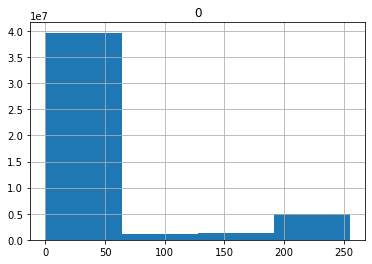

In [70]:
pd.DataFrame(x_train.reshape(60000*28*28,-1)).hist(bins=4)

### Распределение целевой переменной;

array([[<AxesSubplot:title={'center':'0'}>]], dtype=object)

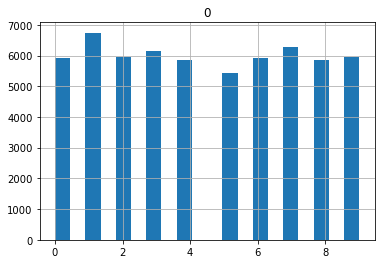

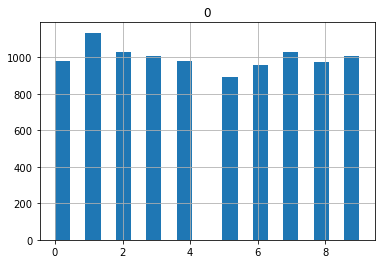

In [24]:
pd.DataFrame(y_train).hist(bins=20)
pd.DataFrame(y_test).hist(bins=20)

 Видим легкую несбалансированность между классами.

# Отдельные экземпляры выборки в виде изображений;

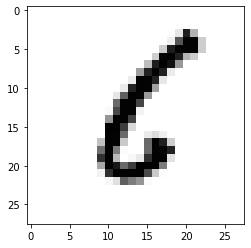

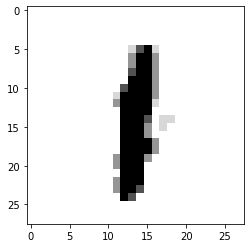

In [67]:
for i in range(2):
    t = np.random.randint(0, 60000)
    img = x_train[t,].reshape( 28,28 )
    plt.imshow(img, cmap="Greys")
    plt.show()

# Эволюция перектрестной энтропии по ходу обучения;

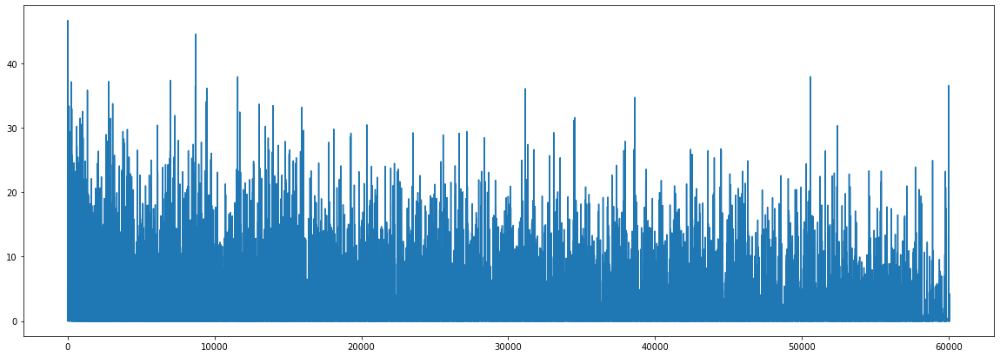

In [21]:
plt.figure(figsize=(20,7))
plt.plot(loss_history)

# Эволюция точности по ходу обучения (Абсолютная шкала)

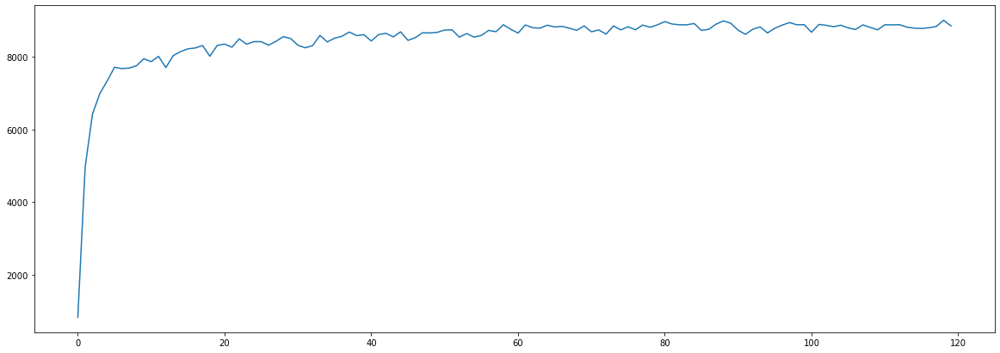

In [84]:
plt.figure(figsize=(20,7))
plt.plot(accuracy_history)

In [85]:
print('Максимальная точность в процентах:', max(accuracy_history)/10000)

Максимальная точность в процентах: 0.9017


# Выводы

### Вывод о достаточности или избыточности данных для оценки параметров модели
Можно с уверенностью сказать, что размера датасета хватает для получения хорошей точности классификации изображений.

### Вывод о соотношении выразительности модели и ее обобщающей способности (наблюдаются ли явления переобучения или недообучения).
Видим, что точность модели достаточно высокая, но не максимальная, переобученность достаточно низкая, об этом нам говорит тестирование на тренировочной выборке. 

Недообученность есть в силу не идеально подобранных параметров, таких как learning rate, числа нейронов в слоях, конфигурации функций активаций, отсутсвия бач-нормализации и тп. 

In [2]:
sigma2 = 25
B = 0.95

z_a = 1.96 #по таблице нормального распределения

#n = sigma2 * pow(z_a / acc, 2)
#минимально необходимый объем выборки

N = ((sigma2*z)/acc)**2
N

0.050000000000000044 0.975


66.015625